# Extraction time analysis (new mixcr)

i want to analyze repertoire propetries, and see if they corrolate to extraction time.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import seaborn as sns
import networkx as nx
import pickle

In [ ]:
import os
import pandas as pd
from pathlib import Path

# --- Inputs (keep your originals) ---
mixcr_dir = "/dsi/sbm/OrrBavly/colon_data/new_mixcr/TRB/"
meta_file = "/home/dsi/orrbavly/GNN_project/data/colon_meta_time.csv"
colon_meta_file = "/home/dsi/orrbavly/GNN_project/data/metadata/colon_meta.csv"
time_threshold = 750

# --- Load metadata for extraction time ---
meta_df = pd.read_csv(meta_file)
meta_df = meta_df[["Sample_ID", "extraction_time"]]

# --- Load all MiXCR clonotype files ---
mixcr_cols = [
    "aaSeqCDR3", "nSeqCDR3", "readCount", "readFraction",
    "allVHitsWithScore", "allDHitsWithScore", "allJHitsWithScore"
]

clonotype_dfs = []
for fname in os.listdir(mixcr_dir):
    if fname.endswith(".tsv"):
        fp = os.path.join(mixcr_dir, fname)
        if not os.path.isfile(fp):
            continue
        sample_prefix = fname.split("_")[0]
        df = pd.read_csv(fp, sep="\t", usecols=lambda c: c in mixcr_cols)
        df["Sample_ID"] = sample_prefix
        clonotype_dfs.append(df)

if not clonotype_dfs:
    raise RuntimeError("No .tsv files found in mixcr_dir. Check the path/pattern.")

clonotype_df = pd.concat(clonotype_dfs, ignore_index=True)

# Keep only protein CDR3 (your example is aa-based); drop empty CDR3s
clonotype_df = clonotype_df.dropna(subset=["aaSeqCDR3"])
clonotype_df = clonotype_df[clonotype_df["aaSeqCDR3"].str.len() > 0].copy()

# Merge extraction time and classify fast/slow
clonotype_df = clonotype_df.merge(meta_df, on="Sample_ID", how="inner")
clonotype_df["extraction_time"] = pd.to_numeric(clonotype_df["extraction_time"], errors="coerce")

bad_rows = clonotype_df["extraction_time"].isna()
bad_sample_ids = clonotype_df.loc[bad_rows, "Sample_ID"].unique().tolist()
if bad_sample_ids:
    print("Excluding samples with missing/invalid extraction_time:", bad_sample_ids)

clonotype_df = clonotype_df.loc[~bad_rows].copy()
clonotype_df["group"] = clonotype_df["extraction_time"].apply(
    lambda x: "fast" if x <= time_threshold else "slow"
)

print(f"Unique Sample_IDs after time merge/filter: {clonotype_df['Sample_ID'].nunique()}")

# --- Pull T/N/M from colon_meta ---
colon_meta = pd.read_csv(colon_meta_file)

# Expect columns: sample_id, T, N, M
required_cols = {"sample_id", "T", "N", "M"}
missing = required_cols - set(colon_meta.columns)
if missing:
    raise KeyError(f"colon_meta is missing expected columns: {missing}")

tnm = colon_meta.loc[:, ["sample_id", "T", "N", "M"]].drop_duplicates()
tnm = tnm.rename(columns={"sample_id": "Sample_ID"})

# Merge T/N/M onto clonotype records (one row per clonotype per read)
clonotype_df = clonotype_df.merge(tnm, on="Sample_ID", how="left")

# Fill any missing TNM with 'NA' so the label is explicit
for c in ["T", "N", "M"]:
    if c in clonotype_df:
        clonotype_df[c] = clonotype_df[c].astype(str).fillna("NA").replace({"nan": "NA"})

# --- Build the desired column label ---
# Format: SampleID_{fast|slow}_{T}_{M}_{N}
clonotype_df["sample_label"] = (
    clonotype_df["Sample_ID"].astype(str)
    + "_"
    + clonotype_df["group"].astype(str)
    + "_"
    + clonotype_df["T"].astype(str)
    + "_"
    + clonotype_df["M"].astype(str)
    + "_"
    + clonotype_df["N"].astype(str)
)

# --- Aggregate counts per (aaSeqCDR3, sample_label) ---
agg = (clonotype_df
       .groupby(["aaSeqCDR3", "sample_label"], as_index=False)["readCount"]
       .sum())

# --- Filter TCRs that appear in >=2 samples *before* pivoting ---
tcr_in_samples = agg.groupby("aaSeqCDR3")["sample_label"].nunique()
keep_tcr = tcr_in_samples.index[tcr_in_samples >= 2]
agg2 = agg[agg["aaSeqCDR3"].isin(keep_tcr)].copy()

# --- Pivot to TCR x sample (values = readCount) ---
mat_2plus = (agg2
             .pivot_table(
                 index="aaSeqCDR3",
                 columns="sample_label",
                 values="readCount",
                 aggfunc="sum",
                 fill_value=0
             ))

# Make values integer
mat_2plus = mat_2plus.astype(int)

# --- Optional: sort rows by prevalence (desc), then columns alphabetically ---
row_order = (tcr_in_samples.loc[mat_2plus.index]
             .sort_values(ascending=False)
             .index)
mat_2plus = mat_2plus.loc[row_order]              # <-- use loc, not iloc
mat_2plus = mat_2plus.reindex(sorted(mat_2plus.columns), axis=1)

# --- Write to CSV ---
mat_2plus.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/tables/tcr_by_sample_counts_aaSeqCDR3_readCount_min2samples.csv")

print(f"TCRs in >=2 samples: {mat_2plus.shape[0]:,}")
print(f"Samples (columns): {mat_2plus.shape[1]:,}")


Excluding samples with missing/invalid extraction_time: ['P4-S1']
Unique Sample_IDs after time merge/filter: 211


NameError: name 'out_path' is not defined

In [8]:
mat_2plus

sample_label,P1-S10_fast_NA_NA_NA,P1-S11_fast_T2_Mx_0,P1-S12_fast_T3_Mx_0,P1-S13_fast_T3_0_0,P1-S14_fast_NA_NA_NA,P1-S15_fast_NA_NA_NA,P1-S16_fast_T4_0_1,P1-S17_fast_NA_NA_NA,P1-S18_fast_T3_0_2,P1-S19_fast_T3_Mx_0,...,P9-S23_fast_T1_X_0,P9-S24_slow_T3_NA_NA,P9-S2_fast_T4_0_1,P9-S3_fast_T1_0_0,P9-S4_fast_T2_0_1,P9-S5_fast_T3_0_1,P9-S6_fast_-1_X_-1,P9-S7_fast_T2_X_0,P9-S8_fast_T3_Mx_1,P9-S9_fast_NA_NA_NA
aaSeqCDR3,,,,,,,,,,,,,,,,,,,,,
CASSLGETQYF,232,97,187,0,89,224,117,26,123,193,...,118,122,97,194,280,351,473,22,268,387
CASSFQETQYF,234,168,85,43,35,93,53,62,19,55,...,24,27,25,47,121,87,448,10,237,322
CASSLEETQYF,153,360,75,16,39,67,51,0,79,179,...,160,122,41,35,92,48,70,21,234,66
CASSSSYEQYF,26,79,45,8,49,132,47,0,10,82,...,54,40,13,0,63,17,49,25,0,10
CASSLQETQYF,186,52,114,6,26,188,19,93,110,225,...,53,66,52,65,211,11,59,53,445,55
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RASSR*_QPQHF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
RASSRR*_NNEQFF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
RASSRTG_NQPQHF,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


from a total of 217 colon samples, there should be 211 present.

missing fastq files:
P2-S8(only 1 L004)
P2-S9(only 1 L003)
P2-S19(only 1 L002)
P8-S18(only 1 L001)

files without colon_meta_times entry:
P9-25

files with missing "extraction_time" column value in colon_meta_times:
P4-S1

In [2]:
import os
import pandas as pd

# --- File paths ---
mixcr_dir = "/dsi/efroni-lab/sbm/OrrBavly/colon_data/new_mixcr/TRB/"
meta_file = "/home/dsi/orrbavly/GNN_project/data/colon_meta_time.csv"

time_threshold = 750

# --- Load metadata ---
meta_df = pd.read_csv(meta_file)
meta_df = meta_df[["Sample_ID", "extraction_time"]]

# --- Load all mixcr files ---
# Columns to keep from MiXCR files
mixcr_cols = [
    "aaSeqCDR3", "nSeqCDR3", "readCount", 'readFraction',
    "allVHitsWithScore", "allDHitsWithScore", "allJHitsWithScore"
]

clonotype_dfs = []

for fname in os.listdir(mixcr_dir):
    if fname.endswith(".tsv") and os.path.isfile(os.path.join(mixcr_dir, fname)):
        sample_prefix = fname.split("_")[0]
        file_path = os.path.join(mixcr_dir, fname)
        
        df = pd.read_csv(file_path, sep="\t", usecols=mixcr_cols)
        df["Sample_ID"] = sample_prefix
        clonotype_dfs.append(df)

# Merge all clonotype data
clonotype_df = pd.concat(clonotype_dfs, ignore_index=True)

# Merge with metadata to get extraction time
clonotype_df = clonotype_df.merge(meta_df, on="Sample_ID", how="inner")

# Ensure extraction_time is numeric (non-numeric become NaN)
clonotype_df['extraction_time'] = pd.to_numeric(clonotype_df['extraction_time'], errors='coerce')

# Identify rows with missing or non-numeric extraction_time
bad_rows = clonotype_df['extraction_time'].isnull()
bad_sample_ids = clonotype_df.loc[bad_rows, 'Sample_ID'].unique()
if len(bad_sample_ids) > 0:
    print("Excluding samples with missing or invalid extraction_time:")
    print(bad_sample_ids.tolist())

# Exclude those rows
clonotype_df = clonotype_df.loc[~bad_rows].copy()

# Now assign the group
clonotype_df["group"] = clonotype_df["extraction_time"].apply(
    lambda x: "fast" if x <= time_threshold else "slow")

print(f"Number of unique Sample_IDs in clonotype_df: {clonotype_df['Sample_ID'].nunique()}")

# # Create 'group' column: fast vs slow
# clonotype_df["group"] = clonotype_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")


Excluding samples with missing or invalid extraction_time:
['P4-S1']
Number of unique Sample_IDs in clonotype_df: 211


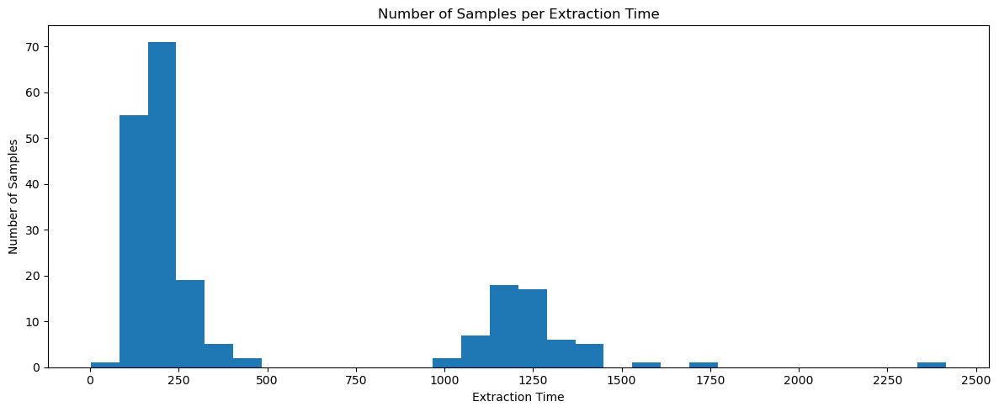

In [100]:
# Ensure we're only using unique samples
unique_samples = clonotype_df.drop_duplicates('Sample_ID')[['Sample_ID', 'extraction_time']]

plt.figure(figsize=(12, 5))
plt.hist(unique_samples['extraction_time'], bins=30)  # Adjust bins as needed!
plt.xlabel('Extraction Time')
plt.ylabel('Number of Samples')
plt.title('Number of Samples per Extraction Time')
max_time = unique_samples['extraction_time'].max()
plt.xticks(np.arange(0, max_time + 250, 250))
plt.tight_layout()
plt.show()

/tmp/ipykernel_106559/2220503806.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dedup_df['N_grouped'] = dedup_df['N'].apply(group_N)


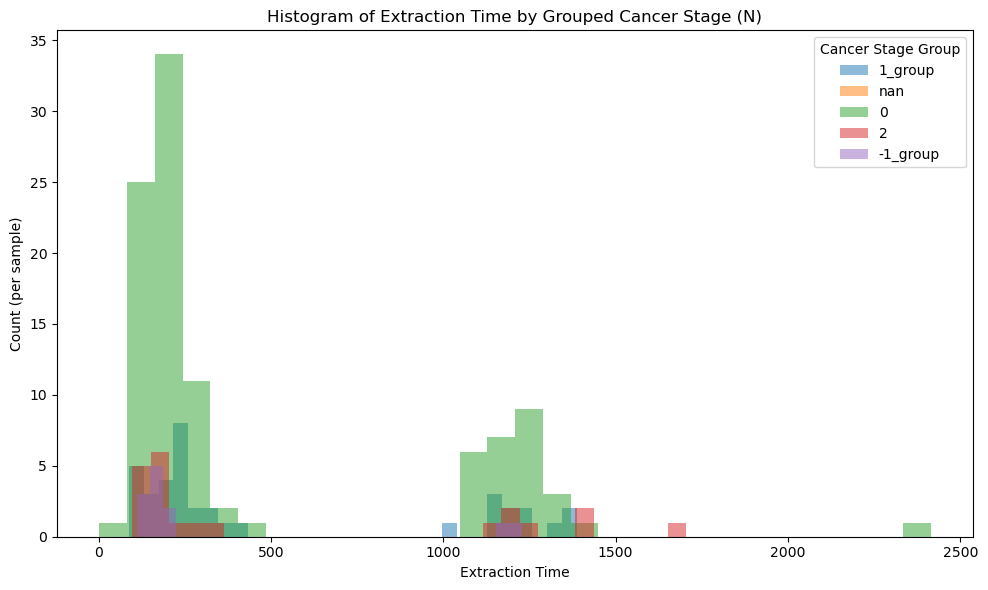

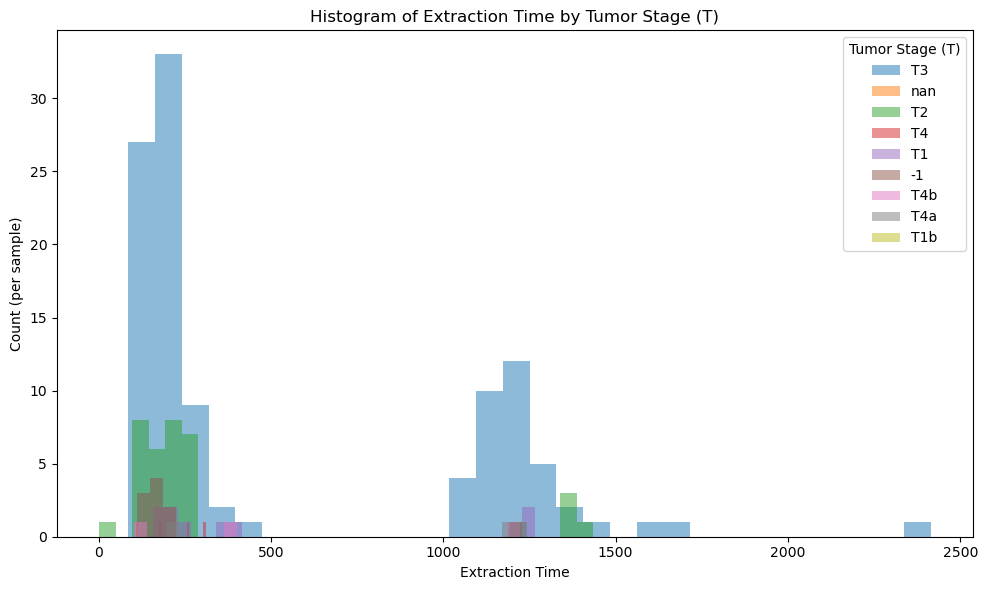

In [3]:
colon_meta = pd.read_csv("/home/dsi/orrbavly/GNN_project/data/metadata/colon_meta.csv")
# Merge as before
merged_df = pd.merge(
    colon_meta,
    clonotype_df,
    how='left',
    left_on='sample_id',
    right_on='Sample_ID'
)

# Keep only one row per sample (based on 'sample_id' or 'Sample_ID')
dedup_df = merged_df.drop_duplicates(subset=['sample_id'])

# Map N to grouped categories
def group_N(n):
    if n in ['1a', '1b', '1']:
        return '1_group'
    elif n in ['-1', '-2']:
        return '-1_group'
    else:
        return n

dedup_df['N_grouped'] = dedup_df['N'].apply(group_N)

# Plot histogram per group
plt.figure(figsize=(10,6))
for n_value in dedup_df['N_grouped'].unique():
    subset = dedup_df[dedup_df['N_grouped'] == n_value]
    plt.hist(subset['extraction_time'], bins=30, alpha=0.5, label=str(n_value))

plt.xlabel('Extraction Time')
plt.ylabel('Count (per sample)')
plt.title('Histogram of Extraction Time by Grouped Cancer Stage (N)')
plt.legend(title='Cancer Stage Group')
plt.tight_layout()
plt.show()

# Plot histogram: extraction_time by T stage
plt.figure(figsize=(10,6))
for t_value in dedup_df['T'].unique():
    subset = dedup_df[dedup_df['T'] == t_value]
    plt.hist(subset['extraction_time'], bins=30, alpha=0.5, label=str(t_value))

plt.xlabel('Extraction Time')
plt.ylabel('Count (per sample)')
plt.title('Histogram of Extraction Time by Tumor Stage (T)')
plt.legend(title='Tumor Stage (T)')
plt.tight_layout()
plt.show()

In [4]:
dedup_df.head()

,Unnamed: 0,filename,sum value,T,N,M,sample_id,readCount,readFraction,allVHitsWithScore,allDHitsWithScore,allJHitsWithScore,nSeqCDR3,aaSeqCDR3,Sample_ID,extraction_time,group,N_grouped
0,0,pool1_S1_TRB_mig_cdr3_clones_all,33296,T3,1b,Mx,P1-S1,24015.0,0.014055,TRBV6-5*00(1527.8),NaN,TRBJ2-7*00(466.5),TGTGCCAGCAGGGAGAATCTCTCCTACGAGCAGTACTTC,CASRENLSYEQYF,P1-S1,425.0,fast,1_group
11565,1,pool1_S10_TRB_mig_cdr3_clones_all,256848,NaN,NaN,NaN,P1-S10,18577.0,0.009716,TRBV7-8*00(1493.5),TRBD2*00(70),TRBJ2-3*00(497.2),TGTGCCAGCAGCACGAATCCGGGACTAGCGGGTAGCACAGATACGC...,CASSTNPGLAGSTDTQYF,P1-S10,156.0,fast,NaN
190478,2,pool1_S11_TRB_mig_cdr3_clones_all,78560,T2,0,Mx,P1-S11,28187.0,0.035539,TRBV10-3*00(1768),"TRBD2*00(31),TRBD1*00(30)",TRBJ2-5*00(446.4),TGTGCCATCAGTGAGTCGATCGCGGCAGGGGAAGAGACCCAGTACTTC,CAISESIAAGEETQYF,P1-S11,2.0,fast,0
223493,3,pool1_S12_TRB_mig_cdr3_clones_all,190517,T3,0,Mx,P1-S12,50803.0,0.032005,TRBV29-1*00(1750.5),"TRBD2*00(27),TRBD1*00(25)",TRBJ2-3*00(427.3),TGCAGCGTGGGGGGGGACCTGGATACGCAGTATTTT,CSVGGDLDTQYF,P1-S12,137.0,fast,0
330614,4,pool1_S13_TRB_mig_cdr3_clones_all,72593,T3,0,0,P1-S13,134627.0,0.243268,TRBV15*00(1751.9),TRBD1*00(25),TRBJ2-5*00(436.8),TGTGCCACCAGCTCATACGGGGGAGAGACCCAGTACTTC,CATSSYGGETQYF,P1-S13,196.0,fast,0


In [3]:
# --- Group into fast vs slow ---
# median_time = clonotype_df["extraction_time"].median()
fast_group = clonotype_df[clonotype_df["extraction_time"] <= time_threshold]
slow_group = clonotype_df[clonotype_df["extraction_time"] > time_threshold]

# --- Get unique clonotypes in each group ---
fast_clonotypes = set(fast_group["aaSeqCDR3"].unique())
slow_clonotypes = set(slow_group["aaSeqCDR3"].unique())

# --- Clonotypes that disappeared in the slow group ---
disappeared_clonotypes = fast_clonotypes - slow_clonotypes

# --- Analyze how "public" they were in the fast group ---
public_stats = (
    fast_group[fast_group["aaSeqCDR3"].isin(disappeared_clonotypes)]
    .groupby("aaSeqCDR3")["readCount"]
    .agg(["sum", "mean", "count"])
    .rename(columns={"sum": "total_reads", "mean": "avg_reads", "count": "num_samples"})
    .sort_values("total_reads", ascending=False)
)

# --- Output summary ---
print(f"Total clones in fast group: {fast_group.shape[0]}")
print(f"Total clones in slow group: {slow_group.shape[0]}")
print(f"Total clonotypes in fast group: {len(fast_clonotypes)}")
print(f"Total clonotypes in slow group: {len(slow_clonotypes)}")
print(f"Clonotypes that disappeared in slow group: {len(disappeared_clonotypes)}")
print(public_stats.head(10))


Total clones in fast group: 12982717
Total clones in slow group: 2229779
Total clonotypes in fast group: 8991978
Total clonotypes in slow group: 1852705
Clonotypes that disappeared in slow group: 8469359
                    total_reads      avg_reads  num_samples
aaSeqCDR3                                                  
CASSSVGSGRIVTNEQFF     906275.0  226568.750000            4
CASSPLAGAADEQFF        847424.0  141237.333333            6
CASSLAYWGGEQETQYF      715096.0  238365.333333            3
CASSQGAGARGAYNEQFF     598550.0  299275.000000            2
CASSASEFTGDIQYF        558397.0  279198.500000            2
CASSLGQQGDEQFF         459736.0  114934.000000            4
CASSQDRTGPRYF          437574.0  218787.000000            2
CASSADRLGYAMAQYF       389754.0   55679.142857            7
CASSDKTGERADTQYF       376723.0  188361.500000            2
CASSLGGFVTSGPYEQYF     373313.0  186656.500000            2


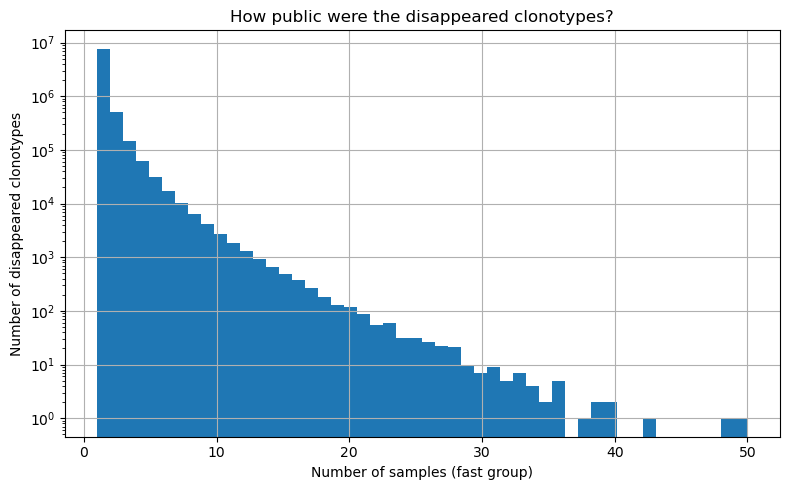

In [102]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
public_stats["num_samples"].plot.hist(bins=50, log=True)
plt.xlabel("Number of samples (fast group)")
plt.ylabel("Number of disappeared clonotypes")
plt.title("How public were the disappeared clonotypes?")
plt.grid(True)
plt.tight_layout()
plt.show()


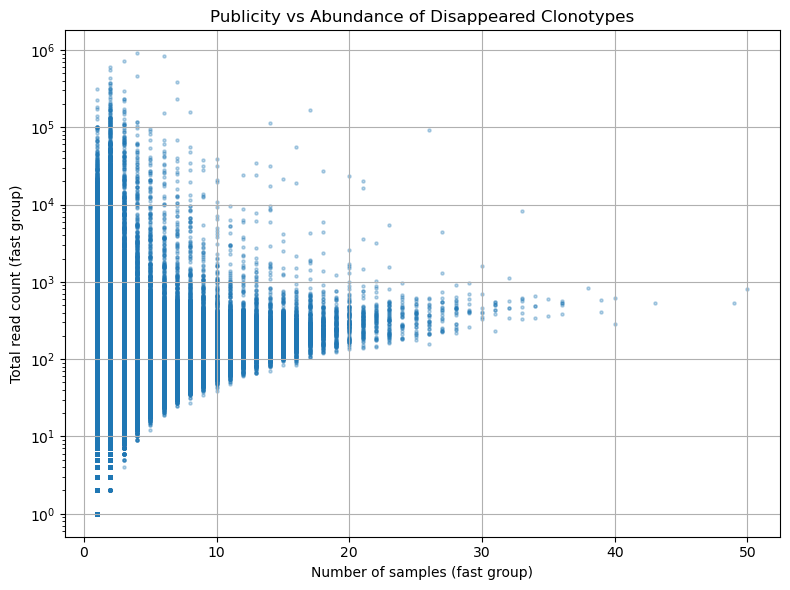

In [103]:
plt.figure(figsize=(8, 6))
plt.scatter(
    public_stats["num_samples"], 
    public_stats["total_reads"], 
    alpha=0.3, s=5
)
plt.xlabel("Number of samples (fast group)")
plt.ylabel("Total read count (fast group)")
plt.title("Publicity vs Abundance of Disappeared Clonotypes")
plt.xscale("linear")
plt.yscale("log")  # often helpful due to long tail
plt.grid(True)
plt.tight_layout()
plt.show()


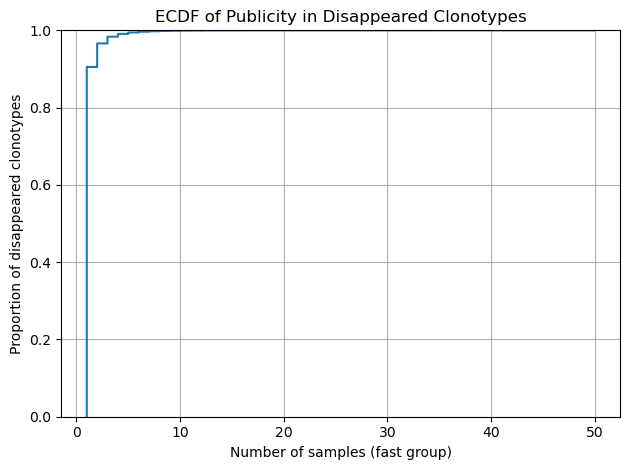

In [104]:
sns.ecdfplot(public_stats["num_samples"])
plt.xlabel("Number of samples (fast group)")
plt.ylabel("Proportion of disappeared clonotypes")
plt.title("ECDF of Publicity in Disappeared Clonotypes")
plt.grid(True)
plt.tight_layout()
plt.show()

In [4]:
num_fast_samples = fast_group["Sample_ID"].nunique()
num_slow_samples = slow_group["Sample_ID"].nunique()

print(f"Number of samples in fast group: {num_fast_samples}")
print(f"Number of samples in slow group: {num_slow_samples}")

# --- Count clonotypes per sample ---
fast_clonotypes_per_sample = (
    fast_group.groupby("Sample_ID")["aaSeqCDR3"].nunique()
)
slow_clonotypes_per_sample = (
    slow_group.groupby("Sample_ID")["aaSeqCDR3"].nunique()
)

# --- Stats ---
avg_fast = fast_clonotypes_per_sample.mean()
med_fast = fast_clonotypes_per_sample.median()

avg_slow = slow_clonotypes_per_sample.mean()
med_slow = slow_clonotypes_per_sample.median()

# --- Print results ---
num_fast_samples = fast_group["Sample_ID"].nunique()
num_slow_samples = slow_group["Sample_ID"].nunique()

print(f"Number of samples in fast group: {num_fast_samples}")
print(f"Average clonotypes per fast sample: {avg_fast:.1f}")
print(f"Median clonotypes per fast sample: {med_fast:.1f}\n")

print(f"Number of samples in slow group: {num_slow_samples}")
print(f"Average clonotypes per slow sample: {avg_slow:.1f}")
print(f"Median clonotypes per slow sample: {med_slow:.1f}")


Number of samples in fast group: 153
Number of samples in slow group: 58


Number of samples in fast group: 153
Average clonotypes per fast sample: 82060.1
Median clonotypes per fast sample: 75004.0

Number of samples in slow group: 58
Average clonotypes per slow sample: 37566.7
Median clonotypes per slow sample: 32296.5


In [106]:
clone_stats_df = pd.DataFrame({
    "Group": ["Fast", "Slow"],
    "Num Samples": [num_fast_samples, num_slow_samples],
    "Avg Clonotypes/Sample": [avg_fast, avg_slow],
    "Median Clonotypes/Sample": [med_fast, med_slow]
})

print(clone_stats_df.to_string(index=False, float_format='%.1f'))

Group  Num Samples  Avg Clonotypes/Sample  Median Clonotypes/Sample
 Fast          153                82060.1                   75004.0
 Slow           58                37566.7                   32296.5


Rows with issues:
Empty DataFrame
Columns: [Sample_ID, total_reads, unique_clonotypes, extraction_time, group]
Index: []

Extraction Time vs. Number of Clonotypes
Pearson r = -0.441 (p = 1.92e-11)
Spearman r = -0.349 (p = 2e-07)


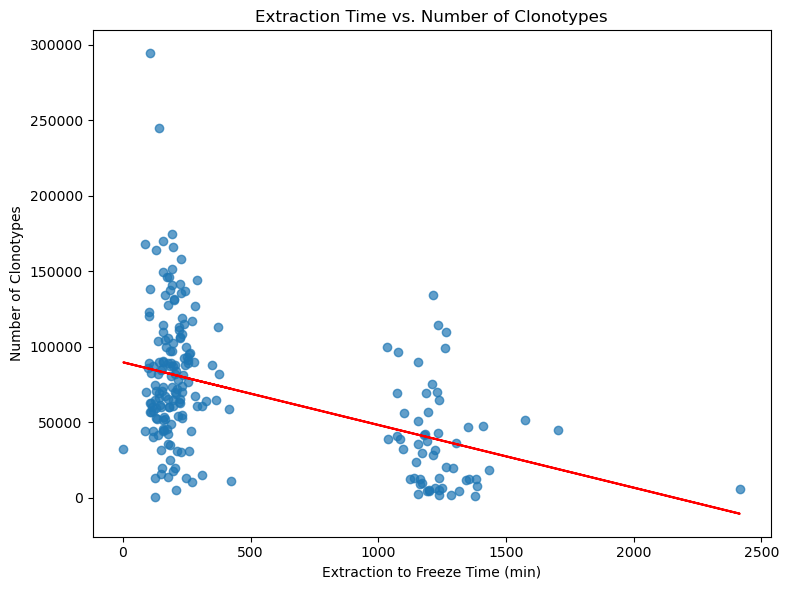


Extraction Time vs. Total Read Count
Pearson r = -0.417 (p = 2.87e-10)
Spearman r = -0.330 (p = 9.36e-07)


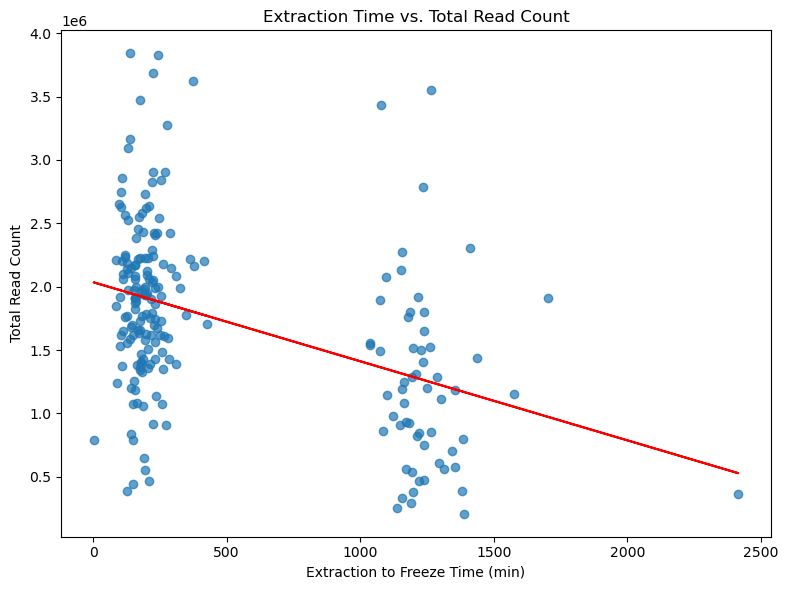

In [107]:
from scipy.stats import spearmanr, pearsonr

# Aggregate per-sample statistics
sample_stats = (
    clonotype_df.groupby('Sample_ID')
    .agg(
        total_reads=('readCount', 'sum'),
        unique_clonotypes=('aaSeqCDR3', 'nunique'),
        extraction_time=('extraction_time', 'first'),
        group=('group', 'first')
    )
    .reset_index()
)

# Replace inf with NaN for safety
sample_stats = sample_stats.replace([np.inf, -np.inf], np.nan)

# Print and check for rows with any missing values
bad_rows = sample_stats[["extraction_time", "unique_clonotypes", "total_reads"]].isna()
print("Rows with issues:")
print(sample_stats[bad_rows.any(axis=1)])

# Drop rows with NaN in any relevant column
sample_stats_clean = sample_stats.dropna(subset=["extraction_time", "unique_clonotypes", "total_reads"])

# Now run correlation and plotting
def plot_and_correlate(df, x, y, xlabel, ylabel, title):
    plt.figure(figsize=(8, 6))
    plt.scatter(df[x], df[y], alpha=0.7)
    # Optionally fit and plot a regression line
    m, b = np.polyfit(df[x], df[y], 1)
    plt.plot(df[x], m*df[x] + b, color='red')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

    # Pearson & Spearman
    pearson_r, pearson_p = pearsonr(df[x], df[y])
    spearman_r, spearman_p = spearmanr(df[x], df[y])

    print(f"\n{title}")
    print(f"Pearson r = {pearson_r:.3f} (p = {pearson_p:.3g})")
    print(f"Spearman r = {spearman_r:.3f} (p = {spearman_p:.3g})")

    plt.tight_layout()
    plt.show()

plot_and_correlate(sample_stats_clean, "extraction_time", "unique_clonotypes",
                   "Extraction to Freeze Time (min)", "Number of Clonotypes",
                   "Extraction Time vs. Number of Clonotypes")

plot_and_correlate(sample_stats_clean, "extraction_time", "total_reads",
                   "Extraction to Freeze Time (min)", "Total Read Count",
                   "Extraction Time vs. Total Read Count")


Extraction Time vs. Normalized Clonotype Richness
Pearson r = -0.308 (p = 5.05e-06)
Spearman r = -0.243 (p = 0.000362)


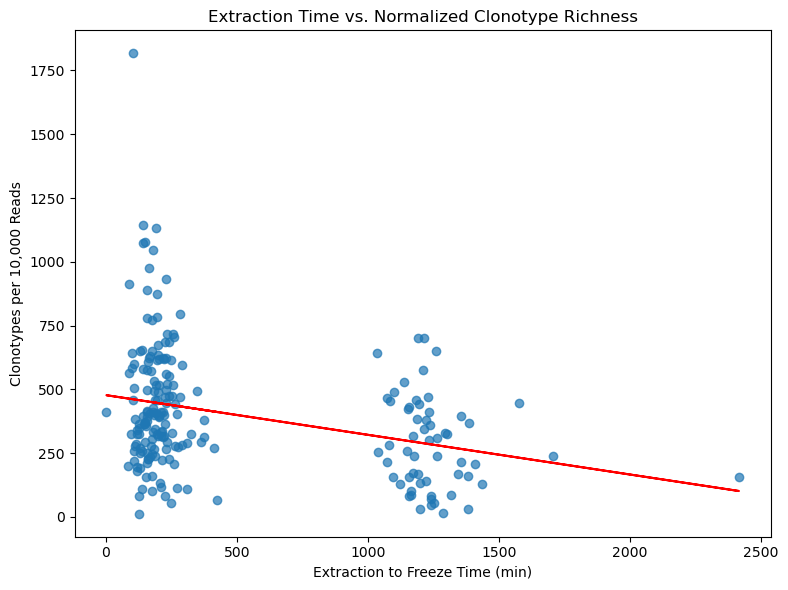

In [108]:
sample_stats_clean = sample_stats_clean.copy()
sample_stats_clean['clonotypes_per_10k_reads'] = (
    sample_stats_clean['unique_clonotypes'] / sample_stats_clean['total_reads'] * 10000
)
# Drop possible NaNs/Infs in the new column (e.g. if total_reads==0)
sample_stats_clean = sample_stats_clean.replace([np.inf, -np.inf], np.nan)
sample_stats_clean = sample_stats_clean.dropna(subset=['clonotypes_per_10k_reads'])

# Plot and correlate normalized clonotype richness vs extraction time
plot_and_correlate(
    sample_stats_clean,
    "extraction_time",
    "clonotypes_per_10k_reads",
    "Extraction to Freeze Time (min)",
    "Clonotypes per 10,000 Reads",
    "Extraction Time vs. Normalized Clonotype Richness"
)


In [8]:
# --- Presence matrix: clonotype vs sample ---
fast_presence = (
    fast_group.groupby(["aaSeqCDR3", "Sample_ID"])
    .size()
    .unstack(fill_value=0)
    .astype(bool)
)

slow_presence = (
    slow_group.groupby(["aaSeqCDR3", "Sample_ID"])
    .size()
    .unstack(fill_value=0)
    .astype(bool)
)

# --- Count in how many samples each clonotype appears ---
fast_counts = fast_presence.sum(axis=1)
slow_counts = slow_presence.sum(axis=1)

# --- Merge into a DataFrame for comparison ---
clonotype_presence_comparison = pd.DataFrame({
    "samples_in_fast": fast_counts,
    "samples_in_slow": slow_counts.reindex(fast_counts.index).fillna(0)
})

# --- Filter clonotypes that are public in fast but missing in slow ---
consistently_disappeared = clonotype_presence_comparison[
    (clonotype_presence_comparison["samples_in_fast"] >= 3) &  # adjustable threshold
    (clonotype_presence_comparison["samples_in_slow"] == 0)
]

print(f"Clonotypes consistently missing in slow group: {len(consistently_disappeared)}")
print(consistently_disappeared.sort_values("samples_in_fast", ascending=False).head(10))


Clonotypes consistently missing in slow group: 277870
                samples_in_fast  samples_in_slow
aaSeqCDR3                                       
CASSLGAGTEAFF                44              0.0
CASSLGGGVYEQYF               41              0.0
CASSTRDTQYF                  36              0.0
CASSSGNYEQYF                 35              0.0
CASSKGETQYF                  33              0.0
CASSLGTSYGYTF                33              0.0
CASSLGPGNYGYTF               33              0.0
CASSLGLHNEQFF                32              0.0
CASSLTLTDTQYF                32              0.0
CASSPGGPGELFF                32              0.0


In [9]:
# Reuse fast_group and filter by disappeared clonotypes
disappeared_reads = (
    fast_group[fast_group["aaSeqCDR3"].isin(consistently_disappeared.index)]
    .groupby("aaSeqCDR3")["readCount"]
    .agg(total_reads="sum", avg_reads="mean")
)

# Merge with `consistently_disappeared`
enriched_disappeared = consistently_disappeared.merge(disappeared_reads, left_index=True, right_index=True)


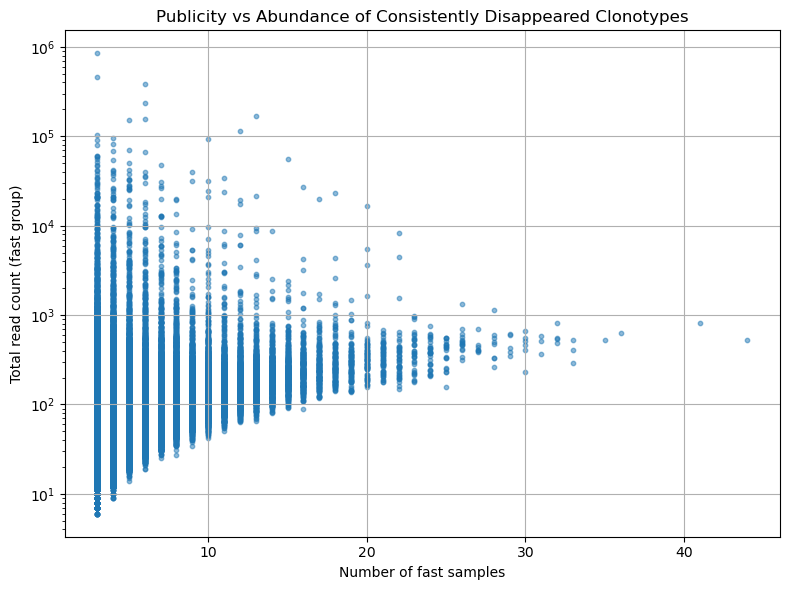

In [10]:
plt.figure(figsize=(8, 6))
plt.scatter(
    enriched_disappeared["samples_in_fast"], 
    enriched_disappeared["total_reads"],
    alpha=0.5, s=10
)
plt.xlabel("Number of fast samples")
plt.ylabel("Total read count (fast group)")
plt.title("Publicity vs Abundance of Consistently Disappeared Clonotypes")
plt.yscale("log")
plt.grid(True)
plt.tight_layout()
plt.show()


## General groups EDA

Lets analyze the groups. 

In [19]:
# Step 1: Subset by group
fast_df = clonotype_df[clonotype_df["group"] == "fast"].copy()
slow_df = clonotype_df[clonotype_df["group"] == "slow"].copy()

we will start by comparing v/j usage across both groups.

In [20]:
# --- Vectorized helper to extract and clean gene names ---
def extract_clean_genes(df, col):
    exploded = df[[col]].dropna().copy()
    exploded[col] = exploded[col].str.split(",")
    exploded = exploded.explode(col)
    exploded[col] = exploded[col].str.split("*").str[0]
    return exploded[col]

# Convert to sorted DataFrames for plotting
def counter_to_df(counter, label):
    df = pd.DataFrame(counter.items(), columns=[label, "count"])
    return df.sort_values("count", ascending=False)

def plot_gene_usage(df, gene_type, color, group_label, top_n=100):
    plt.figure(figsize=(10, 5))
    sns.barplot(data=df.head(top_n), x=gene_type, y="count", color=color)
    plt.title(f"Top {top_n} {gene_type} Usage in {group_label}")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Count")
    plt.xlabel(f"{gene_type} Name")
    plt.tight_layout()
    plt.show()

def prepare_comparison_df(counts1, counts2, label1, label2, gene_type, top_n=50):
    # All unique gene names
    all_genes = set(counts1.keys()).union(set(counts2.keys()))
    
    # Normalize each counter
    total1 = sum(counts1.values())
    total2 = sum(counts2.values())

    data = []
    for gene in all_genes:
        norm1 = counts1.get(gene, 0) / total1
        norm2 = counts2.get(gene, 0) / total2
        data.append((gene, norm1, norm2))
    
    df = pd.DataFrame(data, columns=[gene_type, label1, label2])
    
    # Keep top N genes based on total usage
    df["combined"] = df[label1] + df[label2]
    df = df.sort_values("combined", ascending=False).head(top_n).drop(columns="combined")
    
    return df.set_index(gene_type)

def plot_comparison(df, gene_type, title="Gene Usage: Fast vs Slow TCRs (Normalized)"):
    ax = df.plot(kind="bar", figsize=(12, 5))
    plt.title(f"{gene_type} {title}")
    plt.ylabel("Proportion of Total")
    plt.xlabel(f"{gene_type} Gene")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


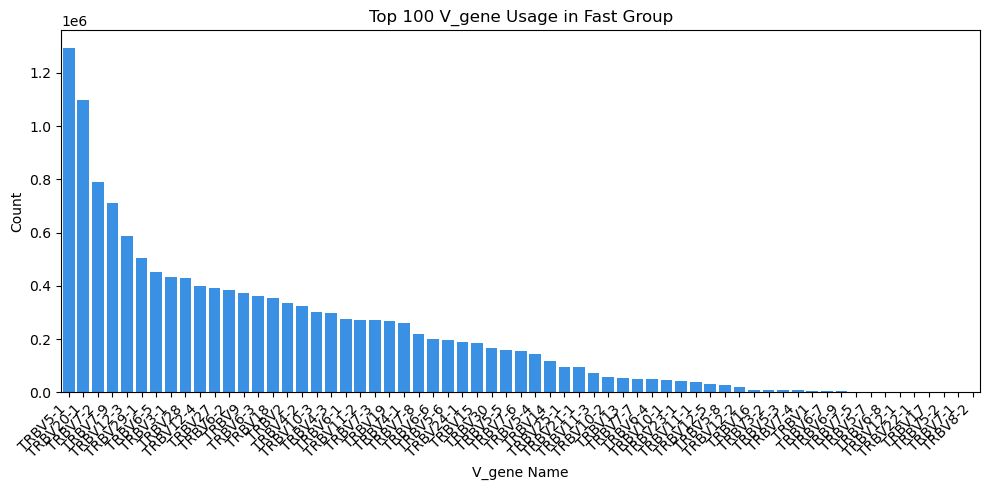

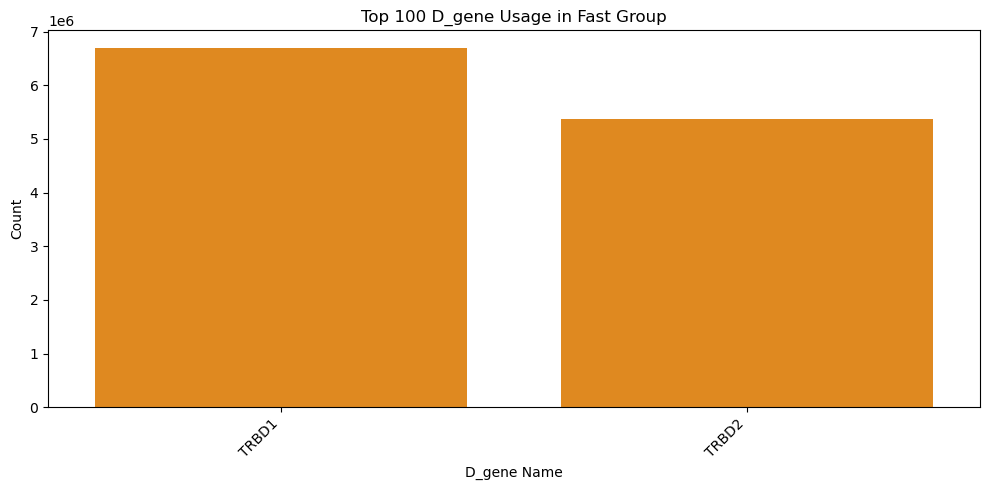

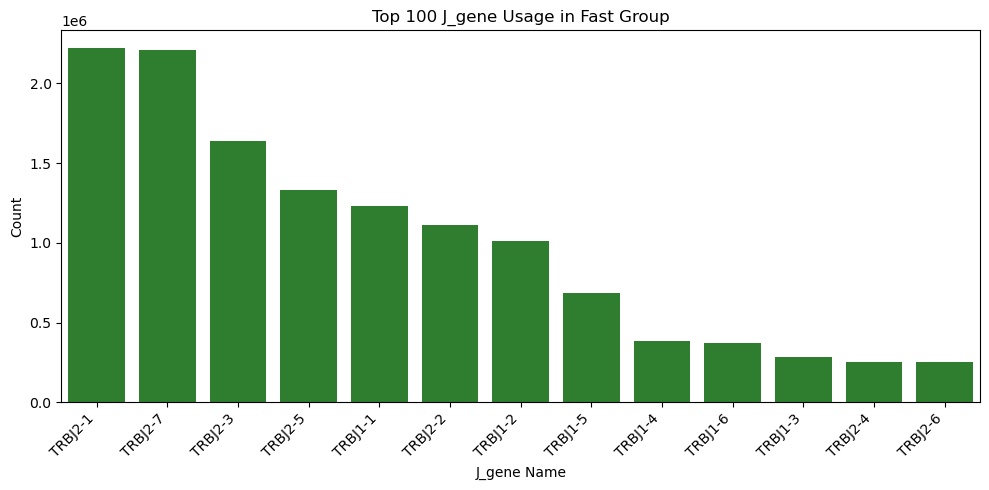

In [21]:
# Extract gene names
fast_v = extract_clean_genes(fast_df, "allVHitsWithScore")
fast_d = extract_clean_genes(fast_df, "allDHitsWithScore")
fast_j = extract_clean_genes(fast_df, "allJHitsWithScore")

# Count
fast_v_counts = fast_v.value_counts().to_dict()
fast_d_counts = fast_d.value_counts().to_dict()
fast_j_counts = fast_j.value_counts().to_dict()

# Convert to DataFrames
fast_v_df = counter_to_df(fast_v_counts, "V_gene")
fast_d_df = counter_to_df(fast_d_counts, "D_gene")
fast_j_df = counter_to_df(fast_j_counts, "J_gene")

# Plot
plot_gene_usage(fast_v_df, "V_gene", "dodgerblue", "Fast Group")
plot_gene_usage(fast_d_df, "D_gene", "darkorange", "Fast Group")
plot_gene_usage(fast_j_df, "J_gene", "forestgreen", "Fast Group")


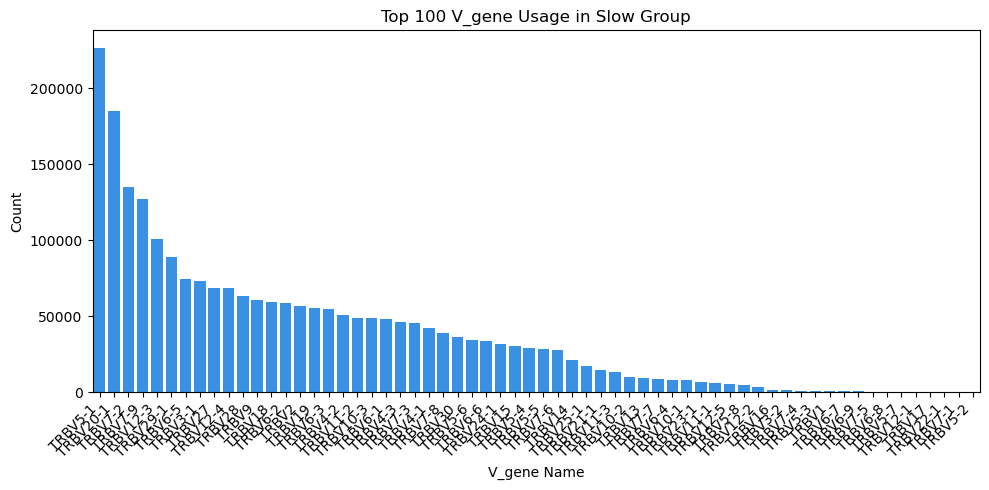

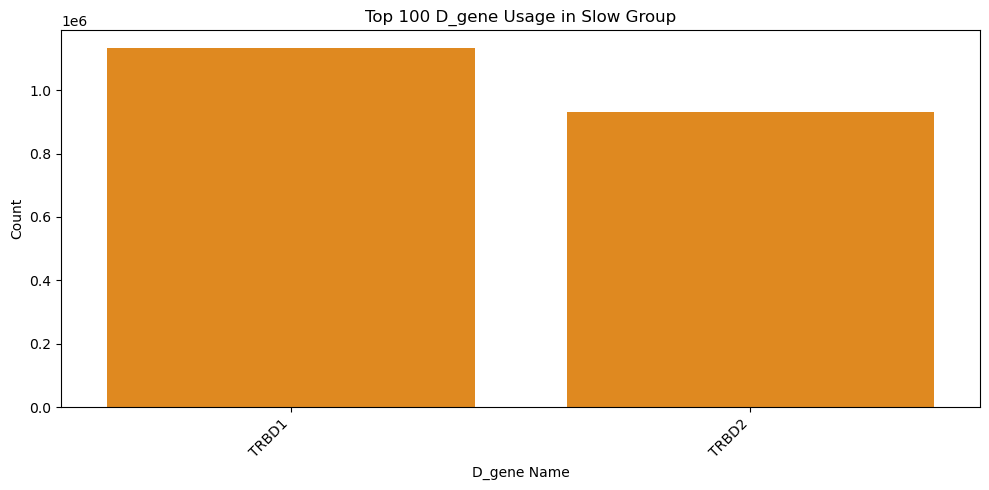

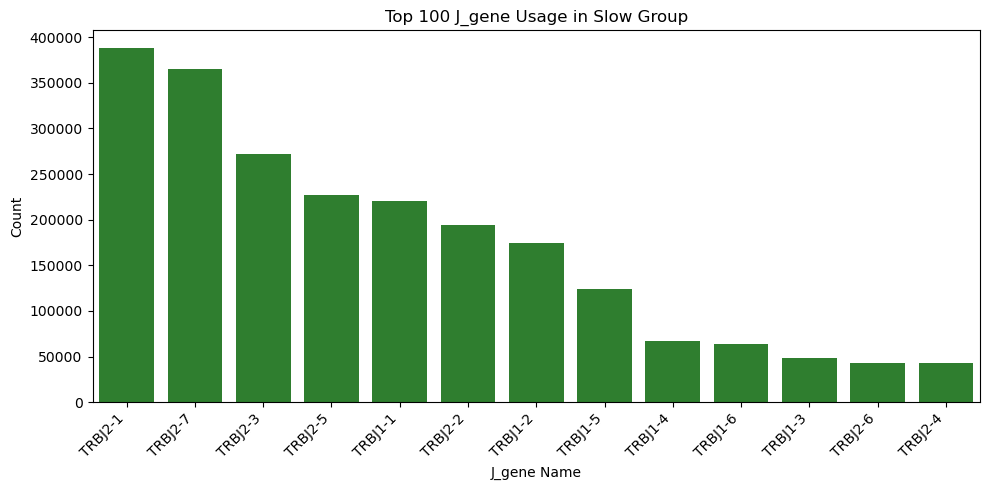

In [22]:
# Extract gene names
slow_v = extract_clean_genes(slow_df, "allVHitsWithScore")
slow_d = extract_clean_genes(slow_df, "allDHitsWithScore")
slow_j = extract_clean_genes(slow_df, "allJHitsWithScore")

# Count
slow_v_counts = slow_v.value_counts().to_dict()
slow_d_counts = slow_d.value_counts().to_dict()
slow_j_counts = slow_j.value_counts().to_dict()

# Convert to DataFrames
slow_v_df = counter_to_df(slow_v_counts, "V_gene")
slow_d_df = counter_to_df(slow_d_counts, "D_gene")
slow_j_df = counter_to_df(slow_j_counts, "J_gene")

# Plot
plot_gene_usage(slow_v_df, "V_gene", "dodgerblue", "Slow Group")
plot_gene_usage(slow_d_df, "D_gene", "darkorange", "Slow Group")
plot_gene_usage(slow_j_df, "J_gene", "forestgreen", "Slow Group")


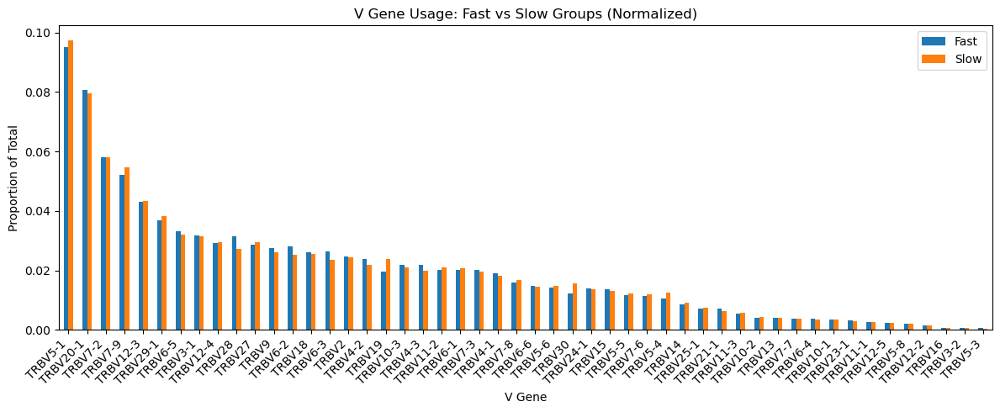

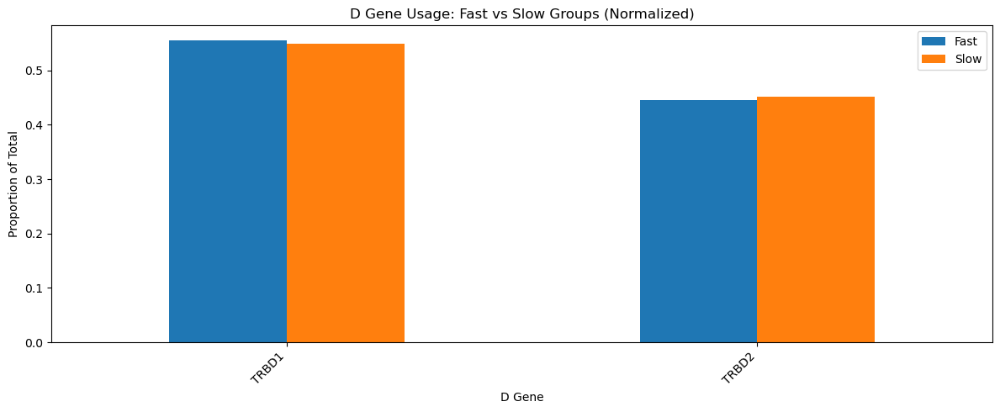

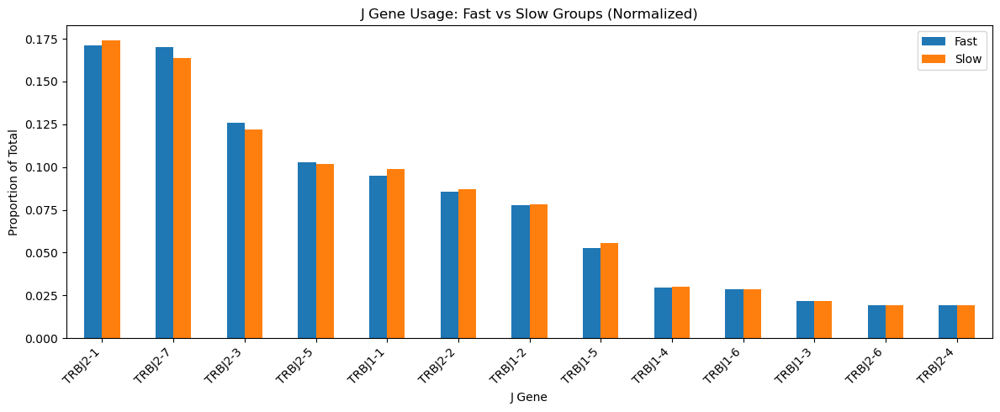

In [23]:
# Prepare comparison DataFrames
v_comp_fastslow = prepare_comparison_df(fast_v_counts, slow_v_counts, "Fast", "Slow", "V_gene")
d_comp_fastslow = prepare_comparison_df(fast_d_counts, slow_d_counts, "Fast", "Slow", "D_gene")
j_comp_fastslow = prepare_comparison_df(fast_j_counts, slow_j_counts, "Fast", "Slow", "J_gene")

# Plot comparisons
plot_comparison(v_comp_fastslow, "V", title="Gene Usage: Fast vs Slow Groups (Normalized)")
plot_comparison(d_comp_fastslow, "D", title="Gene Usage: Fast vs Slow Groups (Normalized)")
plot_comparison(j_comp_fastslow, "J", title="Gene Usage: Fast vs Slow Groups (Normalized)")


Now lets compare Fast only vs Slow only.

In [24]:
# Find unique clonotypes in each group (already in your code)
fast_clonotypes = set(fast_group["aaSeqCDR3"].unique())
slow_clonotypes = set(slow_group["aaSeqCDR3"].unique())

# Clonotypes ONLY in fast or ONLY in slow
fast_only_clonotypes = fast_clonotypes - slow_clonotypes
slow_only_clonotypes = slow_clonotypes - fast_clonotypes

# Subset DataFrames to these unique clonotypes
fast_only_df = fast_group[fast_group["aaSeqCDR3"].isin(fast_only_clonotypes)]
slow_only_df = slow_group[slow_group["aaSeqCDR3"].isin(slow_only_clonotypes)]


# Extract gene names for unique fast/slow clonotypes
fast_v_only = extract_clean_genes(fast_only_df, "allVHitsWithScore")
fast_d_only = extract_clean_genes(fast_only_df, "allDHitsWithScore")
fast_j_only = extract_clean_genes(fast_only_df, "allJHitsWithScore")

slow_v_only = extract_clean_genes(slow_only_df, "allVHitsWithScore")
slow_d_only = extract_clean_genes(slow_only_df, "allDHitsWithScore")
slow_j_only = extract_clean_genes(slow_only_df, "allJHitsWithScore")

# Count
fast_v_counts_only = fast_v_only.value_counts().to_dict()
fast_d_counts_only = fast_d_only.value_counts().to_dict()
fast_j_counts_only = fast_j_only.value_counts().to_dict()

slow_v_counts_only = slow_v_only.value_counts().to_dict()
slow_d_counts_only = slow_d_only.value_counts().to_dict()
slow_j_counts_only = slow_j_only.value_counts().to_dict()

# Prepare comparison DataFrames for unique-only clonotypes
v_comp_only = prepare_comparison_df(fast_v_counts_only, slow_v_counts_only, "Fast Only", "Slow Only", "V_gene")
d_comp_only = prepare_comparison_df(fast_d_counts_only, slow_d_counts_only, "Fast Only", "Slow Only", "D_gene")
j_comp_only = prepare_comparison_df(fast_j_counts_only, slow_j_counts_only, "Fast Only", "Slow Only", "J_gene")


# Prepare comparison DataFrames for unique-only clonotypes
v_comp_only = prepare_comparison_df(fast_v_counts_only, slow_v_counts_only, "Fast Only", "Slow Only", "V_gene")
d_comp_only = prepare_comparison_df(fast_d_counts_only, slow_d_counts_only, "Fast Only", "Slow Only", "D_gene")
j_comp_only = prepare_comparison_df(fast_j_counts_only, slow_j_counts_only, "Fast Only", "Slow Only", "J_gene")


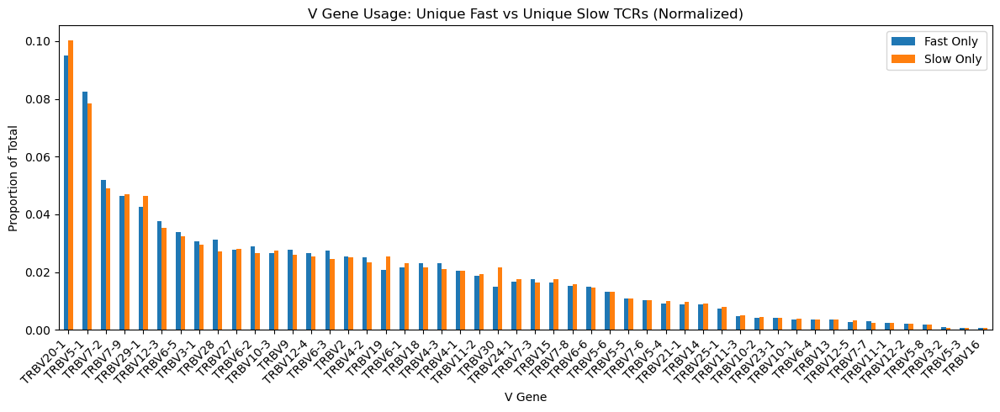

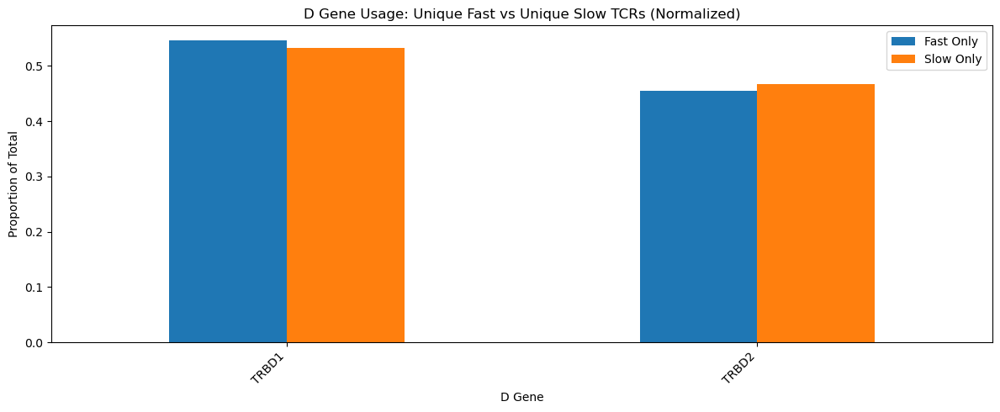

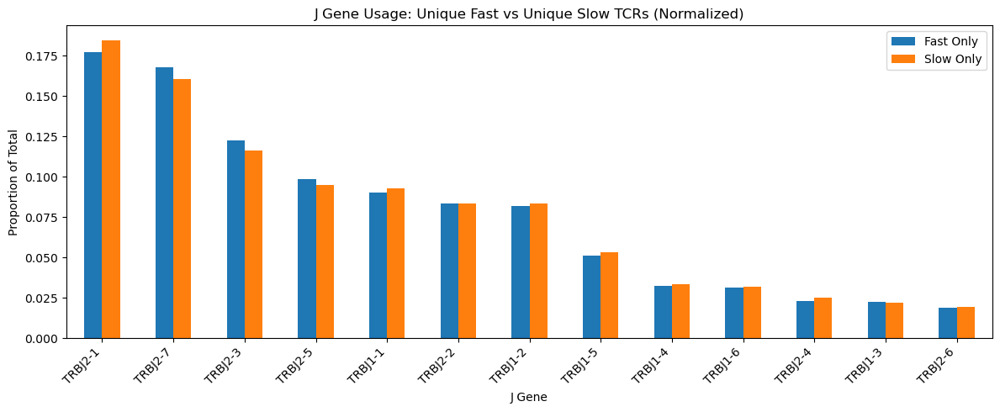

In [25]:
plot_comparison(v_comp_only, "V", title="Gene Usage: Unique Fast vs Unique Slow TCRs (Normalized)")
plot_comparison(d_comp_only, "D", title="Gene Usage: Unique Fast vs Unique Slow TCRs (Normalized)")
plot_comparison(j_comp_only, "J", title="Gene Usage: Unique Fast vs Unique Slow TCRs (Normalized)")


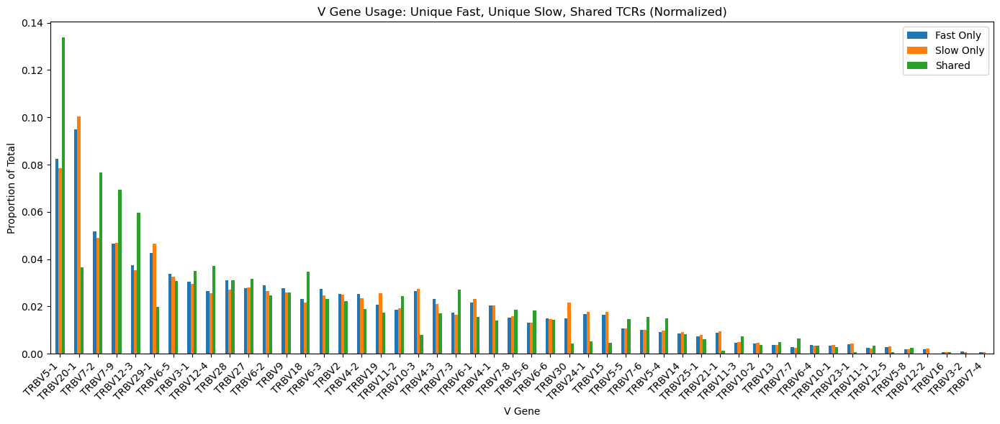

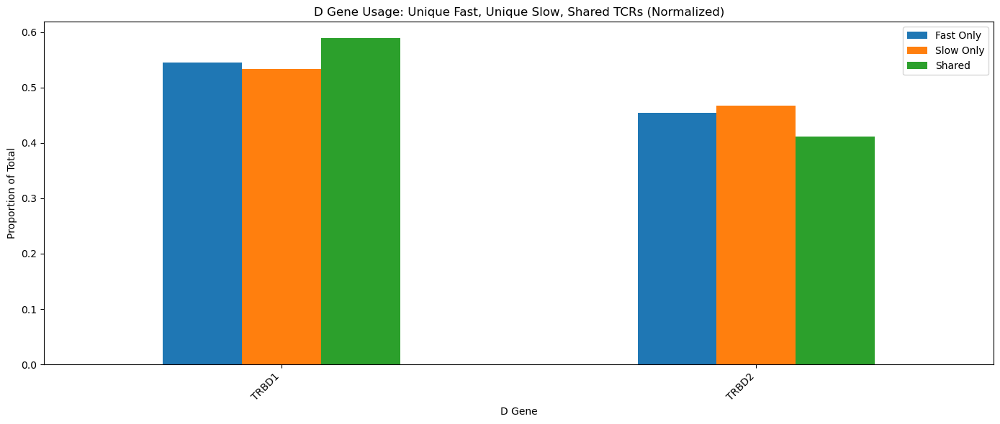

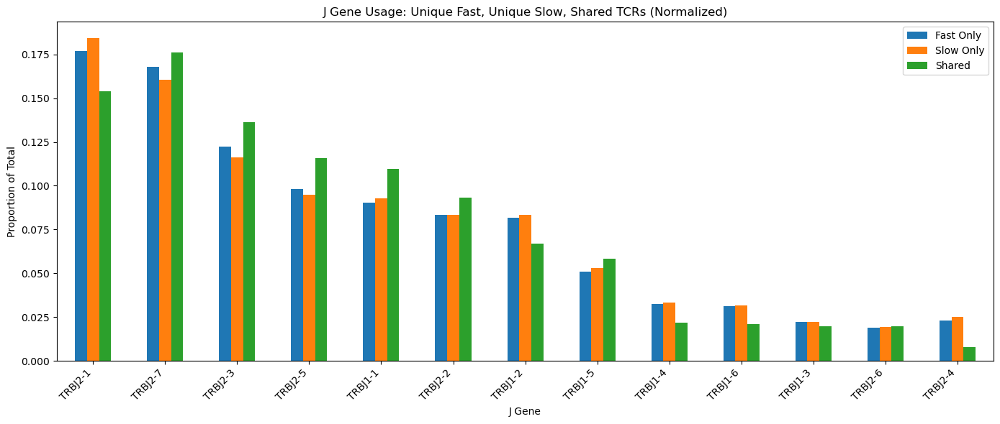

In [163]:
def prepare_3way_comparison_df(counts1, counts2, counts3, label1, label2, label3, gene_type, top_n=50):
    all_genes = set(counts1.keys()).union(set(counts2.keys())).union(set(counts3.keys()))
    total1 = sum(counts1.values())
    total2 = sum(counts2.values())
    total3 = sum(counts3.values())

    data = []
    for gene in all_genes:
        norm1 = counts1.get(gene, 0) / total1 if total1 else 0
        norm2 = counts2.get(gene, 0) / total2 if total2 else 0
        norm3 = counts3.get(gene, 0) / total3 if total3 else 0
        data.append((gene, norm1, norm2, norm3))

    df = pd.DataFrame(data, columns=[gene_type, label1, label2, label3])
    df["combined"] = df[label1] + df[label2] + df[label3]
    df = df.sort_values("combined", ascending=False).head(top_n).drop(columns="combined")
    return df.set_index(gene_type)


# Shared between groups
shared_clonotypes = fast_clonotypes & slow_clonotypes
shared_df = clonotype_df[clonotype_df["aaSeqCDR3"].isin(shared_clonotypes)]

# Shared
shared_v = extract_clean_genes(shared_df, "allVHitsWithScore")
shared_d = extract_clean_genes(shared_df, "allDHitsWithScore")
shared_j = extract_clean_genes(shared_df, "allJHitsWithScore")

# Counts
shared_v_counts = shared_v.value_counts().to_dict()
shared_d_counts = shared_d.value_counts().to_dict()
shared_j_counts = shared_j.value_counts().to_dict()

# Example for V gene
v_comp_3way = prepare_3way_comparison_df(
    fast_v_counts_only, slow_v_counts_only, shared_v_counts,
    "Fast Only", "Slow Only", "Shared", "V_gene"
)
d_comp_3way = prepare_3way_comparison_df(
    fast_d_counts_only, slow_d_counts_only, shared_d_counts,
    "Fast Only", "Slow Only", "Shared", "D_gene"
)
j_comp_3way = prepare_3way_comparison_df(
    fast_j_counts_only, slow_j_counts_only, shared_j_counts,
    "Fast Only", "Slow Only", "Shared", "J_gene"
)

# Plot (shows all three groups in one bar plot)
def plot_comparison_3way(df, gene_type, title="Gene Usage: Fast/Slow/Shared TCRs (Normalized)"):
    ax = df.plot(kind="bar", figsize=(14, 6))
    plt.title(f"{gene_type} {title}")
    plt.ylabel("Proportion of Total")
    plt.xlabel(f"{gene_type} Gene")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

plot_comparison_3way(v_comp_3way, "V", title="Gene Usage: Unique Fast, Unique Slow, Shared TCRs (Normalized)")
plot_comparison_3way(d_comp_3way, "D", title="Gene Usage: Unique Fast, Unique Slow, Shared TCRs (Normalized)")
plot_comparison_3way(j_comp_3way, "J", title="Gene Usage: Unique Fast, Unique Slow, Shared TCRs (Normalized)")


## Survivors with shared Nucleotide Seq

Among TCRs that share the same amino acid CDR3 (aaSeqCDR3) between fast and slow samples, how many:

- Have the same nucleotide sequence (nSeqCDR3)?

- Have different nucleotide sequences?

In [6]:
from collections import defaultdict

# Step 1: Filter only required columns
aa_nt_df = clonotype_df[["aaSeqCDR3", "nSeqCDR3", "group"]].dropna()

# Step 2: For each group, collect nucleotide sequences per AA
grouped_nt = defaultdict(lambda: {"fast": set(), "slow": set()})

for _, row in aa_nt_df.iterrows():
    aa = row["aaSeqCDR3"]
    nt = row["nSeqCDR3"]
    grp = row["group"]
    grouped_nt[aa][grp].add(nt)

# Step 3: Classify each AA CDR3
same_nt = []
diff_nt = []

for aa_seq, seqs in grouped_nt.items():
    if seqs["fast"] and seqs["slow"]:  # Appears in both groups
        if seqs["fast"] == seqs["slow"]:
            same_nt.append(aa_seq)
        else:
            diff_nt.append(aa_seq)

# Step 4: Report
print(f"Total shared AA sequences (fast & slow): {len(same_nt) + len(diff_nt)}")
print(f"Same nucleotide sequences: {len(same_nt)}")
print(f"Different nucleotide sequences: {len(diff_nt)}")
print(f"Fraction with different NTs: {len(diff_nt) / (len(same_nt) + len(diff_nt)):.2%}")


Total shared AA sequences (fast & slow): 522619
Same nucleotide sequences: 6766
Different nucleotide sequences: 515853
Fraction with different NTs: 98.71%


First lets assess Survivors group clonality.

In [28]:
survivors_set = set(same_nt + diff_nt)
survivor_df_clonality = clonotype_df[clonotype_df["aaSeqCDR3"].isin(survivors_set)].copy()
clonotype_counts = (
    survivor_df_clonality.groupby("nSeqCDR3")["readCount"]
    .sum()
    .sort_values(ascending=False)
)

In [29]:
# Aggregate total read count per nucleotide clonotype
top_clones = (
    survivor_df_clonality.groupby(["nSeqCDR3", "aaSeqCDR3"])["readCount"]
    .sum()
    .reset_index()
    .sort_values("readCount", ascending=False)
)

# Calculate clone fraction
total_reads = top_clones["readCount"].sum()
top_clones["cloneFraction"] = top_clones["readCount"] / total_reads

# Show top N clones
top_10_clones = top_clones.head(10)
print(top_10_clones.to_string(index=False))

                                              nSeqCDR3          aaSeqCDR3  readCount  cloneFraction
                  TGTGCCAGCAGCACTTTAAACAATGAGCAGTTCTTC       CASSTLNNEQFF   714285.0       0.006692
                  TGTGCCAGCAGTTACGGAGGGAATGAGCAGTTCTTC       CASSYGGNEQFF   712368.0       0.006674
            TGTGCCAGCAGCTTAGGTGGGGCCACAGATACGCAGTATTTT     CASSLGGATDTQYF   682542.0       0.006395
            TGTGCCAGCAGTTTAGCCGGACGGACCGGGGAGCTGTTTTTT     CASSLAGRTGELFF   626564.0       0.005870
         TGTGCCAGCAGTTTATCTAGCGGGGGGTCCTACGAGCAGTACTTC    CASSLSSGGSYEQYF   494398.0       0.004632
TGTGCCAGCAGAGCGGGACTAGCGGGAGGGCCCGCCACCGGGGAGCTGTTTTTT CASRAGLAGGPATGELFF   490163.0       0.004592
         TGTGCCAGCAGTCCGGACTCAGGGGGGACAGATACGCAGTATTTT    CASSPDSGGTDTQYF   471527.0       0.004418
                     TGTGCCAGCAGCCCTTACTACGAGCAGTACTTC        CASSPYYEQYF   465576.0       0.004362
            TGCGCCAGCAGCATAGGACAGGGGTCAGATACGCAGTATTTT     CASSIGQGSDTQYF   455584.0       0.004268


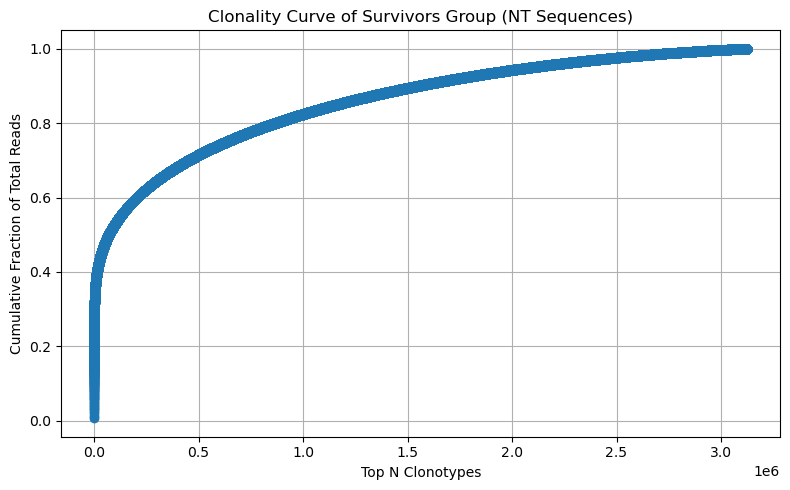

In [30]:
# Normalize counts
cumulative_counts = clonotype_counts.cumsum()
total_reads = clonotype_counts.sum()
fraction_reads = cumulative_counts / total_reads
x = np.arange(1, len(fraction_reads) + 1)

plt.figure(figsize=(8, 5))
plt.plot(x, fraction_reads, marker='o', linestyle='-')
plt.xlabel("Top N Clonotypes")
plt.ylabel("Cumulative Fraction of Total Reads")
plt.title("Clonality Curve of Survivors Group (NT Sequences)")
plt.grid(True)
plt.tight_layout()
plt.show()

shows that fast group is not dominated by a feq clones

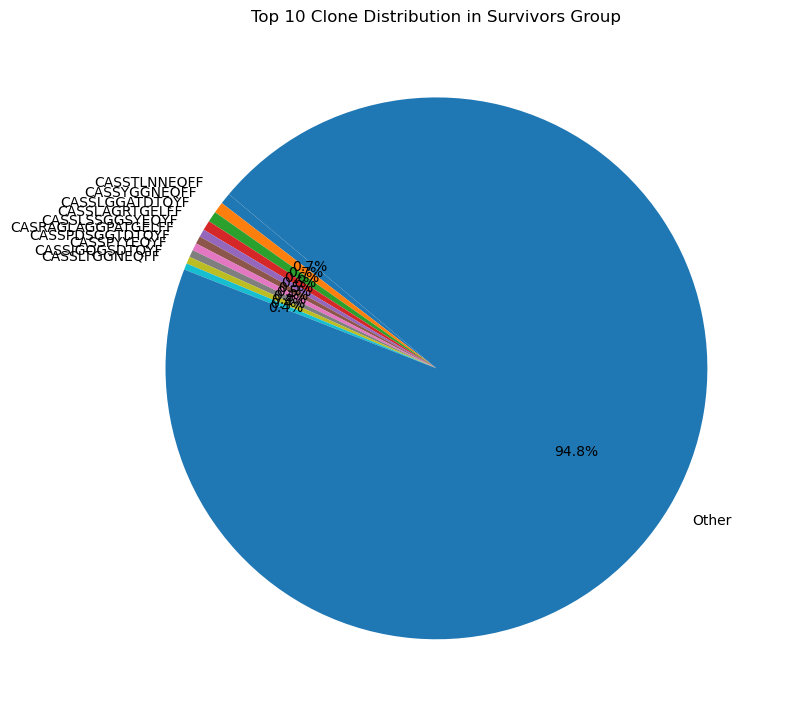

In [31]:
top_n = 10
top = top_clones.head(top_n)
other_fraction = 1 - top["cloneFraction"].sum()

labels = list(top["aaSeqCDR3"]) + ["Other"]
sizes = list(top["cloneFraction"]) + [other_fraction]

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct="%.1f%%", startangle=140)
plt.title(f"Top {top_n} Clone Distribution in Survivors Group")
plt.tight_layout()
plt.show()


### Common TCRs - Common structore?

In [32]:
# Get sets of common (shared) vs private (group-specific) TCRs
common_tcrs = set(diff_nt)  # appear in both groups, with different NTs
all_aas = set(clonotype_df["aaSeqCDR3"].dropna())
private_tcrs = all_aas - set(same_nt) - set(diff_nt)  # appear in only one group


#### Logo

Lets padd sequences for a uniform length:

In [164]:
from Bio import SeqIO

# def pad_sequences(seq_list, pad_char='-'):
#     max_len = max(len(s) for s in seq_list)
#     padded = [s.ljust(max_len, pad_char) for s in seq_list]
    
#     # Sanity check: confirm all lengths are equal
#     lengths = [len(seq) for seq in padded]
#     if len(set(lengths)) > 1:
#         raise ValueError("Padding failed — sequences are still of different lengths.")
    
#     return padded

def pad_sequences(seq_list, pad_char='-', max_length=30):
    # First truncate sequences if they exceed max_length
    trimmed = [s[:max_length] for s in seq_list]
    
    # Then pad if needed
    padded = [s.ljust(max_length, pad_char) for s in trimmed]

    # Sanity check
    lengths = [len(seq) for seq in padded]
    if len(set(lengths)) > 1:
        raise ValueError("Padding failed — sequences are still of different lengths.")
    
    return padded

# Apply padding
# Combine both sets to get shared max length
all_seqs = list(common_tcrs) + list(private_tcrs)
shared_max_len = max(len(s) for s in all_seqs)

# Pad both sets to same length
common_aligned = pad_sequences(list(common_tcrs), pad_char='-',)
private_aligned = pad_sequences(list(private_tcrs), pad_char='-')

dataframe:
rows = poisition
columns : 20 amino acids
Each cell is the count of how many times that AA appeared at that position.

In [165]:
import logomaker

def get_logo_df(seq_list):
    # Convert list of aligned sequences to DataFrame
    counts_mat = logomaker.alignment_to_matrix(seq_list, to_type='counts')
    return counts_mat

common_df = get_logo_df(common_aligned)
private_df = get_logo_df(private_aligned)

<Figure size 1200x300 with 0 Axes>

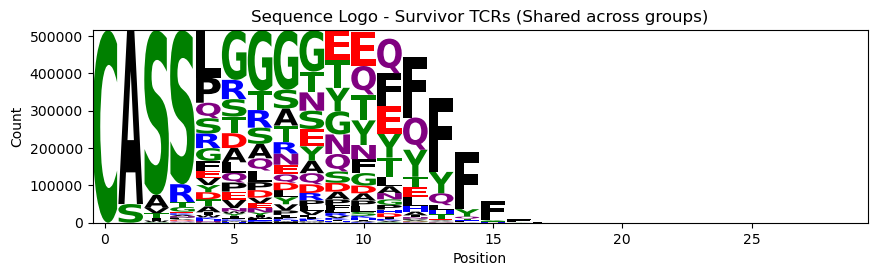

<Figure size 1200x300 with 0 Axes>

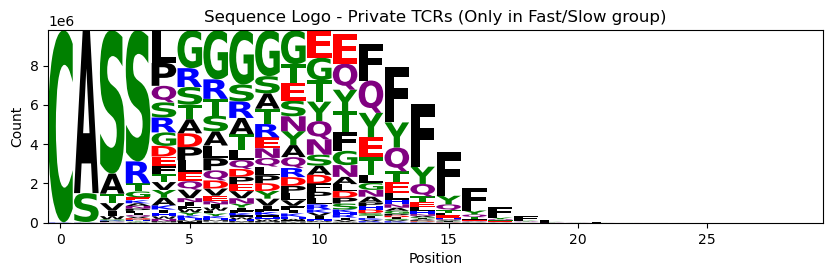

In [166]:
# Plot common TCR logo
plt.figure(figsize=(12, 3))
logomaker.Logo(common_df, color_scheme='chemistry')
plt.title("Sequence Logo - Survivor TCRs (Shared across groups)")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()

# Plot private TCR logo
plt.figure(figsize=(12, 3))
logomaker.Logo(private_df, color_scheme='chemistry')
plt.title("Sequence Logo - Private TCRs (Only in Fast/Slow group)")
plt.xlabel("Position")
plt.ylabel("Count")
plt.show()

In [168]:
# Choose a reasonable cutoff
cutoff_len = 25

# Truncate all padded sequences
common_trunc = [seq[:cutoff_len] for seq in common_aligned]
private_trunc = [seq[:cutoff_len] for seq in private_aligned]

common_df = logomaker.alignment_to_matrix(common_trunc, to_type='counts')
private_df = logomaker.alignment_to_matrix(private_trunc, to_type='counts')

common_freq = common_df.div(common_df.sum(axis=1), axis=0).fillna(0)
private_freq = private_df.div(private_df.sum(axis=1), axis=0).fillna(0)

corrs = common_freq.corrwith(private_freq, axis=1)
print(corrs.describe())

count    20.000000
mean      0.965672
std       0.039895
min       0.846206
25%       0.946756
50%       0.984670
75%       0.988193
max       0.999999
dtype: float64


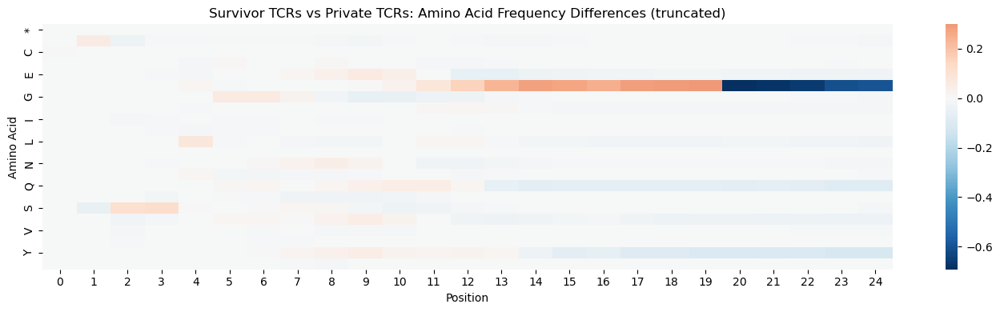

In [169]:
common_diff_matrix = common_freq - private_freq

# Plot again
plt.figure(figsize=(14, 4))
sns.heatmap(common_diff_matrix.T, cmap="RdBu_r", center=0)
plt.title("Survivor TCRs vs Private TCRs: Amino Acid Frequency Differences (truncated)")
plt.xlabel("Position")
plt.ylabel("Amino Acid")
plt.tight_layout()
plt.show()

In [ ]:
# Ensure required columns exist
assert {"aaSeqCDR3", "group"}.issubset(clonotype_df.columns)

# Create group-wise sets
fast_seqs = set(clonotype_df[clonotype_df["group"] == "fast"]["aaSeqCDR3"].dropna())
slow_seqs = set(clonotype_df[clonotype_df["group"] == "slow"]["aaSeqCDR3"].dropna())

# Shared between groups with different NTs (already from your earlier logic)
shared_seqs = set(diff_nt)

# Private sequences
fast_only = fast_seqs - slow_seqs
slow_only = slow_seqs - fast_seqs

## Padding (using previously established function)
# Combine all to determine max length
all_seqs = list(shared_seqs | fast_only | slow_only)
max_len = max(len(s) for s in all_seqs)


<Figure size 1200x300 with 0 Axes>

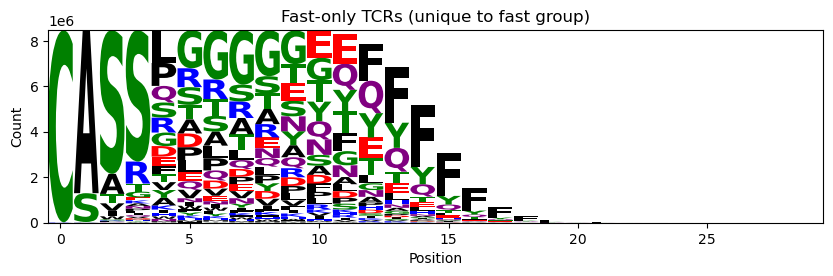

<Figure size 1200x300 with 0 Axes>

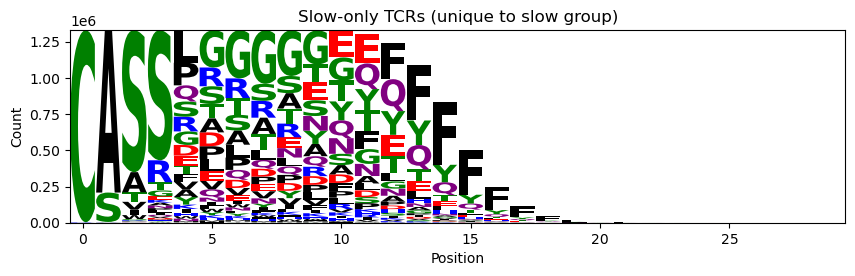

In [167]:
# Pad each group using your function
fast_aligned = pad_sequences(list(fast_only), pad_char='-', max_length=30)
slow_aligned = pad_sequences(list(slow_only), pad_char='-', max_length=30)

def plot_logo(seq_list, title):
    df = logomaker.alignment_to_matrix(seq_list, to_type='counts')
    plt.figure(figsize=(12, 3))
    logomaker.Logo(df, color_scheme='chemistry')
    plt.title(title)
    plt.xlabel("Position")
    plt.ylabel("Count")
    plt.show()

# Plot each group
plot_logo(fast_aligned, "Fast-only TCRs (unique to fast group)")
plot_logo(slow_aligned, "Slow-only TCRs (unique to slow group)")

are the 2 logos (only fast/only slow) identical?

In [37]:
# Choose a reasonable cutoff
cutoff_len = 25

# Truncate all padded sequences
fast_trunc = [seq[:cutoff_len] for seq in fast_aligned]
slow_trunc = [seq[:cutoff_len] for seq in slow_aligned]

fast_df = logomaker.alignment_to_matrix(fast_trunc, to_type='counts')
slow_df = logomaker.alignment_to_matrix(slow_trunc, to_type='counts')

fast_freq = fast_df.div(fast_df.sum(axis=1), axis=0).fillna(0)
slow_freq = slow_df.div(slow_df.sum(axis=1), axis=0).fillna(0)

corrs = fast_freq.corrwith(slow_freq, axis=1)
print(corrs.describe())



count    25.000000
mean      0.999817
std       0.000208
min       0.999346
25%       0.999796
50%       0.999895
75%       0.999974
max       1.000000
dtype: float64


TODO: SHOW differece in logo between survivors (common) tcrs and fast/slow only tcrs. 

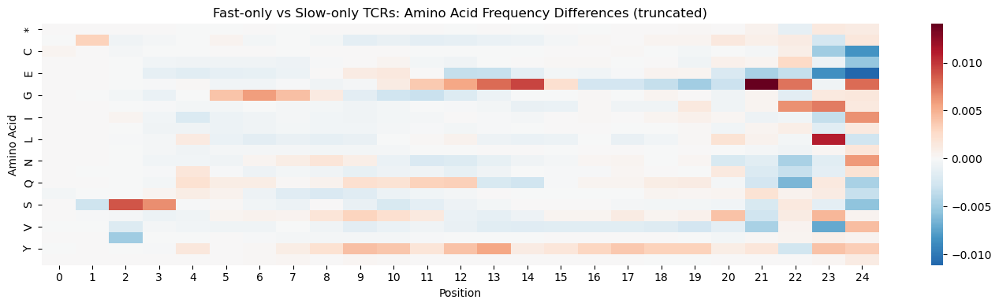

In [38]:
diff_matrix = fast_freq - slow_freq

# Plot again
plt.figure(figsize=(14, 4))
sns.heatmap(diff_matrix.T, cmap="RdBu_r", center=0)
plt.title("Fast-only vs Slow-only TCRs: Amino Acid Frequency Differences (truncated)")
plt.xlabel("Position")
plt.ylabel("Amino Acid")
plt.tight_layout()
plt.show()

#### tcrdist3

we will focus on shared aa TCRs, therefor will drop NT variations leading to the same AA seq, and focus only on AA seq.

In [39]:
# surviving_aa_seqs = set(same_nt) | set(diff_nt)

# # Safely drop duplicates at AA level
# shared_df_aa = clonotype_df[
#     clonotype_df["aaSeqCDR3"].isin(set(same_nt) | set(diff_nt))
# ].drop_duplicates(subset=["aaSeqCDR3"]).copy()

# # clean gene names
# # TCRdist enfores strict gene names with alleles, so we will replace 00 (mixcr output for unconfident allele) with 01.
# def extract_clean_gene_column(df, col):
#     cleaned = df[col].dropna().str.split(",").str[0]             # Take first gene if multiple
#     cleaned = cleaned.str.replace(r"\*00(\([^\)]*\))?", "*01", regex=True)  # Replace *00 or *00(score) with *01
#     return cleaned

# shared_df_aa["v_b_gene"] = extract_clean_gene_column(shared_df_aa, "allVHitsWithScore")
# shared_df_aa["j_b_gene"] = extract_clean_gene_column(shared_df_aa, "allJHitsWithScore")

# shared_df_aa = shared_df_aa.rename(columns={
#     "aaSeqCDR3": "cdr3_b_aa"
#     # v_b_gene and j_b_gene already set correctly
# })


In [40]:
# from tcrdist.repertoire import TCRrep

# tcrrep = TCRrep(
#     cell_df=shared_df_aa,
#     organism='human',
#     chains=['beta'],
#     compute_distances=True
# )


In [41]:
# tcrrep.cpus = 24  # or more — depends on actual core count, but you can afford it
# tcrrep.compute_sparse_rect_distances(radius=40, chunk_size=5000)


In [42]:
# from hdbscan import HDBSCAN
# import numpy as np

# dist_matrix = tcrrep.pw_beta

# # Convert condensed distance matrix to 2D
# model = HDBSCAN(metric='precomputed', min_cluster_size=5)
# cluster_labels = model.fit_predict(dist_matrix)

# shared_df_aa['cluster'] = cluster_labels

### Gene usage

In [43]:
import re
from collections import Counter
import matplotlib.pyplot as plt

# --- Vectorized helper to extract and clean gene names ---
def extract_clean_genes(df, col):
    exploded = df[[col]].dropna().copy()
    exploded[col] = exploded[col].str.split(",")
    exploded = exploded.explode(col)
    exploded[col] = exploded[col].str.split("*").str[0]
    return exploded[col]

# Convert to sorted DataFrames for plotting
def counter_to_df(counter, label):
    df = pd.DataFrame(counter.items(), columns=[label, "count"])
    return df.sort_values("count", ascending=False)

def plot_gene_usage(df, gene_type, color, group_label, top_n=100):
    plt.figure(figsize=(10, 5))
    sns.barplot(data=df.head(top_n), x=gene_type, y="count", color=color)
    plt.title(f"Top {top_n} {gene_type} Usage in {group_label}")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("Count")
    plt.xlabel(f"{gene_type} Name")
    plt.tight_layout()
    plt.show()


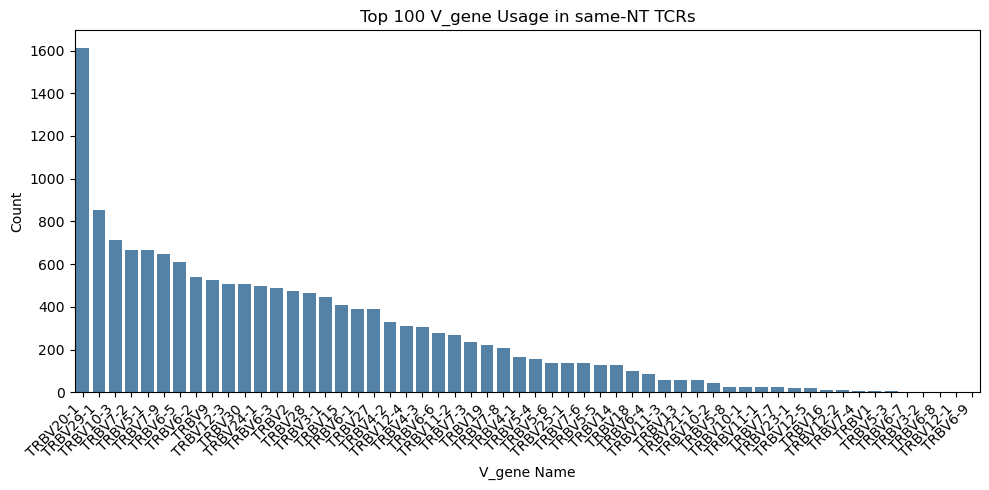

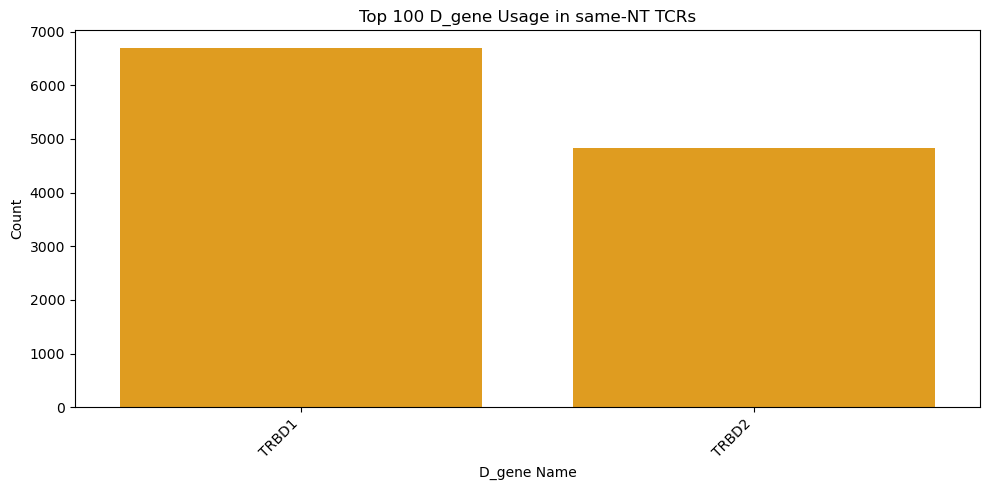

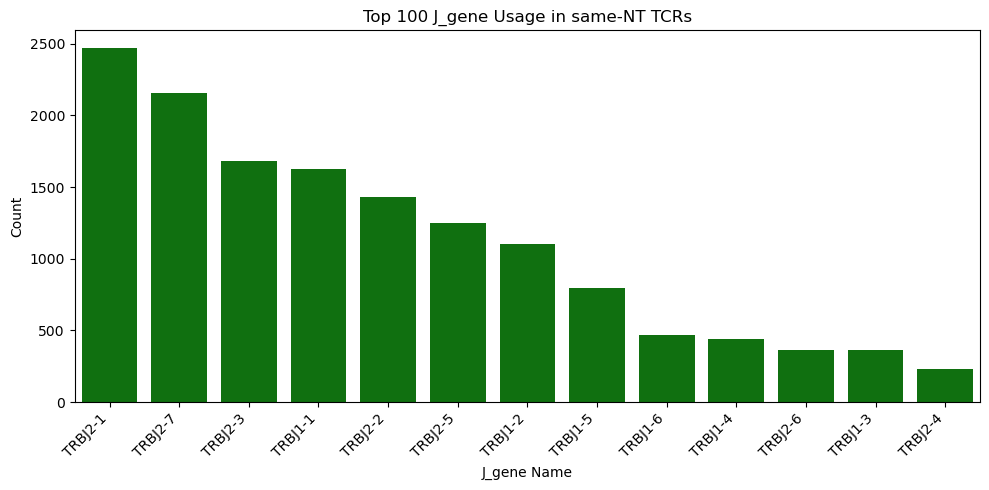

In [44]:

# Step 1: Filter clonotypes with shared identical nucleotide sequences
same_nt_df = clonotype_df[clonotype_df["aaSeqCDR3"].isin(same_nt)].copy()

# --- Apply to same-NT group ---
v_genes = extract_clean_genes(same_nt_df, "allVHitsWithScore")
d_genes = extract_clean_genes(same_nt_df, "allDHitsWithScore")
j_genes = extract_clean_genes(same_nt_df, "allJHitsWithScore")

# --- Count frequencies
v_counts = v_genes.value_counts().to_dict()
d_counts = d_genes.value_counts().to_dict()
j_counts = j_genes.value_counts().to_dict()

v_df = counter_to_df(v_counts, "V_gene")
d_df = counter_to_df(d_counts, "D_gene")
j_df = counter_to_df(j_counts, "J_gene")

plot_gene_usage(v_df, "V_gene", "steelblue", "same-NT TCRs")
plot_gene_usage(d_df, "D_gene", "orange", "same-NT TCRs")
plot_gene_usage(j_df, "J_gene", "green", "same-NT TCRs")


In [45]:
# Unique gene counts
n_v_genes = len(set(v_genes))
n_d_genes = len(set(d_genes))
n_j_genes = len(set(j_genes))

print(f"Number of unique V genes in same-NT group: {n_v_genes}")
print(f"Number of unique D genes in same-NT group: {n_d_genes}")
print(f"Number of unique J genes in same-NT group: {n_j_genes}")

Number of unique V genes in same-NT group: 56
Number of unique D genes in same-NT group: 2
Number of unique J genes in same-NT group: 13


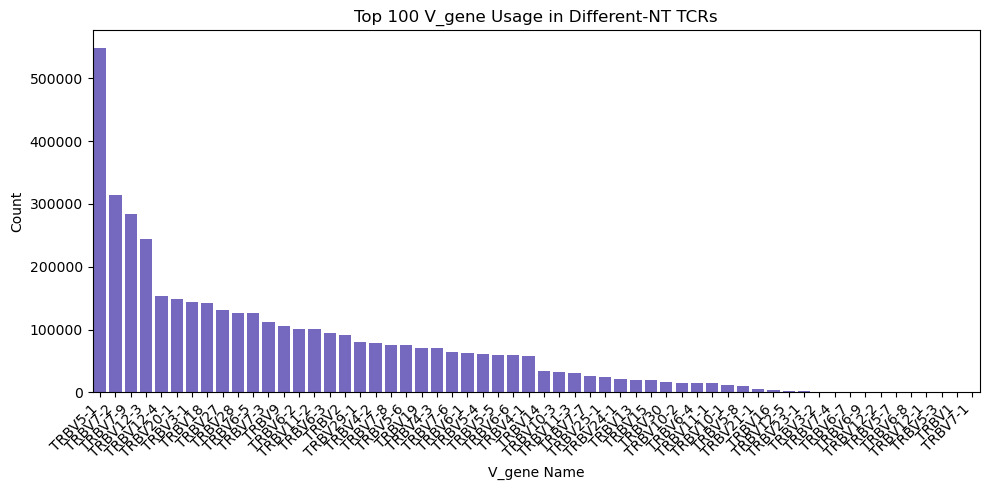

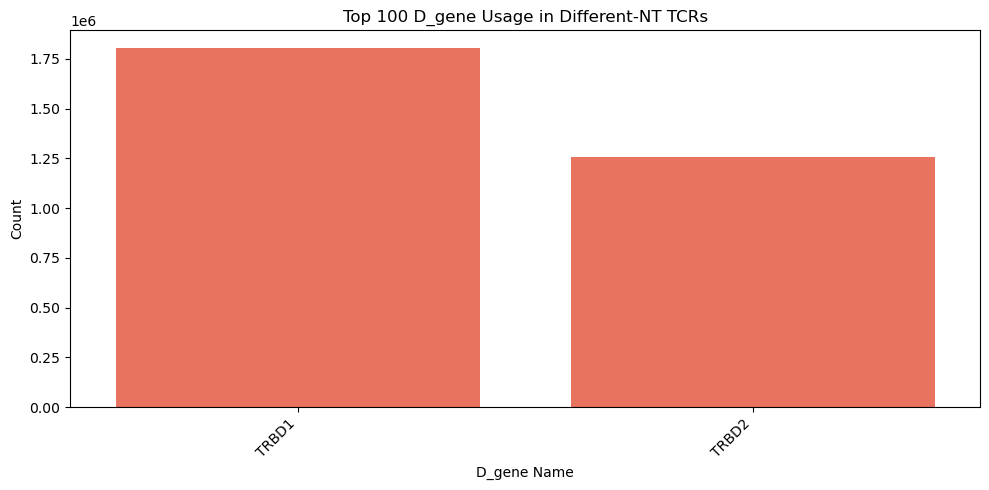

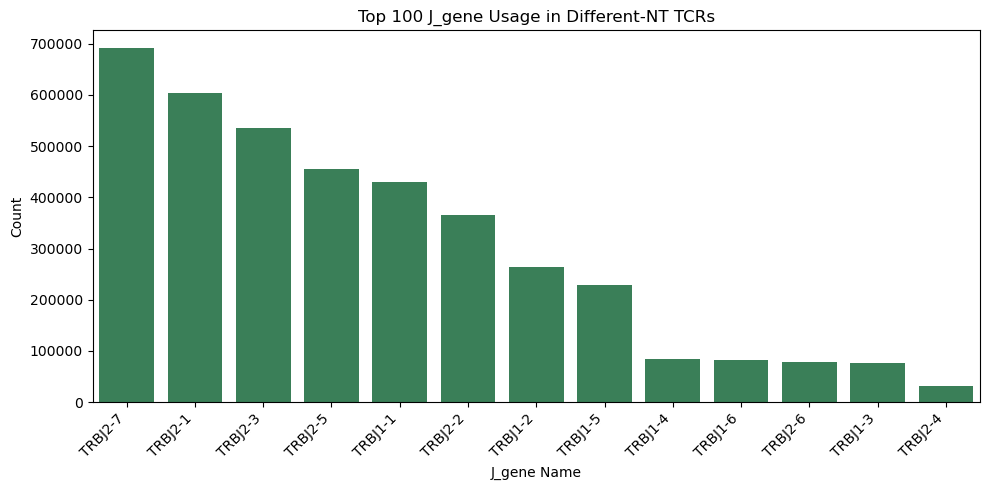

In [46]:
# Step 1: Filter clonotypes with shared amino acid but different nucleotide sequences
diff_nt_df = clonotype_df[clonotype_df["aaSeqCDR3"].isin(diff_nt)].copy()

# --- Extract gene names ---
v_genes_diff = extract_clean_genes(diff_nt_df, "allVHitsWithScore")
d_genes_diff = extract_clean_genes(diff_nt_df, "allDHitsWithScore")
j_genes_diff = extract_clean_genes(diff_nt_df, "allJHitsWithScore")

# --- Count frequencies (same as Counter but faster)
v_counts_diff = v_genes_diff.value_counts().to_dict()
d_counts_diff = d_genes_diff.value_counts().to_dict()
j_counts_diff = j_genes_diff.value_counts().to_dict()

v_df_diff = counter_to_df(v_counts_diff, "V_gene")
d_df_diff = counter_to_df(d_counts_diff, "D_gene")
j_df_diff = counter_to_df(j_counts_diff, "J_gene")

plot_gene_usage(v_df_diff, "V_gene", "slateblue", "Different-NT TCRs")
plot_gene_usage(d_df_diff, "D_gene", "tomato", "Different-NT TCRs")
plot_gene_usage(j_df_diff, "J_gene", "seagreen", "Different-NT TCRs")


In [47]:
# Unique gene counts
n_v_genes = len(set(v_genes_diff))
n_d_genes = len(set(d_genes_diff))
n_j_genes = len(set(j_genes_diff))

print(f"Number of unique V genes in same-NT group: {n_v_genes}")
print(f"Number of unique D genes in same-NT group: {n_d_genes}")
print(f"Number of unique J genes in same-NT group: {n_j_genes}")

Number of unique V genes in same-NT group: 58
Number of unique D genes in same-NT group: 2
Number of unique J genes in same-NT group: 13


comparing gene expression between both groups.

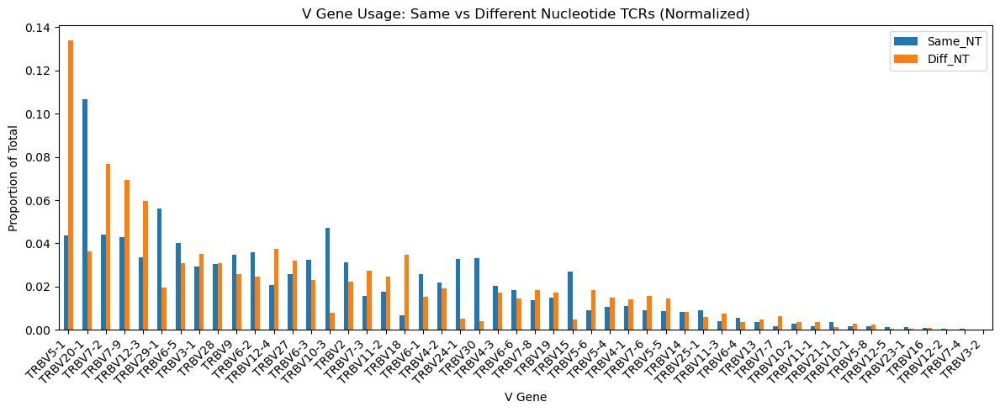

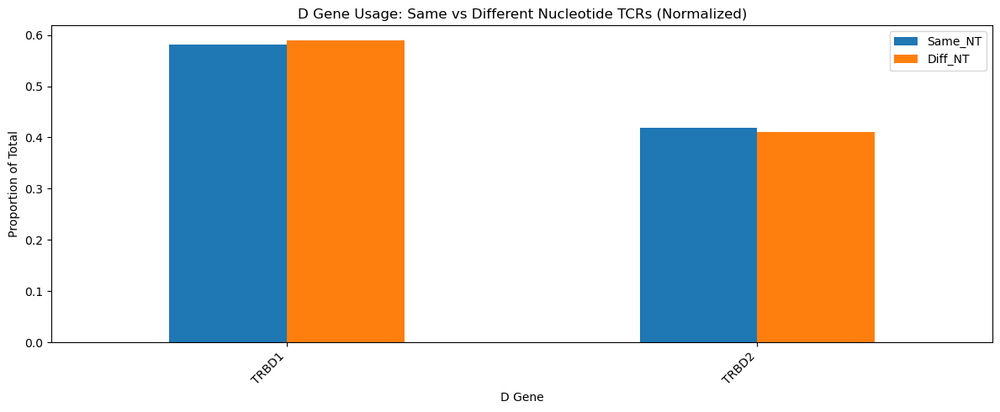

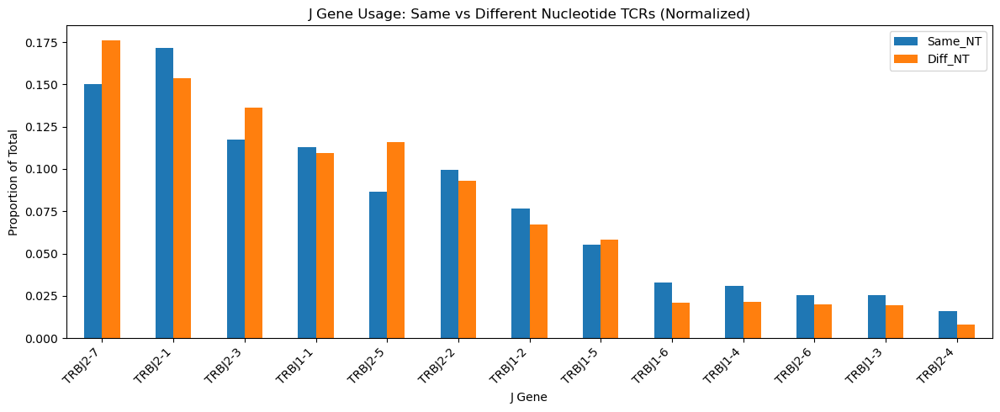

In [48]:
# --- Helper: Merge & normalize counts ---
def prepare_comparison_df(counts1, counts2, label1, label2, gene_type, top_n=50):
    # All unique gene names
    all_genes = set(counts1.keys()).union(set(counts2.keys()))
    
    # Normalize each counter
    total1 = sum(counts1.values())
    total2 = sum(counts2.values())

    data = []
    for gene in all_genes:
        norm1 = counts1.get(gene, 0) / total1
        norm2 = counts2.get(gene, 0) / total2
        data.append((gene, norm1, norm2))
    
    df = pd.DataFrame(data, columns=[gene_type, label1, label2])
    
    # Keep top N genes based on total usage
    df["combined"] = df[label1] + df[label2]
    df = df.sort_values("combined", ascending=False).head(top_n).drop(columns="combined")
    
    return df.set_index(gene_type)

# --- Compare each gene type ---
v_comp_df = prepare_comparison_df(v_counts, v_counts_diff, "Same_NT", "Diff_NT", "V_gene")
d_comp_df = prepare_comparison_df(d_counts, d_counts_diff, "Same_NT", "Diff_NT", "D_gene")
j_comp_df = prepare_comparison_df(j_counts, j_counts_diff, "Same_NT", "Diff_NT", "J_gene")

# --- Plotting function ---
def plot_comparison(df, gene_type, title="Gene Usage: Same vs Different Nucleotide TCRs (Normalized)"):
    ax = df.plot(kind="bar", figsize=(12, 5))
    plt.title(f"{gene_type} {title}")
    plt.ylabel("Proportion of Total")
    plt.xlabel(f"{gene_type} Gene")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

plot_comparison(v_comp_df, "V")
plot_comparison(d_comp_df, "D")
plot_comparison(j_comp_df, "J")


now run the same code, but take into account only the first gene value in cell, if multiple genes are presented.

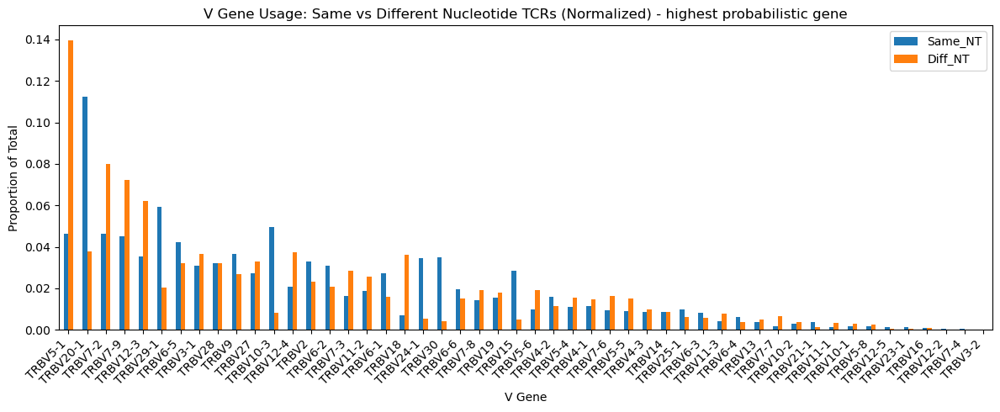

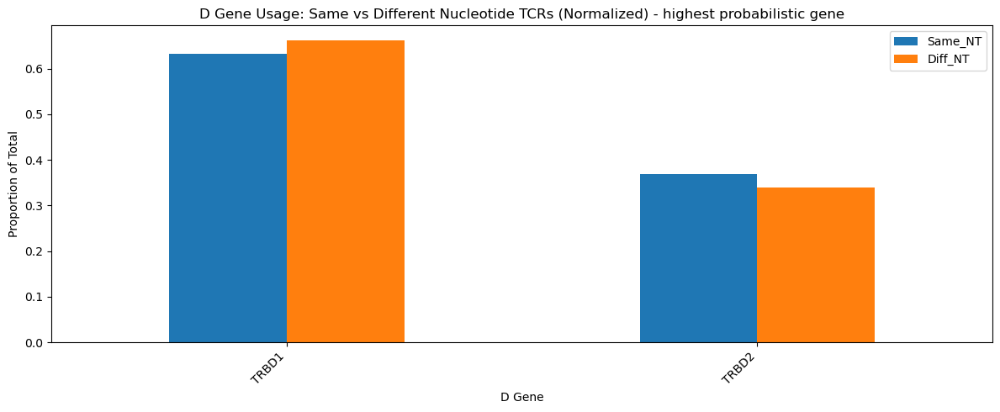

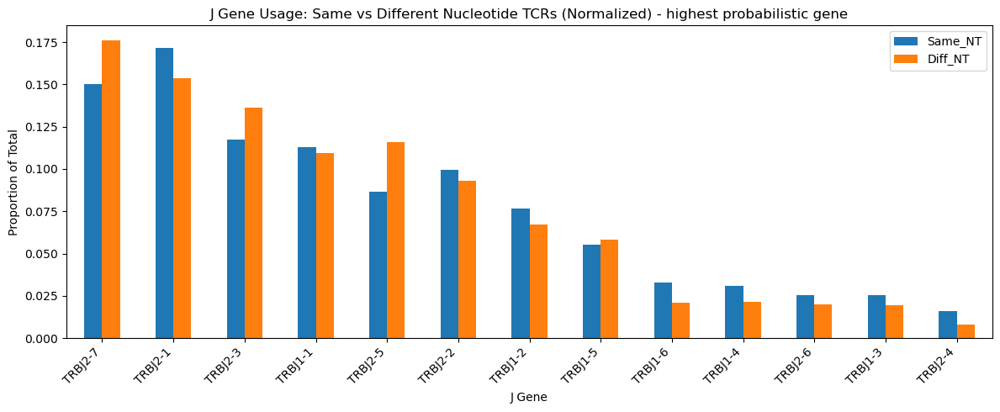

In [49]:
# --- Extract first gene only (before *, ignore rest) ---
def extract_first_gene(df, col):
    cleaned = df[[col]].dropna().copy()
    cleaned[col] = cleaned[col].str.split(",").str[0]         # first gene only
    cleaned[col] = cleaned[col].str.split("*").str[0]         # remove score
    return cleaned[col]


# --- SAME-NT GROUP ---
v_genes_same = extract_first_gene(same_nt_df, "allVHitsWithScore")
d_genes_same = extract_first_gene(same_nt_df, "allDHitsWithScore")
j_genes_same = extract_first_gene(same_nt_df, "allJHitsWithScore")

v_counts = v_genes_same.value_counts().to_dict()
d_counts = d_genes_same.value_counts().to_dict()
j_counts = j_genes_same.value_counts().to_dict()

# --- DIFF-NT GROUP ---
v_genes_diff = extract_first_gene(diff_nt_df, "allVHitsWithScore")
d_genes_diff = extract_first_gene(diff_nt_df, "allDHitsWithScore")
j_genes_diff = extract_first_gene(diff_nt_df, "allJHitsWithScore")

v_counts_diff = v_genes_diff.value_counts().to_dict()
d_counts_diff = d_genes_diff.value_counts().to_dict()
j_counts_diff = j_genes_diff.value_counts().to_dict()


# Prepare comparison DataFrames
v_comp_df = prepare_comparison_df(v_counts, v_counts_diff, "Same_NT", "Diff_NT", "V_gene")
d_comp_df = prepare_comparison_df(d_counts, d_counts_diff, "Same_NT", "Diff_NT", "D_gene")
j_comp_df = prepare_comparison_df(j_counts, j_counts_diff, "Same_NT", "Diff_NT", "J_gene")

# Plot
new_title = "Gene Usage: Same vs Different Nucleotide TCRs (Normalized) - highest probabilistic gene"
plot_comparison(v_comp_df, "V", title=new_title)
plot_comparison(d_comp_df, "D", title=new_title)
plot_comparison(j_comp_df, "J", title=new_title)


TODO: show v-j gene usage for TCRs only in fast vs only in SLOW.

### differnt nt group

In [5]:
from collections import Counter

# Filter relevant columns from diff_nt group
diff_nt_df_filtered = clonotype_df[clonotype_df["aaSeqCDR3"].isin(diff_nt)][["aaSeqCDR3", "nSeqCDR3"]].dropna().drop_duplicates()

# Group all nucleotide sequences by identical aaSeqCDR3
nt_groups = diff_nt_df_filtered.groupby("aaSeqCDR3")["nSeqCDR3"].apply(list)

# Codon mutation counters
aa_pos_counter = Counter()
codon_base_counter = Counter()

# Process each group
for aa_seq, nt_list in nt_groups.items():
    codon_length = len(aa_seq)
    nt_list = [nt for nt in nt_list if len(nt) == codon_length * 3]  # sanity check

    if len(nt_list) < 2:
        continue  # skip if not enough NT variants to compare

    # Compare all pairs (conservatively, pairwise)
    for i in range(len(nt_list)):
        for j in range(i + 1, len(nt_list)):
            nt1 = nt_list[i]
            nt2 = nt_list[j]
            for codon_idx in range(codon_length):
                codon1 = nt1[codon_idx*3 : codon_idx*3+3]
                codon2 = nt2[codon_idx*3 : codon_idx*3+3]

                for base_pos in range(3):
                    if codon1[base_pos] != codon2[base_pos]:
                        aa_pos_counter[codon_idx + 1] += 1               # 1-based AA position
                        codon_base_counter[base_pos + 1] += 1           # 1, 2, 3 base in codon


NameError: name 'diff_nt' is not defined

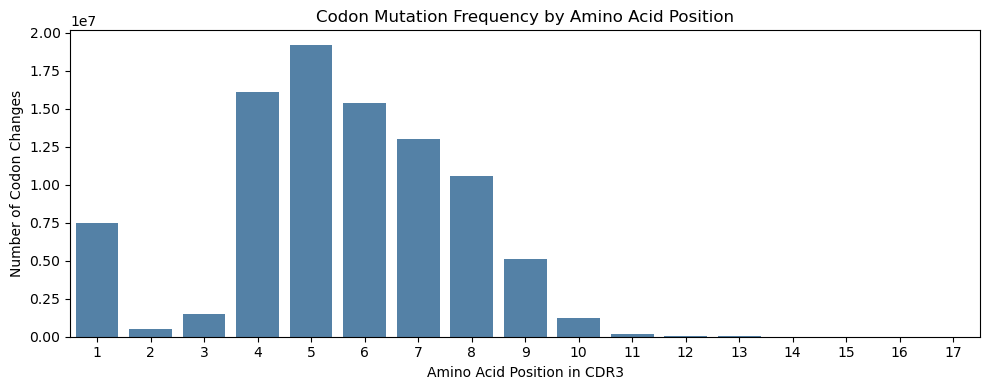

In [51]:
plt.figure(figsize=(10, 4))
sns.barplot(x=list(aa_pos_counter.keys()), y=list(aa_pos_counter.values()), color="steelblue")
plt.title("Codon Mutation Frequency by Amino Acid Position")
plt.xlabel("Amino Acid Position in CDR3")
plt.ylabel("Number of Codon Changes")
plt.tight_layout()
plt.show()


Should normelize

/tmp/ipykernel_1301561/867360641.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=["1st base", "2nd base", "3rd base"], y=[codon_base_counter[1], codon_base_counter[2], codon_base_counter[3]], palette="Set2")


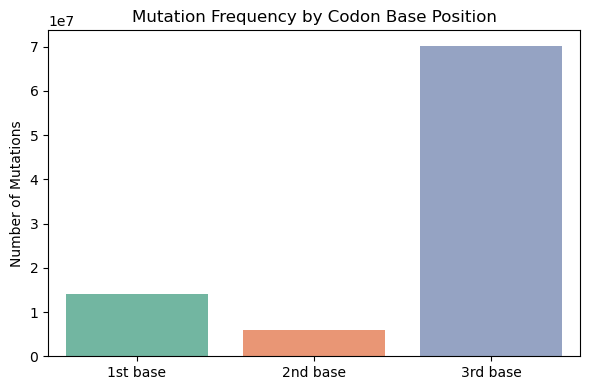

In [52]:
plt.figure(figsize=(6, 4))
sns.barplot(x=["1st base", "2nd base", "3rd base"], y=[codon_base_counter[1], codon_base_counter[2], codon_base_counter[3]], palette="Set2")
plt.title("Mutation Frequency by Codon Base Position")
plt.ylabel("Number of Mutations")
plt.tight_layout()
plt.show()


In [ ]:
from collections import Counter

# Mutation direction tracker
nt_substitution_counter = Counter()

# Group by AA and get nSeqCDR3 list per aaSeqCDR3 (same as before)
nt_groups = diff_nt_df_filtered.groupby("aaSeqCDR3")["nSeqCDR3"].apply(list)

base_occurrence_counter = Counter()

# Compare all unique nucleotide pairs for each shared AA
for aa_seq, nt_list in nt_groups.items():
    codon_length = len(aa_seq)
    nt_list = [nt for nt in nt_list if len(nt) == codon_length * 3]

    if len(nt_list) < 2:
        continue

    for i in range(len(nt_list)):
        for j in range(i + 1, len(nt_list)):
            nt1 = nt_list[i]
            nt2 = nt_list[j]

            for pos in range(len(nt1)):
                base1 = nt1[pos]
                base2 = nt2[pos]
                # Track total base occurrences (regardless of match)
                base_occurrence_counter[base1] += 1
                base_occurrence_counter[base2] += 1
                # Track substitution
                if base1 != base2:
                    nt_substitution_counter[(base1, base2)] += 1

/tmp/ipykernel_1301561/3459576537.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


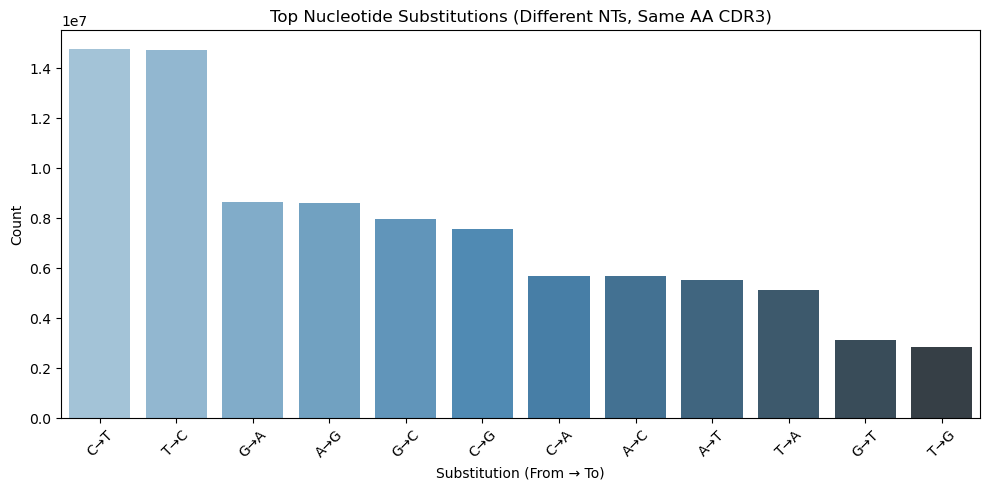

In [ ]:
# Convert to sorted DataFrame
mut_df = pd.DataFrame(
    [(k[0], k[1], v) for k, v in nt_substitution_counter.items()],
    columns=["from", "to", "count"]
).sort_values("count", ascending=False)

# Create a new column with "A→G" style labels
mut_df["substitution"] = mut_df["from"] + "→" + mut_df["to"]

# Plot top 20 substitutions
plt.figure(figsize=(10, 5))
sns.barplot(
    data=mut_df.head(20),
    x="substitution",
    y="count",
    palette="Blues_d"
)
plt.title("Top Nucleotide Substitutions (Different NTs, Same AA CDR3)")
plt.xlabel("Substitution (From → To)")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


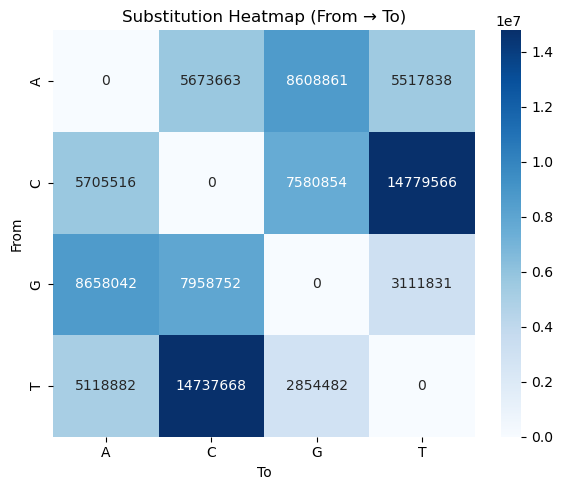

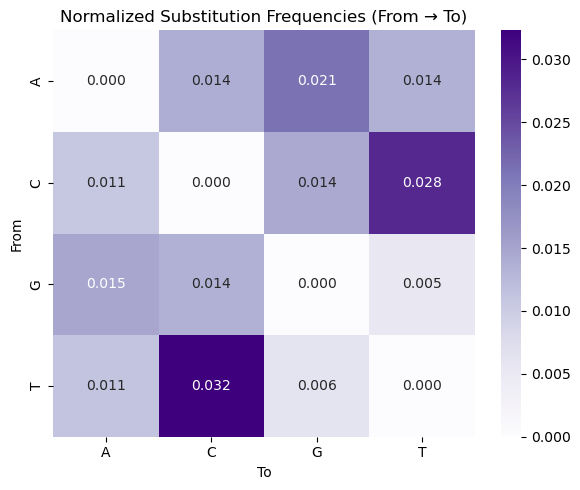

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

# Assuming nt_substitution_counter and base_occurrence_counter already exist from earlier run

# Step 1: Heatmap of raw substitution counts
bases = ["A", "C", "G", "T"]
heatmap_matrix = pd.DataFrame(0, index=bases, columns=bases)

for (b1, b2), count in nt_substitution_counter.items():
    if b1 in bases and b2 in bases:
        heatmap_matrix.loc[b1, b2] = count

plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Substitution Heatmap (From → To)")
plt.xlabel("To")
plt.ylabel("From")
plt.tight_layout()
plt.show()

# Step 2: Heatmap of normalized substitution frequencies
norm_data = []

for (b1, b2), count in nt_substitution_counter.items():
    total_b1 = base_occurrence_counter.get(b1, 1)  # prevent division by 0
    norm_freq = count / total_b1
    norm_data.append((b1, b2, norm_freq))

norm_df = pd.DataFrame(norm_data, columns=["from", "to", "normalized_freq"])

heatmap_norm = pd.DataFrame(0.0, index=bases, columns=bases)

for _, row in norm_df.iterrows():
    if row["from"] in bases and row["to"] in bases:
        heatmap_norm.loc[row["from"], row["to"]] = row["normalized_freq"]

plt.figure(figsize=(6, 5))
sns.heatmap(heatmap_norm, annot=True, fmt=".3f", cmap="Purples")
plt.title("Normalized Substitution Frequencies (From → To)")
plt.xlabel("To")
plt.ylabel("From")
plt.tight_layout()
plt.show()


Normelized frequency is count / total occurrences of "from", meaning - given "from" count, how likely it mutates to "to".

Now lets see if above pattern repeats in each of the 3 bases.

In [ ]:
# Prep counters
substitution_by_position = {1: Counter(), 2: Counter(), 3: Counter()}
base_occurrence_by_position = {1: Counter(), 2: Counter(), 3: Counter()}

# Group nt sequences per identical AA
nt_groups = diff_nt_df_filtered.groupby("aaSeqCDR3")["nSeqCDR3"].apply(list)

for aa_seq, nt_list in nt_groups.items():
    codon_length = len(aa_seq)
    nt_list = [nt for nt in nt_list if len(nt) == codon_length * 3]

    if len(nt_list) < 2:
        continue

    for i in range(len(nt_list)):
        for j in range(i + 1, len(nt_list)):
            nt1 = nt_list[i]
            nt2 = nt_list[j]

            for codon_idx in range(codon_length):
                codon1 = nt1[codon_idx*3 : codon_idx*3+3]
                codon2 = nt2[codon_idx*3 : codon_idx*3+3]

                for base_pos in range(3):  # 0,1,2 → codon base 1,2,3
                    b1 = codon1[base_pos]
                    b2 = codon2[base_pos]
                    pos = base_pos + 1

                    base_occurrence_by_position[pos][b1] += 1
                    base_occurrence_by_position[pos][b2] += 1
                    if b1 != b2:
                        substitution_by_position[pos][(b1, b2)] += 1


/tmp/ipykernel_1301561/2856317834.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df.sort_values("count", ascending=False).head(15),


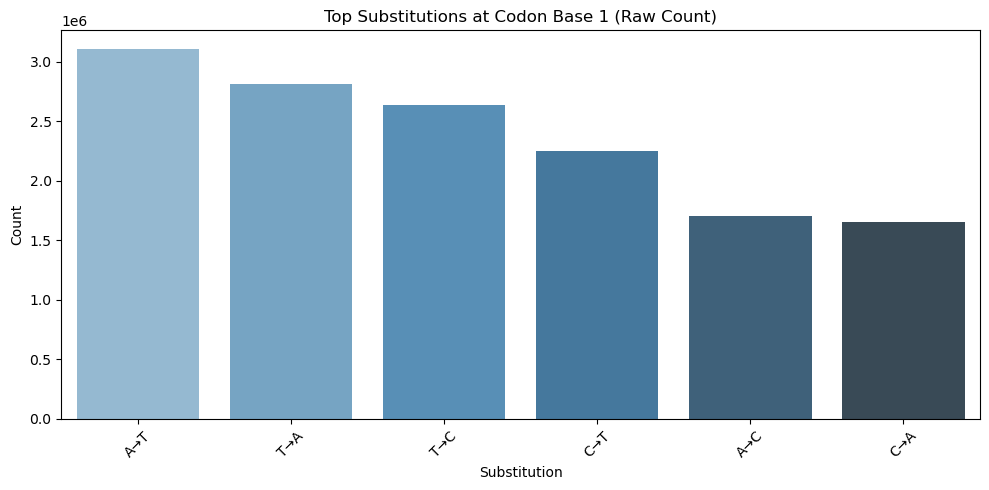

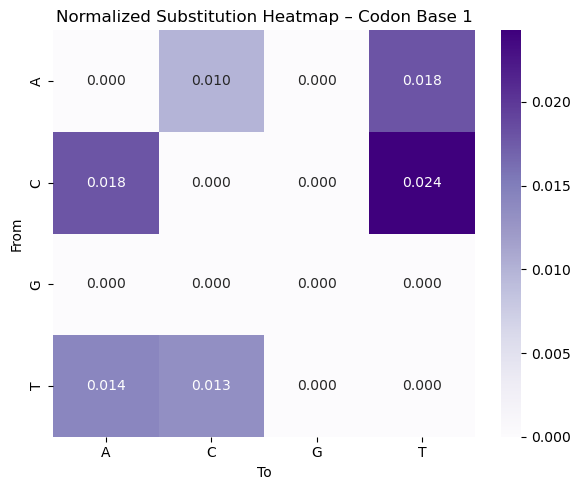

/tmp/ipykernel_1301561/2856317834.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df.sort_values("count", ascending=False).head(15),


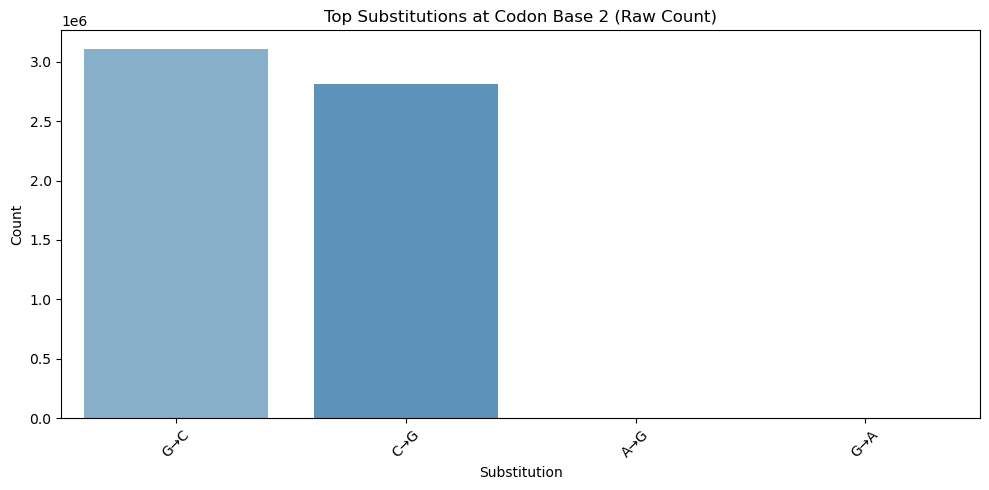

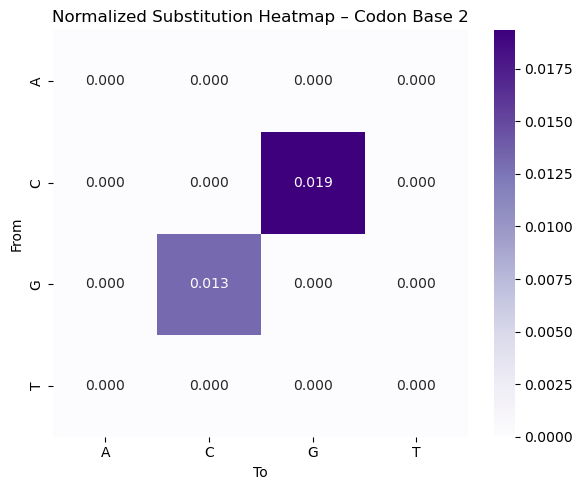

/tmp/ipykernel_1301561/2856317834.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sub_df.sort_values("count", ascending=False).head(15),


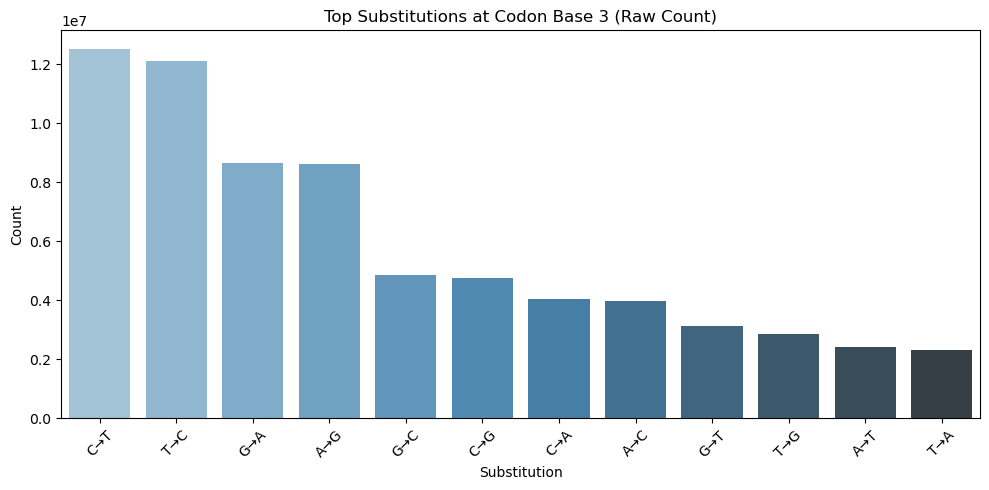

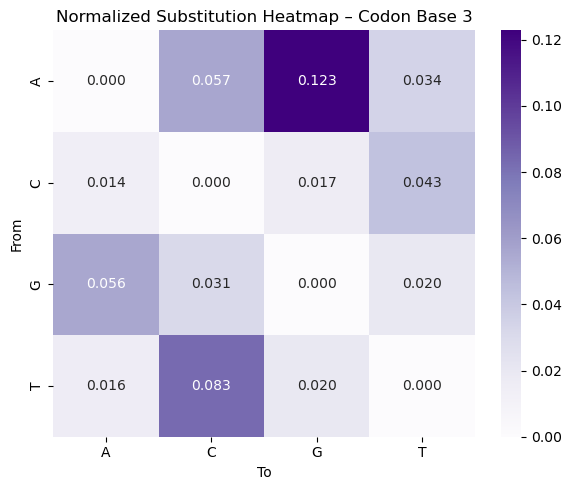

In [ ]:
for pos in [1, 2, 3]:
    sub_counter = substitution_by_position[pos]
    base_counter = base_occurrence_by_position[pos]

    # Build DataFrame
    data = []
    for (from_base, to_base), count in sub_counter.items():
        total_from = base_counter.get(from_base, 1)
        norm_freq = count / total_from
        data.append((from_base, to_base, count, norm_freq))

    sub_df = pd.DataFrame(data, columns=["from", "to", "count", "normalized"])
    sub_df["substitution"] = sub_df["from"] + "→" + sub_df["to"]

    # Plot top 15 by count
    plt.figure(figsize=(10, 5))
    sns.barplot(data=sub_df.sort_values("count", ascending=False).head(15),
                x="substitution", y="count", palette="Blues_d")
    plt.title(f"Top Substitutions at Codon Base {pos} (Raw Count)")
    plt.xlabel("Substitution")
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # Optional: Normalized heatmap
    bases = ["A", "C", "G", "T"]
    heatmap_df = pd.DataFrame(0.0, index=bases, columns=bases)

    for _, row in sub_df.iterrows():
        f, t, val = row["from"], row["to"], row["normalized"]
        if f in bases and t in bases:
            heatmap_df.loc[f, t] = val

    plt.figure(figsize=(6, 5))
    sns.heatmap(heatmap_df, annot=True, fmt=".3f", cmap="Purples")
    plt.title(f"Normalized Substitution Heatmap – Codon Base {pos}")
    plt.xlabel("To")
    plt.ylabel("From")
    plt.tight_layout()
    plt.show()


אין ביאס מונחה ריצוף - אין שגיאות ריצוף - אלא זו נגזרת של השכיחות של השינויים ברצף הקודונים בגנום.

#### V gene usage

How many different nucleotide sequences (nSeqCDR3) encode the same amino acid sequence (aaSeqCDR3), and how that varies across different V genes.

X-axis – V Genes
Each label (e.g., TRBV4-1, TRBV20-1, etc.) represents a unique V gene assigned to a clonotype.

Only V genes with at least a minimum number of observations are shown (you filtered out low-count ones with min_cdr3s_per_gene).

Y-axis – Number of NT Variants per AA
The number of distinct nucleotide sequences (nSeqCDR3) found per each amino acid CDR3.

So each point represents a single (V_gene, aaSeqCDR3) pair and how many codon variants it has.

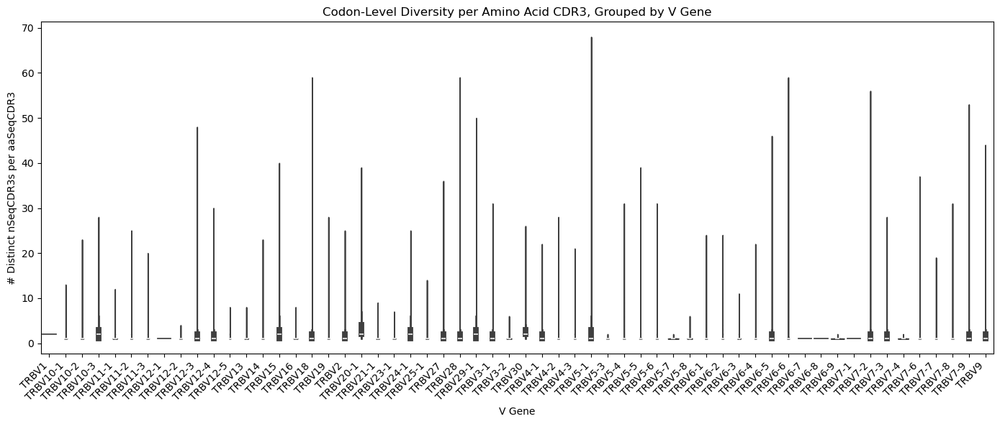

In [7]:
import re
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Filter to unique (aa, nt, gene) rows from diff-nt group
# gene_nt_df_v = diff_nt_df_filtered = clonotype_df[        ### why did i wrote "gene_nt_df_v = diff_nt_df_filtered = clonotype_df" ??
#     clonotype_df["aaSeqCDR3"].isin(diff_nt)
# ][["aaSeqCDR3", "nSeqCDR3", "allVHitsWithScore"]].dropna().drop_duplicates().copy()

gene_nt_df_v = clonotype_df[
    clonotype_df["aaSeqCDR3"].isin(diff_nt)
][["aaSeqCDR3", "nSeqCDR3", "allVHitsWithScore"]].dropna().drop_duplicates().copy()

gene_nt_df_v = gene_nt_df_v.drop_duplicates(subset=["aaSeqCDR3", "nSeqCDR3", "allVHitsWithScore"])

# Step 2: Extract first V gene using vectorized string ops
gene_nt_df_v["V_gene"] = (
    gene_nt_df_v["allVHitsWithScore"]
    .str.split(",").str[0]               # take first hit
    .str.extract(r"^([^*]+)")[0]         # extract before '*'
)

# Step 3: Count number of distinct NTs per AA CDR3 per V gene
diversity_df_v = (
    gene_nt_df_v.groupby(["V_gene", "aaSeqCDR3"])["nSeqCDR3"]
    .nunique()
    .reset_index(name="n_nt_variants")
)

# # Step 4: Optional - remove low-frequency V genes (fewer than N aaSeqCDR3s)
# min_cdr3s_per_gene = 10
# valid_genes = diversity_df["V_gene"].value_counts()[lambda x: x >= min_cdr3s_per_gene].index
# diversity_df = diversity_df[diversity_df["V_gene"].isin(valid_genes)]

# Step 5: Plot
plt.figure(figsize=(14, 6))
sns.violinplot(data=diversity_df_v, x="V_gene", y="n_nt_variants", inner="box", cut=0)
plt.xticks(rotation=45, ha="right")
plt.title("Codon-Level Diversity per Amino Acid CDR3, Grouped by V Gene")
plt.xlabel("V Gene")
plt.ylabel("# Distinct nSeqCDR3s per aaSeqCDR3")
plt.tight_layout()
plt.show()


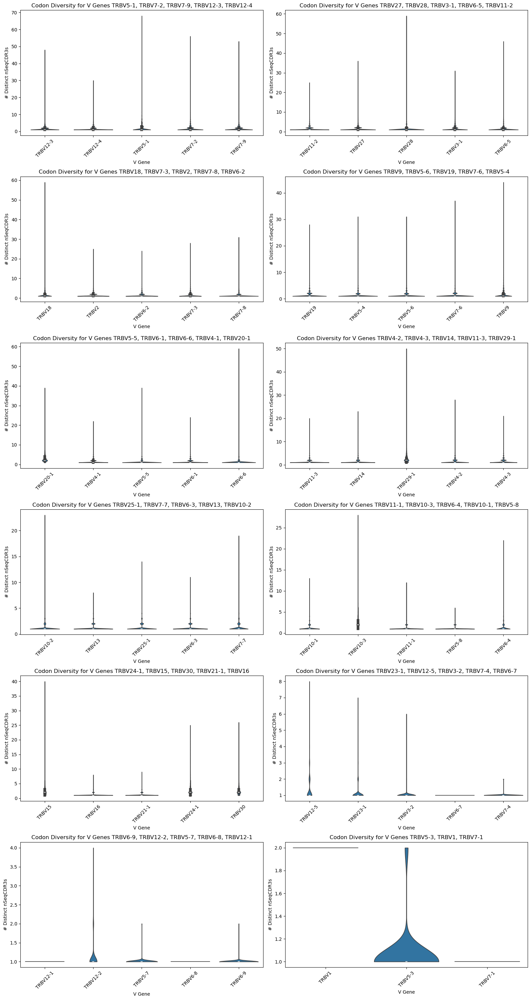

In [8]:
import math

# Step 1: Sort genes alphabetically or by frequency (you can change this)
v_genes_sorted = diversity_df_v["V_gene"].value_counts().index.tolist()

# Step 2: Split into chunks of 5 genes
chunk_size = 5
v_gene_chunks = [v_genes_sorted[i:i + chunk_size] for i in range(0, len(v_genes_sorted), chunk_size)]

# Step 3: Create subplots
n_chunks = len(v_gene_chunks)
n_cols = 2
n_rows = math.ceil(n_chunks / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 8, n_rows * 5), squeeze=False)

for idx, chunk in enumerate(v_gene_chunks):
    row, col = divmod(idx, n_cols)
    ax = axes[row][col]

    sns.violinplot(
        data=diversity_df_v[diversity_df_v["V_gene"].isin(chunk)],
        x="V_gene", y="n_nt_variants",
        inner="box", cut=0, ax=ax
    )
    ax.set_title(f"Codon Diversity for V Genes {', '.join(chunk)}")
    ax.set_xlabel("V Gene")
    ax.set_ylabel("# Distinct nSeqCDR3s")
    ax.tick_params(axis='x', rotation=45)

# Remove empty subplots if number isn't even
for i in range(n_chunks, n_rows * n_cols):
    fig.delaxes(axes[i // n_cols][i % n_cols])

plt.tight_layout()
plt.show()


/tmp/ipykernel_1301561/726708956.py:30: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


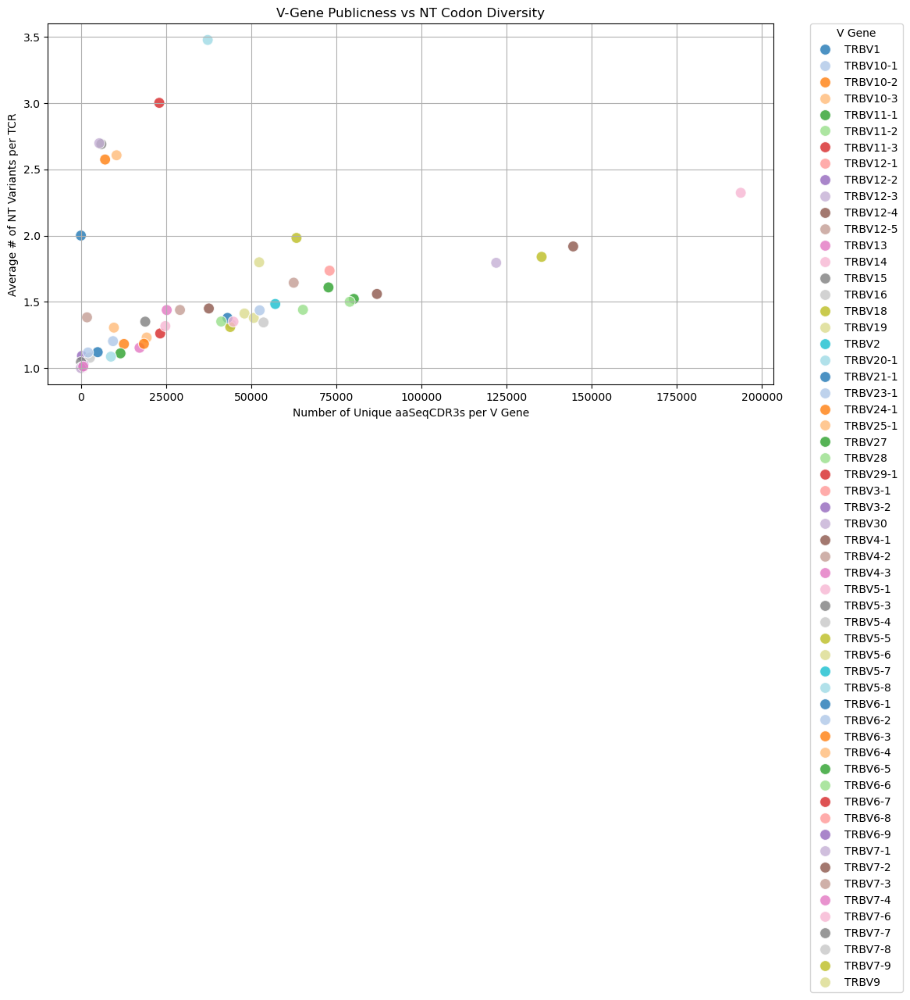

In [60]:
# Step 1: Aggregate V gene statistics
v_gene_summary = diversity_df_v.groupby("V_gene").agg(
    n_public_TCRs=("aaSeqCDR3", "nunique"),        # how many distinct TCRs use this V gene
    avg_nt_diversity=("n_nt_variants", "mean"),    # mean # of nt variants per TCR
    median_nt_diversity=("n_nt_variants", "median")
).reset_index()

# # Optional: filter out V genes with low sample size
# v_gene_summary = v_gene_summary[v_gene_summary["n_public_TCRs"] >= 5]

# Step 2: Scatter plot (publicness vs avg NT diversity)
plt.figure(figsize=(12, 6))
scatter = sns.scatterplot(
    data=v_gene_summary,
    x="n_public_TCRs",
    y="avg_nt_diversity",
    hue="V_gene",
    palette="tab20",
    s=100, alpha=0.8
)

plt.title("V-Gene Publicness vs NT Codon Diversity")
plt.xlabel("Number of Unique aaSeqCDR3s per V Gene")
plt.ylabel("Average # of NT Variants per TCR")
plt.grid(True)

# Move the legend outside the plot
plt.legend(title="V Gene", bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0.)

plt.tight_layout()
plt.show()

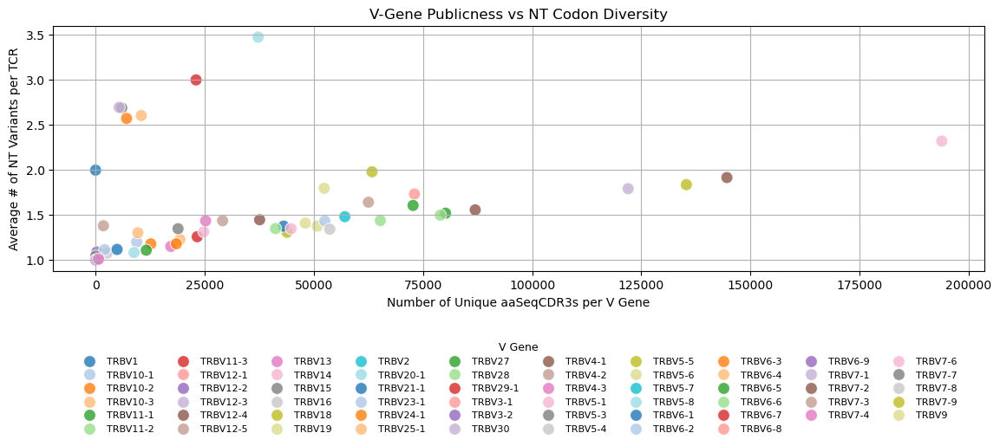

In [11]:
# Step 1: Aggregate V gene statistics
v_gene_summary = diversity_df_v.groupby("V_gene").agg(
    n_public_TCRs=("aaSeqCDR3", "nunique"),        # how many distinct TCRs use this V gene
    avg_nt_diversity=("n_nt_variants", "mean"),    # mean # of nt variants per TCR
    median_nt_diversity=("n_nt_variants", "median")
).reset_index()

plt.figure(figsize=(12, 6))
scatter = sns.scatterplot(
    data=v_gene_summary,
    x="n_public_TCRs",
    y="avg_nt_diversity",
    hue="V_gene",
    palette="tab20",
    s=100, alpha=0.8
)

plt.title("V-Gene Publicness vs NT Codon Diversity")
plt.xlabel("Number of Unique aaSeqCDR3s per V Gene")
plt.ylabel("Average # of NT Variants per TCR")
plt.grid(True)

# Legend below, not overlapping
plt.legend(
    title="V Gene",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.25),   # push further down
    ncol=10,                       # balanced grid
    fontsize=8,
    title_fontsize=9,
    frameon=False
)

# Add space for legend
plt.tight_layout(rect=[0, 0.05, 1, 1])   # leave extra 5% at bottom
plt.show()



avg_nt_diversity = sum of all unique TCR appearances divided by the number of unique TCRs for that v-gene.

the plot highlighted a group of v-genes that are "above" the corrolation plot. lets analyze them:

In [61]:
odd_v_genes = v_gene_summary[
    (v_gene_summary["n_public_TCRs"] < 50000) &
    (v_gene_summary["avg_nt_diversity"] >= 2.0)
]

# View or print them
print(odd_v_genes[["V_gene", "n_public_TCRs", "avg_nt_diversity"]])

      V_gene  n_public_TCRs  avg_nt_diversity
0      TRBV1              3          2.000000
3   TRBV10-3          10464          2.605887
14    TRBV15           6004          2.690373
19  TRBV20-1          37242          3.476371
22  TRBV24-1           7105          2.573962
26  TRBV29-1          23013          3.001564
29    TRBV30           5400          2.697037


Lets plot the logo for each of the groups (outliners and non-outliners v-genes)

In [3]:
outlier_v_genes = ["TRBV1", "TRBV10-3", "TRBV15", "TRBV20-1", "TRBV24-1", "TRBV29-1", "TRBV30"]

def extract_top_gene(series):
    cleaned = series.str.split(",").str[0]
    cleaned = cleaned.str.replace(r"\*00(\([^\)]*\))?", "*01", regex=True)
    cleaned = cleaned.str.split("*").str[0]
    return cleaned

# Copy to avoid modifying the original
cdr3_df = clonotype_df[["aaSeqCDR3", "allVHitsWithScore"]].dropna().copy()

cdr3_df["V_gene"] = extract_top_gene(cdr3_df["allVHitsWithScore"])
# Assign group label
cdr3_df["v_group"] = cdr3_df["V_gene"].apply(lambda x: "outlier" if x in outlier_v_genes else "non_outlier")


In [4]:
outlier_seqs = cdr3_df[cdr3_df["v_group"] == "outlier"]["aaSeqCDR3"].dropna().unique().tolist()
non_outlier_seqs = cdr3_df[cdr3_df["v_group"] == "non_outlier"]["aaSeqCDR3"].dropna().unique().tolist()

# Pad
all_seqs = outlier_seqs + non_outlier_seqs
max_len = max(len(s) for s in all_seqs)

def pad_sequences(seq_list, pad_char='-', max_length=30):
    # First truncate sequences if they exceed max_length
    trimmed = [s[:max_length] for s in seq_list]
    # Then pad if needed
    padded = [s.ljust(max_length, pad_char) for s in trimmed]
    # Sanity check
    lengths = [len(seq) for seq in padded]
    if len(set(lengths)) > 1:
        raise ValueError("Padding failed — sequences are still of different lengths.")
    return padded

outlier_aligned = pad_sequences(outlier_seqs)
non_outlier_aligned = pad_sequences(non_outlier_seqs)

Matplotlib is building the font cache; this may take a moment.


<Figure size 1200x300 with 0 Axes>

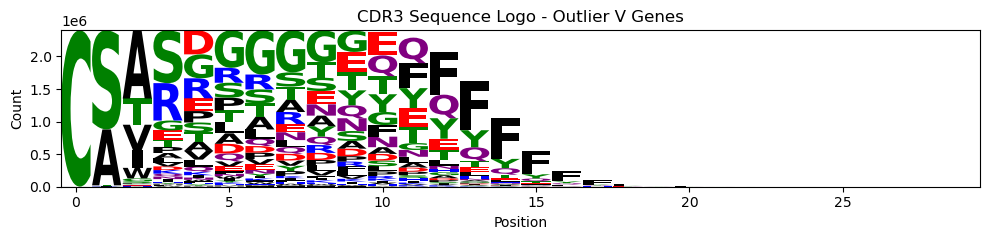

<Figure size 1200x300 with 0 Axes>

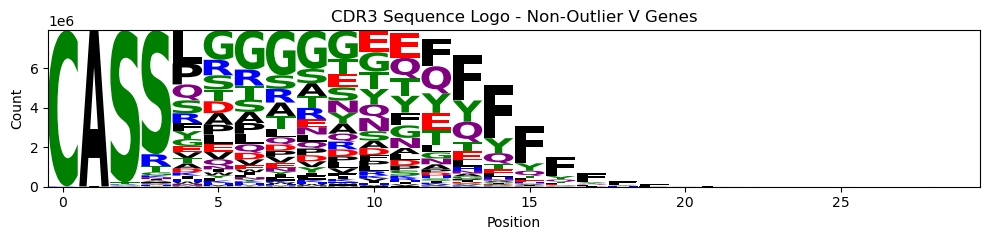

In [5]:
import logomaker
import matplotlib.pyplot as plt

def get_logo_df(seq_list):
    return logomaker.alignment_to_matrix(seq_list, to_type='counts')

def plot_logo(seq_list, title):
    logo_df = get_logo_df(seq_list)
    plt.figure(figsize=(12, 3))
    logomaker.Logo(logo_df, color_scheme='chemistry')
    plt.title(title)
    plt.xlabel("Position")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

# Plot
plot_logo(outlier_aligned, "CDR3 Sequence Logo - Outlier V Genes")
plot_logo(non_outlier_aligned, "CDR3 Sequence Logo - Non-Outlier V Genes")

In [6]:
cutoff_len = 25
outlier_trunc = [seq[:cutoff_len] for seq in outlier_aligned]
non_outlier_trunc = [seq[:cutoff_len] for seq in non_outlier_aligned]
outlier_df = logomaker.alignment_to_matrix(outlier_trunc, to_type='counts')
non_outlier_df = logomaker.alignment_to_matrix(non_outlier_trunc, to_type='counts')

outlier_freq = outlier_df.div(outlier_df.sum(axis=1), axis=0).fillna(0)
non_outlier_freq = non_outlier_df.div(non_outlier_df.sum(axis=1), axis=0).fillna(0)

corrs = outlier_freq.corrwith(non_outlier_freq, axis=1)
print(corrs.describe())

count    25.000000
mean      0.880562
std       0.266444
min      -0.069787
25%       0.924738
50%       0.988169
75%       0.999816
max       0.999998
dtype: float64


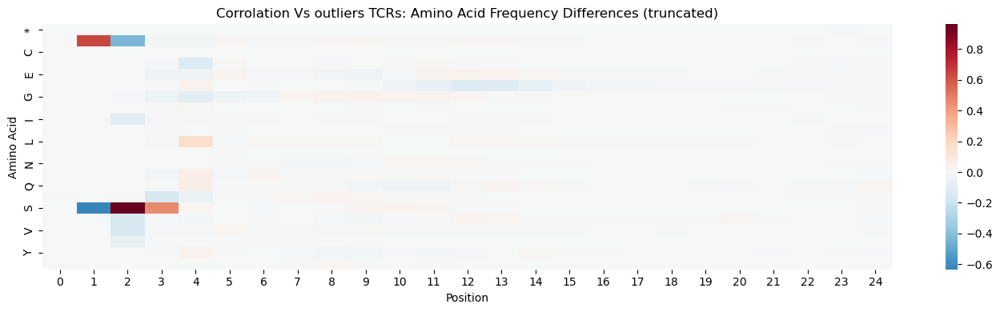

In [7]:
diff_matrix = non_outlier_freq - outlier_freq

# Plot again
plt.figure(figsize=(14, 4))
sns.heatmap(diff_matrix.T, cmap="RdBu_r", center=0)
plt.title("Corrolation Vs outliers TCRs: Amino Acid Frequency Differences (truncated)")
plt.xlabel("Position")
plt.ylabel("Amino Acid")
plt.tight_layout()
plt.show()

#### J Gene Usage

Now lets do the same for J-genes.

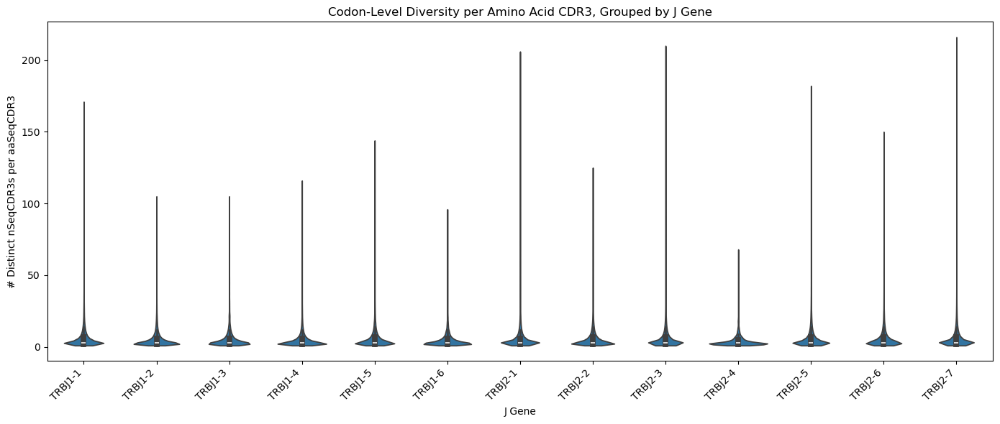

In [12]:
# Step 1: Create a filtered DataFrame with J gene info
gene_nt_df_j = clonotype_df[
    clonotype_df["aaSeqCDR3"].isin(diff_nt)
][["aaSeqCDR3", "nSeqCDR3", "allJHitsWithScore"]].dropna().drop_duplicates().copy()

# Step 2: Extract first J gene using fast vectorized method
gene_nt_df_j["J_gene"] = (
    gene_nt_df_j["allJHitsWithScore"]
    .str.split(",").str[0]               # take first hit
    .str.extract(r"^([^*]+)")[0]         # extract before '*'
)

# Step 3: Count distinct NTs per AA per J gene
diversity_df_j = (
    gene_nt_df_j.groupby(["J_gene", "aaSeqCDR3"])["nSeqCDR3"]
    .nunique()
    .reset_index(name="n_nt_variants")
)

# Step 4: Remove low-frequency genes for cleaner plot
min_cdr3s_per_gene = 10
valid_genes_j = diversity_df_j["J_gene"].value_counts()[lambda x: x >= min_cdr3s_per_gene].index
diversity_df_j = diversity_df_j[diversity_df_j["J_gene"].isin(valid_genes_j)]

# Step 5: Plot
plt.figure(figsize=(14, 6))
sns.violinplot(data=diversity_df_j, x="J_gene", y="n_nt_variants", inner="box", cut=0)
plt.xticks(rotation=45, ha="right")
plt.title("Codon-Level Diversity per Amino Acid CDR3, Grouped by J Gene")
plt.xlabel("J Gene")
plt.ylabel("# Distinct nSeqCDR3s per aaSeqCDR3")
plt.tight_layout()
plt.show()


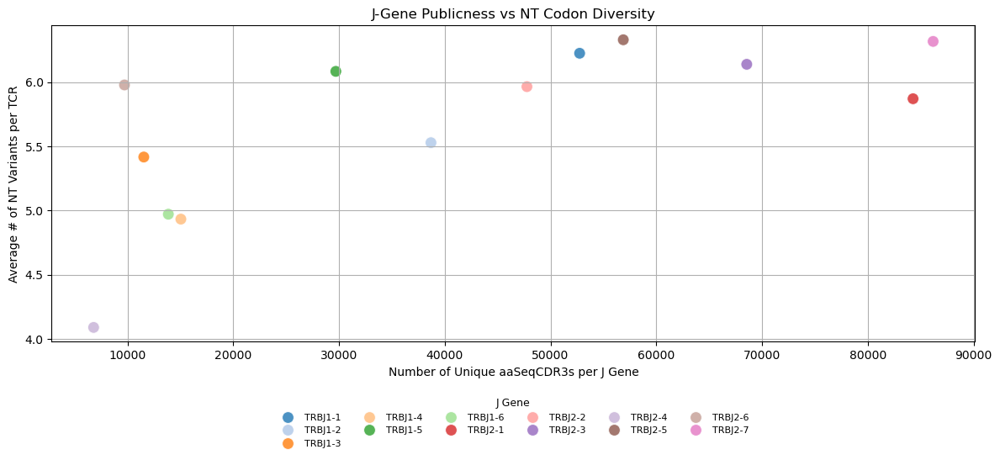

In [15]:
# Summary: average NT variants per J gene + publicness (# of TCRs)
j_gene_summary = (
    diversity_df_j.groupby("J_gene")
    .agg(
        avg_nt_diversity=("n_nt_variants", "mean"),
        n_public_TCRs=("aaSeqCDR3", "count")
    )
    .reset_index()
)

plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=j_gene_summary,
    x="n_public_TCRs",
    y="avg_nt_diversity",
    hue="J_gene",
    palette="tab20",
    s=100,
    alpha=0.8
)

plt.title("J-Gene Publicness vs NT Codon Diversity")
plt.xlabel("Number of Unique aaSeqCDR3s per J Gene")
plt.ylabel("Average # of NT Variants per TCR")
plt.grid(True)

# Legend below, compact, transparent background
plt.legend(
    title="J Gene",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.15),   # push below x-axis
    ncol=6,                        # fewer J genes → ~6 per row looks good
    fontsize=8,
    title_fontsize=9,
    frameon=False
)

# Leave space for legend
plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()

### Codon frequencies across groups

for now lets focus on TCRs with publicity of >=2

In [16]:
# Step 1: Start from your existing filtered DataFrame
diff_nt_df_filtered_codons = clonotype_df[
    clonotype_df["aaSeqCDR3"].isin(diff_nt)
][["aaSeqCDR3", "nSeqCDR3", "Sample_ID", "group"]].dropna().drop_duplicates().copy()

# Step 2: Count how many samples each aaSeqCDR3 appears in per group
group_counts = (
    diff_nt_df_filtered_codons.groupby(["aaSeqCDR3", "group"])["Sample_ID"]
    .nunique()
    .unstack(fill_value=0)  # columns: fast | slow
)

# Step 3: Filter for those with ≥2 appearances in both fast and slow
public_aa = group_counts[
    (group_counts.get("fast", 0) >= 2) & (group_counts.get("slow", 0) >= 2)
].index

# Step 4: Filter the main dataframe to just those public aaSeqCDR3s
filtered_codon_df = diff_nt_df_filtered_codons[
    diff_nt_df_filtered_codons["aaSeqCDR3"].isin(public_aa)
].copy()


In [68]:
filtered_codon_df.columns

Index(['aaSeqCDR3', 'nSeqCDR3', 'Sample_ID', 'group'], dtype='object')

In [17]:
from collections import Counter

# Step 1: Filter rows where codon length matches AA length
filtered_codon_df["cdr3_len"] = filtered_codon_df["aaSeqCDR3"].str.len()
filtered_codon_df = filtered_codon_df[filtered_codon_df["nSeqCDR3"].str.len() == filtered_codon_df["cdr3_len"] * 3].copy()

# Step 2: Build codon-to-AA position mapping
codon_records = []

for idx, row in filtered_codon_df.iterrows():
    aa_seq = row["aaSeqCDR3"]
    nt_seq = row["nSeqCDR3"]
    group = row["group"]

    for i in range(len(aa_seq)):
        codon = nt_seq[i*3 : i*3+3]
        aa = aa_seq[i]
        codon_records.append({
            "AA": aa,
            "Position": i + 1,  # 1-based position
            "Codon": codon,
            "Group": group
        })

# Step 3: Convert to DataFrame
codon_df = pd.DataFrame(codon_records)

# # Step 4: Count codon usage
# codon_counts = (
#     codon_df.groupby(["AA", "Position", "Codon", "Group"])
#     .size()
#     .reset_index(name="Count")
# )

# # Optional: pivot for easy fast vs slow comparison
# codon_pivot = codon_counts.pivot_table(
#     index=["AA", "Position", "Codon"],
#     columns="Group",
#     values="Count",
#     fill_value=0
# ).reset_index()

# # Add log2 fold change (optional)
# codon_pivot["log2FC_fast_vs_slow"] = np.log2((codon_pivot.get("fast", 0) + 1) / (codon_pivot.get("slow", 0) + 1))


In [18]:
# Step 4: Count raw codon usage
codon_counts = (
    codon_df.groupby(["AA", "Position", "Codon", "Group"])
    .size()
    .reset_index(name="Count")
)

# Step 5: Normalize counts within each group
group_totals = codon_counts.groupby("Group")["Count"].transform("sum")
codon_counts["Normalized"] = codon_counts["Count"] / group_totals

# Step 6: Pivot normalized values for comparison
codon_pivot = codon_counts.pivot_table(
    index=["AA", "Position", "Codon"],
    columns="Group",
    values="Normalized",
    fill_value=0
).reset_index()

# Step 7: Add normalized log2 fold change
codon_pivot["log2FC_fast_vs_slow"] = np.log2(
    (codon_pivot.get("fast", 0) + 1e-9) / (codon_pivot.get("slow", 0) + 1e-9)
)

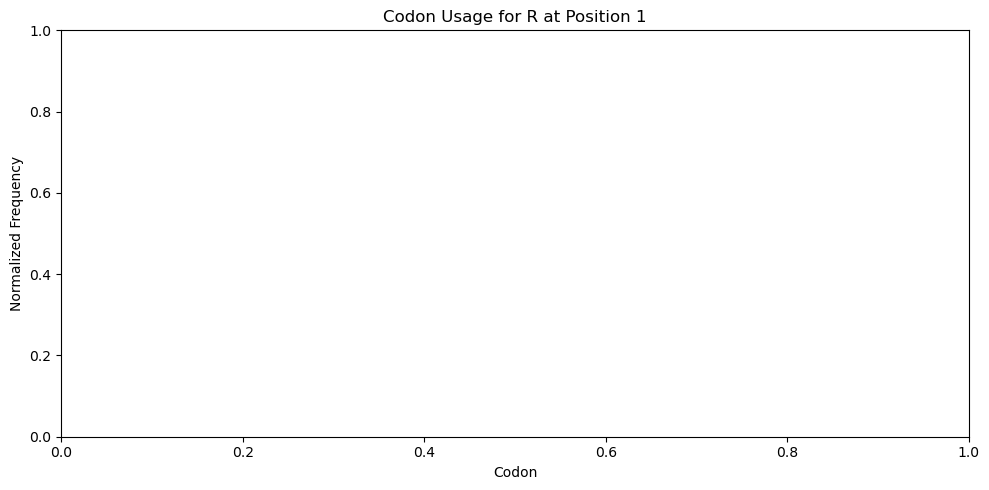

In [71]:
# --- Filter for specific AA and position ---
aa_of_interest = "R"        # e.g., Arginine
pos_of_interest = 1         # position index (1-based)

codon_subset = codon_counts[
    (codon_counts["AA"] == aa_of_interest) &
    (codon_counts["Position"] == pos_of_interest)
].copy()

# --- Normalize within group (optional, for fair comparison) ---
codon_subset["norm_count"] = codon_subset.groupby("Group")["Count"].transform(lambda x: x / x.sum())

# --- Plot ---
plt.figure(figsize=(10, 5))
sns.barplot(
    data=codon_subset,
    x="Codon",
    y="norm_count",
    hue="Group",
    palette="Set2"
)
plt.title(f"Codon Usage for {aa_of_interest} at Position {pos_of_interest}")
plt.ylabel("Normalized Frequency")
plt.xlabel("Codon")
plt.tight_layout()
plt.show()


now lets group them by their amino acid, across all available positions.
positive (normelized by total TCR amino acid counts [sum of all nt permutations for that amino acid]) indicated more frequent in fast group. negative - in slow group.

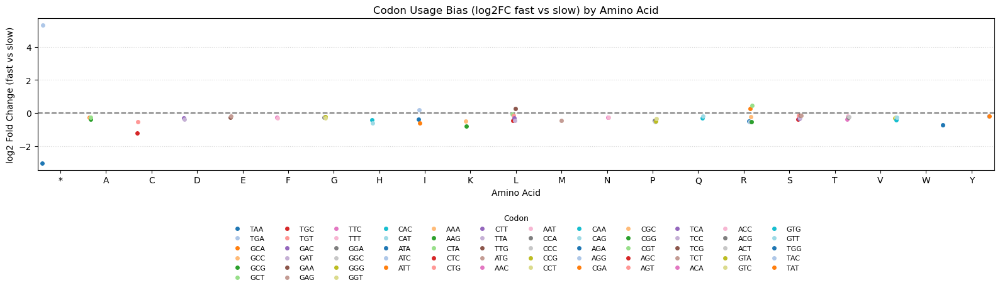

In [19]:
# Aggregate log2FC by AA and Codon
aa_grouped = codon_pivot.groupby(["AA", "Codon"], as_index=False).agg({
    "log2FC_fast_vs_slow": "mean"
})

# Sort amino acids for consistent plotting
aa_order = sorted(aa_grouped["AA"].unique())

# # Plot
# plt.figure(figsize=(16, 6))
# sns.stripplot(
#     data=aa_grouped,
#     x="AA",
#     y="log2FC_fast_vs_slow",
#     hue="Codon",
#     dodge=True,
#     palette="tab20",
#     jitter=True
# )
# plt.axhline(0, color="gray", linestyle="--")
# plt.title("Codon Usage Bias (log2FC fast vs slow) by Amino Acid")
# plt.ylabel("log2 Fold Change (fast vs slow)")
# plt.xlabel("Amino Acid")
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Codon")
# plt.tight_layout()
# plt.show()

plt.figure(figsize=(16, 6))
sns.stripplot(
    data=aa_grouped,
    x="AA",
    y="log2FC_fast_vs_slow",
    hue="Codon",
    dodge=True,
    palette="tab20",
    jitter=True
)
plt.axhline(0, color="gray", linestyle="--")
plt.title("Codon Usage Bias (log2FC fast vs slow) by Amino Acid")
plt.ylabel("log2 Fold Change (fast vs slow)")
plt.xlabel("Amino Acid")
plt.grid(True, axis="y", linestyle=":", alpha=0.5)

# Legend below in multiple columns (adjust ncol as needed)
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(
    handles=handles, labels=labels,
    title="Codon",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.25),   # push below x-axis
    ncol=12,                       # ~12 per row; tweak for your width
    fontsize=8,
    title_fontsize=9,
    frameon=False                  # transparent
)

# Leave space for legend so it doesn't overlap/crop
plt.tight_layout(rect=[0, 0.12, 1, 1])  # reserve ~12% bottom margin
plt.show()


Remmember that values above are for the same amino acid across ALL positions, so nt values can be all positive (or negative).

/tmp/ipykernel_1301561/1878626892.py:22: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


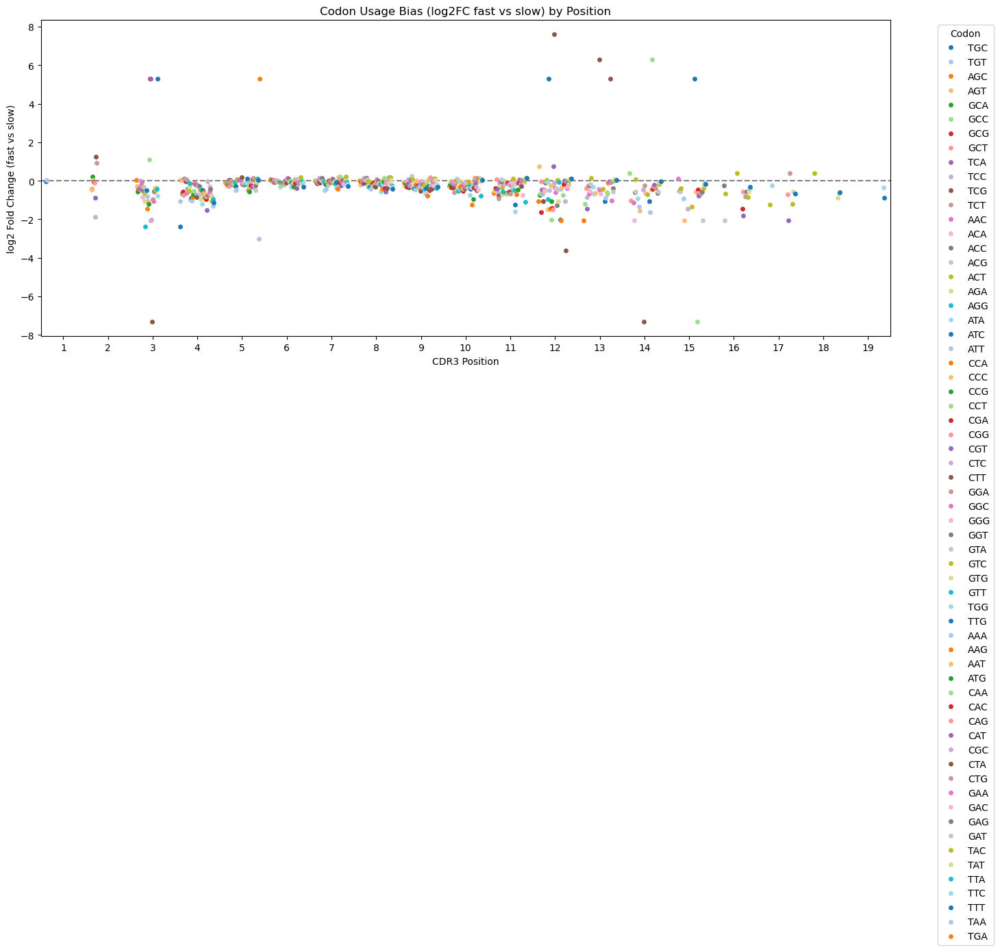

In [73]:
# Aggregate log2FC by Position and Codon
pos_grouped = codon_pivot.groupby(["Position", "Codon"], as_index=False).agg({
    "log2FC_fast_vs_slow": "mean"
})

# Plot
plt.figure(figsize=(16, 6))
sns.stripplot(
    data=pos_grouped,
    x="Position",
    y="log2FC_fast_vs_slow",
    hue="Codon",
    dodge=True,
    palette="tab20",
    jitter=True
)
plt.axhline(0, color="gray", linestyle="--")
plt.title("Codon Usage Bias (log2FC fast vs slow) by Position")
plt.ylabel("log2 Fold Change (fast vs slow)")
plt.xlabel("CDR3 Position")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Codon")
plt.tight_layout()
plt.show()


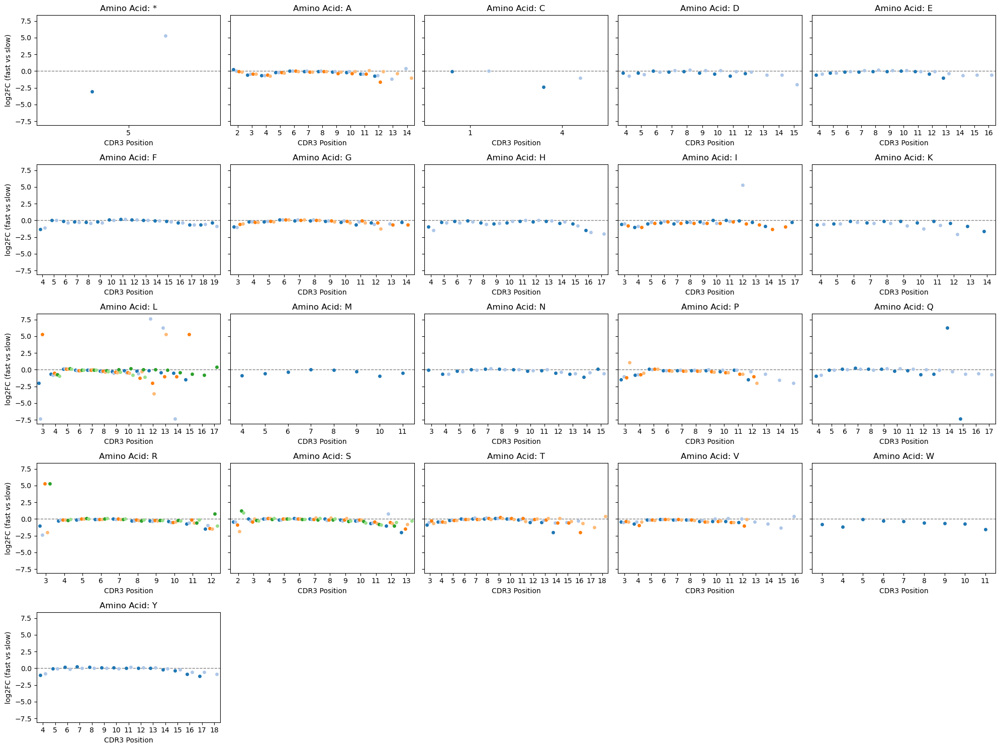

In [74]:
# Make sure codon_pivot exists and has needed columns
assert {"AA", "Position", "Codon", "log2FC_fast_vs_slow"}.issubset(codon_pivot.columns)

# Unique amino acids
amino_acids = sorted(codon_pivot["AA"].unique())

# Set up plot grid
n_cols = 5
n_rows = (len(amino_acids) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharey=True)
axes = axes.flatten()

# Plot each AA separately
for i, aa in enumerate(amino_acids):
    ax = axes[i]
    aa_data = codon_pivot[codon_pivot["AA"] == aa]

    sns.stripplot(
        data=aa_data,
        x="Position",
        y="log2FC_fast_vs_slow",
        hue="Codon",
        dodge=True,
        jitter=True,
        palette="tab20",
        ax=ax,
        legend=False
    )
    ax.axhline(0, color="gray", linestyle="--", linewidth=1)
    ax.set_title(f"Amino Acid: {aa}")
    ax.set_xlabel("CDR3 Position")
    ax.set_ylabel("log2FC (fast vs slow)")

# Hide unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

מתכתב עם - אחרי שראינו את הלוגו - שבמרכז הרצפים יש וריביליות גבוהה ולכן רואים כמויות ביטוי שוות וייצוג שווה של כל אחד מהקודונים.

אם נניח הייתי צריך לייצג את S במרכז בצורה שמורה, הייתה העדפה לייצוג מסוים של אחד הקודונים.

## Housekeeping Genes

First run above code section, to create clonotype_df which contains: "aaSeqCDR3", "Sample_ID", "readCount".

Calculate frequency per clonotype per sample.

In [39]:
# Sum read counts per clonotype per sample
per_sample_freq = (
    clonotype_df.groupby(["aaSeqCDR3", "Sample_ID"])["readCount"]
    .sum()
    .reset_index()
)

# Normalize by total reads per sample
total_reads = clonotype_df.groupby("Sample_ID")["readCount"].sum().reset_index(name="total_reads")
per_sample_freq = per_sample_freq.merge(total_reads, on="Sample_ID")
per_sample_freq["frequency"] = per_sample_freq["readCount"] / per_sample_freq["total_reads"]

# Add group info (fast/slow) based on time threshold
per_sample_freq = per_sample_freq.merge(meta_df, on="Sample_ID", how="left")
per_sample_freq["group"] = per_sample_freq["extraction_time"].apply(
    lambda x: "fast" if x <= time_threshold else "slow"
)


In [40]:
def count_surviving_tcrs(
    per_sample_freq,
    presence_thresh=2,
    freq_thresh=1e-4, # 0.01%
    max_cv_thresh=1.0,
    max_abs_log2fc=1.0,
    use_presence=True,
    use_frequency=True,
    use_cv=True,
    use_log2fc=True,
):
    # Add group info if not already present
    if "group" not in per_sample_freq.columns:
        raise ValueError("Missing 'group' column. Please annotate 'fast'/'slow' groups first.")
    
    # Get clonotypes that appear in both fast and slow groups
    grouped = per_sample_freq.groupby(["aaSeqCDR3", "group"])["Sample_ID"].nunique().unstack(fill_value=0)
    shared_clones = grouped[(grouped["fast"] > 0) & (grouped["slow"] > 0)].index
    df = per_sample_freq[per_sample_freq["aaSeqCDR3"].isin(shared_clones)]

    # Compute summary stats per clonotype in slow group
    slow_df = df[df["group"] == "slow"]
    fast_df = df[df["group"] == "fast"]
    
    grouped_stats = slow_df.groupby("aaSeqCDR3")["frequency"].agg(
        n_samples="count",
        mean_freq="mean",
        std_freq="std"
    )
    grouped_stats["cv"] = grouped_stats["std_freq"] / grouped_stats["mean_freq"]

    # Compute mean frequency in fast group
    mean_fast = fast_df.groupby("aaSeqCDR3")["frequency"].mean()
    grouped_stats["mean_freq_fast"] = grouped_stats.index.map(mean_fast.to_dict())

    # Compute log2 fold change
    grouped_stats["log2FC"] = np.log2((grouped_stats["mean_freq"] + 1e-9) / (grouped_stats["mean_freq_fast"] + 1e-9))

    # Apply filters
    conditions = []
    if use_presence:
        conditions.append(grouped_stats["n_samples"] >= presence_thresh)
    if use_frequency:
        conditions.append(grouped_stats["mean_freq"] >= freq_thresh)
    if use_cv:
        conditions.append(grouped_stats["cv"] <= max_cv_thresh)
    if use_log2fc:
        conditions.append(grouped_stats["log2FC"].abs() <= max_abs_log2fc)

    if conditions:
        all_conditions = np.logical_and.reduce(conditions)
        surviving_clones = grouped_stats[all_conditions]
    else:
        surviving_clones = grouped_stats.copy()

    print(f"Number of surviving TCRs: {len(surviving_clones)}")
    return surviving_clones.reset_index()

In [41]:
survivors = count_surviving_tcrs(
    per_sample_freq,
    presence_thresh=3,
    freq_thresh=1e-4,
    max_cv_thresh=0.5,
    max_abs_log2fc=1.0,
    use_presence=True,
    use_frequency=False,
    use_cv=False,
    use_log2fc=False
)


Number of surviving TCRs: 58949


In [59]:
type(survivors)

pandas.core.frame.DataFrame

Control group ideas:
- Option 1: Slow group TCRs in only 1–2 samples
Why it works:
These are TCRs that failed your survivor filter (didn't appear in enough samples).
They’re likely more sensitive to degradation or sequencing dropout.
Comparing to survivors may help reveal what features allow some TCRs to persist across samples.
How to use:
Filter slow group to CDR3s in exactly 1 or 2 samples.
Match length range (≤20 AAs).
You can optionally downsample to match the number of TCRs in survivors (for fairness). 

- Option 2: All fast group TCRs that appear in ≥3 samples (your current comparison)
Why it helps:
These TCRs are not degraded (fast extraction).
If survivors differ from these, it might be due to resilience under degradation, rather than just sample-sharing bias.
Limitation:
Fast and slow group donors might be biologically different.
This tells you what survives degradation, but not necessarily what’s public or shared.

- Option 3: Slow TCRs in ≥3 samples that are not in fast group
Earlier you saw 904 TCRs in slow (≥3 samples) that didn’t appear in fast. They are:
Less public.
Maybe artifacts.
Maybe degraded in fast samples (i.e., didn't survive)
This is a minimal control group, but interesting.

- Option 4: Matched control via propensity scoring
If you want to get rigorous, you can build a matched control group:
Match on total frequency, length, V gene usage, etc.
Survivors vs. matched nonsurvivors.
Helps isolate effect of variables like motif, hydrophobicity, etc.



Lets implement option 1:

In [42]:
# Count how many samples each TCR appears in (slow group)
slow_counts = per_sample_freq[per_sample_freq["group"] == "slow"]
slow_sample_counts = slow_counts.groupby("aaSeqCDR3")["Sample_ID"].nunique().reset_index(name="n_samples")

# Filter to 1–2 samples only
nonsurvivor_tcrs = slow_sample_counts[slow_sample_counts["n_samples"].between(1, 2)]["aaSeqCDR3"]


option 2:

In [43]:
# Filter to fast group
fast_group = per_sample_freq[per_sample_freq["group"] == "fast"]

# Count in how many fast samples each TCR appears
fast_sample_counts = fast_group.groupby("aaSeqCDR3")["Sample_ID"].nunique().reset_index(name="n_samples")

# Select TCRs present in ≥3 fast samples
fast_3plus_tcrs = fast_sample_counts[fast_sample_counts["n_samples"] >= 3]["aaSeqCDR3"]

# Get unique CDR3 sequences from fast group (≥3 samples)
fast_control_cdr3s = fast_group[fast_group["aaSeqCDR3"].isin(fast_3plus_tcrs)]["aaSeqCDR3"].drop_duplicates()


###  CDR3 Length Distribution

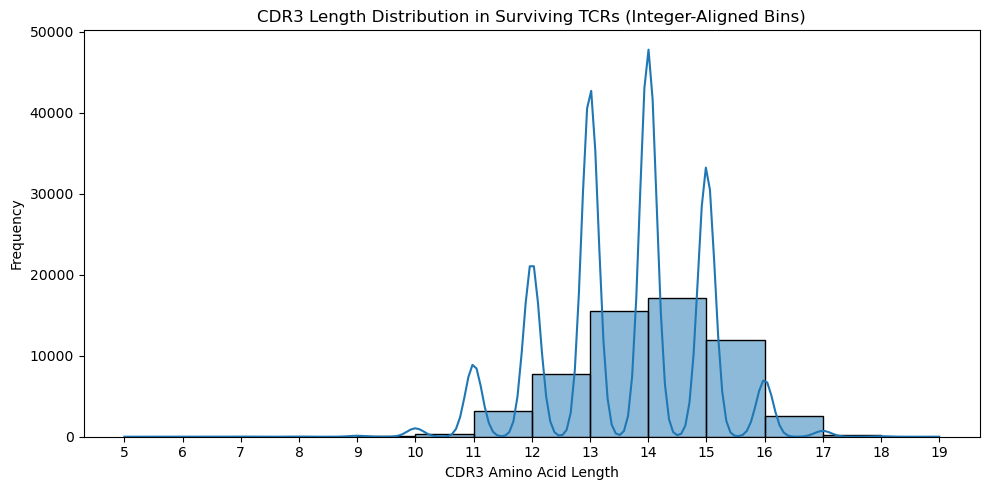

In [81]:
survivors["cdr3_length"] = survivors["aaSeqCDR3"].str.len()

plt.figure(figsize=(10, 5))
sns.histplot(
    survivors["cdr3_length"],
    bins=np.arange(survivors["cdr3_length"].min(), survivors["cdr3_length"].max() + 1),
    kde=True,
    edgecolor="black"
)
plt.xticks(ticks=np.arange(survivors["cdr3_length"].min(), survivors["cdr3_length"].max() + 1))
plt.xlabel("CDR3 Amino Acid Length")
plt.ylabel("Frequency")
plt.title("CDR3 Length Distribution in Surviving TCRs (Integer-Aligned Bins)")
plt.tight_layout()
plt.show()


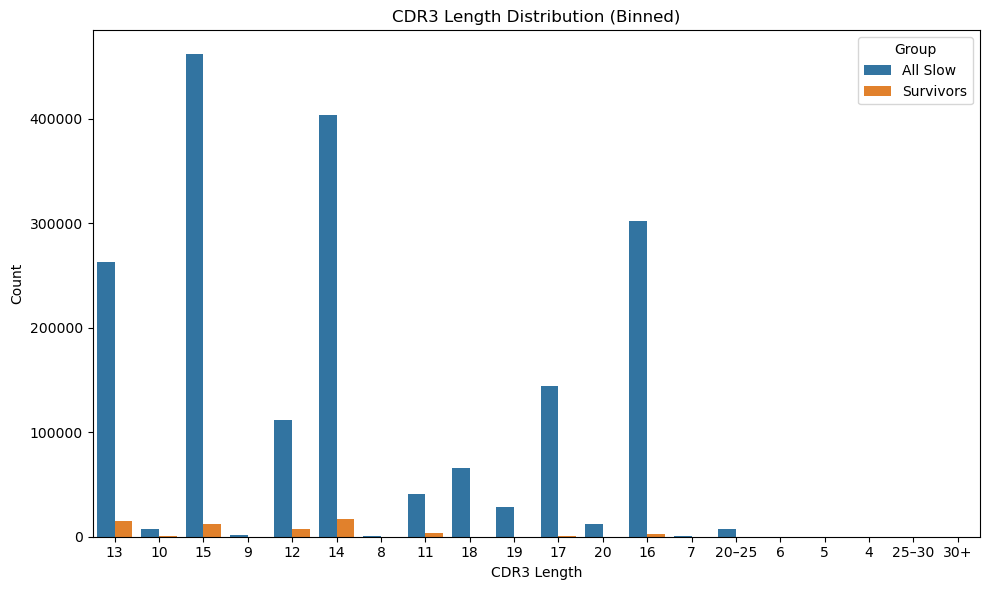

In [82]:
# Create capped length column for all slow CDR3s
def cap_length(l):
    if l <= 20:
        return str(l)
    elif l <= 25:
        return "20–25"
    elif l <= 30:
        return "25–30"
    else:
        return "30+"

# Apply transformation
all_slow_lengths = per_sample_freq[per_sample_freq["group"] == "slow"]["aaSeqCDR3"].drop_duplicates().str.len()
all_slow_bins = all_slow_lengths.map(cap_length)
survivor_bins = survivors["cdr3_length"].map(cap_length)

# Create count DataFrames
bin_df = pd.DataFrame({
    "CDR3 Length Bin": pd.concat([all_slow_bins, survivor_bins], ignore_index=True),
    "Group": ["All Slow"] * len(all_slow_bins) + ["Survivors"] * len(survivor_bins)
})

# Plot
plt.figure(figsize=(10, 6))
sns.countplot(data=bin_df, x="CDR3 Length Bin", hue="Group")
plt.title("CDR3 Length Distribution (Binned)")
plt.xlabel("CDR3 Length")
plt.ylabel("Count")
plt.tight_layout()
plt.show()


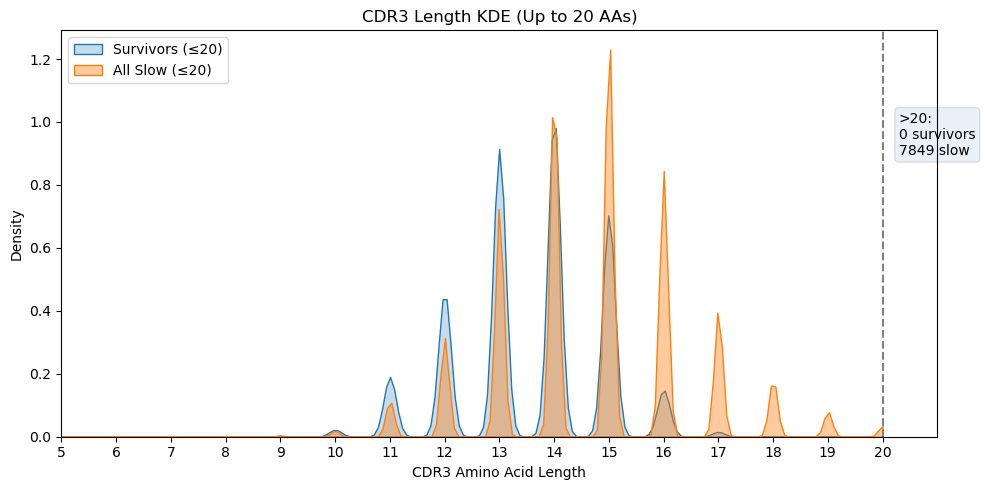

In [83]:
# Filter lengths ≤ 20 for KDE
survivor_kde = survivors[survivors["cdr3_length"] <= 20]["cdr3_length"]
slow_kde = all_slow_lengths[all_slow_lengths <= 20]

# Plot KDE
plt.figure(figsize=(10, 5))
sns.kdeplot(survivor_kde, label="Survivors (≤20)", fill=True, bw_adjust=0.8, clip=(0, 20))
sns.kdeplot(slow_kde, label="All Slow (≤20)", fill=True, alpha=0.4, bw_adjust=0.8, clip=(0, 20))

# Force integer ticks
plt.xticks(ticks=np.arange(5, 21, 1))  # adjust range if needed
plt.xlim(5, 21)

# Tail annotation
tail_survivors = (survivors["cdr3_length"] > 20).sum()
tail_allslow = (all_slow_lengths > 20).sum()
plt.axvline(20, color="gray", linestyle="--")
plt.text(20.3, plt.ylim()[1]*0.8, f">20:\n{tail_survivors} survivors\n{tail_allslow} slow",
         fontsize=10, va="top", bbox=dict(boxstyle="round", alpha=0.1))

plt.title("CDR3 Length KDE (Up to 20 AAs)")
plt.xlabel("CDR3 Amino Acid Length")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()


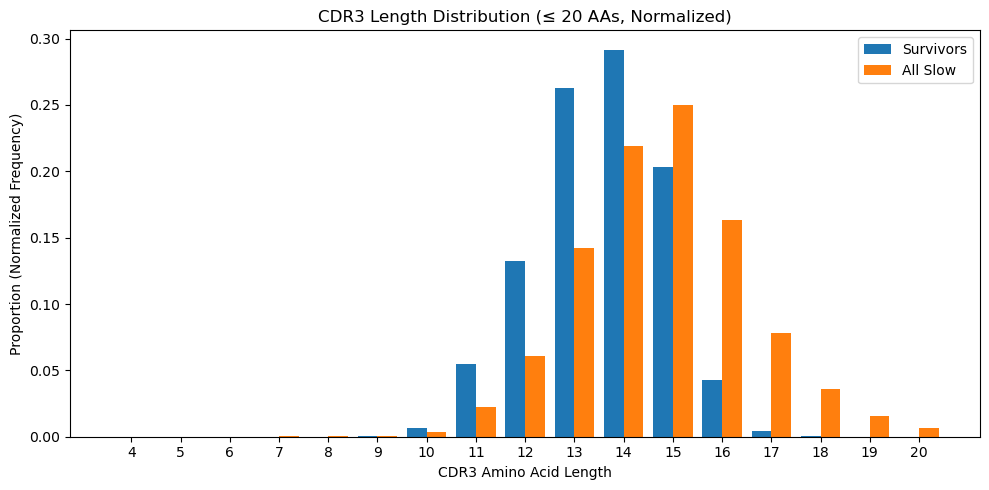

In [84]:
# Filter to lengths ≤ 20
survivor_lengths = survivors[survivors["cdr3_length"] <= 20]["cdr3_length"]
slow_lengths = all_slow_lengths[all_slow_lengths <= 20]

# Combine into one DataFrame
length_df = pd.concat([
    pd.DataFrame({"cdr3_length": survivor_lengths, "Group": "Survivors"}),
    pd.DataFrame({"cdr3_length": slow_lengths, "Group": "All Slow"})
])

# Count CDR3 lengths per group
length_counts = (
    length_df
    .groupby(["Group", "cdr3_length"])
    .size()
    .reset_index(name="count")
)

# Normalize within each group
length_counts["proportion"] = length_counts.groupby("Group")["count"].transform(lambda x: x / x.sum())

# Pivot for plotting
length_pivot = length_counts.pivot(index="cdr3_length", columns="Group", values="proportion").fillna(0)

# Plot
plt.figure(figsize=(10, 5))
bar_width = 0.4
x = np.arange(length_pivot.index.min(), length_pivot.index.max() + 1)

# Align values with available lengths
survivor_vals = length_pivot["Survivors"].reindex(x, fill_value=0)
slow_vals = length_pivot["All Slow"].reindex(x, fill_value=0)

plt.bar(x - bar_width/2, survivor_vals, width=bar_width, label="Survivors")
plt.bar(x + bar_width/2, slow_vals, width=bar_width, label="All Slow")

plt.xticks(ticks=x)
plt.xlabel("CDR3 Amino Acid Length")
plt.ylabel("Proportion (Normalized Frequency)")
plt.title("CDR3 Length Distribution (≤ 20 AAs, Normalized)")
plt.legend()
plt.tight_layout()
plt.show()


In [85]:
# Count unique TCRs (aaSeqCDR3) with CDR3 length ≤ 20 in each group
n_survivors = survivors[survivors["cdr3_length"] <= 20]["aaSeqCDR3"].nunique()
n_allslow = all_slow_lengths[all_slow_lengths <= 20].shape[0]

print(f"Number of surviving TCRs (length ≤ 20): {n_survivors}, Any length: {survivors['aaSeqCDR3'].nunique()}")
print(f"Number of all slow TCRs (length ≤ 20): {n_allslow}, Any length: {all_slow_lengths.shape[0]}")


Number of surviving TCRs (length ≤ 20): 58949, Any length: 58949
Number of all slow TCRs (length ≤ 20): 1844856, Any length: 1852705


can we infer from above plot that survivors TCRs tend to be shorter, or my criterion (>= 3 samples) caused it? lets check.

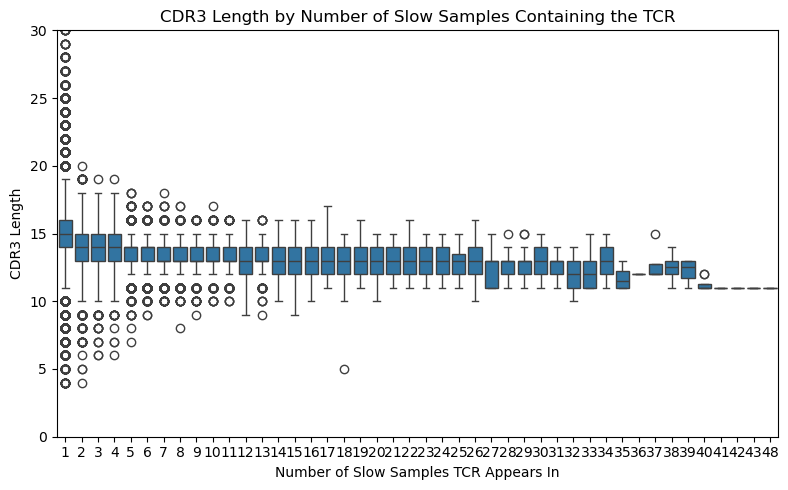

In [86]:
# Count in how many slow samples each TCR appears
slow_group = per_sample_freq[per_sample_freq["group"] == "slow"]
cdr3_sample_counts = slow_group.groupby("aaSeqCDR3")["Sample_ID"].nunique().reset_index(name="n_samples")

# Merge with length info
cdr3_sample_counts["cdr3_length"] = cdr3_sample_counts["aaSeqCDR3"].str.len()

# Plot: Number of samples vs CDR3 length
plt.figure(figsize=(8, 5))
sns.boxplot(data=cdr3_sample_counts, x="n_samples", y="cdr3_length")
plt.title("CDR3 Length by Number of Slow Samples Containing the TCR")
plt.xlabel("Number of Slow Samples TCR Appears In")
plt.ylabel("CDR3 Length")
plt.tight_layout()
plt.ylim(0, 30)
plt.show()


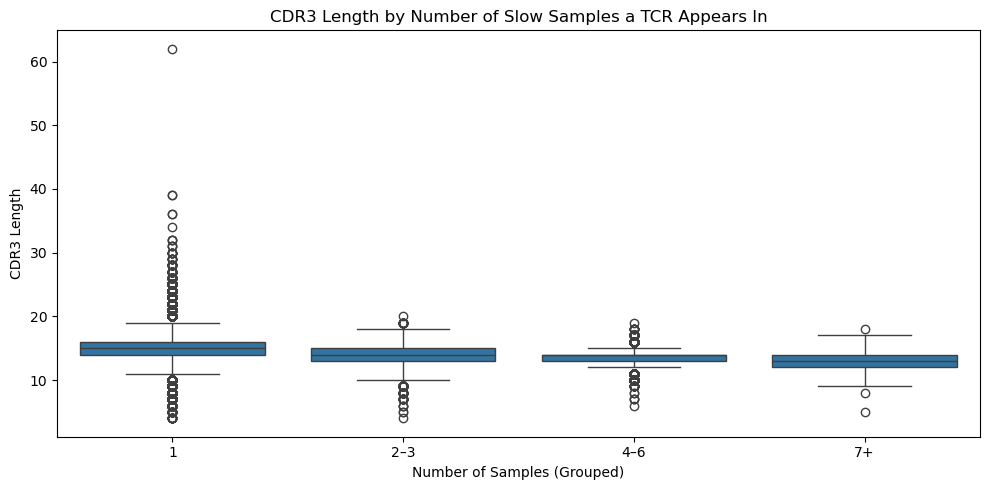

In [87]:
# Step 1: Count in how many slow samples each TCR appears
slow_group = per_sample_freq[per_sample_freq["group"] == "slow"]
cdr3_counts = (
    slow_group.groupby("aaSeqCDR3")["Sample_ID"]
    .nunique()
    .reset_index(name="n_samples")
)

# Step 2: Add CDR3 length
cdr3_counts["cdr3_length"] = cdr3_counts["aaSeqCDR3"].str.len()

# Step 3: Assign to bins based on number of samples
def bin_sample_count(n):
    if n == 1:
        return "1"
    elif n <= 3:
        return "2–3"
    elif n <= 6:
        return "4–6"
    else:
        return "7+"

cdr3_counts["sample_bin"] = cdr3_counts["n_samples"].apply(bin_sample_count)

# Step 4: Plot
plt.figure(figsize=(10, 5))
sns.boxplot(data=cdr3_counts, x="sample_bin", y="cdr3_length", order=["1", "2–3", "4–6", "7+"])
plt.title("CDR3 Length by Number of Slow Samples a TCR Appears In")
plt.xlabel("Number of Samples (Grouped)")
plt.ylabel("CDR3 Length")
plt.tight_layout()
plt.show()


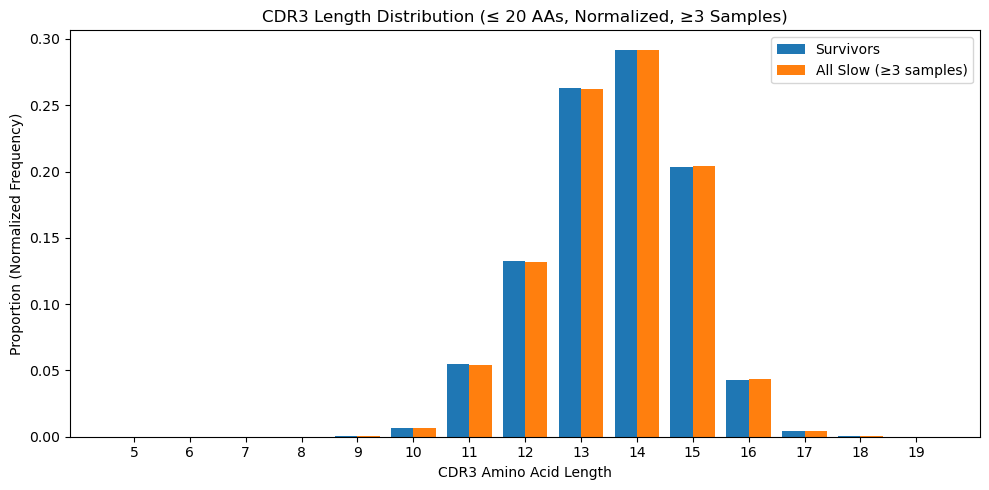

In [88]:
# Step 1: Get TCRs from slow group that appear in ≥3 samples
slow_group = per_sample_freq[per_sample_freq["group"] == "slow"]
slow_tcr_sample_counts = slow_group.groupby("aaSeqCDR3")["Sample_ID"].nunique().reset_index(name="n_samples")
slow_tcr_3plus = slow_tcr_sample_counts[slow_tcr_sample_counts["n_samples"] >= 3]["aaSeqCDR3"]

# Step 2: Filter slow group by these TCRs and calculate length
filtered_slow_lengths = (
    slow_group[slow_group["aaSeqCDR3"].isin(slow_tcr_3plus)]["aaSeqCDR3"]
    .drop_duplicates()
    .str.len()
)
filtered_slow_lengths = filtered_slow_lengths[filtered_slow_lengths <= 20]

# Step 3: Also filter survivors by length ≤ 20
survivor_lengths = survivors[survivors["cdr3_length"] <= 20]["cdr3_length"]

# Step 4: Combine into one DataFrame
length_df = pd.concat([
    pd.DataFrame({"cdr3_length": survivor_lengths, "Group": "Survivors"}),
    pd.DataFrame({"cdr3_length": filtered_slow_lengths, "Group": "All Slow (≥3 samples)"})
])

# Step 5: Count and normalize
length_counts = (
    length_df
    .groupby(["Group", "cdr3_length"])
    .size()
    .reset_index(name="count")
)
length_counts["proportion"] = length_counts.groupby("Group")["count"].transform(lambda x: x / x.sum())

# Step 6: Pivot for plotting
length_pivot = length_counts.pivot(index="cdr3_length", columns="Group", values="proportion").fillna(0)

# Step 7: Plot
plt.figure(figsize=(10, 5))
bar_width = 0.4
x = np.arange(length_pivot.index.min(), length_pivot.index.max() + 1)

# Reindex so all bars align
survivor_vals = length_pivot["Survivors"].reindex(x, fill_value=0)
slow_vals = length_pivot["All Slow (≥3 samples)"].reindex(x, fill_value=0)

plt.bar(x - bar_width/2, survivor_vals, width=bar_width, label="Survivors")
plt.bar(x + bar_width/2, slow_vals, width=bar_width, label="All Slow (≥3 samples)")

plt.xticks(ticks=x)
plt.xlabel("CDR3 Amino Acid Length")
plt.ylabel("Proportion (Normalized Frequency)")
plt.title("CDR3 Length Distribution (≤ 20 AAs, Normalized, ≥3 Samples)")
plt.legend()
plt.tight_layout()
plt.show()


In [89]:
# Count number of unique TCRs (length ≤ 20) in each group
n_survivors = survivor_lengths.shape[0]
n_filtered_slow = filtered_slow_lengths.shape[0]

print(f"Number of surviving TCRs (length ≤ 20): {n_survivors}")
print(f"Number of slow TCRs (length ≤ 20, in ≥3 samples): {n_filtered_slow}")

# Extract TCR sets
survivor_tcrs = set(survivors[survivors["cdr3_length"] <= 20]["aaSeqCDR3"])
slow_3plus_tcrs = set(
    slow_group[slow_group["aaSeqCDR3"].isin(slow_tcr_3plus)]["aaSeqCDR3"]
    .drop_duplicates()
)

# Intersect
shared = survivor_tcrs & slow_3plus_tcrs
only_slow = slow_3plus_tcrs - survivor_tcrs
only_survivor = survivor_tcrs - slow_3plus_tcrs

# Print results
print(f"Shared TCRs: {len(shared)}")
print(f"TCRs only in slow group (≥3 samples): {len(only_slow)}")
print(f"TCRs only in survivors: {len(only_survivor)}")


Number of surviving TCRs (length ≤ 20): 58949
Number of slow TCRs (length ≤ 20, in ≥3 samples): 59751
Shared TCRs: 58949
TCRs only in slow group (≥3 samples): 802
TCRs only in survivors: 0


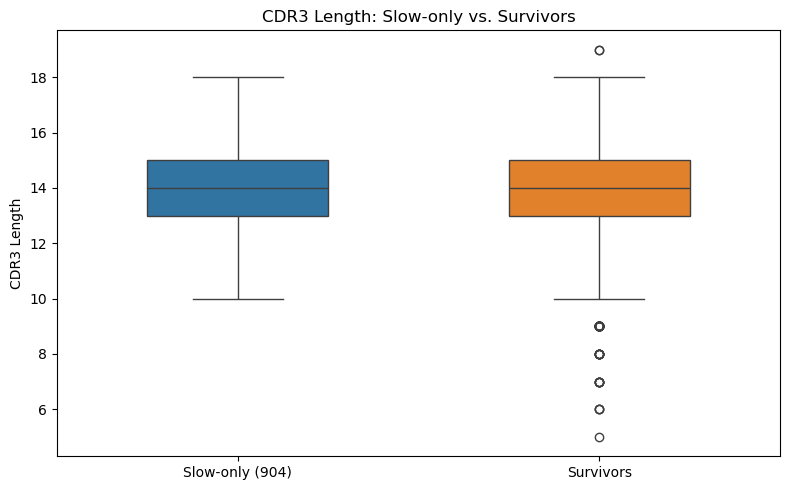

Point 2 — Mann-Whitney U Test (Slow-only vs Survivors):
p-value = 5.4598e-26
Mean length (slow-only): 14.08
Mean length (survivors): 13.58



In [90]:
from scipy.stats import mannwhitneyu

# -----------------------------
# Point 2: Analyze the 904 slow-only TCRs
# -----------------------------
# Filter 904 slow-only TCRs
slow_only_tcrs = list(only_slow)

# Get lengths of slow-only TCRs
slow_only_lengths = (
    slow_group[slow_group["aaSeqCDR3"].isin(slow_only_tcrs)]["aaSeqCDR3"]
    .drop_duplicates()
    .str.len()
)
slow_only_lengths = slow_only_lengths[slow_only_lengths <= 20]  # match survivor length cap

# Get survivor lengths again (already filtered to ≤20 earlier)
survivor_lengths = survivors[survivors["cdr3_length"] <= 20]["cdr3_length"]

# Plot comparison
plt.figure(figsize=(8, 5))
sns.boxplot(data=[slow_only_lengths, survivor_lengths], width=0.5)
plt.xticks([0, 1], ["Slow-only (904)", "Survivors"])
plt.ylabel("CDR3 Length")
plt.title("CDR3 Length: Slow-only vs. Survivors")
plt.tight_layout()
plt.show()

# Mann-Whitney U test
stat, pval = mannwhitneyu(slow_only_lengths, survivor_lengths, alternative="two-sided")
print(f"Point 2 — Mann-Whitney U Test (Slow-only vs Survivors):")
print(f"p-value = {pval:.4e}")
print(f"Mean length (slow-only): {slow_only_lengths.mean():.2f}")
print(f"Mean length (survivors): {survivor_lengths.mean():.2f}")
print()


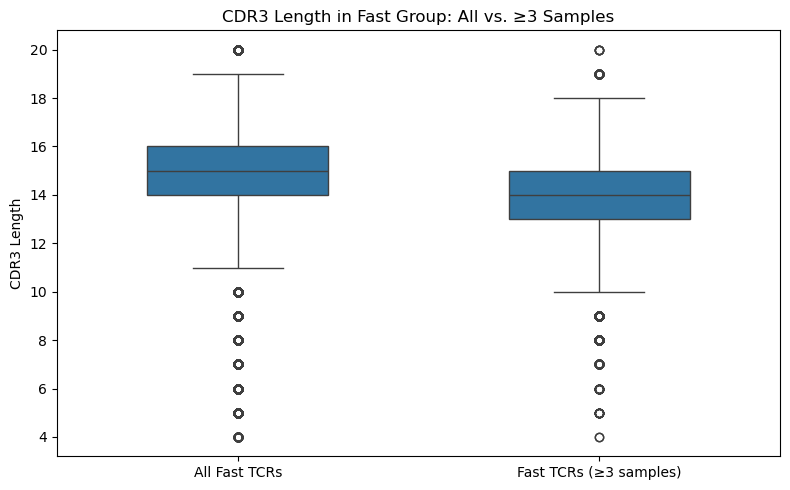

Mean length (All Fast TCRs): 14.91
Mean length (Fast TCRs ≥3 samples): 13.87
Mann–Whitney U test p-value: 0.0000e+00


In [91]:
# -----------------------------
# Point 3: Does the ≥3 sample filter bias fast group too?
# -----------------------------
# Get fast group
fast_group = per_sample_freq[per_sample_freq["group"] == "fast"]

# Count in how many fast samples each TCR appears
fast_sample_counts = fast_group.groupby("aaSeqCDR3")["Sample_ID"].nunique().reset_index(name="n_samples")
fast_sample_counts["cdr3_length"] = fast_sample_counts["aaSeqCDR3"].str.len()

# Filter to ≤20
fast_sample_counts = fast_sample_counts[fast_sample_counts["cdr3_length"] <= 20]
# Extract just the lengths
fast_all_lengths = fast_sample_counts["cdr3_length"]
fast_3plus_lengths = fast_sample_counts[fast_sample_counts["n_samples"] >= 3]["cdr3_length"]

# Combine into DataFrame for seaborn
compare_df = pd.concat([
    pd.DataFrame({"Group": "All Fast TCRs", "cdr3_length": fast_all_lengths}),
    pd.DataFrame({"Group": "Fast TCRs (≥3 samples)", "cdr3_length": fast_3plus_lengths}),
])

# Plot
plt.figure(figsize=(8, 5))
sns.boxplot(data=compare_df, x="Group", y="cdr3_length", width=0.5)
plt.title("CDR3 Length in Fast Group: All vs. ≥3 Samples")
plt.xlabel("")
plt.ylabel("CDR3 Length")
plt.tight_layout()
plt.show()

print(f"Mean length (All Fast TCRs): {fast_all_lengths.mean():.2f}")
print(f"Mean length (Fast TCRs ≥3 samples): {fast_3plus_lengths.mean():.2f}")

from scipy.stats import mannwhitneyu
stat, pval = mannwhitneyu(fast_all_lengths, fast_3plus_lengths, alternative="two-sided")
print(f"Mann–Whitney U test p-value: {pval:.4e}")


In [92]:
n_total_fast = fast_sample_counts.shape[0]
n_fast_3plus = fast_sample_counts[fast_sample_counts["n_samples"] >= 3].shape[0]

print(f"Number of fast TCRs (≤20 AAs): {n_total_fast}")
print(f"Number of fast TCRs in ≥3 samples (≤20 AAs): {n_fast_3plus}")


Number of fast TCRs (≤20 AAs): 8943196
Number of fast TCRs in ≥3 samples (≤20 AAs): 521891


### Biochemical properties

In [44]:
from Bio.SeqUtils.ProtParam import ProteinAnalysis


biochem_cols = ["length", "aromaticity", "instability_index", "isoelectric_point", "gravy", "charge_7.0", "charge_5.0",
                                     "charge_9.0", "molecular_weight", "secondary_structure"]

def analyze_sequence(seq,biochem_cols=biochem_cols):
    try:
        prot = ProteinAnalysis(seq)
        return {
            "length": len(seq),
            "aromaticity": prot.aromaticity(),
            "instability_index": prot.instability_index(),
            "isoelectric_point": prot.isoelectric_point(),
            "gravy": prot.gravy(),  # Hydrophobicity
            "charge_7.0": prot.charge_at_pH(7.0),
            "charge_5.0": prot.charge_at_pH(5.0),
            "charge_9.0": prot.charge_at_pH(9.0),
            "molecular_weight": prot.molecular_weight(),
            "secondary_structure": prot.secondary_structure_fraction()
        }
    except:
        return {k: np.nan for k in biochem_cols}


# Apply to survivors
biochem_df = pd.DataFrame([analyze_sequence(seq) for seq in survivors["aaSeqCDR3"]])
# Drop existing biochem columns (safe even if not present)
survivors = survivors.loc[:, ~survivors.columns.isin(biochem_cols)]
# Concatenate new ones
survivors = pd.concat([survivors.reset_index(drop=True), biochem_df], axis=1)
# Remove any remaining accidental duplicates (shouldn't be needed, but safe)
survivors = survivors.loc[:, ~survivors.columns.duplicated()]

survivors

,aaSeqCDR3,n_samples,mean_freq,std_freq,cv,mean_freq_fast,log2FC,length,aromaticity,instability_index,isoelectric_point,gravy,charge_7.0,charge_5.0,charge_9.0,molecular_weight,secondary_structure
0,CAAGETQYF,3,0.000068,0.000099,1.458086,0.000005,3.796573,9.0,0.222222,-16.244444,4.050028,-0.055556,-1.247988,-0.749126,-2.560224,989.0594,"(0.3333333333333333, 0.1111111111111111, 0.333..."
1,CAGGNEQYF,3,0.000004,0.000001,0.372291,0.000007,-1.020555,9.0,0.222222,26.188889,4.050028,-0.611111,-1.247988,-0.749126,-2.560224,988.0315,"(0.2222222222222222, 0.3333333333333333, 0.222..."
2,CAIGGGETQYF,3,0.000015,0.000018,1.220601,0.000021,-0.492505,11.0,0.181818,10.963636,4.050028,0.127273,-1.247988,-0.749126,-2.560224,1145.2417,"(0.18181818181818182, 0.2727272727272727, 0.36..."
3,CAIGQGYEQYF,3,0.000022,0.000016,0.730696,0.000005,2.274707,11.0,0.272727,5.172727,4.050028,-0.209091,-1.248987,-0.749136,-2.651133,1278.3889,"(0.18181818181818182, 0.18181818181818182, 0.3..."
4,CAIGQNTEAFF,3,0.000009,0.000007,0.707266,0.000002,2.334055,11.0,0.181818,18.881818,4.050028,0.418182,-1.246989,-0.749116,-2.469315,1200.3202,"(0.2727272727272727, 0.18181818181818182, 0.36..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58944,CSVWDNEQFF,3,0.000009,0.000005,0.569802,0.000005,0.775460,10.0,0.300000,20.720000,4.050028,-0.340000,-2.245868,-1.648234,-3.469304,1274.3572,"(0.1, 0.30000000000000004, 0.4)"
58945,CSVYNTGELFF,3,0.000047,0.000047,0.982179,0.000008,2.541816,11.0,0.272727,-20.054545,4.050028,0.536364,-1.247988,-0.749126,-2.560224,1279.4167,"(0.18181818181818182, 0.2727272727272727, 0.54..."
58946,CSVYRGTDTQYF,3,0.000022,0.000011,0.505401,0.000005,2.187148,12.0,0.250000,-50.450000,5.827952,-0.600000,-0.250687,0.131876,-1.652149,1439.5481,"(0.0, 0.25, 0.5)"
58947,CSVYSGANVLTF,3,0.000008,0.000003,0.353363,0.000006,0.575528,12.0,0.166667,6.091667,5.517441,0.983333,-0.250798,0.031003,-1.560252,1260.4151,"(0.16666666666666669, 0.33333333333333337, 0.5..."


In [38]:
survivors.columns

Index(['aaSeqCDR3', 'n_samples', 'mean_freq', 'std_freq', 'cv',
       'mean_freq_fast', 'log2FC', 'length', 'aromaticity',
       'instability_index', 'isoelectric_point', 'gravy', 'charge', 'length',
       'aromaticity', 'instability_index', 'isoelectric_point', 'gravy',
       'charge_7.0', 'charge_5.0', 'charge_9.0', 'molecular_weight',
       'secondary_structure', 'length', 'aromaticity', 'instability_index',
       'isoelectric_point', 'gravy', 'charge_7.0', 'charge_5.0', 'charge_9.0',
       'molecular_weight', 'secondary_structure', 'length', 'aromaticity',
       'instability_index', 'isoelectric_point', 'gravy', 'charge_7.0',
       'charge_5.0', 'charge_9.0', 'molecular_weight', 'secondary_structure'],
      dtype='object')

🧪 1. Aromaticity
Definition: Proportion of aromatic amino acids (Phe, Trp, Tyr) in the sequence.

Importance: Aromatic residues contribute to protein stability, stacking interactions, and antigen recognition.

Typical range: ~0.05–0.15

Interpretation: Higher aromaticity can indicate stable, structured TCRs.

🧪 2. Instability Index
Definition: Predicts in vitro protein stability based on dipeptide composition (Guruprasad et al.).

Importance: Values >40 suggest the protein is unstable; <40 means stable.

Typical threshold:

Stable: < 40

Unstable: > 40

Interpretation: Survivors might be more stable under degradation pressure.

🧪 3. Isoelectric Point (pI)
Definition: The pH at which the net charge of the protein is zero.

Importance: Affects solubility, interaction with other molecules, and degradation.

Typical range: 4.5–10.5 for peptides

Most TCRs: ~6.0–9.0

Interpretation: pI affects charge balance at physiological pH (7.4); extreme values may impact structure or aggregation.

🧪 4. GRAVY (Grand Average of Hydropathy)
Definition: Average hydrophobicity; higher = more hydrophobic.

Importance: Hydrophobicity affects folding, aggregation, membrane interaction.

Typical range:

Hydrophilic: < 0

Hydrophobic: > 0

Most soluble proteins: -0.6 to 0.4

Interpretation: Survivors may be more hydrophilic if they resist degradation better.

🧪 5. Charge at pH 7.0
Definition: Net electric charge of the peptide at physiological pH.

Importance: Influences solubility, binding, and interaction with MHCs or antigens.

Typical range: ~–2 to +5 for TCR-length peptides

Interpretation: Strong charge may promote interaction or solubility; could affect resilience.



In [ ]:
import math
def plot_1_group(df, title,color='steelblue'):
    # Plot all properties
    biochem_props = ["length", "aromaticity", "instability_index", "isoelectric_point", "gravy", "charge_7.0", "charge_5.0",
                                        "charge_9.0", "molecular_weight"]
    # Always 3 columns
    n_cols = 3 ; n_props = len(biochem_props)
    n_rows = math.ceil(n_props / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for i, prop in enumerate(biochem_props):
        sns.histplot(df[prop], kde=True, ax=axes[i], bins=30, color=color)
        axes[i].set_title(f"{prop.replace('_', ' ').title()} Distribution")
        axes[i].set_xlabel(prop.title())
        axes[i].set_ylabel("Count")

    # Hide any unused subplots
    for j in range(n_props, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

def plot_secondary_structure(df, title="Survivors"):
    df[["ss_helix", "ss_turn", "ss_sheet"]].plot.box()
    plt.ylabel("Fraction")
    plt.title(f"{title} Secondary Structure Fractions")
    plt.show()

    # If you want violin plots instead of boxplots:
    data = pd.melt(df, value_vars=['ss_helix', 'ss_turn', 'ss_sheet'], var_name="Structure", value_name="Fraction")
    plt.figure(figsize=(8, 5))
    sns.violinplot(x="Structure", y="Fraction", data=data)
    plt.title(f"{title} Secondary Structure Fractions Across Samples")
    plt.show()

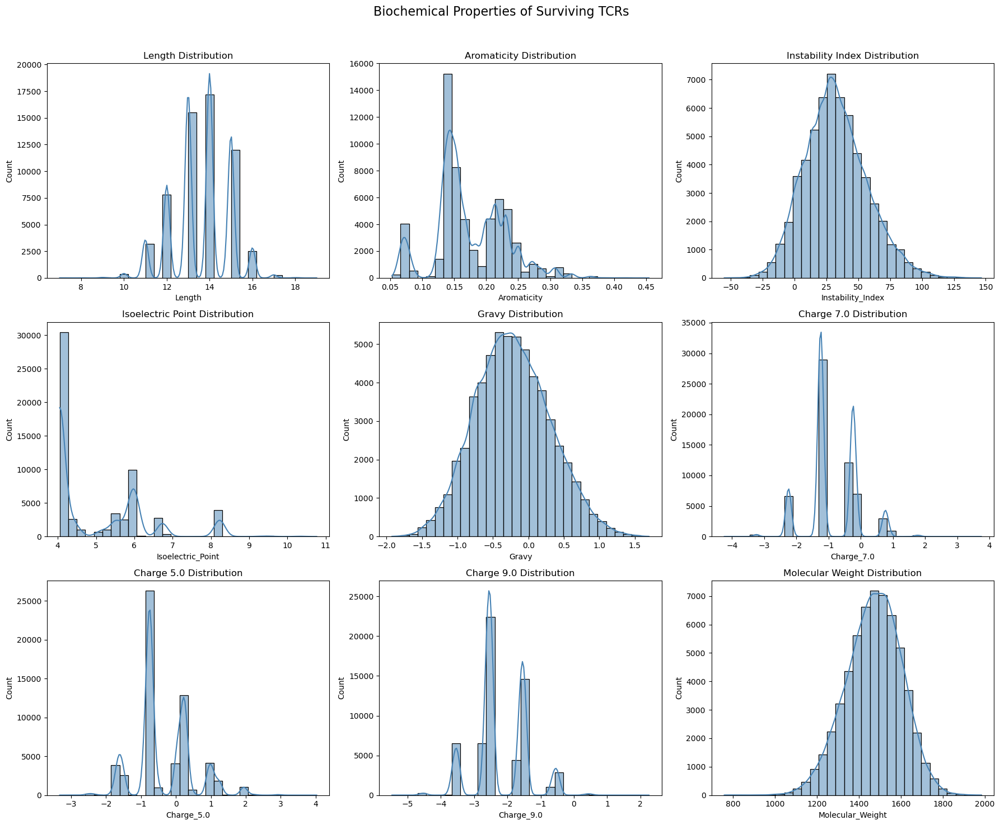

In [54]:
plot_1_group(survivors, title="Biochemical Properties of Surviving TCRs",color='steelblue')

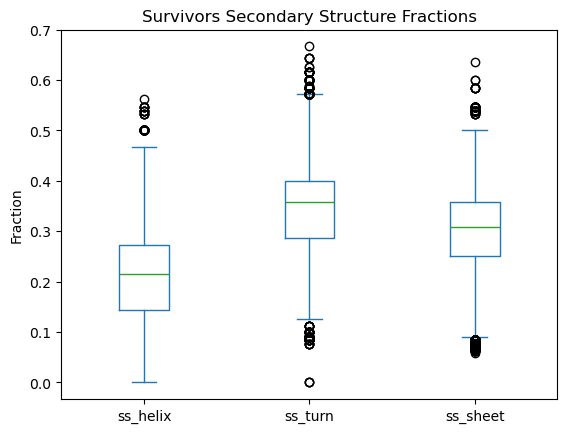

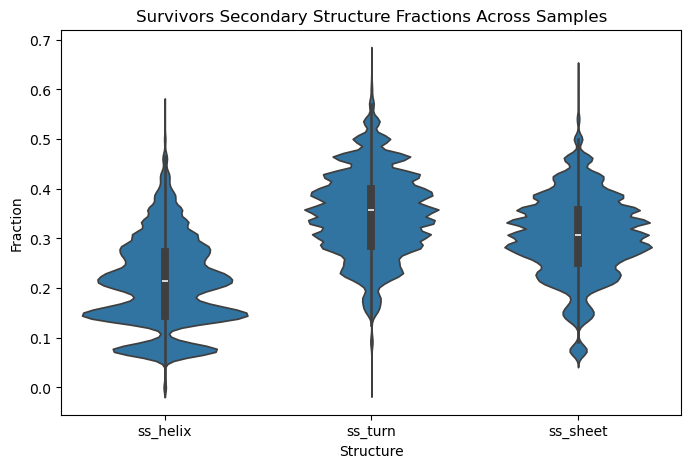

In [57]:
ss_series = survivors["secondary_structure"]
ss_expanded = pd.DataFrame(ss_series.tolist(), index=ss_series.index)
ss_expanded.columns = ['ss_helix', 'ss_turn', 'ss_sheet']
survivors[["ss_helix", "ss_turn", "ss_sheet"]] = ss_expanded

plot_secondary_structure(survivors, title="Survivors")

In [71]:
# Get unique CDR3 sequences from control group (slow group, 1–2 samples)
control_cdr3s = slow_counts[slow_counts["aaSeqCDR3"].isin(nonsurvivor_tcrs)]["aaSeqCDR3"].drop_duplicates()

# Run property analysis
control_biochem = pd.DataFrame([analyze_sequence(seq) for seq in control_cdr3s])


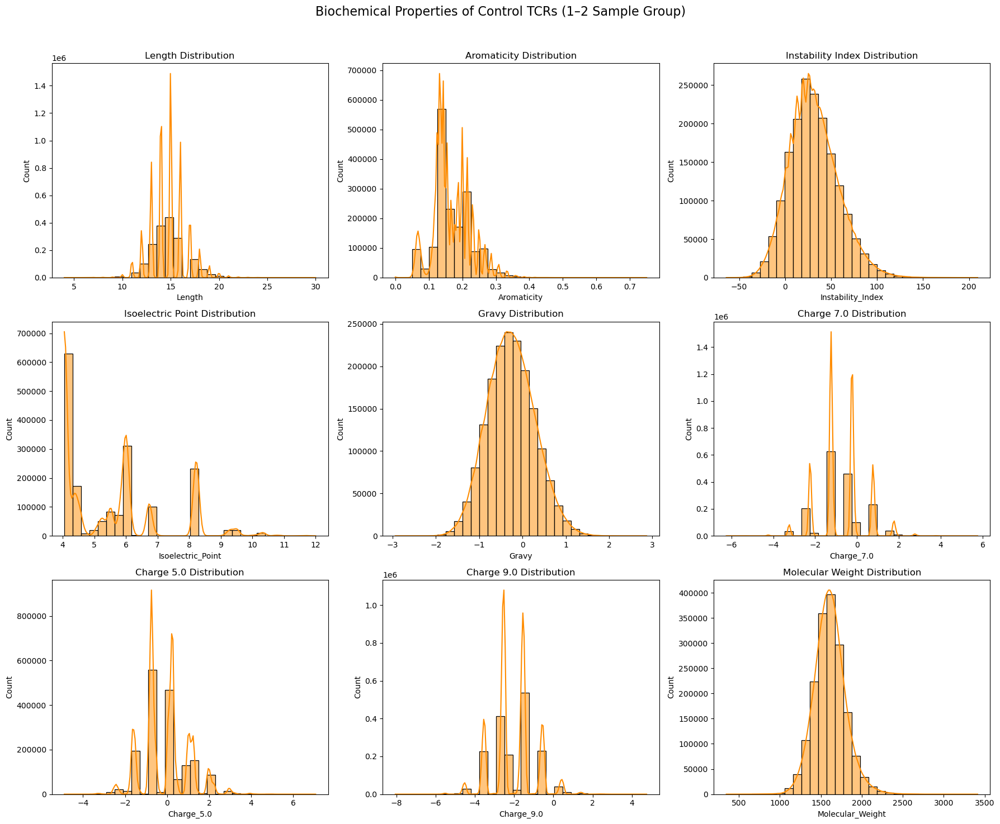

In [72]:
plot_1_group(control_biochem, title="Biochemical Properties of Control TCRs (1–2 Sample Group)" ,color='darkorange')

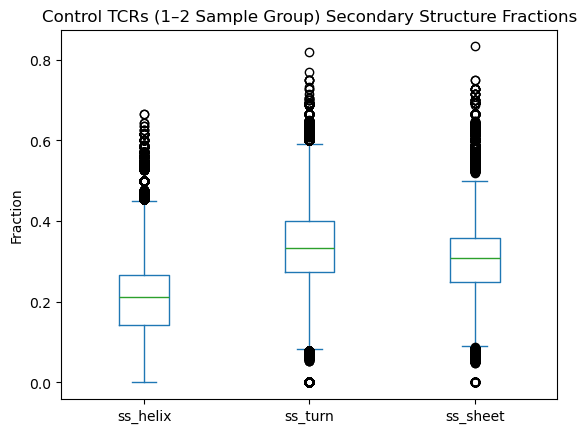

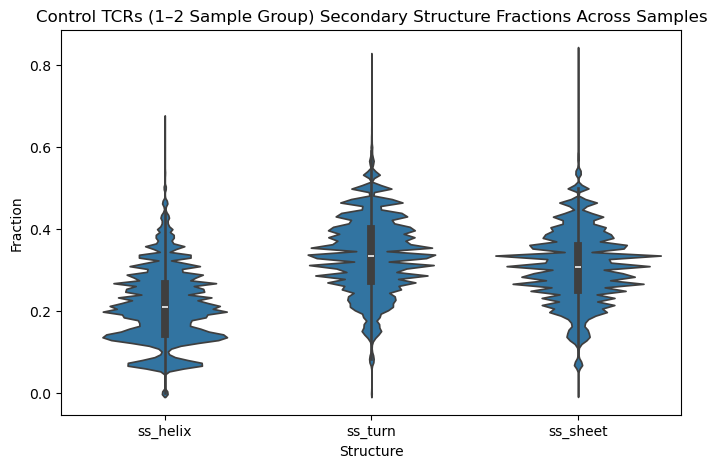

In [76]:
# Fill NaN with (np.nan, np.nan, np.nan) so all entries are 3-element tuples/lists
def fix_tuple(val):
    if isinstance(val, (tuple, list)) and len(val) == 3:
        return val
    return (np.nan, np.nan, np.nan)

control_biochem["secondary_structure_fixed"] = control_biochem["secondary_structure"].apply(fix_tuple)

# Now expand
ss_expanded = pd.DataFrame(control_biochem["secondary_structure_fixed"].tolist(), index=control_biochem.index)
ss_expanded.columns = ['ss_helix', 'ss_turn', 'ss_sheet']

control_biochem[["ss_helix", "ss_turn", "ss_sheet"]] = ss_expanded

plot_secondary_structure(control_biochem, title="Control TCRs (1–2 Sample Group)")

In [ ]:
## Control option 2:
# Compute properties
fast_control_biochem = pd.DataFrame([analyze_sequence(seq) for seq in fast_control_cdr3s])


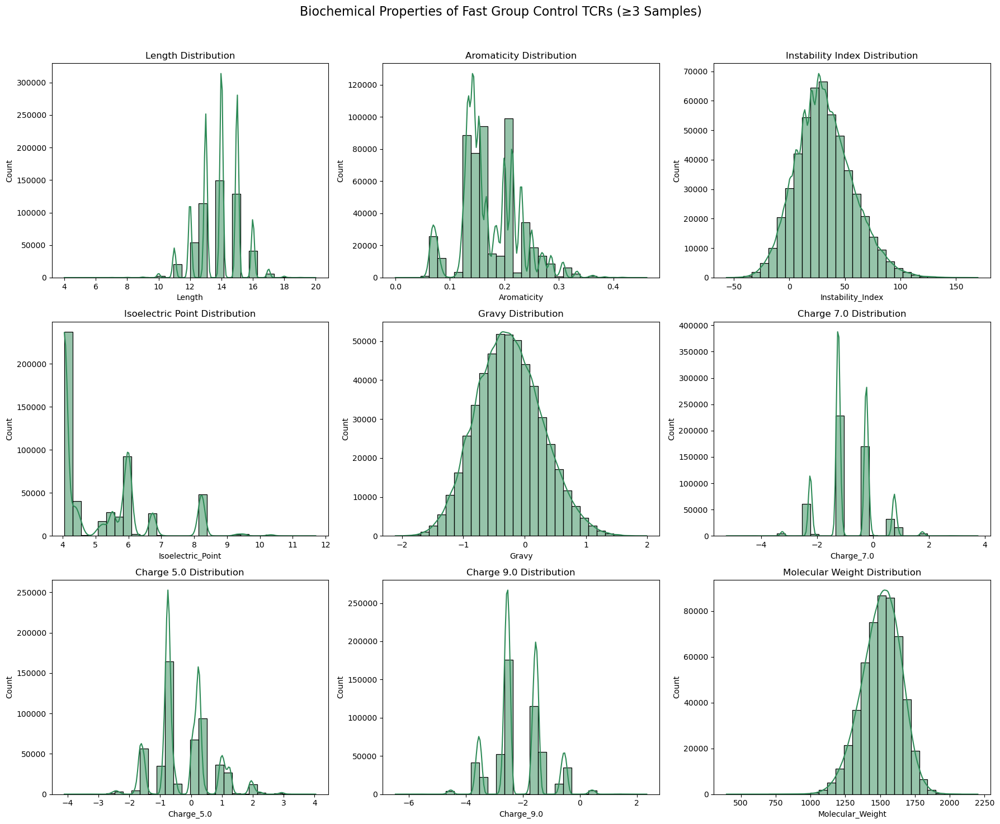

In [68]:
plot_1_group(fast_control_biochem, title="Biochemical Properties of Fast Group Control TCRs (≥3 Samples)",color='seagreen')

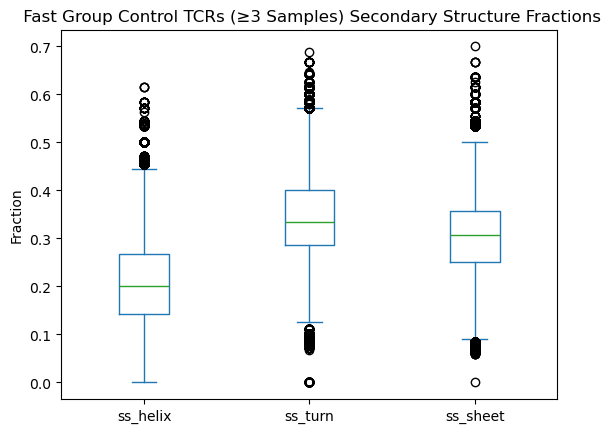

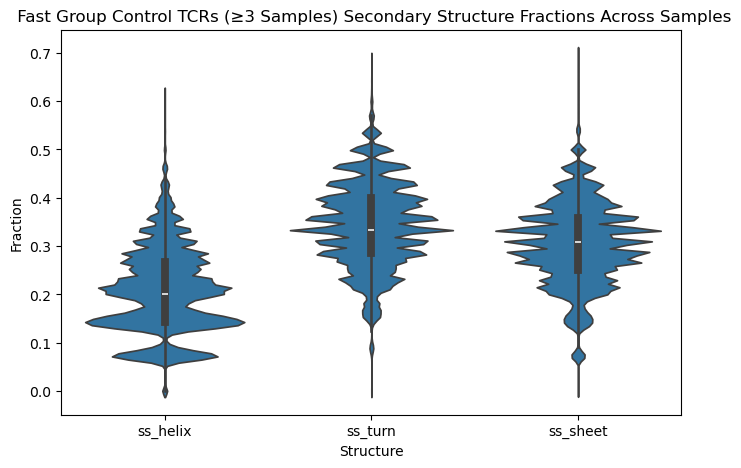

In [78]:
fast_control_biochem["secondary_structure_fixed"] = fast_control_biochem["secondary_structure"].apply(fix_tuple)

# Now expand
ss_expanded = pd.DataFrame(fast_control_biochem["secondary_structure_fixed"].tolist(), index=fast_control_biochem.index)
ss_expanded.columns = ['ss_helix', 'ss_turn', 'ss_sheet']

fast_control_biochem[["ss_helix", "ss_turn", "ss_sheet"]] = ss_expanded

plot_secondary_structure(fast_control_biochem, title=" Fast Group Control TCRs (≥3 Samples)")

In [81]:
def plot_normalized_distributions(group1_df, group2_df, label1="Group 1", label2="Group 2"):
    biochem_props = ["length", "aromaticity", "instability_index", "isoelectric_point", "gravy", "charge_7.0", "charge_5.0",
                                        "charge_9.0", "molecular_weight"]

    # Always 3 columns
    n_cols = 3 ; n_props = len(biochem_props)
    n_rows = math.ceil(n_props / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for i, prop in enumerate(biochem_props):
        sns.histplot(group1_df[prop], stat="density", kde=True, bins=30, color="steelblue", label=label1, ax=axes[i], alpha=0.6)
        sns.histplot(group2_df[prop], stat="density", kde=True, bins=30, color="darkorange", label=label2, ax=axes[i], alpha=0.6)
        axes[i].set_title(f"{prop.replace('_', ' ').title()} Distribution")
        axes[i].set_xlabel(prop.title())
        axes[i].set_ylabel("Density")
        axes[i].legend()

    plt.suptitle(f"{label1} vs {label2}: Biochemical Property Comparison (Normalized)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


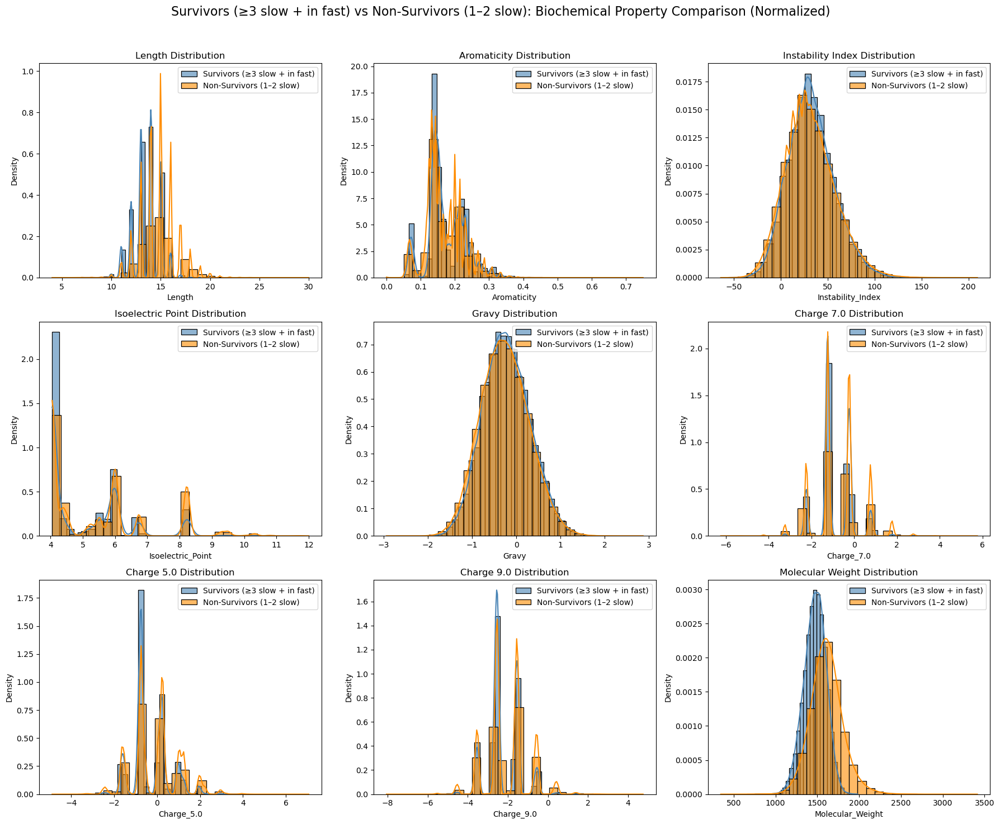

In [82]:
plot_normalized_distributions(
    group1_df=survivors,
    group2_df=control_biochem,
    label1="Survivors (≥3 slow + in fast)",
    label2="Non-Survivors (1–2 slow)"
)

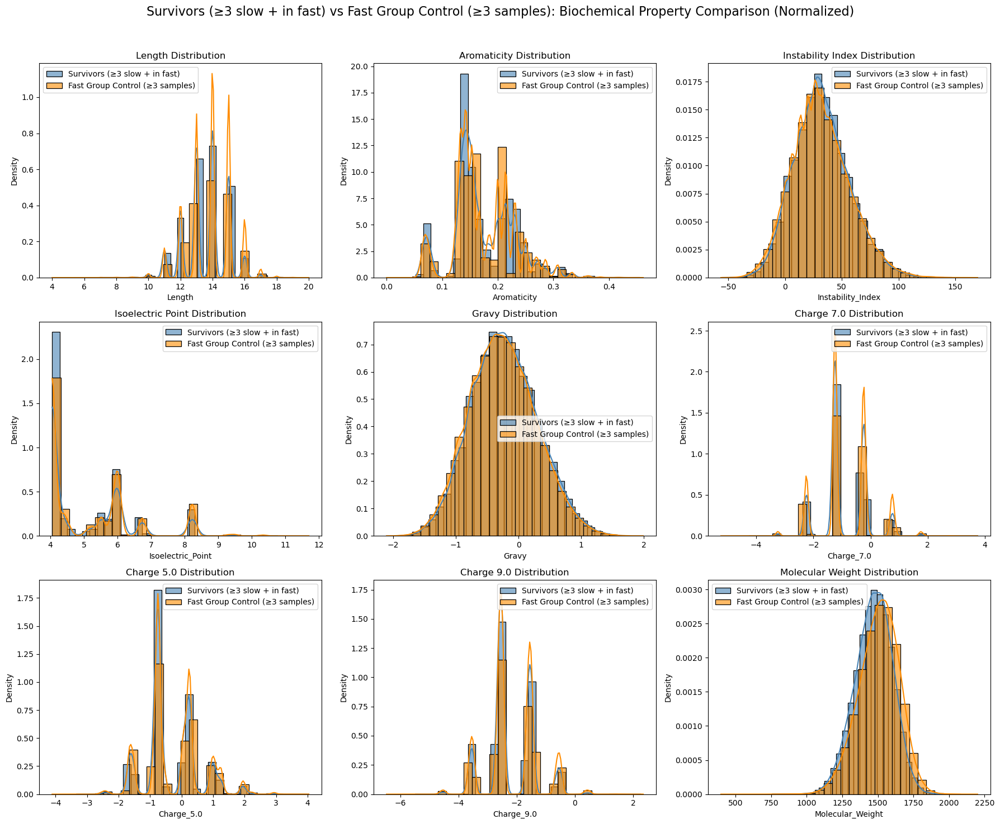

In [83]:
plot_normalized_distributions(
    group1_df=survivors,
    group2_df=fast_control_biochem,
    label1="Survivors (≥3 slow + in fast)",
    label2="Fast Group Control (≥3 samples)"
)


In [91]:
def plot_normalized_distributions_3groups(group1_df, group2_df, group3_df,
                                          label1="Group 1", label2="Group 2", label3="Group 3"):
    biochem_props = ["length", "aromaticity", "instability_index", "isoelectric_point", "gravy", "charge_7.0", "charge_5.0",
                                        "charge_9.0", "molecular_weight"]

    # Always 3 columns
    n_cols = 3 ; n_props = len(biochem_props)
    n_rows = math.ceil(n_props / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
    axes = axes.flatten()

    for i, prop in enumerate(biochem_props):
        sns.histplot(group1_df[prop], stat="density", kde=False, bins=30,
                     color="steelblue", label=label1, ax=axes[i], alpha=0.6)
        sns.histplot(group2_df[prop], stat="density", kde=False, bins=30,
                     color="darkorange", label=label2, ax=axes[i], alpha=0.6)
        sns.histplot(group3_df[prop], stat="density", kde=False, bins=30,
                     color="seagreen", label=label3, ax=axes[i], alpha=0.6)

        axes[i].set_title(f"{prop.replace('_', ' ').title()} Distribution")
        axes[i].set_xlabel(prop.title())
        axes[i].set_ylabel("Density")
        axes[i].legend()

    plt.suptitle(f"{label1} vs {label2} vs {label3}: Biochemical Property Comparison (Normalized)", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

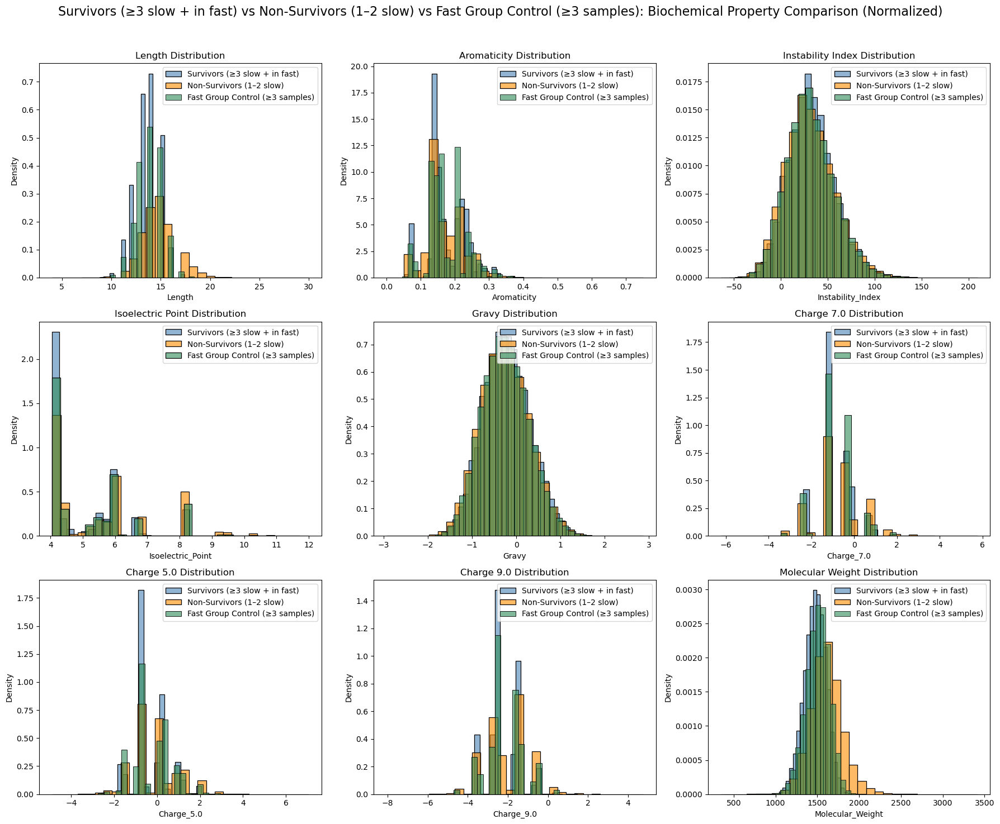

In [92]:
plot_normalized_distributions_3groups(
    group1_df=survivors,
    group2_df=control_biochem,
    group3_df=fast_control_biochem,
    label1="Survivors (≥3 slow + in fast)",
    label2="Non-Survivors (1–2 slow)",
    label3="Fast Group Control (≥3 samples)"
)

In [86]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_secondary_structure_3groups(group1_df, group2_df, group3_df,
                                     label1="Group 1", label2="Group 2", label3="Group 3"):
    # Combine data for boxplot/violinplot
    g1 = group1_df[["ss_helix", "ss_turn", "ss_sheet"]].copy()
    g1["Group"] = label1
    g2 = group2_df[["ss_helix", "ss_turn", "ss_sheet"]].copy()
    g2["Group"] = label2
    g3 = group3_df[["ss_helix", "ss_turn", "ss_sheet"]].copy()
    g3["Group"] = label3

    combined = pd.concat([g1, g2, g3], ignore_index=True)
    data = pd.melt(combined, id_vars="Group", value_vars=['ss_helix', 'ss_turn', 'ss_sheet'],
                   var_name="Structure", value_name="Fraction")

    # ---- BOX PLOTS ----
    plt.figure(figsize=(10, 6))
    sns.boxplot(x="Structure", y="Fraction", hue="Group", data=data)
    plt.ylabel("Fraction")
    plt.title(f"Secondary Structure Fractions: {label1} vs {label2} vs {label3}")
    plt.legend()
    plt.show()

    # ---- VIOLIN PLOTS ----
    plt.figure(figsize=(10, 6))
    sns.violinplot(x="Structure", y="Fraction", hue="Group", data=data, split=True)
    plt.ylabel("Fraction")
    plt.title(f"Secondary Structure Fractions (Violin): {label1} vs {label2} vs {label3}")
    plt.legend()
    plt.show()


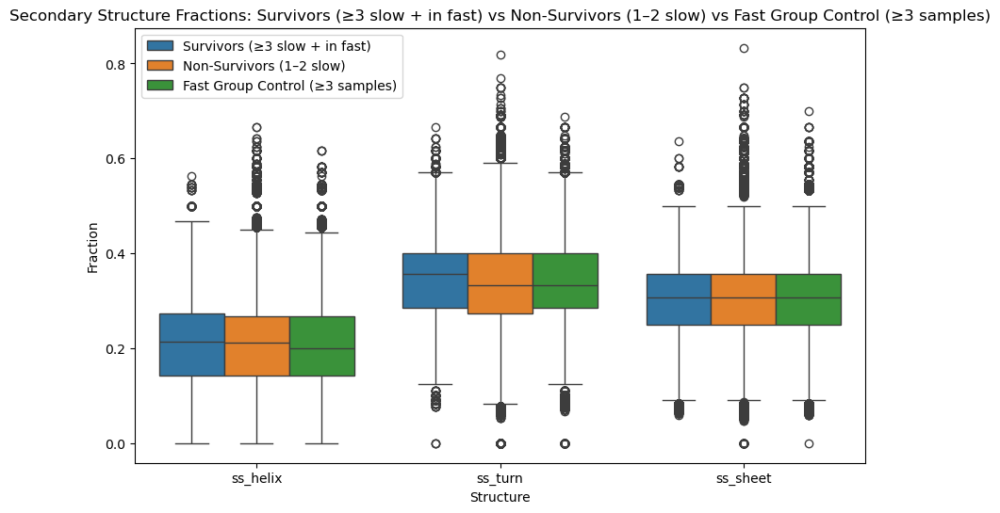

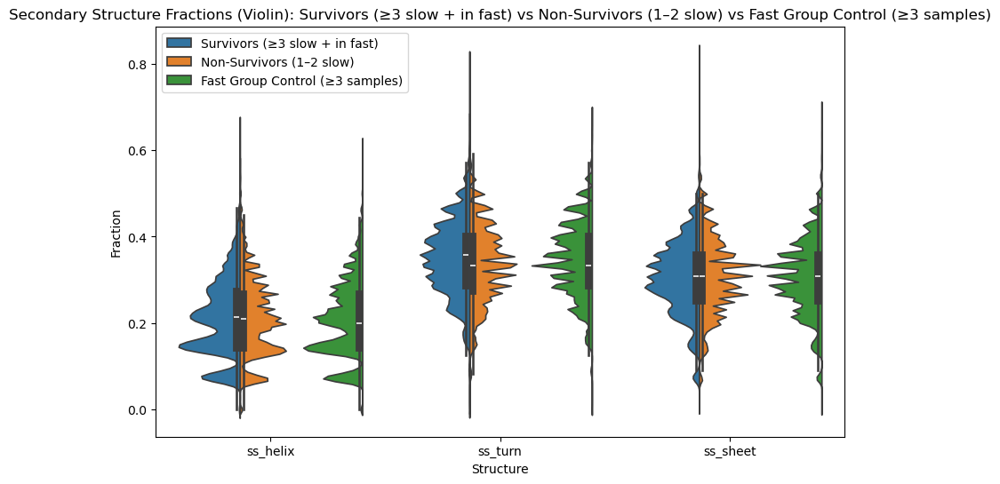

In [87]:
plot_secondary_structure_3groups(
    group1_df=survivors,
    group2_df=control_biochem,
    group3_df=fast_control_biochem,
    label1="Survivors (≥3 slow + in fast)",
    label2="Non-Survivors (1–2 slow)",
    label3="Fast Group Control (≥3 samples)"
)

## Clonotype-level comparisons 

In [12]:
# --- Add group labels ---
clonotype_df["group"] = clonotype_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# --- Normalize read counts per sample ---
total_reads = clonotype_df.groupby("Sample_ID")["readCount"].sum().reset_index(name="total_reads")
clonotype_df = clonotype_df.merge(total_reads, on="Sample_ID")
clonotype_df["frequency"] = clonotype_df["readCount"] / clonotype_df["total_reads"]

# --- Average frequency per clonotype per group ---
grouped = (
    clonotype_df.groupby(["aaSeqCDR3", "group"])["frequency"]
    .mean()
    .reset_index()
    .pivot(index="aaSeqCDR3", columns="group", values="frequency")
    .fillna(1e-9)  # small value to avoid div-by-zero
)

# --- Compute log2 fold-change ---
grouped["log2FC_fast_vs_slow"] = np.log2(grouped["fast"] / grouped["slow"])

# --- Optional: Count how many samples each clonotype appears in per group ---
clone_presence = (
    clonotype_df.groupby(["aaSeqCDR3", "group"])["Sample_ID"]
    .nunique()
    .reset_index()
    .pivot(index="aaSeqCDR3", columns="group", values="Sample_ID")
    .fillna(0)
    .astype(int)
    .rename(columns={"fast": "n_fast_samples", "slow": "n_slow_samples"})
)

# --- Merge counts with fold-change ---
foldchange_df = grouped.merge(clone_presence, left_index=True, right_index=True).reset_index()

# Sort by magnitude
foldchange_df = foldchange_df.sort_values("log2FC_fast_vs_slow", ascending=False)

/tmp/ipykernel_618482/682152930.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


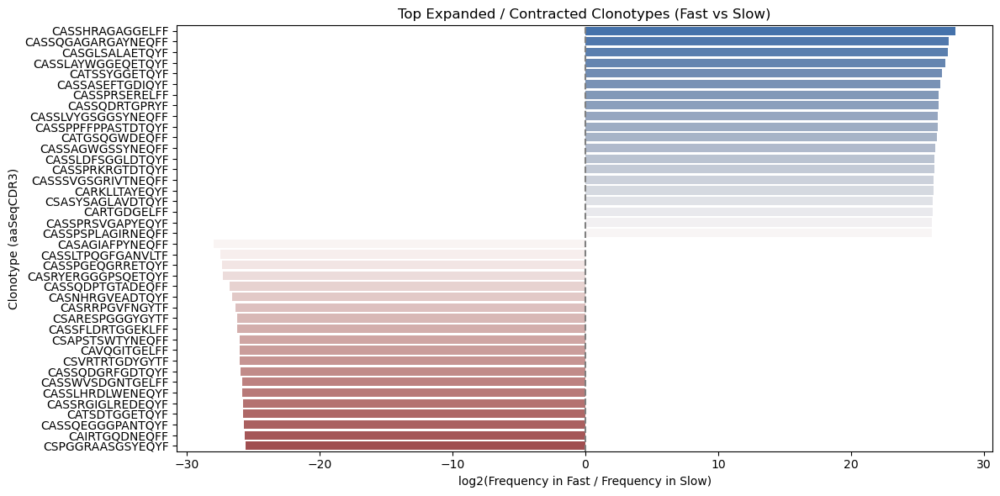

In [13]:
top_n = 20  # adjust as needed

# Top expanded in fast
top_expanded = foldchange_df.sort_values("log2FC_fast_vs_slow", ascending=False).head(top_n)

# Top depleted in fast (i.e., expanded in slow)
top_depleted = foldchange_df.sort_values("log2FC_fast_vs_slow").head(top_n)

# Combine
top_clones = pd.concat([top_expanded, top_depleted])

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(
    data=top_clones,
    x="log2FC_fast_vs_slow",
    y="aaSeqCDR3",
    palette="vlag"
)
plt.axvline(0, linestyle="--", color="gray")
plt.title("Top Expanded / Contracted Clonotypes (Fast vs Slow)")
plt.xlabel("log2(Frequency in Fast / Frequency in Slow)")
plt.ylabel("Clonotype (aaSeqCDR3)")
plt.tight_layout()
plt.show()


IS normelized?

TODO: Check for similar motifs (vdj motifs, amino acids motifs) that are unique to each group.maybe logo?
their sized are different. maybe different vdj genes combinations?

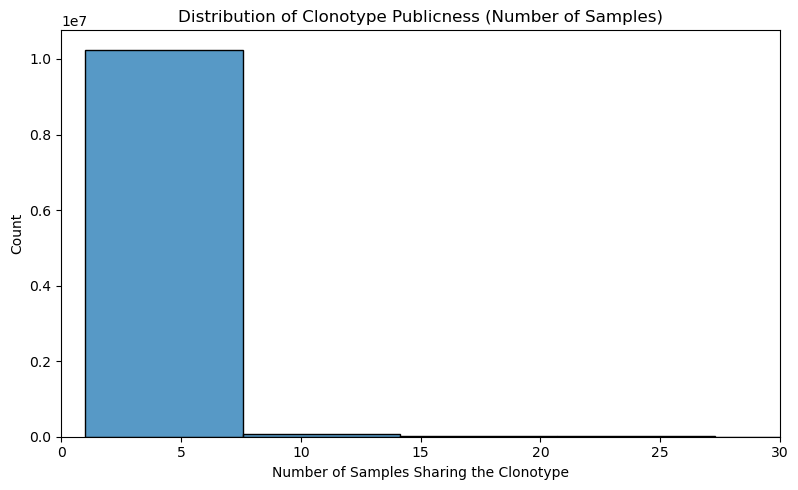

In [14]:
# Add a 'publicness' column
foldchange_df["publicness"] = foldchange_df[["n_fast_samples", "n_slow_samples"]].sum(axis=1)

# Plot histogram
plt.figure(figsize=(8, 5))
sns.histplot(foldchange_df["publicness"], bins=30)
plt.title("Distribution of Clonotype Publicness (Number of Samples)")
plt.xlabel("Number of Samples Sharing the Clonotype")
plt.tight_layout()
plt.xlim(0, 30)
plt.show()


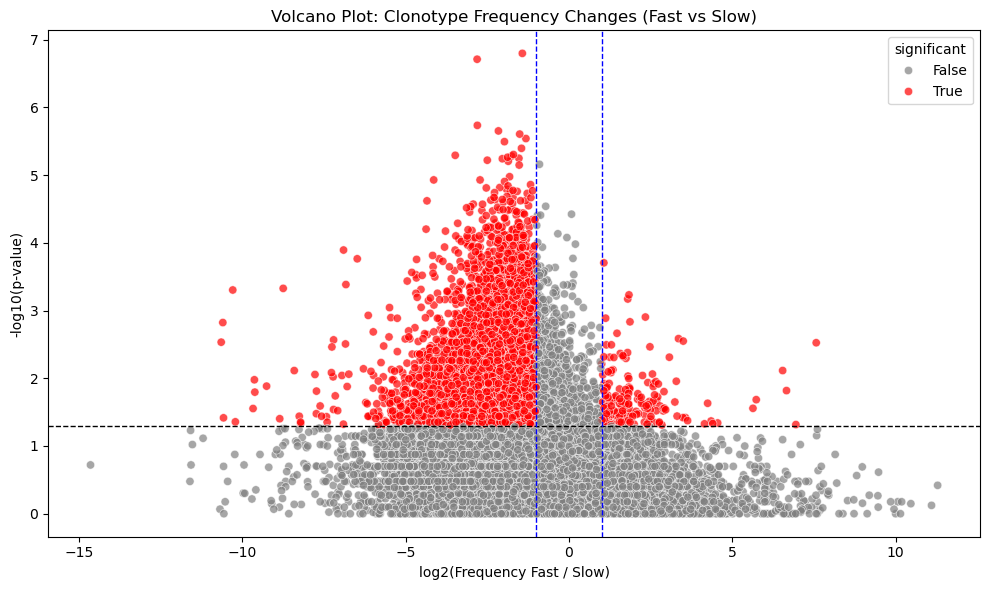

In [ ]:
from scipy.stats import mannwhitneyu

# --- Get frequencies per clonotype per sample ---
per_sample_freq = (
    clonotype_df.groupby(["aaSeqCDR3", "Sample_ID"])["readCount"]
    .sum()
    .reset_index()
)

# Normalize per sample
total_reads = clonotype_df.groupby("Sample_ID")["readCount"].sum().reset_index(name="total_reads")
per_sample_freq = per_sample_freq.merge(total_reads, on="Sample_ID")
per_sample_freq["frequency"] = per_sample_freq["readCount"] / per_sample_freq["total_reads"]

# Add metadata
per_sample_freq = per_sample_freq.merge(meta_df, on="Sample_ID", how="left")
per_sample_freq["group"] = per_sample_freq["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# --- For each clonotype: compute log2FC and p-value ---
results = []

for clone, group_df in per_sample_freq.groupby("aaSeqCDR3"):
    fast_vals = group_df[group_df["group"] == "fast"]["frequency"].values
    slow_vals = group_df[group_df["group"] == "slow"]["frequency"].values

    # To ensure reliability, only analyze clonotypes seen in at least 2 samples per group.
    if len(fast_vals) < 2 or len(slow_vals) < 2:
        continue  # Skip under-sampled clonotypes

    # Compute fold change
    mean_fast = np.mean(fast_vals)
    mean_slow = np.mean(slow_vals)
    log2fc = np.log2((mean_fast + 1e-9) / (mean_slow + 1e-9))

    # Mann–Whitney U test (non-parametric)
    stat, pval = mannwhitneyu(fast_vals, slow_vals, alternative="two-sided")

    results.append({
        "aaSeqCDR3": clone,
        "log2FC": log2fc,
        "pval": pval,
        "mean_fast": mean_fast,
        "mean_slow": mean_slow,
        "n_fast": len(fast_vals),
        "n_slow": len(slow_vals)
    })

# --- Build DataFrame ---
volcano_df = pd.DataFrame(results)
volcano_df["-log10_pval"] = -np.log10(volcano_df["pval"])
volcano_df["significant"] = (volcano_df["pval"] < 0.05) & (np.abs(volcano_df["log2FC"]) > 1)

# --- Volcano Plot ---
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=volcano_df,
    x="log2FC",
    y="-log10_pval",
    hue="significant",
    palette={True: "red", False: "gray"},
    alpha=0.7
)
plt.axhline(-np.log10(0.05), linestyle="--", color="black", linewidth=1)
plt.axvline(1, linestyle="--", color="blue", linewidth=1)
plt.axvline(-1, linestyle="--", color="blue", linewidth=1)
plt.title("Volcano Plot: Clonotype Frequency Changes (Fast vs Slow)")
plt.xlabel("log2(Frequency Fast / Slow)")
plt.ylabel("-log10(p-value)")
plt.tight_layout()
plt.show()

Each dot = a unique clonotype (aaSeqCDR3) 
red dot: that pass both: pvalus < 0.05 and |log2FC| > 1 (i.e., ≥2-fold change up or down), meaning They are statistically significant and biologically meaningful differences.
grey dot: did not pass either threshold.
x-axis (log2FC) = log2 fold change of clonotype frequency in fast vs slow group

if > 0: clonotype is more abundant in fast group

if < 0: clonotype is more abundant in slow group

0: equal in both

y-axis (-log10(p-value)) = how statistically significant the difference is

higher = more significant (smaller p-value)



<Axes: xlabel='group', ylabel='frequency'>

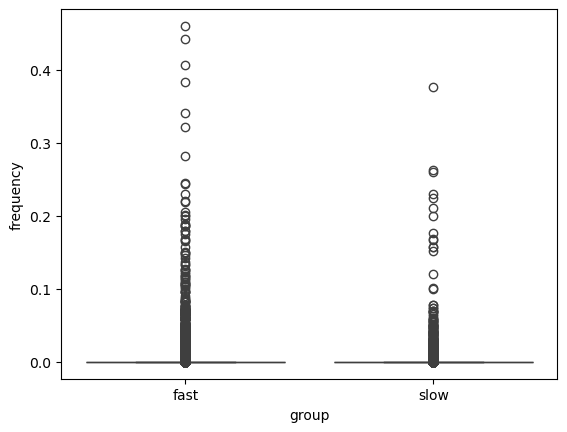

In [16]:
sns.boxplot(data=per_sample_freq, x="group", y="frequency")


## correlation graph

#### Calculating corrolation

In [3]:
from collections import defaultdict

# Step 1: Filter only required columns
aa_nt_df = clonotype_df[["aaSeqCDR3", "nSeqCDR3", "group"]].dropna()

# Step 2: For each group, collect nucleotide sequences per AA
grouped_nt = defaultdict(lambda: {"fast": set(), "slow": set()})

for _, row in aa_nt_df.iterrows():
    aa = row["aaSeqCDR3"]
    nt = row["nSeqCDR3"]
    grp = row["group"]
    grouped_nt[aa][grp].add(nt)

# Step 3: Classify each AA CDR3
same_nt = []
diff_nt = []

for aa_seq, seqs in grouped_nt.items():
    if seqs["fast"] and seqs["slow"]:  # Appears in both groups
        if seqs["fast"] == seqs["slow"]:
            same_nt.append(aa_seq)
        else:
            diff_nt.append(aa_seq)

# Step 4: Report
print(f"Total shared AA sequences (fast & slow): {len(same_nt) + len(diff_nt)}")
print(f"Same nucleotide sequences: {len(same_nt)}")
print(f"Different nucleotide sequences: {len(diff_nt)}")
print(f"Fraction with different NTs: {len(diff_nt) / (len(same_nt) + len(diff_nt)):.2%}")


Total shared AA sequences (fast & slow): 522619
Same nucleotide sequences: 6766
Different nucleotide sequences: 515853
Fraction with different NTs: 98.71%


In [ ]:
# Identify survivors (present in both groups)
survivors = set(same_nt) | set(diff_nt)

# Filter for survivors only
survivor_df = clonotype_df[clonotype_df["aaSeqCDR3"].isin(survivors)].copy()

# For each group, count in how many unique samples each TCR appears
counts = (
    survivor_df
    .groupby(["aaSeqCDR3", "group"])["Sample_ID"]
    .nunique()
    .unstack(fill_value=0)
)

# TCRs need to appear in at least threhsold samples
threshold = 5

# Find TCRs with at least threshold fast and threshold slow samples
qualified_tcrs = counts[
    (counts.get("fast", 0) >= threshold) & (counts.get("slow", 0) >= threshold)
].index.tolist()

# Only qualified TCRs
qualified_df = survivor_df[survivor_df["aaSeqCDR3"].isin(qualified_tcrs)]


In [5]:
# FAST group
fast_df = qualified_df[qualified_df["group"] == "fast"]
fast_expr = fast_df.pivot_table(
    index="aaSeqCDR3", columns="Sample_ID", values="readFraction", fill_value=0
)

# SLOW group
slow_df = qualified_df[qualified_df["group"] == "slow"]
slow_expr = slow_df.pivot_table(
    index="aaSeqCDR3", columns="Sample_ID", values="readFraction", fill_value=0
)

In [10]:
fast_df.columns

Index(['readCount', 'readFraction', 'allVHitsWithScore', 'allDHitsWithScore',
       'allJHitsWithScore', 'nSeqCDR3', 'aaSeqCDR3', 'Sample_ID',
       'extraction_time', 'group'],
      dtype='object')

In [6]:
# Calculate correlation matrices (rows/cols = TCRs)
fast_corr = fast_expr.T.corr(method='pearson')
slow_corr = slow_expr.T.corr(method='pearson')


In [12]:
fast_corr.to_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/fast_corr_4.pkl")
slow_corr.to_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/slow_corr_4.pkl")
fast_df.to_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_fast_df_4.pkl")
slow_df.to_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_slow_df_4.pkl")
qualified_df.to_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_df_4.pkl")

In [7]:
def find_corr_threshold_for_n_nodes(corr_matrix, target_n_nodes):
    # Flatten the upper triangle
    tcrs = corr_matrix.index.to_numpy()
    mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    corr_flat = corr_matrix.values[mask]
    idx_flat = np.argwhere(mask)
    # Create dataframe of edges
    df = pd.DataFrame({
        "tcr1": tcrs[idx_flat[:, 0]],
        "tcr2": tcrs[idx_flat[:, 1]],
        "corr": corr_flat
    })
    # Sort by correlation descending
    df = df.sort_values("corr", ascending=False).reset_index(drop=True)
    # Add pairs until you reach the desired number of unique nodes
    seen_nodes = set()
    threshold = None
    for i, row in df.iterrows():
        seen_nodes.add(row.tcr1)
        seen_nodes.add(row.tcr2)
        if len(seen_nodes) >= target_n_nodes:
            threshold = row.corr
            break
    threshold = float(row["corr"])
    return threshold, len(seen_nodes)

def find_threshold_for_n_nodes(corr_matrix, target_n_nodes, min_r=0, max_r=1, max_iter=20, tol=5):
    """
    Find the correlation threshold that yields approximately target_n_nodes in the positive-correlation network.
    uses binary search approach.
    Returns (threshold, node_count).
    """
    tcrs = corr_matrix.index
    low = min_r
    high = max_r
    result_thresh = min_r
    last_n_nodes = 0

    for _ in range(max_iter):
        thresh = (low + high) / 2
        # Build edges above threshold
        edges = []
        for i, t1 in enumerate(tcrs):
            for j, t2 in enumerate(tcrs):
                if i < j:
                    r = corr_matrix.loc[t1, t2]
                    if pd.notna(r) and r >= thresh:
                        edges.append((t1, t2))
        node_set = set([n for edge in edges for n in edge])
        n_nodes = len(node_set)
        print(f"Threshold {thresh:.3f}: {n_nodes} nodes")
        if abs(n_nodes - target_n_nodes) <= tol:
            result_thresh = thresh
            last_n_nodes = n_nodes
            break
        if n_nodes < target_n_nodes:
            high = thresh
        else:
            low = thresh
            result_thresh = thresh
            last_n_nodes = n_nodes

    return result_thresh, last_n_nodes

import networkx as nx

def build_full_corr_graph(corr_matrix, min_r=None):
    G = nx.Graph()
    tcrs = corr_matrix.index
    # G.add_nodes_from(tcrs)
    for i, tcr1 in enumerate(tcrs):
        for j, tcr2 in enumerate(tcrs):
            if i < j:  # only unique pairs, undirected
                r = corr_matrix.loc[tcr1, tcr2]
                if pd.notna(r):  # skip NaN (shouldn’t happen if enough samples)
                    if min_r is None or r >= min_r:
                        G.add_edge(tcr1, tcr2, weight=r)
    return G


def build_pos_corr_graph_faster(corr_matrix, min_r=None):
    """
    Efficiently build a NetworkX graph from a correlation matrix using a threshold.
    Precompute the edge list directly from the correlation matrix (using NumPy or pandas).
    Only adds edges where r >= min_r (positive correlation).
    """
    tcrs = np.array(corr_matrix.index)
    # Get upper triangle indices (excluding diagonal)
    mask = np.triu(np.ones(corr_matrix.shape, dtype=bool), k=1)
    # Get pairs and correlations
    i_idx, j_idx = np.where(mask)
    corrs = corr_matrix.values[mask]
    if min_r is not None:
        select = np.where(corrs >= min_r)[0]
        i_idx = i_idx[select]
        j_idx = j_idx[select]
        corrs = corrs[select]
    # Build edge list
    edge_list = [
        (tcrs[i], tcrs[j], {'weight': float(corr)})
        for i, j, corr in zip(i_idx, j_idx, corrs)
    ]
    # Create graph
    G = nx.Graph()
    G.add_edges_from(edge_list)
    return G

In [8]:
import pickle

# Save function
def save_graph(graph, filename):
    with open(filename, 'wb') as f:
        pickle.dump(graph, f)

# Load function
def load_graph(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)

In [ ]:
def get_corr_values(corr_matrix):
    # Get the upper triangle indices (excluding diagonal)
    mask = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    corr_vals = corr_matrix.values[mask]
    return corr_vals

def print_corr_percentiles(corr_vals, label):
    print(f"\n--- {label} Correlation Statistics ---")
    for p in [0, 1, 5, 10, 25, 50, 75, 90, 95, 99, 100]:
        print(f"{p}th percentile: {np.percentile(corr_vals, p):.3f}")
    print(f"Mean: {np.mean(corr_vals):.3f}, Std: {np.std(corr_vals):.3f}")


# Get flattened correlation values
fast_corr_vals = get_corr_values(fast_corr)
slow_corr_vals = get_corr_values(slow_corr)

# Print percentiles
print_corr_percentiles(fast_corr_vals, "Fast Group")
print_corr_percentiles(slow_corr_vals, "Slow Group")


NameError: name 'fast_corr' is not defined

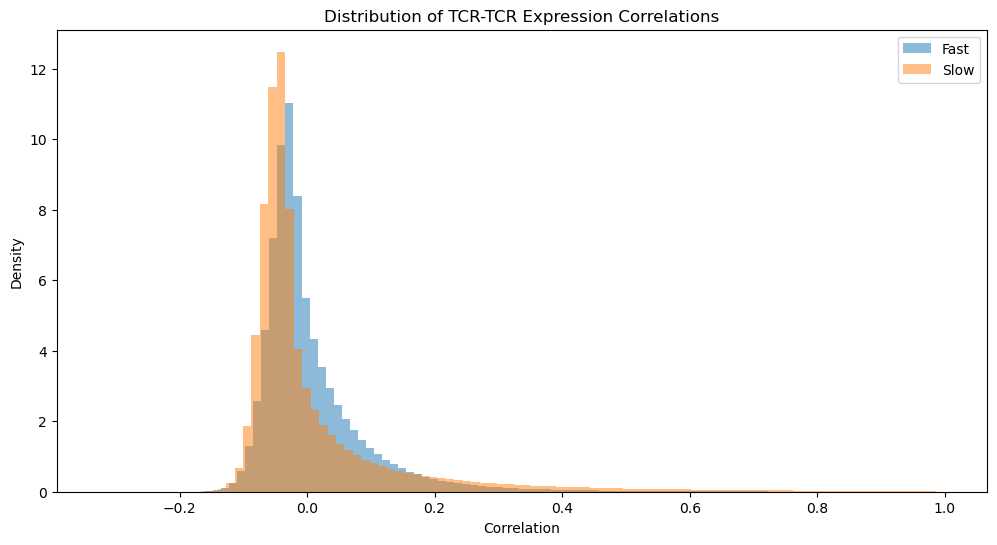

In [17]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
plt.hist(fast_corr_vals, bins=100, alpha=0.5, label="Fast", density=True)
plt.hist(slow_corr_vals, bins=100, alpha=0.5, label="Slow", density=True)
plt.xlabel("Correlation")
plt.ylabel("Density")
plt.legend()
plt.title("Distribution of TCR-TCR Expression Correlations")
plt.show()


In [17]:
def threshold_from_percentile(corr_vals, percentile=99):
    return np.percentile(corr_vals, percentile)

# For 99th percentile (top 1% most positive correlations)
fast_thresh = threshold_from_percentile(fast_corr_vals, 99)
slow_thresh = threshold_from_percentile(slow_corr_vals, 99)

print("Fast threshold (99th):", fast_thresh)
print("Slow threshold (99th):", slow_thresh)

Fast threshold (99th): 0.35839833703838103
Slow threshold (99th): 0.6502214891804591


fast:

Correlation threshold for 81 nodes: <bound method Series.corr of 

tcr1       CASSHTDTQYF

tcr2    CASSSLAGSYEQYF

corr          0.999451

slow:

Correlation threshold for 80 nodes: 0.9996

Threshold 0.679: 11338 nodes
Threshold 0.840: 4708 nodes
Threshold 0.920: 2446 nodes
Threshold 0.960: 1444 nodes
Threshold 0.980: 911 nodes
Threshold 0.990: 613 nodes

In [ ]:
threshold, node_count = find_threshold_for_n_nodes(
    fast_corr, target_n_nodes=80, min_r=fast_thresh, max_r=1, tol=5
)
print(f"Fast graph: threshold for ~{node_count} nodes is {threshold:.4f}")

In [ ]:
threshold, node_count = find_threshold_for_n_nodes(
    slow_corr, target_n_nodes=80, min_r=slow_thresh, max_r=1, tol=5
)
print(f"Slow graph: threshold for ~{node_count} nodes is {threshold:.4f}")


In [ ]:
# Build both graphs
G_fast = build_full_corr_graph(fast_corr, fast_thresh)
G_slow = build_full_corr_graph(slow_corr, slow_thresh)

In [ ]:
# save_graph(G_fast_sub, '/dsi/sbm/OrrBavly/colon_data/graphs/G_fast_80_nodes.pkl')
# save_graph(G_sub_slow, '/dsi/sbm/OrrBavly/colon_data/graphs/G_slow_80_nodes.pkl')

# G_fast = load_graph('/dsi/sbm/OrrBavly/colon_data/graphs/G_fast_99_perc.pkl')
# G_slow = load_graph('/dsi/sbm/OrrBavly/colon_data/graphs/G_slow_99_perc.pkl')

Optionaly - after creating the graphs, load them for reuse.

In [ ]:
print("Fast Graph:")
print(f"Nodes: {G_fast.number_of_nodes()}")
print(f"Edges: {G_fast.number_of_edges()}")
print(f"Average degree: {sum(dict(G_fast.degree()).values()) / G_fast.number_of_nodes():.2f}")

print("\nSlow Graph:")
print(f"Nodes: {G_slow.number_of_nodes()}")
print(f"Edges: {G_slow.number_of_edges()}")
print(f"Average degree: {sum(dict(G_slow.degree()).values()) / G_slow.number_of_nodes():.2f}")


Fast Graph:
Nodes: 21553
Edges: 2328806
Average degree: 216.10

Slow Graph:
Nodes: 21582
Edges: 2328806
Average degree: 215.81


if the graph was constucted using set percentile value, graphs should have the same number of edges (as they have the same amount of nodes).

avg degree of 1079.05 is exatcly 5 percent from the 95th percentiles useed to determine edges (1079.75/21582[num of nodes] = 5)

In [35]:
def plot_edge_weight_dist(G, title):
    weights = [d['weight'] for _, _, d in G.edges(data=True)]
    plt.figure()
    plt.hist(weights, bins=50)
    plt.title(f'Edge weight (correlation) distribution: {title}')
    plt.xlabel('Correlation (r)')
    plt.ylabel('Edge count')
    plt.show()

def plot_degree_dist(G, title):
    degrees = [deg for _, deg in G.degree()]
    plt.figure()
    plt.hist(degrees, bins=30)
    plt.title(f'Degree distribution: {title}')
    plt.xlabel('Degree')
    plt.ylabel('Count')
    plt.show()

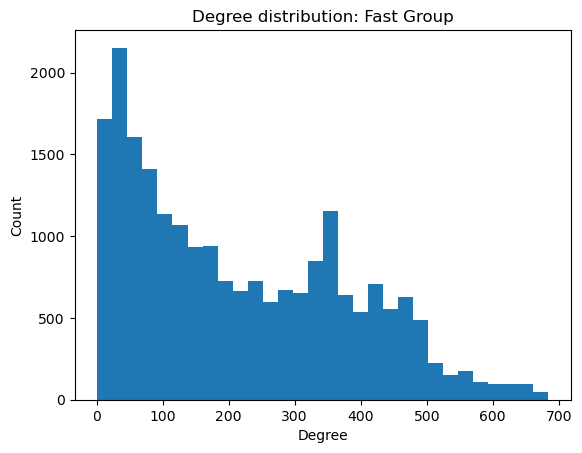

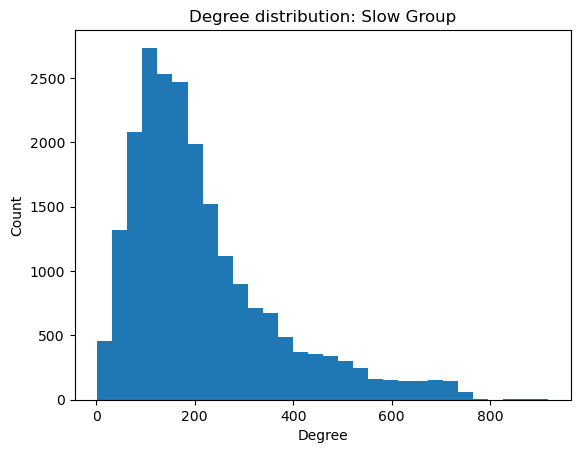

In [ ]:
plot_degree_dist(G_fast, "Fast Group")
plot_degree_dist(G_slow, "Slow Group")

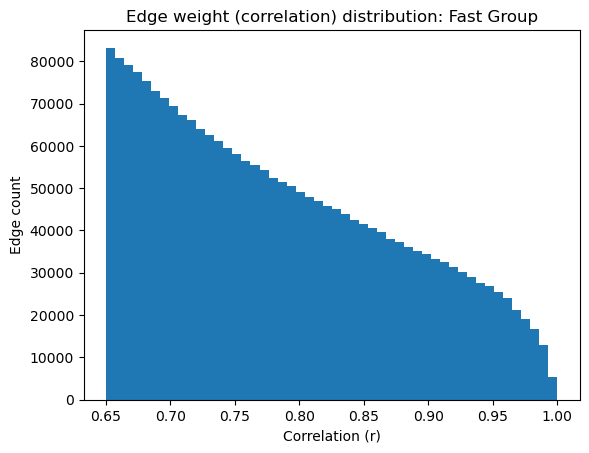

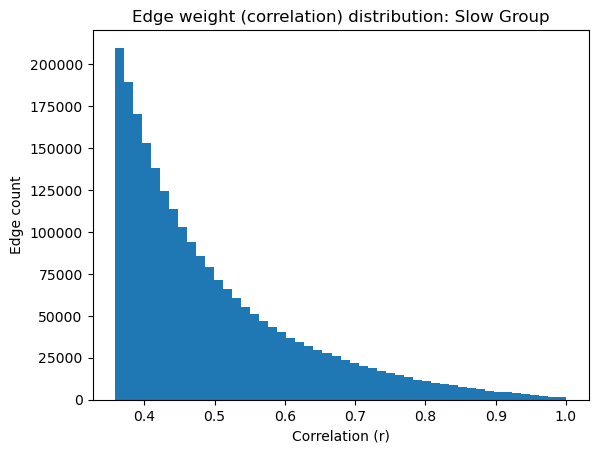

In [ ]:
plot_edge_weight_dist(G_fast, "Fast Group")
plot_edge_weight_dist(G_slow, "Slow Group")

List top TCRs by degree/strength?

Identify shared edges between the fast and slow graphs?

Visualize a subgraph around a “hub” TCR?

Detect and visualize communities?

visualize nodes by v/j gene usage? can use cosmograph for easy visualization.

In [20]:
G_fast_95 = load_graph('/dsi/sbm/OrrBavly/colon_data/graphs/G_fast_95_perc.pkl')
G_slow_95 = load_graph('/dsi/sbm/OrrBavly/colon_data/graphs/G_slow_95_perc.pkl')

In [21]:
print("Fast Graph:")
print(f"Nodes: {G_fast_95.number_of_nodes()}")
print(f"Edges: {G_fast_95.number_of_edges()}")
print(f"Average degree: {sum(dict(G_fast_95.degree()).values()) / G_fast_95.number_of_nodes():.2f}")

print("\nSlow Graph:")
print(f"Nodes: {G_slow_95.number_of_nodes()}")
print(f"Edges: {G_slow_95.number_of_edges()}")
print(f"Average degree: {sum(dict(G_slow_95.degree()).values()) / G_slow_95.number_of_nodes():.2f}")

Fast Graph:
Nodes: 21582
Edges: 11644029
Average degree: 1079.05

Slow Graph:
Nodes: 21582
Edges: 11644029
Average degree: 1079.05


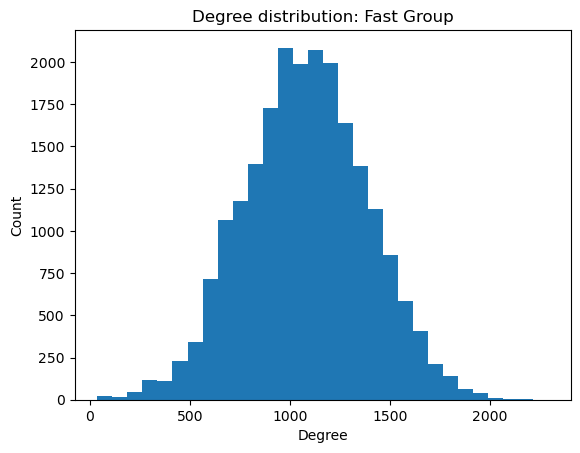

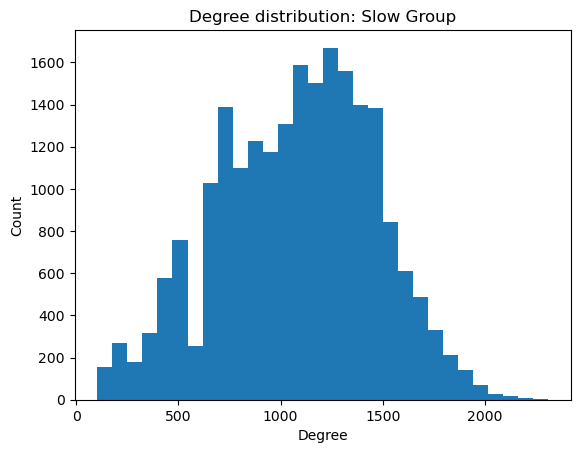

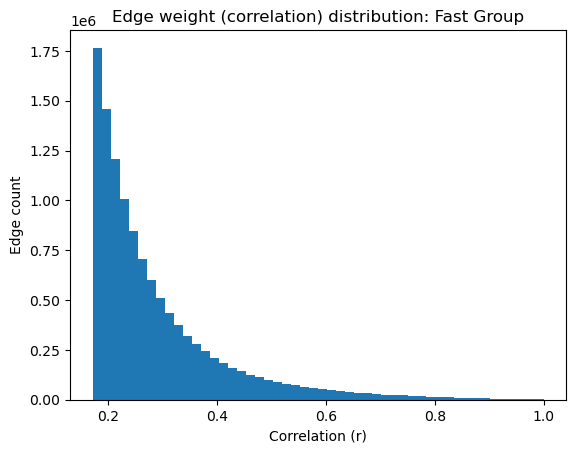

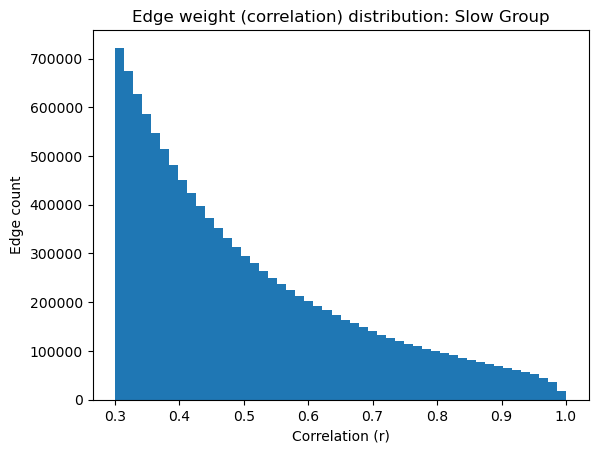

In [24]:
plot_degree_dist(G_fast_95, "Fast Group")
plot_degree_dist(G_slow_95, "Slow Group")

plot_edge_weight_dist(G_fast_95, "Fast Group")
plot_edge_weight_dist(G_slow_95, "Slow Group")


In [36]:
print("Fast Graph:")
print(f"Nodes: {G_fast_sub.number_of_nodes()}")
print(f"Edges: {G_fast_sub.number_of_edges()}")
print(f"Average degree: {sum(dict(G_fast_sub.degree()).values()) / G_fast_sub.number_of_nodes():.2f}")

print("\nSlow Graph:")
print(f"Nodes: {G_sub_slow.number_of_nodes()}")
print(f"Edges: {G_sub_slow.number_of_edges()}")
print(f"Average degree: {sum(dict(G_sub_slow.degree()).values()) / G_sub_slow.number_of_nodes():.2f}")

Fast Graph:
Nodes: 79
Edges: 60
Average degree: 1.52

Slow Graph:
Nodes: 80
Edges: 84
Average degree: 2.10


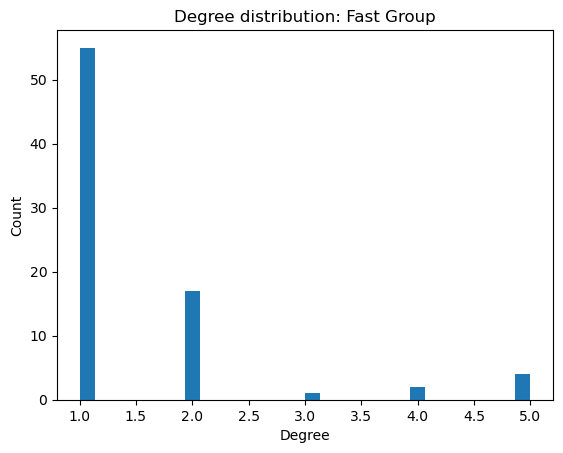

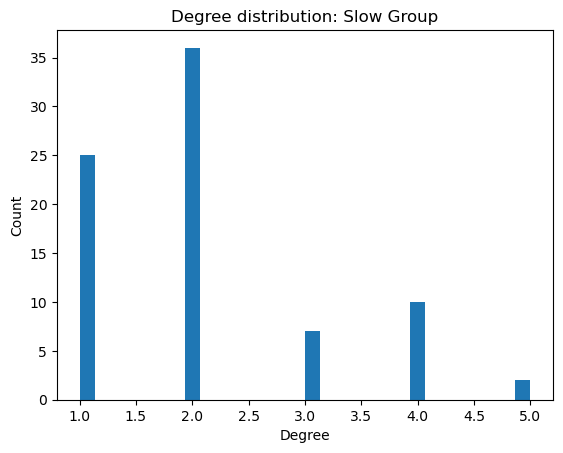

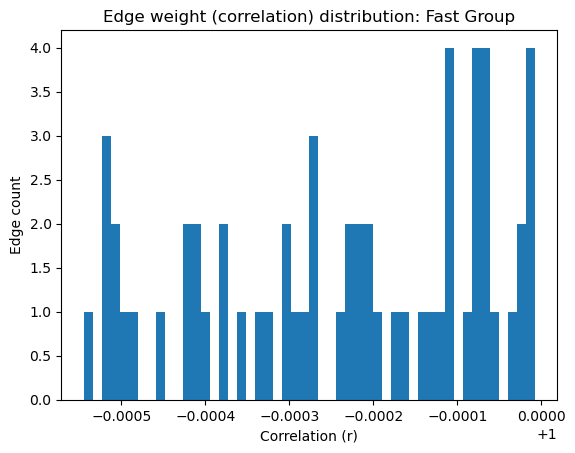

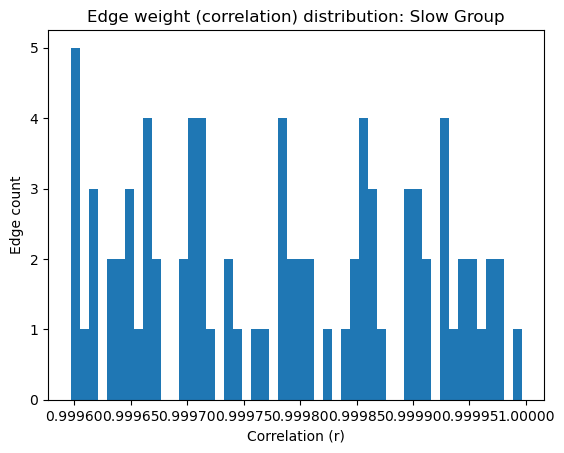

In [40]:
plot_degree_dist(G_fast_sub, "Fast Group")
plot_degree_dist(G_sub_slow, "Slow Group")

plot_edge_weight_dist(G_fast_sub, "Fast Group")
plot_edge_weight_dist(G_sub_slow, "Slow Group")

#### Tuning overlap graph

In [3]:
fast_corr = pd.read_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/fast_corr.pkl")
slow_corr = pd.read_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/slow_corr.pkl")
fast_df = pd.read_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_fast_df.pkl")
slow_df = pd.read_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_slow_df.pkl")
qualified_df = pd.read_pickle("/dsi/sbm/OrrBavly/colon_data/new_mixcr/tables/qualified_df.pkl")


In [10]:
import networkx as nx

def intersection_graph_with_weights(G1, G2, attr1='weight', attr2='weight', new_attr1='fast_weight', new_attr2='slow_weight'):
    """
    Returns a new graph with only edges present in both G1 and G2.
    Edge attributes from G1 and G2 are preserved as new_attr1 and new_attr2.
    Only nodes with at least one shared edge will be included.
    """
    G_inter = nx.Graph()
    # Create sets of edges as (nodeA, nodeB) sorted tuples for undirected comparison
    edges1 = set(tuple(sorted(e)) for e in G1.edges())
    edges2 = set(tuple(sorted(e)) for e in G2.edges())
    shared_edges = edges1 & edges2
    
    for u, v in shared_edges:
        # Copy correlation weights from both graphs
        w1 = G1[u][v][attr1]
        w2 = G2[u][v][attr2]
        G_inter.add_edge(u, v, **{new_attr1: w1, new_attr2: w2})
    return G_inter


The idea is to find an overlap graph, with around N (e.g 80) nodes in its biggest connected component.


In [11]:
import numpy as np
import networkx as nx

def largest_component_size(G):
    if G.number_of_nodes() == 0:
        return 0
    return max(len(c) for c in nx.connected_components(G))

def tune_overlap_graph(
    fast_corr, slow_corr, 
    target_size=80, 
    init_min_r_fast=None, 
    init_min_r_slow=None,
    step=0.01, 
    max_iter=30, 
    tol=5, 
    verbose=True
):
    # Estimate good starting thresholds if not given
    if init_min_r_fast is None:
        fast_vals = fast_corr.values[np.triu_indices_from(fast_corr, k=1)]
        init_min_r_fast = np.percentile(fast_vals, 99)  # or adjust
    if init_min_r_slow is None:
        slow_vals = slow_corr.values[np.triu_indices_from(slow_corr, k=1)]
        init_min_r_slow = np.percentile(slow_vals, 99)
        
    min_r_fast = init_min_r_fast
    min_r_slow = init_min_r_slow
    best_diff = float('inf')
    best_result = None
    
    for i in range(max_iter):
        # Build graphs
        G_fast = build_pos_corr_graph_faster(fast_corr, min_r_fast)
        G_slow = build_pos_corr_graph_faster(slow_corr, min_r_slow)
        # Intersect
        G_overlap = intersection_graph_with_weights(G_fast, G_slow)
        # Largest component size
        lcc_size = largest_component_size(G_overlap)
        diff = abs(lcc_size - target_size)
        if verbose:
            print(f"Iter {i}: min_r_fast={min_r_fast:.4f}, min_r_slow={min_r_slow:.4f}, "
                  f"LCC size={lcc_size}, nodes={G_overlap.number_of_nodes()}, edges={G_overlap.number_of_edges()}")
        # Save best result so far
        if diff < best_diff:
            best_diff = diff
            best_result = (min_r_fast, min_r_slow, G_fast, G_slow, G_overlap, lcc_size)
        # Converged?
        if diff <= tol:
            break
        # Adjust thresholds:
        if lcc_size > target_size:
            # Too big: increase thresholds
            min_r_fast += step
            min_r_slow += step
        else:
            # Too small: decrease thresholds
            min_r_fast -= step
            min_r_slow -= step
    # Return best result
    return {
        "min_r_fast": best_result[0],
        "min_r_slow": best_result[1],
        "G_fast": best_result[2],
        "G_slow": best_result[3],
        "G_overlap": best_result[4],
        "lcc_size": best_result[5]
    }

In [16]:
tune_results = tune_overlap_graph(
    fast_corr, slow_corr,
    init_min_r_fast= 0.6300, 
    init_min_r_slow= 0.6500,
    target_size=250, # LCC target size
    step=0.0005,    # Try 0.01 or smaller for fine control
    max_iter=40,
    tol=5,         # Acceptable range
    verbose=True
)
G_overlap = tune_results["G_overlap"]

Iter 0: min_r_fast=0.6300, min_r_slow=0.6500, LCC size=263, nodes=8203, edges=10891
Iter 1: min_r_fast=0.6305, min_r_slow=0.6505, LCC size=262, nodes=8176, edges=10833
Iter 2: min_r_fast=0.6310, min_r_slow=0.6510, LCC size=262, nodes=8142, edges=10768
Iter 3: min_r_fast=0.6315, min_r_slow=0.6515, LCC size=261, nodes=8106, edges=10718
Iter 4: min_r_fast=0.6320, min_r_slow=0.6520, LCC size=252, nodes=8067, edges=10667


Iter 8: min_r_fast=0.9130, min_r_slow=0.9330, LCC size=12, nodes=64, edges=77  
Iter 9: min_r_fast=0.9135, min_r_slow=0.9335, LCC size=11, nodes=63, edges=76  
Iter 10: min_r_fast=0.9140, min_r_slow=0.9340, LCC size=11, nodes=61, edges=74  
Iter 11: min_r_fast=0.9145, min_r_slow=0.9345, LCC size=11, nodes=59, edges=73  
Iter 12: min_r_fast=0.9150, min_r_slow=0.9350, LCC size=11, nodes=59, edges=73  
Iter 13: min_r_fast=0.9155, min_r_slow=0.9355, LCC size=11, nodes=59, edges=73  
Iter 14: min_r_fast=0.9160, min_r_slow=0.9360, LCC size=11, nodes=59, edges=73

NEW:

Iter 27: min_r_fast=0.9335, min_r_slow=0.9535, LCC size=10, nodes=30, edges=45

OLD:

80:
 min_r_fast=0.5985, min_r_slow=0.6185, LCC size=79, nodes=5255, edges=6299

10:
min_r_fast=0.9300, min_r_slow=0.9500, LCC size=11, edges=58

min_r_fast=0.9200, min_r_slow=0.9400, LCC size=11, edges=72

min_r_fast=0.9100, min_r_slow=0.9300, LCC size=12, edges=95

min_r_fast=0.9000, min_r_slow=0.9200, LCC size=12, edges=120

250

Iter 10: min_r_fast=0.5800, min_r_slow=0.6000, LCC size=265, nodes=6158, edges=7652

Iter 11: min_r_fast=0.5830, min_r_slow=0.6030, LCC size=246, nodes=6024, edges=7430

NEW:

Iter 0: min_r_fast=0.5800, min_r_slow=0.6000, LCC size=242, nodes=5622, edges=6860

Iter 1: min_r_fast=0.5790, min_r_slow=0.5990, LCC size=254, nodes=5672, edges=6944

NEW 4 SAMPLES:

Iter 4: min_r_fast=0.6320, min_r_slow=0.6520, LCC size=252, nodes=8067, edges=10667


50

Iter 2: min_r_fast=0.6060, min_r_slow=0.6260, LCC size=56, nodes=4915, edges=5823

Iter 3: min_r_fast=0.6090, min_r_slow=0.6290, LCC size=53, nodes=4753, edges=5631

150

Iter 98: min_r_fast=0.5972, min_r_slow=0.6172, LCC size=151, nodes=5325, edges=6384

In [17]:
G_fast_sub = build_pos_corr_graph_faster(fast_corr, min_r=0.6320)
G_slow_sub = build_pos_corr_graph_faster(slow_corr, min_r=0.6520)

In [18]:
G_overlap = intersection_graph_with_weights(G_fast_sub, G_slow_sub)

In [ ]:
save_graph(G_overlap, "/dsi/sbm/OrrBavly/colon_data/graphs/G_overlap_253_nodes.pkl")

In [19]:
print(f"Overlap Graph: {G_overlap.number_of_nodes()} nodes, {G_overlap.number_of_edges()} edges")
print(f"Average degree: {sum(dict(G_overlap.degree()).values()) / G_overlap.number_of_nodes():.2f}")

Overlap Graph: 8067 nodes, 10667 edges
Average degree: 2.64


In [20]:
# Get all connected components sorted by size (largest to smallest)
components = sorted(nx.connected_components(G_overlap), key=len, reverse=True)

# Extract the largest and second-largest
largest_cc_nodes = components[0]
second_largest_cc_nodes = components[1]

# Create subgraphs
G_overlap_lcc_largest = G_overlap.subgraph(largest_cc_nodes).copy()
G_overlap_lcc_second = G_overlap.subgraph(second_largest_cc_nodes).copy()


In [21]:
print(len(G_overlap_lcc_largest.nodes()))
print(len(G_overlap_lcc_second.nodes()))

252
61


In [14]:
print(G_overlap_lcc_largest.nodes())


['CASSPGYYEQYF', 'CASSPGLAGDTGELFF', 'CASSPGQGGDTQYF', 'CASSLDFYNEQFF', 'CASSPNMNTEAFF', 'CASSLVKDTQYF', 'CASSLGQGQETQYF', 'CASSEAGGYNEQFF', 'CASSGQGSGANVLTF', 'CASSLTAGANVLTF', 'CASSLEAEETQYF']


In [22]:
save_graph(G_overlap_lcc_largest, "/dsi/sbm/OrrBavly/colon_data/graphs/G_overlap_lcc_252_gnn_new_4.pkl")

In [58]:
meta_lcc_11_df = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/g_overlap_metadata_lcc_11.csv")

# Get subsets of metadata for each component
meta_largest = meta_lcc_11_df[meta_lcc_11_df['id'].isin(G_overlap_lcc_largest.nodes())].copy()
meta_second = meta_lcc_11_df[meta_lcc_11_df['id'].isin(G_overlap_lcc_second.nodes())].copy()

In [ ]:
meta_largest.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_largest_11_new.csv")
meta_second.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_second_11_new.csv")

#### Weight information

In [ ]:
import pandas as pd
def save_edge_weights_df(G_overlap):
    # Extract edges with attributes
    edge_data = [
        {
            "source": u,
            "target": v,
            "fast_weight": d.get("fast_weight", 0),
            "slow_weight": d.get("slow_weight", 0),
            "sum_weight": d.get("fast_weight", 0) + d.get("slow_weight", 0),
            "avg_weight": (d.get("fast_weight", 0) + d.get("slow_weight", 0)) / 2
        }
        for u, v, d in G_overlap.edges(data=True)
    ]

    df_edges = pd.DataFrame(edge_data)
    return df_edges
df_edges = save_edge_weights_df(G_overlap)
df_edges.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/g_overlap_data_lcc_11_new.csv", index=False)


In [26]:
import re
# Create per-group node annotations from survivor-qualified data only
vj_map_fast = (
    fast_df.groupby("aaSeqCDR3")
    .agg({
        "allVHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
        "allJHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
        "nSeqCDR3": pd.Series.nunique,
        "Sample_ID": pd.Series.nunique  # Number of fast samples with this TCR
    })
    .rename(columns={
        "allVHitsWithScore": "V_gene_fast",
        "allJHitsWithScore": "J_gene_fast",
        "nSeqCDR3": "codon_diversity_fast",
        "Sample_ID": "sample_prevalence_fast"
    })
)

vj_map_slow = (
    slow_df.groupby("aaSeqCDR3")
    .agg({
        "allVHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
        "allJHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
        "nSeqCDR3": pd.Series.nunique,
        "Sample_ID": pd.Series.nunique  # Number of slow samples with this TCR
    })
    .rename(columns={
        "allVHitsWithScore": "V_gene_slow",
        "allJHitsWithScore": "J_gene_slow",
        "nSeqCDR3": "codon_diversity_slow",
        "Sample_ID": "sample_prevalence_slow"
    })
)

def clean_vj(gene_str):
    # Remove everything from the first "*" onward
    return re.sub(r"\*.*", "", gene_str) if isinstance(gene_str, str) else gene_str

vj_map_fast["V_gene_fast"] = vj_map_fast["V_gene_fast"].apply(clean_vj)
vj_map_fast["J_gene_fast"] = vj_map_fast["J_gene_fast"].apply(clean_vj)
vj_map_slow["V_gene_slow"] = vj_map_slow["V_gene_slow"].apply(clean_vj)
vj_map_slow["J_gene_slow"] = vj_map_slow["J_gene_slow"].apply(clean_vj)

In [27]:
# Network metrics
degree_dict = dict(G_overlap.degree())
betweenness = nx.betweenness_centrality(G_overlap)
closeness = nx.closeness_centrality(G_overlap)
eigenvector = nx.eigenvector_centrality(G_overlap, max_iter=500)

def node_strength(G, weight_key):
    return {n: sum(d[weight_key] for _, _, d in G.edges(n, data=True)) for n in G.nodes}

strength_fast = node_strength(G_overlap, 'fast_weight')
strength_slow = node_strength(G_overlap, 'slow_weight')

# Build node metadata, merging per-group features
node_data = []
for node in G_overlap.nodes():
    row = {
        "id": node,
        "degree": degree_dict[node],
        "betweenness": betweenness[node],
        "closeness": closeness[node],
        "eigenvector": eigenvector[node],
        "strength_fast": strength_fast.get(node, 0),
        "strength_slow": strength_slow.get(node, 0),
    }
    if node in vj_map_fast.index:
        row.update(vj_map_fast.loc[node].to_dict())
    if node in vj_map_slow.index:
        row.update(vj_map_slow.loc[node].to_dict())
    node_data.append(row)

df_nodes = pd.DataFrame(node_data)
df_nodes.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/g_overlap_metadata_lcc_11_new.csv", index=False)

In [23]:
import pandas as pd
import re

def create_node_meta_df_for_gnn(G_overlap):
    # This function creates static (predetermined) information about nodes (TCRs) that will be later used
    # as initial node embedding input in GNN algorithm.
    
    def aggregate_edge_weights(G, weight_key):
        """Return a dict mapping node -> sum of edge weights for that key."""
        return {
            node: sum(G[node][nbr].get(weight_key, 0) for nbr in G.neighbors(node))
            for node in G.nodes
        }

    sum_fast = aggregate_edge_weights(G_overlap, 'fast_weight')
    avg_fast = {k: v / G_overlap.degree[k] if G_overlap.degree[k] else 0 for k, v in sum_fast.items()}
    sum_slow = aggregate_edge_weights(G_overlap, 'slow_weight')
    avg_slow = {k: v / G_overlap.degree[k] if G_overlap.degree[k] else 0 for k, v in sum_slow.items()}

    overlap_node_meta_df = pd.DataFrame({'id': list(G_overlap.nodes())})
    overlap_node_meta_df['sum_fast_weight'] = overlap_node_meta_df['id'].map(sum_fast)
    overlap_node_meta_df['avg_fast_weight'] = overlap_node_meta_df['id'].map(avg_fast)
    overlap_node_meta_df['sum_slow_weight'] = overlap_node_meta_df['id'].map(sum_slow)
    overlap_node_meta_df['avg_slow_weight'] = overlap_node_meta_df['id'].map(avg_slow)

    # Define function to clean allele info from V/J genes
    def clean_vj(gene_str):
        return re.sub(r"\*.*", "", gene_str) if isinstance(gene_str, str) else gene_str

    # Generate per-group metadata from fast_df
    vj_map_fast = (
        fast_df.groupby("aaSeqCDR3")
        .agg({
            "allVHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
            "allJHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
            "nSeqCDR3": pd.Series.nunique,
            "Sample_ID": pd.Series.nunique
        })
        .rename(columns={
            "allVHitsWithScore": "V_gene_fast",
            "allJHitsWithScore": "J_gene_fast",
            "nSeqCDR3": "codon_diversity_fast",
            "Sample_ID": "sample_prevalence_fast"
        })
    )

    # Generate per-group metadata from slow_df
    vj_map_slow = (
        slow_df.groupby("aaSeqCDR3")
        .agg({
            "allVHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
            "allJHitsWithScore": lambda x: x.mode()[0] if not x.mode().empty else "",
            "nSeqCDR3": pd.Series.nunique,
            "Sample_ID": pd.Series.nunique
        })
        .rename(columns={
            "allVHitsWithScore": "V_gene_slow",
            "allJHitsWithScore": "J_gene_slow",
            "nSeqCDR3": "codon_diversity_slow",
            "Sample_ID": "sample_prevalence_slow"
        })
    )

    # Clean allele info
    vj_map_fast["V_gene_fast"] = vj_map_fast["V_gene_fast"].apply(clean_vj)
    vj_map_fast["J_gene_fast"] = vj_map_fast["J_gene_fast"].apply(clean_vj)
    vj_map_slow["V_gene_slow"] = vj_map_slow["V_gene_slow"].apply(clean_vj)
    vj_map_slow["J_gene_slow"] = vj_map_slow["J_gene_slow"].apply(clean_vj)

    # Merge both metadata sets into it
    overlap_node_meta_df = (
        overlap_node_meta_df
        .merge(vj_map_fast, left_on='id', right_index=True, how='left')
        .merge(vj_map_slow, left_on='id', right_index=True, how='left')
    )

    # graph level stats
    degree_dict = dict(G_overlap.degree())
    betweenness = nx.betweenness_centrality(G_overlap)
    closeness = nx.closeness_centrality(G_overlap)
    eigenvector = nx.eigenvector_centrality(G_overlap, max_iter=500)

    # Convert metrics to Series with index as node IDs
    degree_series = pd.Series(degree_dict, name='degree')
    betweenness_series = pd.Series(betweenness, name='betweenness')
    closeness_series = pd.Series(closeness, name='closeness')
    eigenvector_series = pd.Series(eigenvector, name='eigenvector')

    # Merge all into overlap_node_meta_df
    overlap_node_meta_df = (
        overlap_node_meta_df
        .merge(degree_series, left_on='id', right_index=True, how='left')
        .merge(betweenness_series, left_on='id', right_index=True, how='left')
        .merge(closeness_series, left_on='id', right_index=True, how='left')
        .merge(eigenvector_series, left_on='id', right_index=True, how='left')
    )

    # Step 1: Combine all V genes to create a unified vocabulary
    all_v_genes = pd.concat([
        overlap_node_meta_df['V_gene_fast'],
        overlap_node_meta_df['V_gene_slow']
    ]).dropna().unique()
    # Step 2: Create mapping from V gene name to integer ID
    unique_v_genes = sorted(set(all_v_genes))
    v_gene_to_id = {v: i for i, v in enumerate(unique_v_genes)}
    # Step 3: Map V_gene columns to integer IDs
    overlap_node_meta_df['V_gene_fast_id'] = overlap_node_meta_df['V_gene_fast'].map(v_gene_to_id)
    overlap_node_meta_df['V_gene_slow_id'] = overlap_node_meta_df['V_gene_slow'].map(v_gene_to_id)
    # Step 1: Combine all J genes to create a unified vocabulary
    all_j_genes = pd.concat([
        overlap_node_meta_df['J_gene_fast'],
        overlap_node_meta_df['J_gene_slow']
    ]).dropna().unique()
    unique_j_genes = sorted(set(all_j_genes))
    j_gene_to_id = {j: i for i, j in enumerate(unique_j_genes)}
    overlap_node_meta_df['J_gene_fast_id'] = overlap_node_meta_df['J_gene_fast'].map(j_gene_to_id)
    overlap_node_meta_df['J_gene_slow_id'] = overlap_node_meta_df['J_gene_slow'].map(j_gene_to_id)

    return overlap_node_meta_df

In [24]:
overlap_node_meta_df = create_node_meta_df_for_gnn(G_overlap_lcc_largest)
overlap_node_meta_df

,id,sum_fast_weight,avg_fast_weight,sum_slow_weight,avg_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,...,codon_diversity_slow,sample_prevalence_slow,degree,betweenness,closeness,eigenvector,V_gene_fast_id,V_gene_slow_id,J_gene_fast_id,J_gene_slow_id
0,CASSLGGTGKETQYF,2.868686,0.717171,3.157547,0.789387,TRBV5-1,TRBJ2-5,7,10,TRBV5-1,...,5,4,4,0.154603,0.092449,1.761073e-06,21,21,9,9
1,CASSLDGMNTEAFF,1.485420,0.742710,1.408430,0.704215,TRBV10-2,TRBJ1-1,26,57,TRBV12-3,...,11,11,2,0.315474,0.082920,5.701988e-09,1,5,0,0
2,CASSPEGNYGYTF,3.642809,0.728562,3.607903,0.721581,TRBV10-2,TRBJ1-2,23,25,TRBV12-4,...,4,4,5,0.095559,0.064293,2.552660e-14,1,6,1,1
3,CASSPTGGNTEAFF,2.401254,0.800418,2.083431,0.694477,TRBV5-1,TRBJ1-1,58,59,TRBV12-3,...,18,12,3,0.000036,0.066614,2.986196e-02,21,5,0,0
4,CASSRQGSNQPQHF,1.338463,0.669232,1.729436,0.864718,TRBV12-4,TRBJ1-5,33,50,TRBV12-3,...,12,12,2,0.000000,0.090158,2.832632e-07,6,5,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
247,CASSYGQGSYEQYF,1.350232,0.675116,1.361926,0.680963,TRBV10-2,TRBJ2-7,23,37,TRBV5-1,...,10,9,2,0.000000,0.086077,2.287565e-05,1,21,11,11
248,CASSLGQDYEQYF,1.328831,0.664415,1.327278,0.663639,TRBV10-1,TRBJ2-7,45,53,TRBV10-1,...,9,10,2,0.240956,0.069916,1.632307e-02,0,0,11,11
249,CASSPGTSGNTIYF,2.121911,0.707304,2.392128,0.797376,TRBV3-1,TRBJ1-3,30,32,TRBV12-3,...,5,4,3,0.015873,0.045862,7.475806e-22,17,5,2,2
250,CASSGQPNTEAFF,0.725855,0.725855,0.660057,0.660057,TRBV10-1,TRBJ1-1,21,36,TRBV2,...,6,10,1,0.000000,0.054376,1.504056e-17,0,11,0,0


In [25]:
overlap_node_meta_df[['id', 'V_gene_fast', "V_gene_slow", "J_gene_fast", "J_gene_slow"]]

,id,V_gene_fast,V_gene_slow,J_gene_fast,J_gene_slow
0,CASSLGGTGKETQYF,TRBV5-1,TRBV5-1,TRBJ2-5,TRBJ2-5
1,CASSLDGMNTEAFF,TRBV10-2,TRBV12-3,TRBJ1-1,TRBJ1-1
2,CASSPEGNYGYTF,TRBV10-2,TRBV12-4,TRBJ1-2,TRBJ1-2
3,CASSPTGGNTEAFF,TRBV5-1,TRBV12-3,TRBJ1-1,TRBJ1-1
4,CASSRQGSNQPQHF,TRBV12-4,TRBV12-3,TRBJ1-5,TRBJ1-5
...,...,...,...,...,...
247,CASSYGQGSYEQYF,TRBV10-2,TRBV5-1,TRBJ2-7,TRBJ2-7
248,CASSLGQDYEQYF,TRBV10-1,TRBV10-1,TRBJ2-7,TRBJ2-7
249,CASSPGTSGNTIYF,TRBV3-1,TRBV12-3,TRBJ1-3,TRBJ1-3
250,CASSGQPNTEAFF,TRBV10-1,TRBV2,TRBJ1-1,TRBJ1-1


In [26]:
overlap_node_meta_df.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/g_overlap_lcc_252_node_meta_gnn_new_4.csv")

In [22]:
overlap_node_meta_df_second = create_node_meta_df_for_gnn(G_overlap_lcc_second)
overlap_node_meta_df_second

,id,sum_fast_weight,avg_fast_weight,sum_slow_weight,avg_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,...,codon_diversity_slow,sample_prevalence_slow,degree,betweenness,closeness,eigenvector,V_gene_fast_id,V_gene_slow_id,J_gene_fast_id,J_gene_slow_id
0,CASSPPGQGNYGYTF,4.743591,0.948718,4.922718,0.984544,TRBV12-3,TRBJ1-2,21,23,TRBV12-3,...,5,5,5,0.15,1.000000,0.461137,4,4,0,0
1,CASSLPGSGANVLTF,3.787508,0.946877,3.961635,0.990409,TRBV12-3,TRBJ2-6,49,46,TRBV11-1,...,6,6,4,0.00,0.833333,0.418935,4,1,3,3
2,CASSLVGASSYNEQFF,4.758463,0.951693,4.943791,0.988758,TRBV12-3,TRBJ2-1,13,12,TRBV5-1,...,5,5,5,0.15,1.000000,0.461137,4,6,1,1
3,CASSQGLAGGYEQYF,3.728940,0.932235,3.940708,0.985177,TRBV10-1,TRBJ2-7,34,36,TRBV11-3,...,8,7,4,0.00,0.833333,0.418935,0,3,4,4
4,CASSPTGAQETQYF,1.849388,0.924694,1.982584,0.991292,TRBV11-2,TRBJ2-5,29,30,TRBV18,...,5,5,2,0.00,0.625000,0.219513,2,5,2,2
5,CASSGGQGPYEQYF,3.784597,0.946149,3.945117,0.986279,TRBV12-3,TRBJ2-7,16,22,TRBV11-2,...,8,8,4,0.00,0.833333,0.418935,4,2,4,4


In [28]:
overlap_node_meta_df_second[['id', 'V_gene_fast', "V_gene_slow", "J_gene_fast", "J_gene_slow"]]

,id,V_gene_fast,V_gene_slow,J_gene_fast,J_gene_slow
0,CASSPPGQGNYGYTF,TRBV12-3,TRBV12-3,TRBJ1-2,TRBJ1-2
1,CASSLPGSGANVLTF,TRBV12-3,TRBV11-1,TRBJ2-6,TRBJ2-6
2,CASSLVGASSYNEQFF,TRBV12-3,TRBV5-1,TRBJ2-1,TRBJ2-1
3,CASSQGLAGGYEQYF,TRBV10-1,TRBV11-3,TRBJ2-7,TRBJ2-7
4,CASSPTGAQETQYF,TRBV11-2,TRBV18,TRBJ2-5,TRBJ2-5
5,CASSGGQGPYEQYF,TRBV12-3,TRBV11-2,TRBJ2-7,TRBJ2-7


In [23]:
overlap_node_meta_df_second.to_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_second_11_new.csv")

In [ ]:
# For 99th percentile (top 1% most positive correlations)
fast_thresh_99 = np.percentile(fast_corr_vals, 99)
slow_thresh_99 = np.percentile(slow_corr_vals, 99)

# Build graphs with new threshold
G_fast_99 = build_full_corr_graph(fast_corr, min_r=fast_thresh_99)
G_slow_99 = build_full_corr_graph(slow_corr, min_r=slow_thresh_99)


In [34]:
save_graph(G_slow_99, '/dsi/sbm/OrrBavly/colon_data/graphs/G_fast_99_perc.pkl')
save_graph(G_fast_99, '/dsi/sbm/OrrBavly/colon_data/graphs/G_slow_99_perc.pkl')

In [13]:
def analyze_node_degree(G, tcr_seq):
    """
    Check if a TCR sequence is in the graph G.
    If present, return its degree and compare to the average graph degree.
    """
    if tcr_seq not in G:
        return {
            'present': False,
            'degree': None,
            'avg_degree': sum(dict(G.degree()).values()) / G.number_of_nodes(),
            'compared_to_avg': None
        }

    node_degree = G.degree[tcr_seq]
    avg_degree = sum(dict(G.degree()).values()) / G.number_of_nodes()
    comparison = "above average" if node_degree > avg_degree else "below average" if node_degree < avg_degree else "equal to average"

    return {
        'present': True,
        'degree': node_degree,
        'avg_degree': avg_degree,
        'compared_to_avg': comparison
    }


In [ ]:
result = analyze_node_degree(G_fast, "CASSRDGTYEQYF")

if result['present']:
    print(f"TCR is in the graph.")
    print(f"Degree: {result['degree']}")
    print(f"Average degree: {result['avg_degree']:.2f}")
    print(f"Comparison: {result['compared_to_avg']}")
else:
    print("TCR not found in the graph.")
    

#### Group Statistics


In [8]:
import pandas as pd
import re

def create_node_meta_df_for_subset(tcr_list, fast_df, slow_df):
    """
    Create node metadata only for a given list of TCRs (aaSeqCDR3).
    Focuses on codon diversity, sample prevalence, and their ratios.
    """

    # Metadata from fast_df
    vj_map_fast = (
        fast_df.groupby("aaSeqCDR3")
        .agg({
            "nSeqCDR3": pd.Series.nunique,
            "Sample_ID": pd.Series.nunique
        })
        .rename(columns={
            "nSeqCDR3": "codon_diversity_fast",
            "Sample_ID": "sample_prevalence_fast"
        })
    )

    # Metadata from slow_df
    vj_map_slow = (
        slow_df.groupby("aaSeqCDR3")
        .agg({
            "nSeqCDR3": pd.Series.nunique,
            "Sample_ID": pd.Series.nunique
        })
        .rename(columns={
            "nSeqCDR3": "codon_diversity_slow",
            "Sample_ID": "sample_prevalence_slow"
        })
    )

    # Create base DataFrame for selected TCRs
    node_meta_df = pd.DataFrame({'id': tcr_list})

    # Merge fast/slow stats
    node_meta_df = (
        node_meta_df
        .merge(vj_map_fast, left_on='id', right_index=True, how='left')
        .merge(vj_map_slow, left_on='id', right_index=True, how='left')
    )

    # Calculate ratios
    node_meta_df['codon_div_sample_ratio_fast'] = (
        node_meta_df['codon_diversity_fast'] / node_meta_df['sample_prevalence_fast']
    )
    node_meta_df['codon_div_sample_ratio_slow'] = (
        node_meta_df['codon_diversity_slow'] / node_meta_df['sample_prevalence_slow']
    )

    return node_meta_df


def calculate_group_statistics(tcr_list, fast_df, slow_df):
    """
    Given a list of TCRs (aaSeqCDR3), compute:
    - mean codon diversity (fast and slow)
    - mean codon_diversity / sample_prevalence ratio (fast and slow)
    """

    # Generate metadata only for the given TCRs
    node_meta_df = create_node_meta_df_for_subset(tcr_list, fast_df, slow_df)

    # Compute mean statistics
    stats = {
        'mean_codon_diversity_fast': node_meta_df['codon_diversity_fast'].mean(),
        'mean_codon_diversity_slow': node_meta_df['codon_diversity_slow'].mean(),
        'mean_ratio_fast': node_meta_df['codon_div_sample_ratio_fast'].mean(),
        'mean_ratio_slow': node_meta_df['codon_div_sample_ratio_slow'].mean()
    }

    return stats



In [9]:
from scipy.stats import norm
import numpy as np
import random

def compare_test_to_random(
    test_df,
    qualified_df=qualified_df,
    fast_df=fast_df,
    slow_df=slow_df,
    N=100, # number of TCRs in test_df
    M=1000, # number of random groups sampled
    seed=None
):
    """
    Compare codon diversity stats of a test group to M random TCR groups of size N.
    Adds z-scores, percentiles, and p-values for test-vs-random comparison.
    
    Returns:
        {
            'test_stats': {stat_name: value, ...},
            'random_group_stats': {stat_name: [...], ...},
            'z_scores': {stat_name: value, ...},
            'percentiles': {stat_name: value, ...},
            'p_values': {stat_name: value, ...}
        }
    """
    if seed is not None:
        random.seed(seed)

    # --- STEP 1: Calculate test group stats
    test_df = test_df.copy()
    test_df['codon_div_sample_ratio_fast'] = test_df['codon_diversity_fast'] / test_df['sample_prevalence_fast']
    test_df['codon_div_sample_ratio_slow'] = test_df['codon_diversity_slow'] / test_df['sample_prevalence_slow']

    test_stats = {
        'mean_codon_diversity_fast': test_df['codon_diversity_fast'].mean(),
        'mean_codon_diversity_slow': test_df['codon_diversity_slow'].mean(),
        'mean_ratio_fast': test_df['codon_div_sample_ratio_fast'].mean(),
        'mean_ratio_slow': test_df['codon_div_sample_ratio_slow'].mean()
    }

    # --- STEP 2: Random sampling
    random_group_stats = {
        'mean_codon_diversity_fast': [],
        'mean_codon_diversity_slow': [],
        'mean_ratio_fast': [],
        'mean_ratio_slow': []
    }

    all_tcrs = qualified_df['aaSeqCDR3'].dropna().unique().tolist()

    for _ in range(M):
        random_sample = random.sample(all_tcrs, N)
        stats = calculate_group_statistics(random_sample, fast_df, slow_df)

        for key in random_group_stats:
            random_group_stats[key].append(stats[key])

    # --- STEP 3: Statistical comparisons
    z_scores = {}
    percentiles = {}
    p_values = {}

    for stat_key in test_stats.keys():
        dist = np.array(random_group_stats[stat_key])
        test_val = test_stats[stat_key]

        mean = dist.mean()
        std = dist.std(ddof=1)

        # Z-score
        z = (test_val - mean) / std if std != 0 else np.nan
        z_scores[stat_key] = z

        # Percentile
        percentile = (dist < test_val).sum() / M * 100
        percentiles[stat_key] = percentile

        # One-sided p-value (assuming normal dist, right-tailed)
        p = 1 - norm.cdf(z) if not np.isnan(z) else np.nan
        p_values[stat_key] = p

    return {
        'test_stats': test_stats,
        'random_group_stats': random_group_stats,
        'z_scores': z_scores,
        'percentiles': percentiles,
        'p_values': p_values
    }


In [9]:
test_meta_largest = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_largest_11_new.csv")
test_meta_second = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_second_11_new.csv")


In [10]:
test_meta_largest

,Unnamed: 0,id,sum_fast_weight,avg_fast_weight,sum_slow_weight,avg_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,...,codon_diversity_slow,sample_prevalence_slow,degree,betweenness,closeness,eigenvector,V_gene_fast_id,V_gene_slow_id,J_gene_fast_id,J_gene_slow_id
0,0,CASSPGYYEQYF,5.564751,0.927459,5.969333,0.994889,TRBV11-2,TRBJ2-7,26,24,...,5,5,6,0.000000,0.666667,0.267015,1,6,6,6
1,1,CASSPGLAGDTGELFF,4.657401,0.931480,4.947120,0.989424,TRBV18,TRBJ2-2,16,19,...,7,7,5,0.000000,0.625000,0.225218,6,0,2,2
2,2,CASSPGQGGDTQYF,7.528253,0.941032,7.915978,0.989497,TRBV11-2,TRBJ2-3,35,36,...,11,10,8,0.018519,0.833333,0.327892,1,4,3,3
3,3,CASSLDFYNEQFF,5.627013,0.937835,5.960487,0.993415,TRBV11-3,TRBJ2-1,15,24,...,6,6,6,0.000000,0.666667,0.267015,2,1,1,1
4,4,CASSPNMNTEAFF,8.578246,0.953138,8.828362,0.980929,TRBV11-2,TRBJ1-1,12,19,...,10,12,9,0.040741,0.909091,0.353356,1,5,0,0
5,5,CASSLVKDTQYF,8.688971,0.965441,8.944978,0.993886,TRBV5-1,TRBJ2-3,8,10,...,5,6,9,0.040741,0.909091,0.353356,9,2,3,3
6,6,CASSLGQGQETQYF,8.609398,0.956600,8.911312,0.990146,TRBV12-3,TRBJ2-5,92,102,...,31,21,9,0.040741,0.909091,0.353356,3,1,4,4
7,7,CASSEAGGYNEQFF,0.933322,0.933322,0.983858,0.983858,TRBV2,TRBJ2-1,15,21,...,6,8,1,0.000000,0.454545,0.034600,8,8,1,1
8,8,CASSGQGSGANVLTF,8.669688,0.963299,8.945468,0.993941,TRBV12-3,TRBJ2-6,13,15,...,10,7,9,0.040741,0.909091,0.353356,3,7,5,5
9,9,CASSLTAGANVLTF,6.599460,0.942780,6.863685,0.980526,TRBV11-2,TRBJ2-6,24,34,...,7,5,7,0.200000,0.769231,0.271426,1,1,5,5


In [11]:
qualified_df

,readCount,readFraction,allVHitsWithScore,allDHitsWithScore,allJHitsWithScore,nSeqCDR3,aaSeqCDR3,Sample_ID,extraction_time,group
31,3145.0,1.870146e-03,TRBV27*00(1758.7),NaN,TRBJ2-6*00(528.5),TGTGCCAGCAGTAACTCTGGGGCCAACGTCCTGACTTTC,CASSNSGANVLTF,P3-S12,141.0,fast
33,2782.0,1.654291e-03,TRBV12-4*00(1613.6),TRBD1*00(45),TRBJ1-5*00(438.2),TGTGCCAGCAGTTTAGGGACAGGGGTTCAGCCCCAGCATTTT,CASSLGTGVQPQHF,P3-S12,141.0,fast
40,2053.0,1.220798e-03,TRBV12-4*00(1665.9),TRBD1*00(30),TRBJ2-7*00(428.7),TGTGCCAGCAGTCAGGGGTACGAGCAGTACTTC,CASSQGYEQYF,P3-S12,141.0,fast
49,1704.0,1.013268e-03,TRBV7-7*00(1438.5),NaN,TRBJ2-2*00(458.5),TGTGCTAGCAGCTTAGACGGGACCGGGGAGCTGTTTTTT,CASSLDGTGELFF,P3-S12,141.0,fast
74,1003.0,5.964249e-04,TRBV19*00(912.1),"TRBD1*00(30),TRBD2*00(30)",TRBJ2-3*00(449.6),TGTGCCAGTAGTCCGGGAGGCCCAGATACGCAGTATTTT,CASSPGGPDTQYF,P3-S12,141.0,fast
...,...,...,...,...,...,...,...,...,...,...
15314069,1.0,8.775725e-07,TRBV7-9*00(1629),"TRBD1*00(25),TRBD2*00(25)",TRBJ1-2*00(500),TGTGCCAGCAGCTTAGGGGCGGGAGCTAACTATGGCTACACCTTC,CASSLGAGANYGYTF,P9-S19,234.0,fast
15314080,1.0,8.775725e-07,TRBV28*00(691),TRBD2*00(30),TRBJ2-7*00(430),TGTGCCAGCAGCCTCCCCGGTTACGAGCAGTACTTC,CASSLPGYEQYF,P9-S19,234.0,fast
15314093,1.0,8.775725e-07,TRBV3-1*00(1990),TRBD2*00(35),TRBJ1-1*00(450),TGTGCCAGCAGCCAGGGAGGGGACACTGAAGCTTTCTTT,CASSQGGDTEAFF,P9-S19,234.0,fast
15314133,1.0,8.775725e-07,TRBV5-1*00(1920),TRBD1*00(25),TRBJ1-1*00(480),TGCGCCAGCAGCCAACAGGTGAACACTGAAGCTTTCTTT,CASSQQVNTEAFF,P9-S19,234.0,fast


In [12]:
results = compare_test_to_random(
    test_df=test_meta_largest,
    qualified_df=qualified_df,
    fast_df=fast_df,
    slow_df=slow_df,
    N=len(test_meta_largest), # number of TCRs in test_df
    M=1000, # number of random group samples
)

In [13]:
print("Z-scores:")
print(results['z_scores'])

print("\nPercentile Ranks:")
print(results['percentiles'])

print("\nP-values:")
print(results['p_values'])

Z-scores:
{'mean_codon_diversity_fast': np.float64(-0.5937315025173246), 'mean_codon_diversity_slow': np.float64(0.9644557929844583), 'mean_ratio_fast': np.float64(-0.4580867027548057), 'mean_ratio_slow': np.float64(1.4649404174540963)}

Percentile Ranks:
{'mean_codon_diversity_fast': np.float64(28.799999999999997), 'mean_codon_diversity_slow': np.float64(82.89999999999999), 'mean_ratio_fast': np.float64(32.0), 'mean_ratio_slow': np.float64(93.2)}

P-values:
{'mean_codon_diversity_fast': np.float64(0.7236541453301341), 'mean_codon_diversity_slow': np.float64(0.16740873082128793), 'mean_ratio_fast': np.float64(0.6765549241028922), 'mean_ratio_slow': np.float64(0.07146858720556537)}


Z-scores:
{'mean_codon_diversity_fast': np.float64(-0.5957243902829052), 'mean_codon_diversity_slow': np.float64(0.8527659135169707), 'mean_ratio_fast': np.float64(-0.5148225547154379), 'mean_ratio_slow': np.float64(1.4265111407859665)}

Percentile Ranks:
{'mean_codon_diversity_fast': np.float64(28.999999999999996), 'mean_codon_diversity_slow': np.float64(81.89999999999999), 'mean_ratio_fast': np.float64(29.7), 'mean_ratio_slow': np.float64(92.30000000000001)}

P-values:
{'mean_codon_diversity_fast': np.float64(0.7243203191978101), 'mean_codon_diversity_slow': np.float64(0.19689456507052283), 'mean_ratio_fast': np.float64(0.6966614885982307), 'mean_ratio_slow': np.float64(0.07686042670169257)}

In [14]:
results_2 = compare_test_to_random(
    test_df=test_meta_largest,
    qualified_df=qualified_df,
    fast_df=fast_df,
    slow_df=slow_df,
    N=len(test_meta_largest), # number of TCRs in test_df
    M=500, # number of random group samples
)

In [15]:
print("Z-scores:")
print(results_2['z_scores'])

print("\nPercentile Ranks:")
print(results_2['percentiles'])

print("\nP-values:")
print(results_2['p_values'])

Z-scores:
{'mean_codon_diversity_fast': np.float64(-0.6464420022518217), 'mean_codon_diversity_slow': np.float64(0.925696804398298), 'mean_ratio_fast': np.float64(-0.5597701159623247), 'mean_ratio_slow': np.float64(1.397150440192066)}

Percentile Ranks:
{'mean_codon_diversity_fast': np.float64(27.6), 'mean_codon_diversity_slow': np.float64(82.8), 'mean_ratio_fast': np.float64(29.4), 'mean_ratio_slow': np.float64(90.2)}

P-values:
{'mean_codon_diversity_fast': np.float64(0.7410034268681692), 'mean_codon_diversity_slow': np.float64(0.1773017845291054), 'mean_ratio_fast': np.float64(0.7121818751220468), 'mean_ratio_slow': np.float64(0.08118416820568486)}


In [ ]:
results_second = compare_test_to_random(
    test_df=test_meta_second,
    qualified_df=qualified_df,
    fast_df=fast_df,
    slow_df=slow_df,
    N=len(test_meta_second), # number of TCRs in test_df
    M=1000, # number of random group samples
)

In [ ]:
print("Z-scores:")
print(results_second['z_scores'])

print("\nPercentile Ranks:")
print(results_second['percentiles'])

print("\nP-values:")
print(results_second['p_values'])

Z-scores:
{'mean_codon_diversity_fast': np.float64(-0.19592719105071013), 'mean_codon_diversity_slow': np.float64(-0.9630059296290397), 'mean_ratio_fast': np.float64(1.233499524917318), 'mean_ratio_slow': np.float64(0.21370044610162103)}

Percentile Ranks:
{'mean_codon_diversity_fast': np.float64(47.3), 'mean_codon_diversity_slow': np.float64(10.9), 'mean_ratio_fast': np.float64(89.9), 'mean_ratio_slow': np.float64(58.5)}

P-values:
{'mean_codon_diversity_fast': np.float64(0.5776664228323773), 'mean_codon_diversity_slow': np.float64(0.8322277262212343), 'mean_ratio_fast': np.float64(0.10869472692822313), 'mean_ratio_slow': np.float64(0.4153903317199159)}


In [ ]:
results_second_2 = compare_test_to_random(
    test_df=test_meta_second,
    qualified_df=qualified_df,
    fast_df=fast_df,
    slow_df=slow_df,
    N=len(test_meta_second), # number of TCRs in test_df
    M=500, # number of random group samples
)

In [ ]:
print("Z-scores:")
print(results_second_2['z_scores'])

print("\nPercentile Ranks:")
print(results_second_2['percentiles'])

print("\nP-values:")
print(results_second_2['p_values'])

Z-scores:
{'mean_codon_diversity_fast': np.float64(-0.15327433786880848), 'mean_codon_diversity_slow': np.float64(-0.9444036768992491), 'mean_ratio_fast': np.float64(1.318231939066141), 'mean_ratio_slow': np.float64(0.18655361842108875)}

Percentile Ranks:
{'mean_codon_diversity_fast': np.float64(51.0), 'mean_codon_diversity_slow': np.float64(12.0), 'mean_ratio_fast': np.float64(91.0), 'mean_ratio_slow': np.float64(55.60000000000001)}

P-values:
{'mean_codon_diversity_fast': np.float64(0.560909031527131), 'mean_codon_diversity_slow': np.float64(0.8275182983734886), 'mean_ratio_fast': np.float64(0.09371300839161623), 'mean_ratio_slow': np.float64(0.42600531766980887)}


#### Cosmo graphs

In [36]:
import pandas as pd
from cosmograph import cosmo

In [5]:
cosmo_meta = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/g_overlap_metadata_lcc_11.csv")
cosmo_data = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/g_overlap_data_lcc_11.csv")

In [6]:
widget = cosmo(points=cosmo_meta,
               links=cosmo_data,
               point_id_by='id',
               link_source_by='source',
               link_target_by='target',
               point_color_by='degree',
               point_label_by='id',
               point_size_by='degree')

In [7]:
widget

Cosmograph(background_color=None, focused_point_ring_color=None, hovered_point_ring_color=None, link_color=Non…

In [44]:
cosmo_links = nx.to_pandas_edgelist(G_overlap)[['source', 'target']]
# Create the widget (point data will be inferred from 'source' and 'target')
# Create point metadata from NetworkX
node_meta = pd.DataFrame({
    'id': list(G_overlap.nodes()),
    'degree': [G_overlap.degree(n) for n in G_overlap.nodes()],
    # Add more: betweenness, closeness, etc. if desired
})

# Then pass it to cosmo
widget = cosmo(
    points=node_meta,
    links=cosmo_links,
    point_id_by='id',
    link_source_by='source',
    link_target_by='target',
    point_color_by='degree',
    point_size_by='degree'
)

widget

Cosmograph(background_color=None, focused_point_ring_color=None, hovered_point_ring_color=None, link_color=Non…

#### TCR - Epitope Matching

##### VDJDB

Notice that, after removing a sample, the lcc graphs have changed, but the TCRs in meta_largets (that was primarly used under Random Sampling) remained the same, so only reffer to id column and as the True values.

In [10]:
meta_largest = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_largest_11_new.csv")
meta_second =  pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon/lcc/lcc_second_11_new.csv")


In [11]:
vdjdb = pd.read_csv("/home/dsi/orrbavly/GNN_project/data/vdjdb-2025-02-21/vdjdb_full.txt", sep="\t")
mcpas = pd.read_csv("/home/dsi/orrbavly/GNN_project/data/McPAS-TCR.csv")

/tmp/ipykernel_1292365/3423017053.py:1: DtypeWarning: Columns (20,29,30) have mixed types. Specify dtype option on import or set low_memory=False.
  vdjdb = pd.read_csv("/home/dsi/orrbavly/GNN_project/data/vdjdb-2025-02-21/vdjdb_full.txt", sep="\t")
/tmp/ipykernel_1292365/3423017053.py:2: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  mcpas = pd.read_csv("/home/dsi/orrbavly/GNN_project/data/McPAS-TCR.csv")


In [ ]:
columns_to_keep = [
    'id', 'degree', 'betweenness', 'sum_fast_weight', 'sum_slow_weight',
    'V_gene_fast', 'J_gene_fast', 'codon_diversity_fast', 'sample_prevalence_fast',
    'V_gene_slow', 'J_gene_slow', 'codon_diversity_slow', 'sample_prevalence_slow',
    'antigen.epitope', 'antigen.gene', 'antigen.species', 'mhc.a', 'mhc.b', 'reference.id'
]

columns_to_keep = [
    "aaSeqCDR3", "allVHitsWithScore", "allDHitsWithScore", "group".
    'antigen.epitope', 'antigen.gene', 'antigen.species', 'mhc.a', 'mhc.b', 'reference.id'
]

Using VDJdb 

In [112]:
# Merge using the TCRβ CDR3 amino acid sequence
# df_nodes 'id' should match vdjdb 'cdr3.beta'
annotated_largest = meta_largest.merge(
    vdjdb,
    left_on="id",
    right_on="cdr3.beta",
    how="left"
)

annotated_largest = annotated_largest[columns_to_keep]

In [113]:
annotated_largest

,id,degree,betweenness,strength_fast,strength_slow,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,J_gene_slow,codon_diversity_slow,sample_prevalence_slow,antigen.epitope,antigen.gene,antigen.species,mhc.a,mhc.b,reference.id
0,CASSPGYYEQYF,5,0.000000,4.647252,4.947424,TRBV11-2,TRBJ2-7,26,24,TRBV18,TRBJ2-7,7,6,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSPNMNTEAFF,9,0.002128,8.578246,8.795402,TRBV11-2,TRBJ1-1,12,19,TRBV14,TRBJ1-1,10,12,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSLVKDTQYF,9,0.002128,8.688971,8.913714,TRBV5-1,TRBJ2-3,8,10,TRBV11-3,TRBJ2-3,5,6,NaN,NaN,NaN,NaN,NaN,NaN
3,CASSPGLAGDTGELFF,5,0.000000,4.657401,4.916522,TRBV18,TRBJ2-2,16,19,TRBV10-1,TRBJ2-2,7,7,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSLEAEETQYF,9,0.002128,8.588210,8.652970,TRBV11-3,TRBJ2-5,14,20,TRBV2,TRBJ2-5,7,6,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSLDFYNEQFF,5,0.000000,4.710385,4.935470,TRBV11-3,TRBJ2-1,15,24,TRBV11-2,TRBJ2-1,6,6,NaN,NaN,NaN,NaN,NaN,NaN
6,CASSLTAGANVLTF,7,0.007979,6.599460,6.836992,TRBV11-2,TRBJ2-6,24,34,TRBV11-2,TRBJ2-6,8,6,NaN,NaN,NaN,NaN,NaN,NaN
7,CASSPGQGGDTQYF,6,0.000000,5.694126,5.895840,TRBV11-2,TRBJ2-3,35,36,TRBV12-4,TRBJ2-3,11,10,NaN,NaN,NaN,NaN,NaN,NaN
8,CASSGQGSGANVLTF,9,0.002128,8.669688,8.914008,TRBV12-3,TRBJ2-6,13,15,TRBV19,TRBJ2-6,10,7,NaN,NaN,NaN,NaN,NaN,NaN
9,CASSLGQGQETQYF,9,0.002128,8.609398,8.879261,TRBV12-3,TRBJ2-5,92,102,TRBV11-2,TRBJ2-5,31,21,NaN,NaN,NaN,NaN,NaN,NaN


In [114]:
annotated_second = meta_second.merge(
    vdjdb,
    left_on="id",
    right_on="cdr3.beta",
    how="left"
)

annotated_second = annotated_second[columns_to_keep]
annotated_second

,id,degree,betweenness,strength_fast,strength_slow,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,J_gene_slow,codon_diversity_slow,sample_prevalence_slow,antigen.epitope,antigen.gene,antigen.species,mhc.a,mhc.b,reference.id
0,CASSPPGQGNYGYTF,7,0.006206,6.665767,6.829901,TRBV12-3,TRBJ1-2,21,23,TRBV12-3,TRBJ1-2,5,5,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSPTGAQETQYF,3,0.000000,2.773914,2.940979,TRBV11-2,TRBJ2-5,29,30,TRBV18,TRBJ2-5,6,6,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSFSSETQYF,6,0.000887,5.717286,5.775646,TRBV12-3,TRBJ2-5,19,17,TRBV12-3,TRBJ2-5,5,5,KLGGALQAK,IE1,CMV,HLA-A*03:01,B2M,https://www.10xgenomics.com/resources/applicat...
3,CASSGGQGPYEQYF,5,0.000000,4.733967,4.902015,TRBV12-3,TRBJ2-7,16,22,TRBV11-2,TRBJ2-7,8,8,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSQGLAGGYEQYF,5,0.000000,4.672877,4.896625,TRBV10-1,TRBJ2-7,34,36,TRBV11-3,TRBJ2-7,8,7,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSLPGSGANVLTF,5,0.000000,4.747786,4.923925,TRBV12-3,TRBJ2-6,49,46,TRBV11-1,TRBJ2-6,6,6,NaN,NaN,NaN,NaN,NaN,NaN
6,CASSLVGASSYNEQFF,6,0.000887,5.729710,5.924604,TRBV12-3,TRBJ2-1,13,12,TRBV5-1,TRBJ2-1,5,5,NaN,NaN,NaN,NaN,NaN,NaN
7,CASSLQQGYEQYF,1,0.000000,0.954249,0.955306,TRBV11-1,TRBJ2-7,17,20,TRBV11-3,TRBJ2-7,5,5,NaN,NaN,NaN,NaN,NaN,NaN


Lets try and find near-identical matches, with hamming distance of 1.

In [12]:
def hamming_distance(s1, s2):
    if len(s1) != len(s2):
        return None
    return sum(a != b for a, b in zip(s1, s2))

# For each query TCR, find all hits with a Hamming distance of 1
def find_single_mutation_hits(query_seq, db_df, db_col='cdr3.beta'):
    # Only compare to sequences of same length
    same_length = db_df[db_df[db_col].str.len() == len(query_seq)]
    matches = same_length[same_length[db_col].apply(lambda x: hamming_distance(x, query_seq) == 1)]
    return matches

In [117]:
# Usage:
results_largest_vdjdb = []
for tcr in meta_largest['id']:
    matches = find_single_mutation_hits(tcr, vdjdb, db_col='cdr3.beta')
    for _, row in matches.iterrows():
        results_largest_vdjdb.append({
    'query': tcr,
    'match': row['cdr3.beta'],                    # the matching public TCR
    'epitope': row.get('antigen.epitope', None),  # the epitope sequence, if present
    'antigen_species': row.get('antigen.species', None),
    'antigen_gene': row.get('antigen.gene', None),
    'mhc_a': row.get('mhc.a', None),
    'mhc_b': row.get('mhc.b', None),
    'reference_id': row.get('reference.id', None),
})


In [13]:
def plot_one_near_match(results, tcr_db, tcr_column='id'):
    results__df = pd.DataFrame(results)
    n_with_hits = results__df['query'].nunique()
    n_total = tcr_db[tcr_column].nunique()  # adjust to your original TCRs DataFrame

    print(f"{n_with_hits}/{n_total} TCRs have a single-a.a. variant hit ({100*n_with_hits/n_total:.1f}%)")

    plt.bar(['Matched', 'Not matched'], [n_with_hits, n_total - n_with_hits], color=['green','gray'])
    plt.title("Fraction of TCRs with 1-a.a. variant hit")
    plt.ylabel("Number of TCRs")
    plt.show()

def print_epitope_hits_per_tcr_with_variants(results):
    results_df = pd.DataFrame(results)
    print("Epitope hits per original TCR (showing variant sequence for each epitope):")
    print("=" * 80)
    grouped = results_df.groupby('query')
    for tcr, group in grouped:
        print(f"Original TCR: {tcr}")
        if group['epitope'].notna().any():
            # group by epitope to get all variant TCRs that led to each one
            epitope_groups = group.groupby('epitope')
            for epitope, ep_group in epitope_groups:
                if pd.isna(epitope):
                    continue
                variants = ep_group['match'].unique()
                for variant in variants:
                    print(f"   Epitope: {epitope}  |  Variant TCR: {variant}")
        else:
            print("   No epitope found.")
        print("-" * 80)

def print_and_plot_hit_epitopes(results):
    results_df = pd.DataFrame(results)
    epitope_counts = results_df['epitope'].value_counts().head(10)  # Top 10 epitopes
    
    print("Top 10 Hit Epitopes (1-a.a. variant matches):")
    for epitope, count in epitope_counts.items():
        print(f"{epitope!r}: {count} hits")
    
    # Plot bar chart
    plt.figure(figsize=(10, 4))
    epitope_counts.plot(kind='bar', color='steelblue')
    plt.title("Top 10 Hit Epitopes among 1-a.a. Variant Matches")
    plt.ylabel("Number of hits")
    plt.xlabel("Epitope")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # (Optional) Show all unique hit epitopes
    all_unique = results_df['epitope'].dropna().unique()
    print("\nAll unique hit epitopes found:")
    print(", ".join(map(str, all_unique)))

def plot_epitope_source_dist(results):
    results_df = pd.DataFrame(results)
    species_counts = results_df['antigen_species'].value_counts().head(10)  # Top 10
    plt.figure(figsize=(8,4))
    species_counts.plot(kind='bar')
    plt.title("Top Antigen Species for 1-a.a. Variant Matches")
    plt.ylabel("Number of matches")
    plt.xlabel("Antigen Species")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

import logomaker
def motif_conservation(results):
    # Visualize motifs for near-hit TCRs.
    results_df = pd.DataFrame(results)
    logo_tcrs = results_df['match'].drop_duplicates().tolist()
    if len(logo_tcrs) == 0:
        print("No matches found.")
        return

    # Pad sequences
    def pad_sequences(seq_list, pad_char='-'):
        max_len = max(len(s) for s in seq_list)
        return [s.ljust(max_len, pad_char) for s in seq_list]

    logo_tcrs = pad_sequences(logo_tcrs)

    # Create frequency matrix (one-hot encoded, then sum per position)
    counts_df = pd.DataFrame(0, index=range(len(logo_tcrs[0])), columns=list('ACDEFGHIKLMNPQRSTVWY-'))
    for seq in logo_tcrs:
        for i, aa in enumerate(seq):
            if aa in counts_df.columns:
                counts_df.loc[i, aa] += 1
            else:
                counts_df.loc[i, '-'] += 1  # Unrecognized aa as '-'

    plt.figure(figsize=(min(15, 2+0.5*counts_df.shape[0]), 2))
    logomaker.Logo(counts_df, color_scheme='chemistry')
    plt.title("Sequence Logo of 1-a.a. Variant Matches")
    plt.xlabel("Position")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

Matplotlib is building the font cache; this may take a moment.


9/11 TCRs have a single-a.a. variant hit (81.8%)


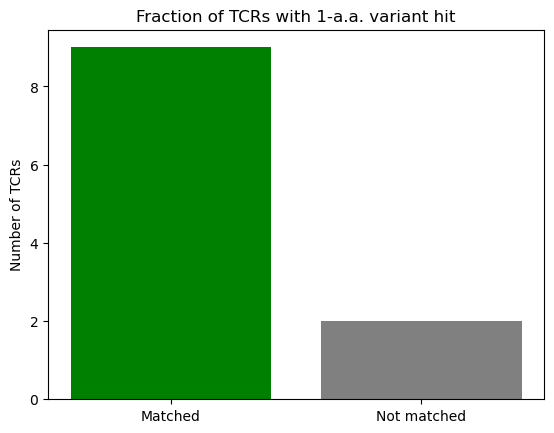

Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 12 hits
'NLVPMVATV': 5 hits
'RPHERNGFTVL': 3 hits
'GILGFVFTL': 3 hits
'LLAGIGTVPI': 2 hits
'GLCTLVAML': 1 hits
'MEVTPSGTWL': 1 hits
'KRWIILGLNK': 1 hits
'QARQMVQAMRTIGTHP': 1 hits
'NEGVKAAW': 1 hits


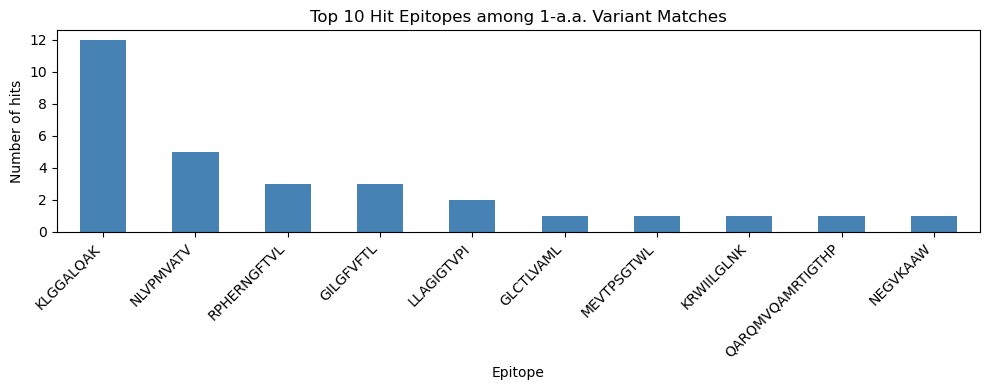


All unique hit epitopes found:
NLVPMVATV, KLGGALQAK, LLAGIGTVPI, RPHERNGFTVL, GILGFVFTL, GLCTLVAML, MEVTPSGTWL, KRWIILGLNK, QARQMVQAMRTIGTHP, NEGVKAAW, SPRWYFYYL, ELAGIGILTV, KAFSPEVIPMF, LLLGIGILV
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSGQGSGANVLTF
   Epitope: KLGGALQAK  |  Variant TCR: CASSPQGSGANVLTF
--------------------------------------------------------------------------------
Original TCR: CASSLDFYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDAYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDSYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGFYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDRYNEQFF
   Epitope: NLVPMVATV  |  Variant TCR: CASSLDLYNEQFF
--------------------------------------------------------------------------------
Original TCR: CASSLEAEETQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGAEETQYF
--------------------------------------------------------------------------------
Original TCR: CASSLGQGQE

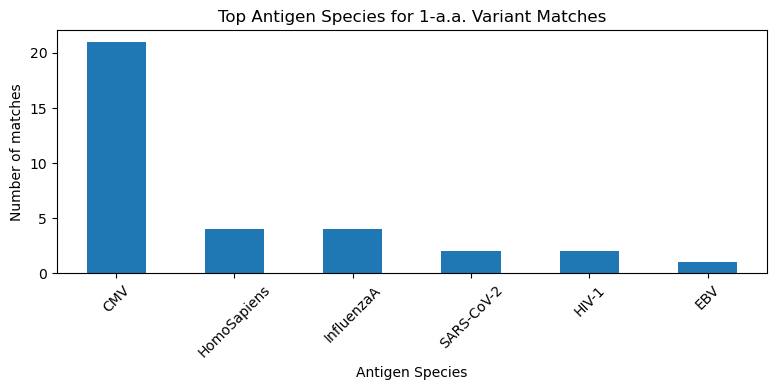

<Figure size 950x200 with 0 Axes>

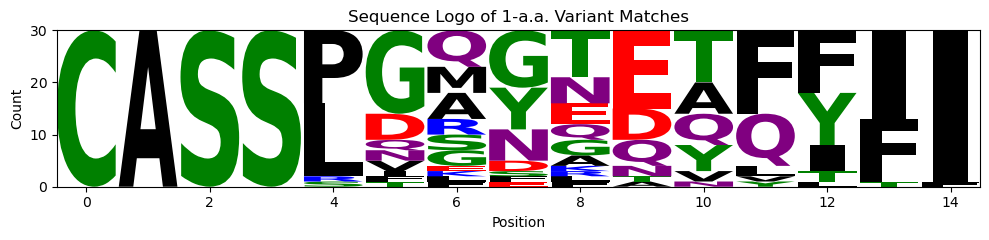

In [119]:
plot_one_near_match(results_largest_vdjdb, meta_largest, tcr_column='id')
print_and_plot_hit_epitopes(results_largest_vdjdb)
print_epitope_hits_per_tcr_with_variants(results_largest_vdjdb)
plot_epitope_source_dist(results_largest_vdjdb)
motif_conservation(results_largest_vdjdb)

This sequence logo shows the motif conservation among all matched TCRs—specifically, all sequences from “hit” set (those found in a database with a Hamming distance of 1 from your original TCRs).

In [120]:
# Run second largest 

results_second_vdjdb = []
for tcr in meta_second['id']:
    matches = find_single_mutation_hits(tcr, vdjdb, db_col='cdr3.beta')
    for _, row in matches.iterrows():
        results_second_vdjdb.append({
    'query': tcr,
    'match': row['cdr3.beta'],                    # the matching public TCR
    'epitope': row.get('antigen.epitope', None),  # the epitope sequence, if present
    'antigen_species': row.get('antigen.species', None),
    'antigen_gene': row.get('antigen.gene', None),
    'mhc_a': row.get('mhc.a', None),
    'mhc_b': row.get('mhc.b', None),
    'reference_id': row.get('reference.id', None),
})


Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 12 hits
'NLVPMVATV': 5 hits
'RPHERNGFTVL': 3 hits
'GILGFVFTL': 3 hits
'LLAGIGTVPI': 2 hits
'GLCTLVAML': 1 hits
'MEVTPSGTWL': 1 hits
'KRWIILGLNK': 1 hits
'QARQMVQAMRTIGTHP': 1 hits
'NEGVKAAW': 1 hits


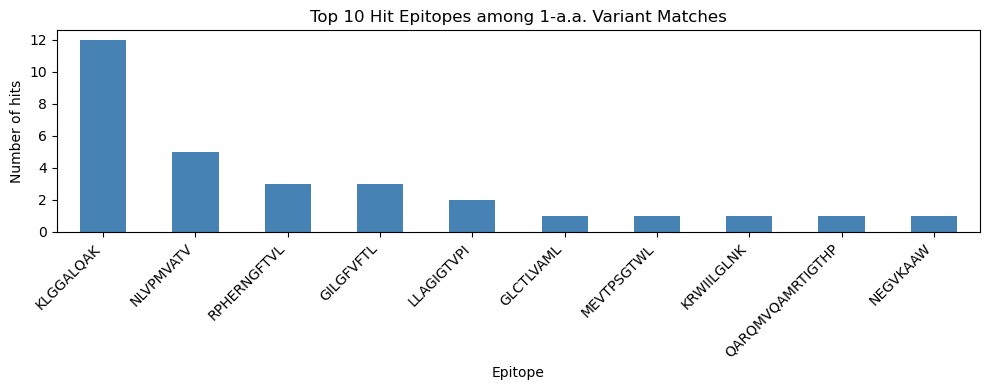


All unique hit epitopes found:
NLVPMVATV, KLGGALQAK, LLAGIGTVPI, RPHERNGFTVL, GILGFVFTL, GLCTLVAML, MEVTPSGTWL, KRWIILGLNK, QARQMVQAMRTIGTHP, NEGVKAAW, SPRWYFYYL, ELAGIGILTV, KAFSPEVIPMF, LLLGIGILV
Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 9 hits
'RAKFKQLL': 4 hits
'NLVPMVATV': 3 hits
'NEGVKAAW': 3 hits
'ELAGIGILTV': 2 hits
'GLCTLVAML': 2 hits
'NYNYLYRLF': 2 hits
'LLWNGPMAV': 2 hits
'ALTPVVVTL': 2 hits
'LPFDKSTVM': 1 hits


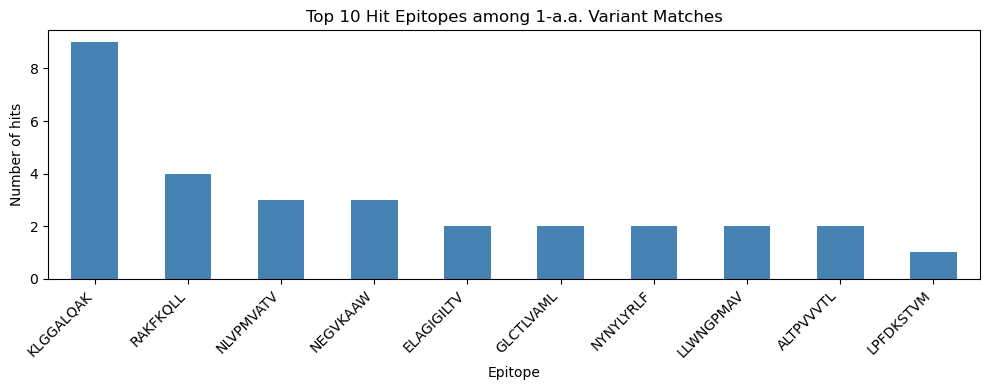


All unique hit epitopes found:
GLCTLVAML, MLYQHLLPL, NLVPMVATV, GILGFVFTL, LPFEKSTVM, LPFDKSTIM, LPFDKSTVM, LPFEKSTIM, LPFDKATIM, KLGGALQAK, ELAGIGILTV, RAKFKQLL, LYALVYFLH, NYNYLYRLF, NEGVKAAW, LLWNGPMAV, ALTPVVVTL, IVTDFSVIK, TTDPSFLGRY, GTSGSPIINR, VTEHDTLLY, KLMNIQQKL, FLRGRAYGL, RQFGPDWIVA


In [121]:
print_and_plot_hit_epitopes(results_largest_vdjdb)

print_and_plot_hit_epitopes(results_second_vdjdb)


7/8 TCRs have a single-a.a. variant hit (87.5%)


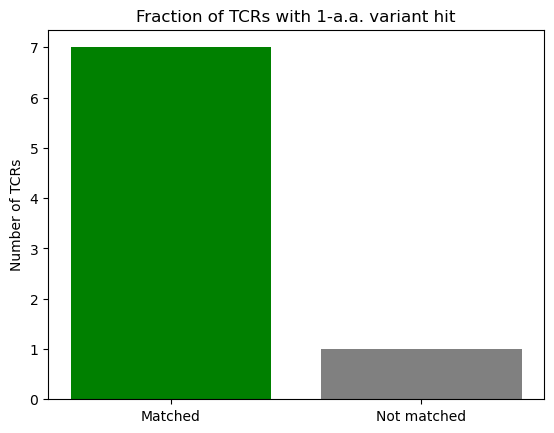

Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 9 hits
'RAKFKQLL': 4 hits
'NLVPMVATV': 3 hits
'NEGVKAAW': 3 hits
'ELAGIGILTV': 2 hits
'GLCTLVAML': 2 hits
'NYNYLYRLF': 2 hits
'LLWNGPMAV': 2 hits
'ALTPVVVTL': 2 hits
'LPFDKSTVM': 1 hits


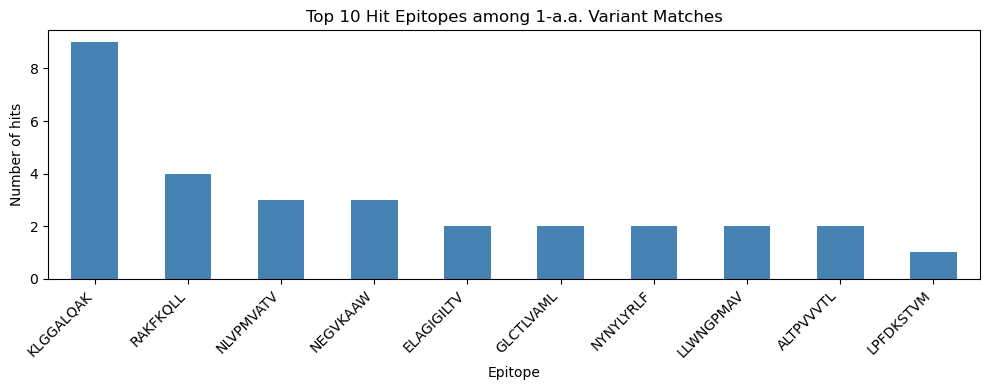


All unique hit epitopes found:
GLCTLVAML, MLYQHLLPL, NLVPMVATV, GILGFVFTL, LPFEKSTVM, LPFDKSTIM, LPFDKSTVM, LPFEKSTIM, LPFDKATIM, KLGGALQAK, ELAGIGILTV, RAKFKQLL, LYALVYFLH, NYNYLYRLF, NEGVKAAW, LLWNGPMAV, ALTPVVVTL, IVTDFSVIK, TTDPSFLGRY, GTSGSPIINR, VTEHDTLLY, KLMNIQQKL, FLRGRAYGL, RQFGPDWIVA
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSFSSETQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSDSSETQYF
   Epitope: RAKFKQLL  |  Variant TCR: CASSFSGETQYF
--------------------------------------------------------------------------------
Original TCR: CASSGGQGPYEQYF
   Epitope: ALTPVVVTL  |  Variant TCR: CASSIGQGPYEQYF
   Epitope: IVTDFSVIK  |  Variant TCR: CASSLGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSVGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSGGTGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSGGQDPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSPGQGPYEQYF
   Epitope

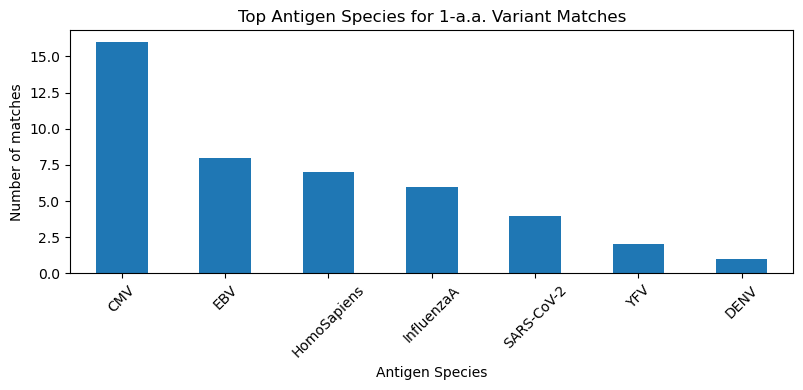

<Figure size 1000x200 with 0 Axes>

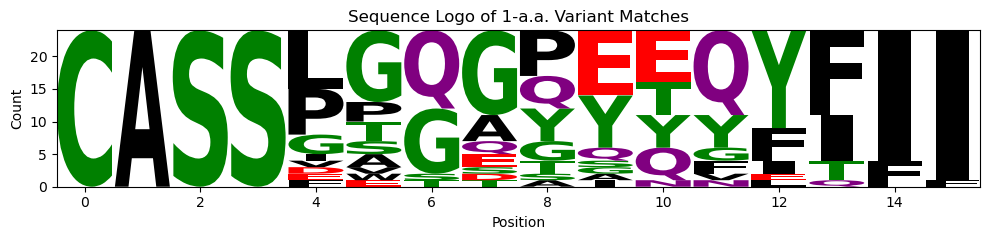

In [122]:
plot_one_near_match(results_second_vdjdb, meta_second, tcr_column='id')
print_and_plot_hit_epitopes(results_second_vdjdb)
print_epitope_hits_per_tcr_with_variants(results_second_vdjdb)
plot_epitope_source_dist(results_second_vdjdb)
motif_conservation(results_second_vdjdb)

##### McPAS

Using McPAS database.

In [14]:
# Columns to keep for annotation
columns_to_keep = [
    'id', 'degree', 'betweenness', 'sum_fast_weight', 'sum_slow_weight',
    'V_gene_fast', 'J_gene_fast', 'codon_diversity_fast', 'sample_prevalence_fast',
    'V_gene_slow', 'J_gene_slow', 'codon_diversity_slow', 'sample_prevalence_slow',
    'Epitope.peptide', "Species", 'Pathology', 'Category', 'Antigen.protein', 'MHC', 'PubMed.ID'
]

In [11]:
meta_largest

,Unnamed: 0,id,sum_fast_weight,avg_fast_weight,sum_slow_weight,avg_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,...,codon_diversity_slow,sample_prevalence_slow,degree,betweenness,closeness,eigenvector,V_gene_fast_id,V_gene_slow_id,J_gene_fast_id,J_gene_slow_id
0,0,CASSPGYYEQYF,5.564751,0.927459,5.969333,0.994889,TRBV11-2,TRBJ2-7,26,24,...,5,5,6,0.000000,0.666667,0.267015,1,6,6,6
1,1,CASSPGLAGDTGELFF,4.657401,0.931480,4.947120,0.989424,TRBV18,TRBJ2-2,16,19,...,7,7,5,0.000000,0.625000,0.225218,6,0,2,2
2,2,CASSPGQGGDTQYF,7.528253,0.941032,7.915978,0.989497,TRBV11-2,TRBJ2-3,35,36,...,11,10,8,0.018519,0.833333,0.327892,1,4,3,3
3,3,CASSLDFYNEQFF,5.627013,0.937835,5.960487,0.993415,TRBV11-3,TRBJ2-1,15,24,...,6,6,6,0.000000,0.666667,0.267015,2,1,1,1
4,4,CASSPNMNTEAFF,8.578246,0.953138,8.828362,0.980929,TRBV11-2,TRBJ1-1,12,19,...,10,12,9,0.040741,0.909091,0.353356,1,5,0,0
5,5,CASSLVKDTQYF,8.688971,0.965441,8.944978,0.993886,TRBV5-1,TRBJ2-3,8,10,...,5,6,9,0.040741,0.909091,0.353356,9,2,3,3
6,6,CASSLGQGQETQYF,8.609398,0.956600,8.911312,0.990146,TRBV12-3,TRBJ2-5,92,102,...,31,21,9,0.040741,0.909091,0.353356,3,1,4,4
7,7,CASSEAGGYNEQFF,0.933322,0.933322,0.983858,0.983858,TRBV2,TRBJ2-1,15,21,...,6,8,1,0.000000,0.454545,0.034600,8,8,1,1
8,8,CASSGQGSGANVLTF,8.669688,0.963299,8.945468,0.993941,TRBV12-3,TRBJ2-6,13,15,...,10,7,9,0.040741,0.909091,0.353356,3,7,5,5
9,9,CASSLTAGANVLTF,6.599460,0.942780,6.863685,0.980526,TRBV11-2,TRBJ2-6,24,34,...,7,5,7,0.200000,0.769231,0.271426,1,1,5,5


In [15]:
# Merge by CDR3β
annotated_mcpas_largest = meta_largest.merge(
    mcpas,
    left_on="id",
    right_on="CDR3.beta.aa",
    how="left"
)

annotated_mcpas_largest = annotated_mcpas_largest[columns_to_keep]

In [13]:
annotated_mcpas_largest

,id,degree,betweenness,sum_fast_weight,sum_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,J_gene_slow,codon_diversity_slow,sample_prevalence_slow,Epitope.peptide,Species,Pathology,Category,Antigen.protein,MHC,PubMed.ID
0,CASSPGYYEQYF,6,0.000000,5.564751,5.969333,TRBV11-2,TRBJ2-7,26,24,TRBV18,TRBJ2-7,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSPGLAGDTGELFF,5,0.000000,4.657401,4.947120,TRBV18,TRBJ2-2,16,19,TRBV10-1,TRBJ2-2,7,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSPGQGGDTQYF,8,0.018519,7.528253,7.915978,TRBV11-2,TRBJ2-3,35,36,TRBV12-4,TRBJ2-3,11,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CASSLDFYNEQFF,6,0.000000,5.627013,5.960487,TRBV11-3,TRBJ2-1,15,24,TRBV11-2,TRBJ2-1,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSPNMNTEAFF,9,0.040741,8.578246,8.828362,TRBV11-2,TRBJ1-1,12,19,TRBV14,TRBJ1-1,10,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSLVKDTQYF,9,0.040741,8.688971,8.944978,TRBV5-1,TRBJ2-3,8,10,TRBV11-3,TRBJ2-3,5,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,CASSLGQGQETQYF,9,0.040741,8.609398,8.911312,TRBV12-3,TRBJ2-5,92,102,TRBV11-2,TRBJ2-5,31,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,CASSEAGGYNEQFF,1,0.000000,0.933322,0.983858,TRBV2,TRBJ2-1,15,21,TRBV2,TRBJ2-1,6,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,CASSGQGSGANVLTF,9,0.040741,8.669688,8.945468,TRBV12-3,TRBJ2-6,13,15,TRBV19,TRBJ2-6,10,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,CASSLTAGANVLTF,7,0.200000,6.599460,6.863685,TRBV11-2,TRBJ2-6,24,34,TRBV11-2,TRBJ2-6,7,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# Merge by CDR3β
annotated_mcpas_second = meta_second.merge(
    mcpas,
    left_on="id",
    right_on="CDR3.beta.aa",
    how="left"
)

annotated_mcpas_second = annotated_mcpas_second[columns_to_keep]

In [15]:
annotated_mcpas_second

,id,degree,betweenness,sum_fast_weight,sum_slow_weight,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,J_gene_slow,codon_diversity_slow,sample_prevalence_slow,Epitope.peptide,Species,Pathology,Category,Antigen.protein,MHC,PubMed.ID
0,CASSPPGQGNYGYTF,5,0.15,4.743591,4.922718,TRBV12-3,TRBJ1-2,21,23,TRBV12-3,TRBJ1-2,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSLPGSGANVLTF,4,0.00,3.787508,3.961635,TRBV12-3,TRBJ2-6,49,46,TRBV11-1,TRBJ2-6,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSLVGASSYNEQFF,5,0.15,4.758463,4.943791,TRBV12-3,TRBJ2-1,13,12,TRBV5-1,TRBJ2-1,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CASSQGLAGGYEQYF,4,0.00,3.728940,3.940708,TRBV10-1,TRBJ2-7,34,36,TRBV11-3,TRBJ2-7,8,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSPTGAQETQYF,2,0.00,1.849388,1.982584,TRBV11-2,TRBJ2-5,29,30,TRBV18,TRBJ2-5,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSGGQGPYEQYF,4,0.00,3.784597,3.945117,TRBV12-3,TRBJ2-7,16,22,TRBV11-2,TRBJ2-7,8,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
# Run largest on McPAS
results_largest_mcpas = []
for tcr in meta_largest['id']:
    matches = find_single_mutation_hits(tcr, mcpas, db_col='CDR3.beta.aa')
    for _, row in matches.iterrows():
        results_largest_mcpas.append({
    'query': tcr,
    'match': row['CDR3.beta.aa'],                    # the matching public TCR
    'epitope': row.get('Epitope.peptide', None),  # the epitope sequence, if present
    'antigen_species': row.get('Pathology', None),
    'antigen.protein': row.get('Antigen.protein', None),
    'species': row.get('Species', None),
    'category': row.get('Category', None),
    'mhc': row.get('MHC', None),
    'reference_id': row.get('PubMed.ID', None),
}) 

In [129]:
results_largest_mcpas

[{'query': 'CASSPGYYEQYF',
  'match': 'CASSPGGYEQYF',
  'epitope': nan,
  'antigen_species': 'Colorectal cancer',
  'antigen.protein': nan,
  'species': 'Human',
  'category': 'Cancer',
  'mhc': nan,
  'reference_id': 23771160},
 {'query': 'CASSPGYYEQYF',
  'match': 'CASSPGPYEQYF',
  'epitope': 'QLIPCMDVV',
  'antigen_species': 'Neoantigen',
  'antigen.protein': 'AGL-GLI',
  'species': 'Human',
  'category': 'Cancer',
  'mhc': 'HLA-A2',
  'reference_id': 30418433},
 {'query': 'CASSPGYYEQYF',
  'match': 'CASSPGPYEQYF',
  'epitope': nan,
  'antigen_species': 'Psoriatic arthritis',
  'antigen.protein': nan,
  'species': 'Human',
  'category': 'Autoimmune',
  'mhc': nan,
  'reference_id': 28945199},
 {'query': 'CASSPGYYEQYF',
  'match': 'CASSPGTYEQYF',
  'epitope': 'LPRRSGAAGA',
  'antigen_species': 'Influenza',
  'antigen.protein': 'NP177',
  'species': 'Human',
  'category': 'Pathogens',
  'mhc': 'HLA-B7',
  'reference_id': 28636589},
 {'query': 'CASSPNMNTEAFF',
  'match': 'CASSLNMNTEAFF

11/11 TCRs have a single-a.a. variant hit (100.0%)


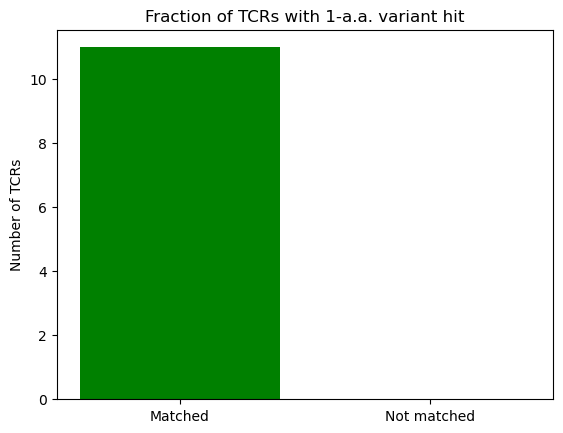

Top 10 Hit Epitopes (1-a.a. variant matches):
'LPRRSGAAGA': 4 hits
'QLIPCMDVV': 1 hits
'MLLKHDVSL': 1 hits
'GLCTLVAML': 1 hits
'RPHERNGFTVL': 1 hits
'NLVPMVATV': 1 hits
'GLTSFFIAI': 1 hits
'FWIDLFETIG': 1 hits
'GILGFVFTL': 1 hits
'ILNVDVFTL': 1 hits


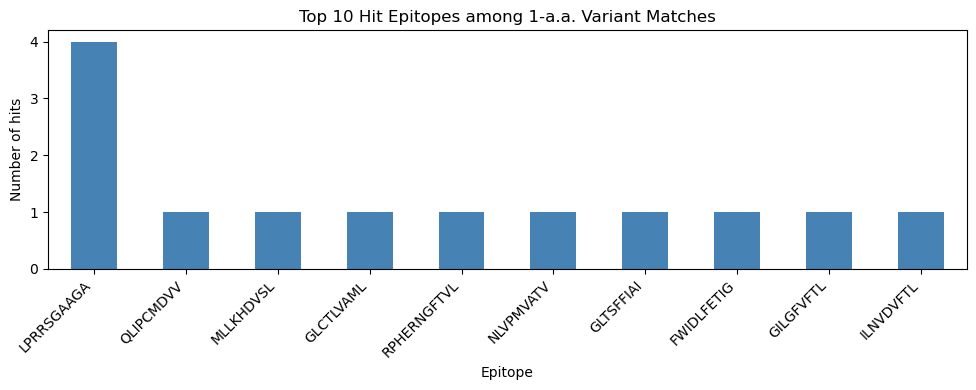


All unique hit epitopes found:
QLIPCMDVV, LPRRSGAAGA, MLLKHDVSL, GLCTLVAML, RPHERNGFTVL, NLVPMVATV, GLTSFFIAI, FWIDLFETIG, GILGFVFTL, ILNVDVFTL, EAAGIGILTV
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSEAGGYNEQFF
   No epitope found.
--------------------------------------------------------------------------------
Original TCR: CASSGQGSGANVLTF
   No epitope found.
--------------------------------------------------------------------------------
Original TCR: CASSLDFYNEQFF
   Epitope: LPRRSGAAGA  |  Variant TCR: CASSLDSYNEQFF
--------------------------------------------------------------------------------
Original TCR: CASSLEAEETQYF
   No epitope found.
--------------------------------------------------------------------------------
Original TCR: CASSLGQGQETQYF
   Epitope: EAAGIGILTV  |  Variant TCR: CASSWGQGQETQYF
   Epitope: FWIDLFETIG  |  Variant TCR: CASSLGQGGETQYF
   Epitope: GILGFVFTL  |  Variant TCR: CASSLGQGRETQYF
   Epitope: ILNVDVF

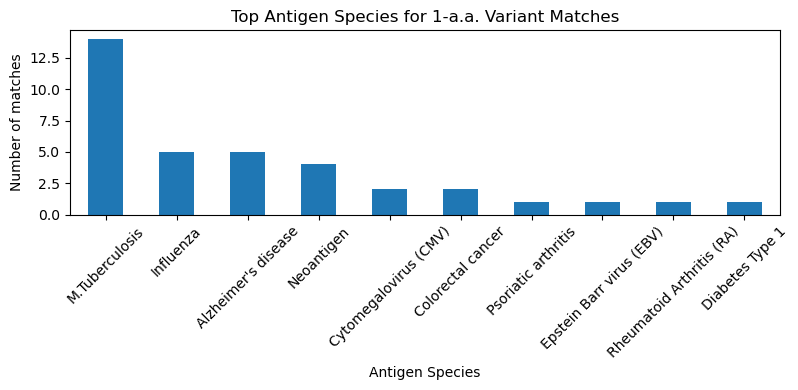

<Figure size 1000x200 with 0 Axes>

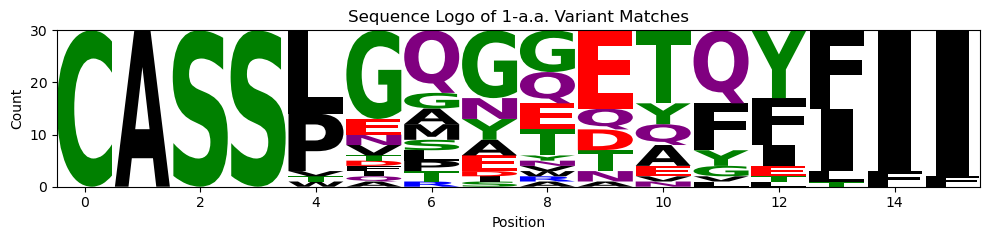

In [130]:
plot_one_near_match(results_largest_mcpas, meta_largest, tcr_column='id')
print_and_plot_hit_epitopes(results_largest_mcpas)
print_epitope_hits_per_tcr_with_variants(results_largest_mcpas)
plot_epitope_source_dist(results_largest_mcpas)
motif_conservation(results_largest_mcpas)

In [131]:
# Run largest on McPAS
results_second_mcpas = []
for tcr in meta_second['id']:
    matches = find_single_mutation_hits(tcr, mcpas, db_col='CDR3.beta.aa')
    for _, row in matches.iterrows():
        results_second_mcpas.append({
    'query': tcr,
    'match': row['CDR3.beta.aa'],                    # the matching public TCR
    'epitope': row.get('Epitope.peptide', None),  # the epitope sequence, if present
    'antigen_species': row.get('Pathology', None),
    'antigen.protein': row.get('Antigen.protein', None),
    'species': row.get('Species', None),
    'category': row.get('Category', None),
    'mhc': row.get('MHC', None),
    'reference_id': row.get('PubMed.ID', None),
}) 

6/11 TCRs have a single-a.a. variant hit (54.5%)


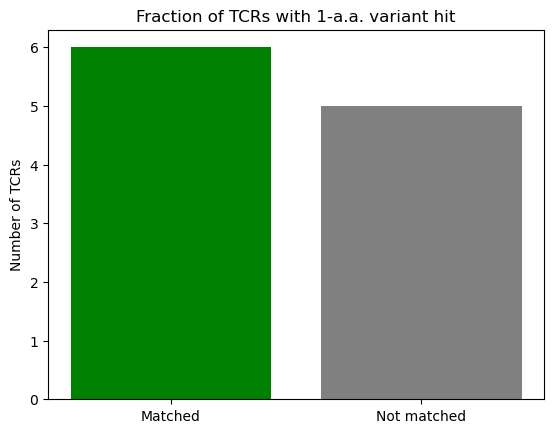

Top 10 Hit Epitopes (1-a.a. variant matches):
'LLWNGPMAV': 4 hits
'GLCTLVAML': 2 hits
'LPRRSGAAGA': 2 hits
'ALTPVVVTL': 1 hits
'VTEHDTLLY': 1 hits
'VEALYLVCG': 1 hits


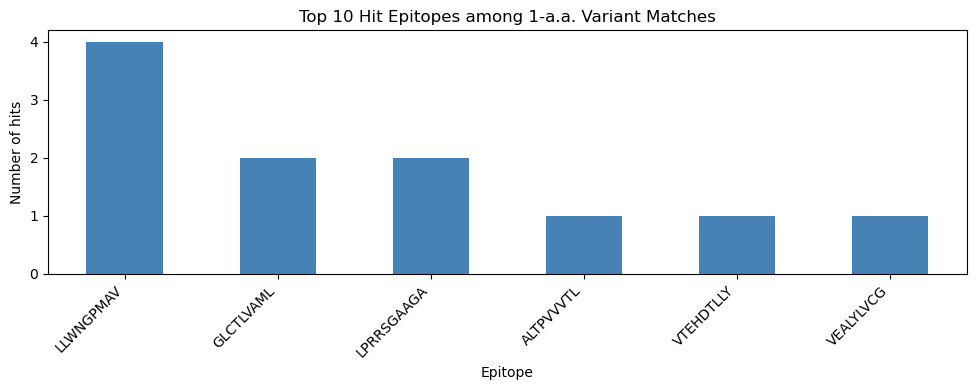


All unique hit epitopes found:
GLCTLVAML, ALTPVVVTL, LLWNGPMAV, VTEHDTLLY, LPRRSGAAGA, VEALYLVCG
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSGGQGPYEQYF
   Epitope: ALTPVVVTL  |  Variant TCR: CASSIGQGPYEQYF
   Epitope: LLWNGPMAV  |  Variant TCR: CASSPGQGPYEQYF
--------------------------------------------------------------------------------
Original TCR: CASSLPGSGANVLTF
   No epitope found.
--------------------------------------------------------------------------------
Original TCR: CASSLQQGYEQYF
   Epitope: GLCTLVAML  |  Variant TCR: CASSLVQGYEQYF
   Epitope: LPRRSGAAGA  |  Variant TCR: CASSLAQGYEQYF
   Epitope: LPRRSGAAGA  |  Variant TCR: CASSLVQGYEQYF
   Epitope: VEALYLVCG  |  Variant TCR: CASSLQGGYEQYF
   Epitope: VTEHDTLLY  |  Variant TCR: CASSLAQGYEQYF
--------------------------------------------------------------------------------
Original TCR: CASSLVGASSYNEQFF
   No epitope found.
-------------------------------------------------

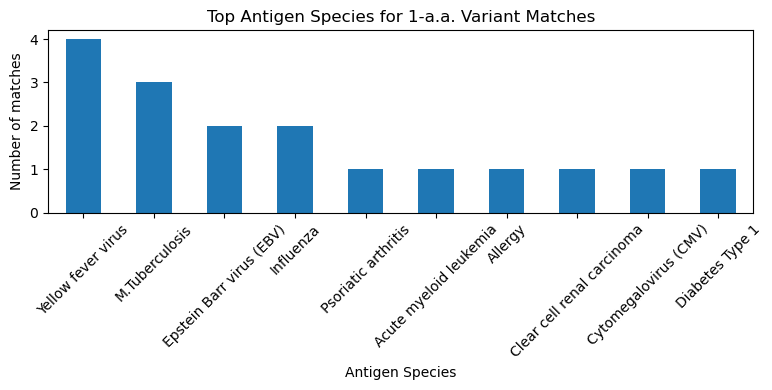

<Figure size 1000x200 with 0 Axes>

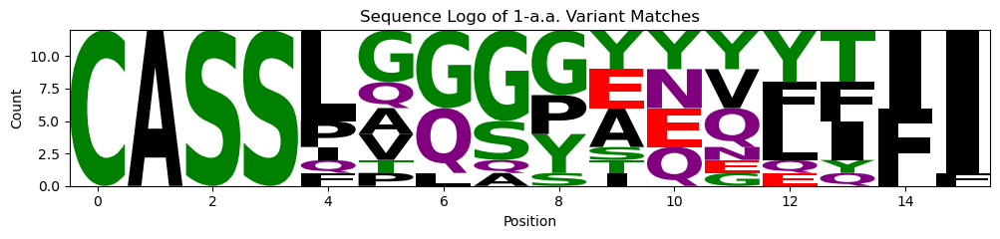

In [132]:
plot_one_near_match(results_second_mcpas, meta_largest, tcr_column='id')
print_and_plot_hit_epitopes(results_second_mcpas)
print_epitope_hits_per_tcr_with_variants(results_second_mcpas)
plot_epitope_source_dist(results_second_mcpas)
motif_conservation(results_second_mcpas)

##### TRAIT

In [35]:
trait_df = pd.read_excel("/home/dsi/orrbavly/GNN_project/data/20250312-TRAIT_search_download.xlsx")

In [36]:
# Columns to keep for annotation
columns_to_keep = [
    'id', 'degree', 'betweenness', 'strength_fast', 'strength_slow',
    'V_gene_fast', 'J_gene_fast', 'codon_diversity_fast', 'sample_prevalence_fast',
    'V_gene_slow', 'J_gene_slow', 'codon_diversity_slow', 'sample_prevalence_slow',
    "Species", "MHC_A", "MHC_B", "MHC_class", "Epitope", "Epitope_gene", "Epitope_species", "Category", "PMID"
]

In [37]:
trait_df.head()

,ID,TCR_name,CDR3α,TRAV,TRAJ,CDR3β,TRBV,TRBJ,Species,Sequencing_methods,...,Verification_methods,KD_μM,Affinity_method,Structure,Structure_method,Donor,Tissue,Category,PMID,Year
0,1,NaN,CAGATGNTGKLIF,TRAV27*01,TRAJ37*01,CASSTRGAYEQYF,TRBV19*01,TRBJ2-7*01,HomoSapiens,Sanger,...,NaN,NaN,NaN,NaN,NaN,NaN,PBMC,Flu,PMID:7807026,1995
1,2,JM22,CAGAGSQGNLIF,TRAV27*01,TRAJ42*01,CASSSRSSYEQYF,TRBV19*01,TRBJ2-7*01,HomoSapiens,Sanger,...,NaN,NaN,NaN,NaN,NaN,NaN,PBMC,Flu,PMID:7807026,1995
2,3,NaN,CAVNSYYNQGGKLIF,TRAV12-2*01,TRAJ23*01,CSVLQGSPYEQYF,TRBV29-1*01,TRBJ2-7*01,HomoSapiens,Sanger,...,NaN,NaN,NaN,NaN,NaN,NaN,PBMC,Flu,PMID:7807026,1995
3,4,NaN,CAGGGSQGNLIF,TRAV27*01,TRAJ42*01,CASSIRSSYEQYF,TRBV19*01,TRBJ2-7*01,HomoSapiens,Sanger,...,NaN,NaN,NaN,NaN,NaN,NaN,PBMC,Flu,PMID:7807026,1995
4,5,NaN,CLVGGLARDMRF,TRAV4*01,TRAJ43*01,CSVALGSDTGELFF,TRBV29-1*01,TRBJ2-2*01,HomoSapiens,NaN,...,NaN,NaN,NaN,7SG2,XRD,NaN,NaN,Cancer,PMID:35065967,2022


In [38]:
# Merge by CDR3β
annotated_trait_largest = meta_largest.merge(
    trait_df,
    left_on="id",
    right_on="CDR3β",
    how="left"
)

annotated_trait_largest = annotated_trait_largest[columns_to_keep]

In [39]:
annotated_trait_largest

,id,degree,betweenness,strength_fast,strength_slow,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,...,sample_prevalence_slow,Species,MHC_A,MHC_B,MHC_class,Epitope,Epitope_gene,Epitope_species,Category,PMID
0,CASSPGYYEQYF,5,0.000000,4.647252,4.947424,TRBV11-2,TRBJ2-7,26,24,TRBV18,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSPNMNTEAFF,9,0.002128,8.578246,8.795402,TRBV11-2,TRBJ1-1,12,19,TRBV14,...,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSLVKDTQYF,9,0.002128,8.688971,8.913714,TRBV5-1,TRBJ2-3,8,10,TRBV11-3,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,CASSPGLAGDTGELFF,5,0.000000,4.657401,4.916522,TRBV18,TRBJ2-2,16,19,TRBV10-1,...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSLEAEETQYF,9,0.002128,8.588210,8.652970,TRBV11-3,TRBJ2-5,14,20,TRBV2,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSLDFYNEQFF,5,0.000000,4.710385,4.935470,TRBV11-3,TRBJ2-1,15,24,TRBV11-2,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,CASSLTAGANVLTF,7,0.007979,6.599460,6.836992,TRBV11-2,TRBJ2-6,24,34,TRBV11-2,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,CASSPGQGGDTQYF,6,0.000000,5.694126,5.895840,TRBV11-2,TRBJ2-3,35,36,TRBV12-4,...,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,CASSGQGSGANVLTF,9,0.002128,8.669688,8.914008,TRBV12-3,TRBJ2-6,13,15,TRBV19,...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,CASSLGQGQETQYF,9,0.002128,8.609398,8.879261,TRBV12-3,TRBJ2-5,92,102,TRBV11-2,...,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
# Merge by CDR3β
annotated_trait_second = meta_second.merge(
    trait_df,
    left_on="id",
    right_on="CDR3β",
    how="left"
)

annotated_trait_second = annotated_trait_second[columns_to_keep]

In [41]:
annotated_trait_second

,id,degree,betweenness,strength_fast,strength_slow,V_gene_fast,J_gene_fast,codon_diversity_fast,sample_prevalence_fast,V_gene_slow,...,sample_prevalence_slow,Species,MHC_A,MHC_B,MHC_class,Epitope,Epitope_gene,Epitope_species,Category,PMID
0,CASSPPGQGNYGYTF,7,0.006206,6.665767,6.829901,TRBV12-3,TRBJ1-2,21,23,TRBV12-3,...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CASSPTGAQETQYF,3,0.000000,2.773914,2.940979,TRBV11-2,TRBJ2-5,29,30,TRBV18,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,CASSFSSETQYF,6,0.000887,5.717286,5.775646,TRBV12-3,TRBJ2-5,19,17,TRBV12-3,...,5,HomoSapiens,HLA-A*03:01,B2M,MHCI,KLGGALQAK,IE-1,CMV,Pathogens,https://www.10xgenomics.com/resources/applicat...
3,CASSGGQGPYEQYF,5,0.000000,4.733967,4.902015,TRBV12-3,TRBJ2-7,16,22,TRBV11-2,...,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,CASSQGLAGGYEQYF,5,0.000000,4.672877,4.896625,TRBV10-1,TRBJ2-7,34,36,TRBV11-3,...,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,CASSLPGSGANVLTF,5,0.000000,4.747786,4.923925,TRBV12-3,TRBJ2-6,49,46,TRBV11-1,...,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,CASSLVGASSYNEQFF,6,0.000887,5.729710,5.924604,TRBV12-3,TRBJ2-1,13,12,TRBV5-1,...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,CASSLQQGYEQYF,1,0.000000,0.954249,0.955306,TRBV11-1,TRBJ2-7,17,20,TRBV11-3,...,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Now lets review 1 a.a variations:

In [42]:
# Run largest on McPAS
results_largest_trait = []
for tcr in meta_largest['id']:
    matches = find_single_mutation_hits(tcr, trait_df, db_col='CDR3β')
    for _, row in matches.iterrows():
        results_largest_trait.append({
    'query': tcr,
    'match': row['CDR3β'],                    # the matching public TCR
    'epitope': row.get('Epitope', None),  # the epitope sequence, if present
    'epitoe_gene': row.get('Epitope_gene', None),
    'antigen_species': row.get('Epitope_species', None),
    'antigen.protein': row.get('Antigen.protein', None),
    'species': row.get('Species', None),
    'category': row.get('Category', None),
    'mhc_a': row.get('MHC_A', None),
    'mhc_b': row.get('MHC_B', None),
    'reference_id': row.get('PMID', None),
}) 

"Species", "MHC_A", "MHC_B", "MHC_class", "Epitope", "Epitope_gene", "Epitope_species", "Category", "PMID"

8/11 TCRs have a single-a.a. variant hit (72.7%)


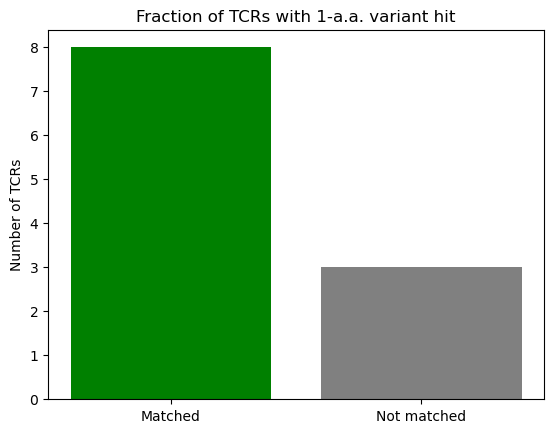

Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 11 hits
'NLVPMVATV': 6 hits
'GILGFVFTL': 3 hits
'RPHERNGFTVL': 3 hits
'GLCTLVAML': 1 hits
'KRWIILGLNK': 1 hits
'QARQMVQAMRTIGTHP': 1 hits
'ELAGIGILTV': 1 hits
'NEGVKAAW': 1 hits
'LLLGIGILV': 1 hits


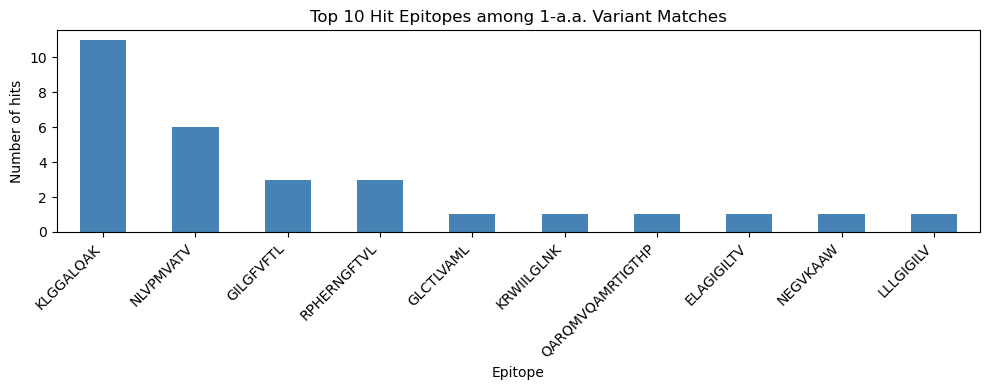


All unique hit epitopes found:
KLGGALQAK, NLVPMVATV, GLCTLVAML, GILGFVFTL, RPHERNGFTVL, KRWIILGLNK, QARQMVQAMRTIGTHP, ELAGIGILTV, NEGVKAAW, LLLGIGILV, KAFSPEVIPMF
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSGQGSGANVLTF
   Epitope: KLGGALQAK  |  Variant TCR: CASSPQGSGANVLTF
--------------------------------------------------------------------------------
Original TCR: CASSLDFYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDSYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDAYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGFYNEQFF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLDRYNEQFF
   Epitope: NLVPMVATV  |  Variant TCR: CASSLDLYNEQFF
--------------------------------------------------------------------------------
Original TCR: CASSLGQGQETQYF
   Epitope: GILGFVFTL  |  Variant TCR: CASSLGQGRETQYF
   Epitope: KAFSPEVIPMF  |  Variant TCR: CASSLGRGQETQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGGGQETQYF
   Epitope: LLLGIGILV  |  Va

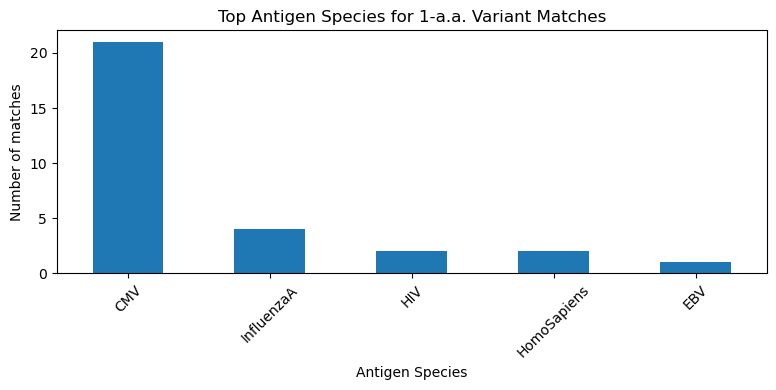

<Figure size 950x200 with 0 Axes>

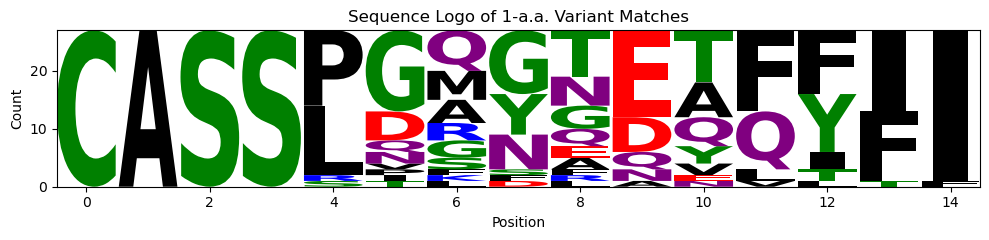

In [43]:
plot_one_near_match(results_largest_trait, meta_largest, tcr_column='id')
print_and_plot_hit_epitopes(results_largest_trait)
print_epitope_hits_per_tcr_with_variants(results_largest_trait)
plot_epitope_source_dist(results_largest_trait)
motif_conservation(results_largest_trait)

In [44]:
# Run largest on McPAS
results_second_trait = []
for tcr in meta_second['id']:
    matches = find_single_mutation_hits(tcr, trait_df, db_col='CDR3β')
    for _, row in matches.iterrows():
        results_second_trait.append({
    'query': tcr,
    'match': row['CDR3β'],                    # the matching public TCR
    'epitope': row.get('Epitope', None),  # the epitope sequence, if present
    'epitoe_gene': row.get('Epitope_gene', None),
    'antigen_species': row.get('Epitope_species', None),
    'antigen.protein': row.get('Antigen.protein', None),
    'species': row.get('Species', None),
    'category': row.get('Category', None),
    'mhc_a': row.get('MHC_A', None),
    'mhc_b': row.get('MHC_B', None),
    'reference_id': row.get('PMID', None),
}) 

7/8 TCRs have a single-a.a. variant hit (87.5%)


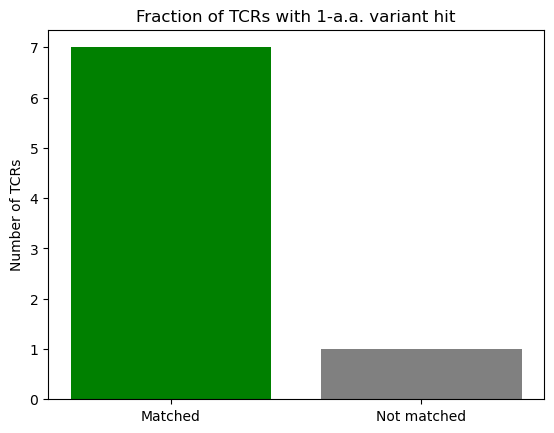

Top 10 Hit Epitopes (1-a.a. variant matches):
'KLGGALQAK': 10 hits
'NLVPMVATV': 3 hits
'GLCTLVAML': 2 hits
'LLWNGPMAV': 2 hits
'NYNYLYRLF': 2 hits
'GILGFVFTL': 1 hits
'ELAGIGILTV': 1 hits
'LYALVYFLH': 1 hits
'IVTDFSVIK': 1 hits
'NEGVKAAW': 1 hits


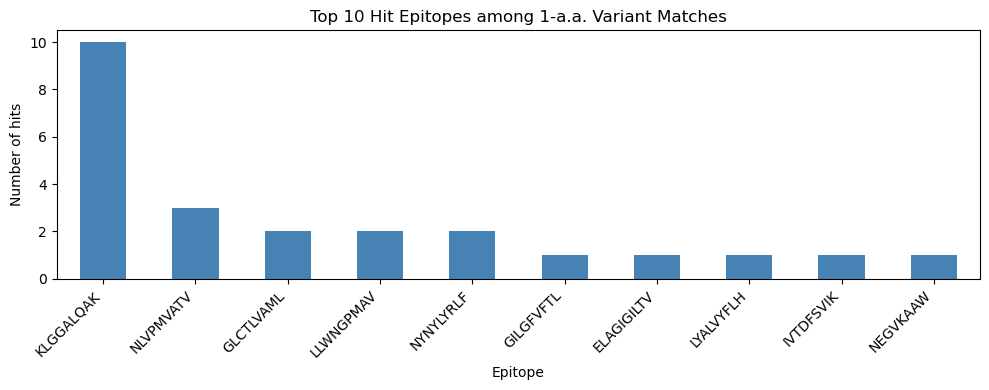


All unique hit epitopes found:
KLGGALQAK, GLCTLVAML, ELAGIGILTV, NLVPMVATV, GILGFVFTL, LLWNGPMAV, LYALVYFLH, NYNYLYRLF, IVTDFSVIK, NEGVKAAW, ALTPVVVTL, TTDPSFLGRY, KLMNIQQKL, GTSGSPIINR, VTEHDTLLY
Epitope hits per original TCR (showing variant sequence for each epitope):
Original TCR: CASSFSSETQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSDSSETQYF
--------------------------------------------------------------------------------
Original TCR: CASSGGQGPYEQYF
   Epitope: ALTPVVVTL  |  Variant TCR: CASSIGQGPYEQYF
   Epitope: IVTDFSVIK  |  Variant TCR: CASSLGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSLGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSVGQGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSGGQDPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSGGTGPYEQYF
   Epitope: KLGGALQAK  |  Variant TCR: CASSPGQGPYEQYF
   Epitope: LLWNGPMAV  |  Variant TCR: CASSPGQGPYEQYF
   Epitope: LLWNGPMAV  |  Variant TCR: CASSGGQGAYEQYF
   Epitope: LYALVYFLH  |  Variant TCR: CASSLGQGPYEQY

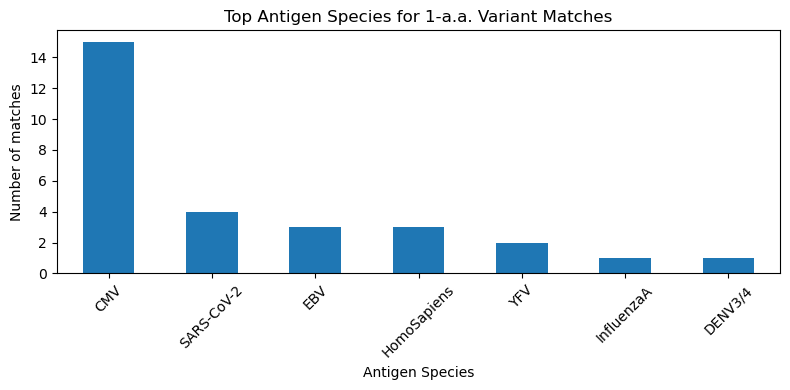

<Figure size 1000x200 with 0 Axes>

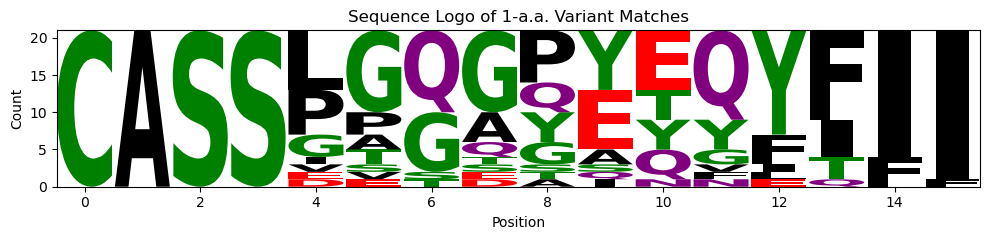

In [45]:
plot_one_near_match(results_second_trait, meta_second, tcr_column='id')
print_and_plot_hit_epitopes(results_second_trait)
print_epitope_hits_per_tcr_with_variants(results_second_trait)
plot_epitope_source_dist(results_second_trait)
motif_conservation(results_second_trait)

##### Comparison

should run all above TCR - epitope matching before

For Largest comparison:

In [133]:
import pandas as pd

# Convert lists to DataFrames
df_mcpas_largest = pd.DataFrame(results_largest_mcpas)
df_vdjdb_largest = pd.DataFrame(results_largest_vdjdb)

# Rename McPAS columns to match the unified schema
df_mcpas_renamed = df_mcpas_largest.rename(columns={
    'antigen_species': 'antigen_species',     # Already correct, but explicit
    'antigen.protein': 'antigen_gene',        # Harmonize antigen/gene naming
    'mhc': 'mhc_a',                          # If only one chain available
    'pathology': 'pathology',                 # If present (optional)
    'category': 'category',                   # If present (optional)
    'species': 'species',                     # Just for info
    # 'reference_id': 'reference_id',         # Already the same
})

# Add missing columns to harmonize structure for comparison
for col in ['antigen_gene', 'mhc_b']:
    if col not in df_mcpas_renamed.columns:
        df_mcpas_renamed[col] = None
for col in ['pathology', 'category']:
    if col not in df_vdjdb_largest.columns:
        df_vdjdb_largest[col] = None

# Now select only the shared columns for comparison:
shared_cols = [
    'query', 'match', 'epitope', 'antigen_species', 'antigen_gene',
 'category', 'mhc_a', 'mhc_b', 'reference_id'
]

df_mcpas_std = df_mcpas_renamed[shared_cols]
df_vdjdb_std = df_vdjdb_largest[shared_cols]


In [134]:
n_mcpas_epitopes = df_mcpas_std['epitope'].nunique()
n_vdjdb_epitopes = df_vdjdb_std['epitope'].nunique()

print(f"Unique epitopes (McPAS): {n_mcpas_epitopes}")
print(f"Unique epitopes (VDJdb): {n_vdjdb_epitopes}")

# For each query, show which DBs returned at least one hit
mcpas_queries = set(df_mcpas_std['query'])
vdjdb_queries = set(df_vdjdb_std['query'])

only_mcpas = mcpas_queries - vdjdb_queries
only_vdjdb = vdjdb_queries - mcpas_queries
both = mcpas_queries & vdjdb_queries

print(f"TCRs only in McPAS: {len(only_mcpas)}")
print(f"TCRs only in VDJdb: {len(only_vdjdb)}")
print(f"TCRs in both: {len(both)}")

Unique epitopes (McPAS): 11
Unique epitopes (VDJdb): 14
TCRs only in McPAS: 2
TCRs only in VDJdb: 0
TCRs in both: 9


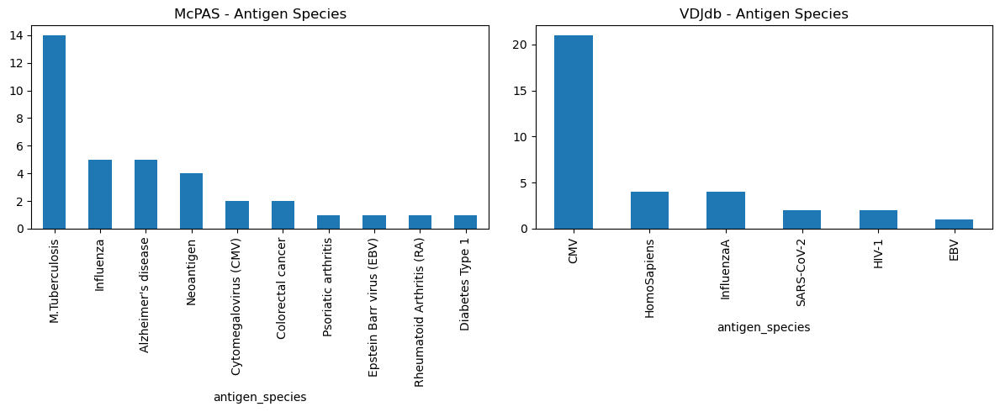

In [135]:
species_counts_mcpas = df_mcpas_std['antigen_species'].value_counts()
species_counts_vdjdb = df_vdjdb_std['antigen_species'].value_counts()

# Plot side-by-side
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
species_counts_mcpas.head(10).plot(kind='bar', title='McPAS - Antigen Species')
plt.subplot(1,2,2)
species_counts_vdjdb.head(10).plot(kind='bar', title='VDJdb - Antigen Species')
plt.tight_layout()
plt.show()

In [136]:
shared_queries = set(df_mcpas_std['query']).intersection(df_vdjdb_std['query'])
print(f"Number of shared query TCRs with at least one hit in both DBs: {len(shared_queries)}")

# To store comparison results
detailed_comparison = []

for tcr in shared_queries:
    mcpas_matches = df_mcpas_std[df_mcpas_std['query'] == tcr]
    vdjdb_matches = df_vdjdb_std[df_vdjdb_std['query'] == tcr]
    
    # For all (variant, epitope) pairs
    mcpas_pairs = set(zip(mcpas_matches['match'], mcpas_matches['epitope']))
    vdjdb_pairs = set(zip(vdjdb_matches['match'], vdjdb_matches['epitope']))
    
    # All epitopes (ignoring which variant led to which)
    mcpas_epitopes = set(mcpas_matches['epitope'].dropna())
    vdjdb_epitopes = set(vdjdb_matches['epitope'].dropna())
    
    # Pairwise overlaps
    shared_pairs = mcpas_pairs & vdjdb_pairs
    shared_epitopes = mcpas_epitopes & vdjdb_epitopes
    only_mcpas = mcpas_epitopes - vdjdb_epitopes
    only_vdjdb = vdjdb_epitopes - mcpas_epitopes

    detailed_comparison.append({
        'query': tcr,
        'n_mcpas_matches': len(mcpas_matches),
        'n_vdjdb_matches': len(vdjdb_matches),
        'n_shared_pairs': len(shared_pairs),
        'shared_pairs': shared_pairs,
        'shared_epitopes': shared_epitopes,
        'only_mcpas_epitopes': only_mcpas,
        'only_vdjdb_epitopes': only_vdjdb,
    })

df_compare = pd.DataFrame(detailed_comparison)

# Overall statistics
print(f"Number of shared TCRs with at least one identical (variant, epitope) pair in both DBs: "
      f"{(df_compare['n_shared_pairs']>0).sum()}")
print(f"Number of shared TCRs with at least one shared epitope (possibly via different variants): "
      f"{(df_compare['shared_epitopes'].apply(len)>0).sum()}")

# Show details for first few TCRs
for i, row in df_compare.iterrows():
    print("="*80)
    print(f"Query TCR: {row['query']}")
    print(f"  # McPAS matches: {row['n_mcpas_matches']}, # VDJdb matches: {row['n_vdjdb_matches']}")
    print(f"  Shared variant + epitope pairs: {row['shared_pairs'] if row['n_shared_pairs'] else 'None'}")
    print(f"  Shared epitopes: {row['shared_epitopes'] if row['shared_epitopes'] else 'None'}")
    if row['only_mcpas_epitopes']:
        print(f"  Epitopes unique to McPAS: {row['only_mcpas_epitopes']}")
    if row['only_vdjdb_epitopes']:
        print(f"  Epitopes unique to VDJdb: {row['only_vdjdb_epitopes']}")
    print("="*80)


Number of shared query TCRs with at least one hit in both DBs: 9
Number of shared TCRs with at least one identical (variant, epitope) pair in both DBs: 2
Number of shared TCRs with at least one shared epitope (possibly via different variants): 3
Query TCR: CASSPGYYEQYF
  # McPAS matches: 4, # VDJdb matches: 3
  Shared variant + epitope pairs: None
  Shared epitopes: None
  Epitopes unique to McPAS: {'QLIPCMDVV', 'LPRRSGAAGA'}
  Epitopes unique to VDJdb: {'KLGGALQAK', 'NLVPMVATV', 'LLAGIGTVPI'}
Query TCR: CASSGQGSGANVLTF
  # McPAS matches: 1, # VDJdb matches: 1
  Shared variant + epitope pairs: None
  Shared epitopes: None
  Epitopes unique to VDJdb: {'KLGGALQAK'}
Query TCR: CASSPGQGGDTQYF
  # McPAS matches: 4, # VDJdb matches: 6
  Shared variant + epitope pairs: None
  Shared epitopes: {'NLVPMVATV'}
  Epitopes unique to McPAS: {'GLTSFFIAI', 'LPRRSGAAGA'}
  Epitopes unique to VDJdb: {'SPRWYFYYL', 'KLGGALQAK', 'GILGFVFTL', 'ELAGIGILTV', 'NEGVKAAW'}
Query TCR: CASSLVKDTQYF
  # McPAS match

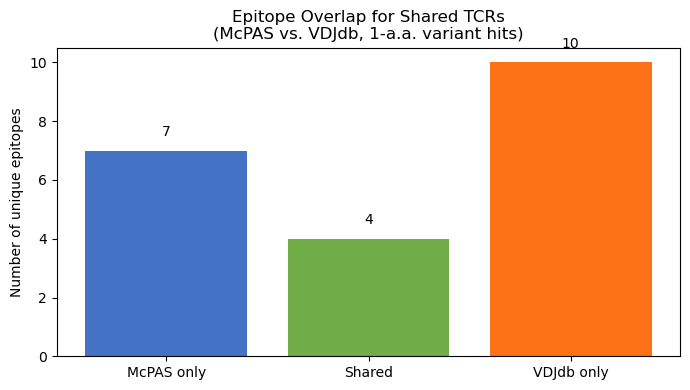

In [137]:
import matplotlib.pyplot as plt

# Suppose you have computed these sets as before:
# all_mcpas_epitopes, all_vdjdb_epitopes, all_shared_epitopes

set_mcpas = set().union(*df_compare['only_mcpas_epitopes'], *df_compare['shared_epitopes'])
set_vdjdb = set().union(*df_compare['only_vdjdb_epitopes'], *df_compare['shared_epitopes'])
set_shared = set().union(*df_compare['shared_epitopes'])

counts = [
    len(set_mcpas - set_shared),   # Unique to McPAS
    len(set_shared),               # Shared
    len(set_vdjdb - set_shared)    # Unique to VDJdb
]

labels = ['McPAS only', 'Shared', 'VDJdb only']
colors = ['#4472c4', '#70ad47', "#FD7216"]

plt.figure(figsize=(7,4))
plt.bar(labels, counts, color=colors)
plt.ylabel("Number of unique epitopes")
plt.title("Epitope Overlap for Shared TCRs\n(McPAS vs. VDJdb, 1-a.a. variant hits)")
for i, v in enumerate(counts):
    plt.text(i, v+0.5, str(v), ha='center')
plt.tight_layout()
plt.show()


In [138]:
import pandas as pd
import matplotlib.pyplot as plt

def standardize_and_prepare(df_mcpas_raw, df_vdjdb_raw):
    """Standardize and align McPAS and VDJdb DataFrames to a shared column structure."""
    df_mcpas = df_mcpas_raw.rename(columns={
        'antigen_species': 'antigen_species',
        'antigen.protein': 'antigen_gene',
        'mhc': 'mhc_a',
        'pathology': 'pathology',
        'category': 'category',
        'species': 'species',
    })

    for col in ['antigen_gene', 'mhc_b']:
        if col not in df_mcpas.columns:
            df_mcpas[col] = None

    for col in ['pathology', 'category']:
        if col not in df_vdjdb_raw.columns:
            df_vdjdb_raw[col] = None

    shared_cols = ['query', 'match', 'epitope', 'antigen_species', 'antigen_gene',
                   'category', 'mhc_a', 'mhc_b', 'reference_id']

    return df_mcpas[shared_cols], df_vdjdb_raw[shared_cols]

def compare_epitope_counts(df_mcpas_std, df_vdjdb_std):
    n_mcpas_epitopes = df_mcpas_std['epitope'].nunique()
    n_vdjdb_epitopes = df_vdjdb_std['epitope'].nunique()
    print(f"Unique epitopes (McPAS): {n_mcpas_epitopes}")
    print(f"Unique epitopes (VDJdb): {n_vdjdb_epitopes}")

    mcpas_queries = set(df_mcpas_std['query'])
    vdjdb_queries = set(df_vdjdb_std['query'])

    only_mcpas = mcpas_queries - vdjdb_queries
    only_vdjdb = vdjdb_queries - mcpas_queries
    both = mcpas_queries & vdjdb_queries

    print(f"TCRs only in McPAS: {len(only_mcpas)}")
    print(f"TCRs only in VDJdb: {len(only_vdjdb)}")
    print(f"TCRs in both: {len(both)}")

def plot_species_distribution(df_mcpas_std, df_vdjdb_std):
    species_counts_mcpas = df_mcpas_std['antigen_species'].value_counts()
    species_counts_vdjdb = df_vdjdb_std['antigen_species'].value_counts()

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    species_counts_mcpas.head(10).plot(kind='bar', title='McPAS - Antigen Species')
    plt.subplot(1, 2, 2)
    species_counts_vdjdb.head(10).plot(kind='bar', title='VDJdb - Antigen Species')
    plt.tight_layout()
    plt.show()

def plot_epitope_overlap(df_compare):
    set_mcpas = set().union(*df_compare['only_mcpas_epitopes'], *df_compare['shared_epitopes'])
    set_vdjdb = set().union(*df_compare['only_vdjdb_epitopes'], *df_compare['shared_epitopes'])
    set_shared = set().union(*df_compare['shared_epitopes'])

    counts = [
        len(set_mcpas - set_shared),
        len(set_shared),
        len(set_vdjdb - set_shared)
    ]

    labels = ['McPAS only', 'Shared', 'VDJdb only']
    colors = ['#4472c4', '#70ad47', "#FD7216"]

    plt.figure(figsize=(7, 4))
    plt.bar(labels, counts, color=colors)
    plt.ylabel("Number of unique epitopes")
    plt.title("Epitope Overlap for Shared TCRs\n(McPAS vs. VDJdb, 1-a.a. variant hits)")
    for i, v in enumerate(counts):
        plt.text(i, v + 0.5, str(v), ha='center')
    plt.tight_layout()
    plt.show()

def detailed_epitope_comparison(df_mcpas_std, df_vdjdb_std):
    shared_queries = set(df_mcpas_std['query']).intersection(df_vdjdb_std['query'])
    print(f"Number of shared query TCRs with at least one hit in both DBs: {len(shared_queries)}")

    detailed_comparison = []

    for tcr in shared_queries:
        mcpas_matches = df_mcpas_std[df_mcpas_std['query'] == tcr]
        vdjdb_matches = df_vdjdb_std[df_vdjdb_std['query'] == tcr]

        mcpas_pairs = set(zip(mcpas_matches['match'], mcpas_matches['epitope']))
        vdjdb_pairs = set(zip(vdjdb_matches['match'], vdjdb_matches['epitope']))

        mcpas_epitopes = set(mcpas_matches['epitope'].dropna())
        vdjdb_epitopes = set(vdjdb_matches['epitope'].dropna())

        shared_pairs = mcpas_pairs & vdjdb_pairs
        shared_epitopes = mcpas_epitopes & vdjdb_epitopes
        only_mcpas = mcpas_epitopes - vdjdb_epitopes
        only_vdjdb = vdjdb_epitopes - mcpas_epitopes

        detailed_comparison.append({
            'query': tcr,
            'n_mcpas_matches': len(mcpas_matches),
            'n_vdjdb_matches': len(vdjdb_matches),
            'n_shared_pairs': len(shared_pairs),
            'shared_pairs': shared_pairs,
            'shared_epitopes': shared_epitopes,
            'only_mcpas_epitopes': only_mcpas,
            'only_vdjdb_epitopes': only_vdjdb,
        })

    df_compare = pd.DataFrame(detailed_comparison)

    print(f"Number of shared TCRs with at least one identical (variant, epitope) pair in both DBs: "
          f"{(df_compare['n_shared_pairs'] > 0).sum()}")
    print(f"Number of shared TCRs with at least one shared epitope (possibly via different variants): "
          f"{(df_compare['shared_epitopes'].apply(len) > 0).sum()}")

    for _, row in df_compare.iterrows():
        print("=" * 80)
        print(f"Query TCR: {row['query']}")
        print(f"  # McPAS matches: {row['n_mcpas_matches']}, # VDJdb matches: {row['n_vdjdb_matches']}")
        print(f"  Shared variant + epitope pairs: {row['shared_pairs'] if row['n_shared_pairs'] else 'None'}")
        print(f"  Shared epitopes: {row['shared_epitopes'] if row['shared_epitopes'] else 'None'}")
        if row['only_mcpas_epitopes']:
            print(f"  Epitopes unique to McPAS: {row['only_mcpas_epitopes']}")
        if row['only_vdjdb_epitopes']:
            print(f"  Epitopes unique to VDJdb: {row['only_vdjdb_epitopes']}")
        print("=" * 80)
    plot_epitope_overlap(df_compare)
    # return df_compare


Run largest

In [52]:
df_mcpas_std_largest, df_vdjdb_std_largest = standardize_and_prepare(pd.DataFrame(results_largest_mcpas), pd.DataFrame(results_largest_vdjdb))

Unique epitopes (McPAS): 11
Unique epitopes (VDJdb): 14
TCRs only in McPAS: 2
TCRs only in VDJdb: 0
TCRs in both: 9


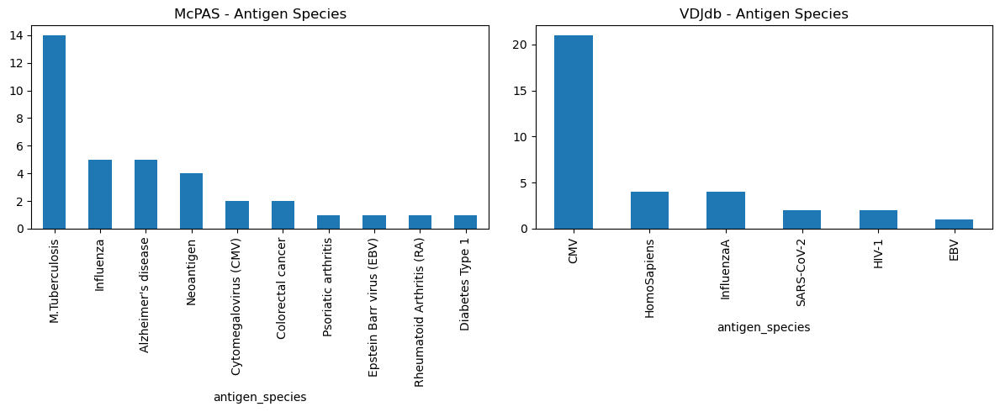

Number of shared query TCRs with at least one hit in both DBs: 9
Number of shared TCRs with at least one identical (variant, epitope) pair in both DBs: 2
Number of shared TCRs with at least one shared epitope (possibly via different variants): 3
Query TCR: CASSLEAEETQYF
  # McPAS matches: 4, # VDJdb matches: 1
  Shared variant + epitope pairs: None
  Shared epitopes: None
  Epitopes unique to VDJdb: {'KLGGALQAK'}
Query TCR: CASSLTAGANVLTF
  # McPAS matches: 1, # VDJdb matches: 3
  Shared variant + epitope pairs: None
  Shared epitopes: None
  Epitopes unique to McPAS: {'LPRRSGAAGA'}
  Epitopes unique to VDJdb: {'KLGGALQAK', 'KRWIILGLNK', 'QARQMVQAMRTIGTHP'}
Query TCR: CASSPGQGGDTQYF
  # McPAS matches: 4, # VDJdb matches: 6
  Shared variant + epitope pairs: None
  Shared epitopes: {'NLVPMVATV'}
  Epitopes unique to McPAS: {'GLTSFFIAI', 'LPRRSGAAGA'}
  Epitopes unique to VDJdb: {'NEGVKAAW', 'KLGGALQAK', 'ELAGIGILTV', 'SPRWYFYYL', 'GILGFVFTL'}
Query TCR: CASSPNMNTEAFF
  # McPAS matches: 4

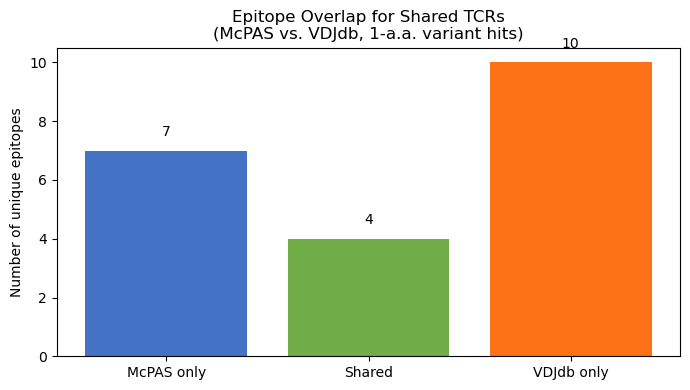

In [53]:
compare_epitope_counts(df_mcpas_std_largest, df_vdjdb_std_largest)
plot_species_distribution(df_mcpas_std_largest, df_vdjdb_std_largest)
detailed_epitope_comparison(df_mcpas_std_largest, df_vdjdb_std_largest)

Run Second

In [54]:
df_mcpas_std_second, df_vdjdb_std_second = standardize_and_prepare(pd.DataFrame(results_second_mcpas), pd.DataFrame(results_second_vdjdb))

Unique epitopes (McPAS): 6
Unique epitopes (VDJdb): 24
TCRs only in McPAS: 1
TCRs only in VDJdb: 2
TCRs in both: 5


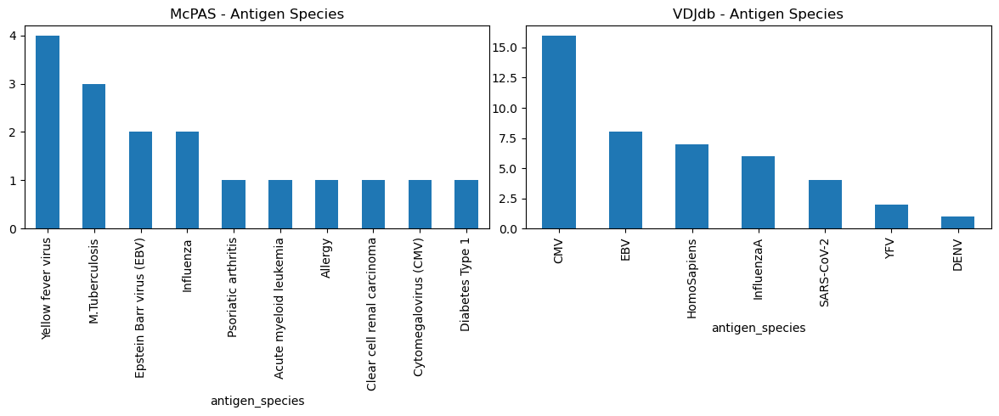

Number of shared query TCRs with at least one hit in both DBs: 5
Number of shared TCRs with at least one identical (variant, epitope) pair in both DBs: 3
Number of shared TCRs with at least one shared epitope (possibly via different variants): 3
Query TCR: CASSPPGQGNYGYTF
  # McPAS matches: 1, # VDJdb matches: 2
  Shared variant + epitope pairs: {('CASSPPGQGIYGYTF', 'GLCTLVAML')}
  Shared epitopes: {'GLCTLVAML'}
  Epitopes unique to VDJdb: {'MLYQHLLPL'}
Query TCR: CASSGGQGPYEQYF
  # McPAS matches: 6, # VDJdb matches: 16
  Shared variant + epitope pairs: {('CASSIGQGPYEQYF', 'ALTPVVVTL'), ('CASSPGQGPYEQYF', 'LLWNGPMAV')}
  Shared epitopes: {'LLWNGPMAV', 'ALTPVVVTL'}
  Epitopes unique to VDJdb: {'NEGVKAAW', 'IVTDFSVIK', 'LYALVYFLH', 'NLVPMVATV', 'NYNYLYRLF', 'KLGGALQAK'}
Query TCR: CASSLQQGYEQYF
  # McPAS matches: 5, # VDJdb matches: 12
  Shared variant + epitope pairs: {('CASSLAQGYEQYF', 'VTEHDTLLY'), ('CASSLVQGYEQYF', 'GLCTLVAML')}
  Shared epitopes: {'VTEHDTLLY', 'GLCTLVAML'}
  Epitope

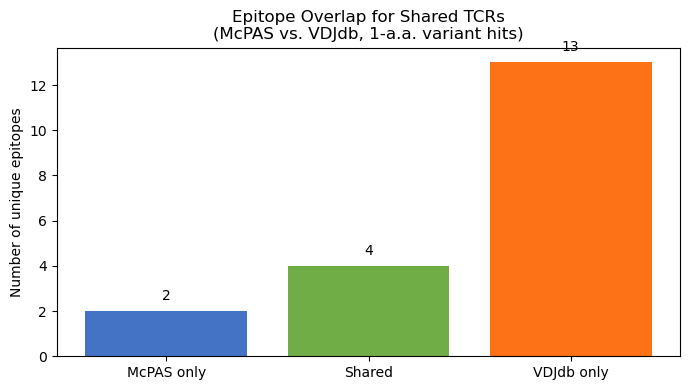

In [55]:
compare_epitope_counts(df_mcpas_std_second, df_vdjdb_std_second)
plot_species_distribution(df_mcpas_std_second, df_vdjdb_std_second)
detailed_epitope_comparison(df_mcpas_std_second, df_vdjdb_std_second)

##### Random sampling

Lets start with random sampling of TCRs from total clonotype repertiore, and compare its epitope to the results of largest lcc above. we will take 10 random TCRs(same size for test group).

Should have vdjdb df and find_single_mutation_hits function before running below code. they are under VDJDB in TCR - Epitope matching

In [139]:
clonotype_df.shape[0]

15212496

In [17]:
import pandas as pd
import re

# STEP 1 — Sample 10 TCRs from clonotype_df
def sample_random_tcrs(clonotype_df, n=10):
    sample = clonotype_df.sample(n=n).copy()
    
    # Rename for clarity
    sample = sample.rename(columns={
        'allVHitsWithScore': 'v_gene_raw',
        'allJHitsWithScore': 'j_gene_raw'
    })

    # Extract V/J gene names
    sample['v_gene'] = sample['v_gene_raw'].str.split(',').str[0].str.extract(r"^([^*]+)")[0]
    sample['j_gene'] = sample['j_gene_raw'].str.split(',').str[0].str.extract(r"^([^*]+)")[0]

    # Keep only required columns
    return sample[['aaSeqCDR3', 'v_gene', 'j_gene', 'group']]


def get_public_tcr_pool(clonotype_df, min_samples=5):
    """Return a filtered clonotype_df of only TCRs with at least min_samples unique sample occurrences."""
    tcr_publicity = (
        clonotype_df.groupby('aaSeqCDR3')['Sample_ID']
        .nunique()
        .reset_index(name='sample_count')
        .query(f'sample_count >= {min_samples}')
    )

    return clonotype_df[clonotype_df['aaSeqCDR3'].isin(tcr_publicity['aaSeqCDR3'])]


# STEP 2 — Annotate with VDJdb via exact match (merge on aaSeqCDR3)
def annotate_with_vdjdb(tcr_sample_df, vdjdb_df):
    columns_to_keep = [
        'aaSeqCDR3', 'v_gene', 'j_gene', 'group',
        'antigen.epitope', 'antigen.gene', 'antigen.species',
        'mhc.a', 'mhc.b', 'reference.id'
    ]

    annotated = tcr_sample_df.merge(
        vdjdb_df,
        left_on='aaSeqCDR3',
        right_on='cdr3.beta',
        how='left'
    )

    return annotated[columns_to_keep]

def annotate_with_db(tcr_sample_df, db_df, cdr3_col='cdr3.beta', columns_to_keep=None):
    """
    Generic annotation function for merging TCR samples with a database.
    Parameters:
        - tcr_sample_df: TCR sample dataframe with 'aaSeqCDR3'
        - db_df: database dataframe to annotate with
        - cdr3_col: name of the column in db_df that contains the TCR CDR3 sequences
        - columns_to_keep: list of columns to retain in final output (optional)
    """
    annotated = tcr_sample_df.merge(
        db_df,
        left_on='aaSeqCDR3',
        right_on=cdr3_col,
        how='left'
    )

    # If not specified, auto-detect reasonable default columns
    if columns_to_keep is None:
        base_cols = ['aaSeqCDR3', 'v_gene', 'j_gene', 'group']
        db_cols = [col for col in db_df.columns if any(key in col.lower() for key in ['epitope', 'mhc', 'gene', 'species', 'reference', 'category'])]
        columns_to_keep = base_cols + db_cols

    # Keep only available columns
    available_cols = [col for col in columns_to_keep if col in annotated.columns]

    return annotated[available_cols]

# STEP 3 — Run 1 amino-acid mutation search on the 10 sampled TCRs
def run_1aa_epitope_matching(tcr_sample_df, db_df, find_single_mutation_hits, db_col='cdr3.beta'):
    """
    For each TCR in the sample dataframe, perform a 1-aa variation search against db_df,
    and return matched rows with relevant annotation fields.
    """
    results = []

    for tcr in tcr_sample_df['aaSeqCDR3']:
        matches = find_single_mutation_hits(tcr, db_df, db_col=db_col)

        for _, row in matches.iterrows():
            # Use fallback-safe lookups
            results.append({
                'query': tcr,
                'match': row.get(db_col, None),
                'epitope': row.get('antigen.epitope') or row.get('Epitope.peptide'),
                'antigen_species': row.get('antigen.species') or row.get('Pathology'),
                'antigen_gene': row.get('antigen.gene') or row.get('Antigen.protein'),
                'mhc_a': row.get('mhc.a') or row.get('MHC'),
                'mhc_b': row.get('mhc.b') or None,
                'reference_id': row.get('reference.id') or row.get('PubMed.ID'),
            })

    return pd.DataFrame(results).drop_duplicates()


In [141]:
random_tcrs = sample_random_tcrs(clonotype_df, n=10)
annotated_random_tcrs = annotate_with_vdjdb(random_tcrs, vdjdb)
results_10_tcr = run_1aa_epitope_matching(annotated_random_tcrs, vdjdb, find_single_mutation_hits)

In [18]:
def compute_epitope_metrics(matched_df, original_epitopes=None):
    """Compute summary metrics from epitope-matching results with support for varied schema."""
    if matched_df.empty:
        return {
            'n_hits': 0,
            'n_unique_epitopes': 0,
            'n_antigen_species': 0,
            'n_antigen_genes': 0,
            'n_mhc_types': 0,
            'epitope_overlap_with_original': 0
        }

    # Infer column names
    gene_col = 'antigen_gene' if 'antigen_gene' in matched_df.columns else 'antigen.protein'
    species_col = 'antigen_species' if 'antigen_species' in matched_df.columns else 'Pathology'
    mhc_cols = (
        ['mhc_a', 'mhc_b'] if 'mhc_a' in matched_df.columns and 'mhc_b' in matched_df.columns
        else ['mhc'] if 'mhc' in matched_df.columns
        else []
    )

    metrics = {
        'n_hits': len(matched_df),
        'n_unique_epitopes': matched_df['epitope'].nunique(),
        'n_antigen_species': matched_df[species_col].nunique() if species_col in matched_df.columns else 0,
        'n_antigen_genes': matched_df[gene_col].nunique() if gene_col in matched_df.columns else 0,
        'n_mhc_types': matched_df[mhc_cols].drop_duplicates().shape[0] if mhc_cols else 0,
    }

    if original_epitopes is not None:
        matched_epitopes = set(matched_df['epitope'].dropna())
        overlap = matched_epitopes & original_epitopes
        metrics['epitope_overlap_with_original'] = len(overlap)

    return metrics


In [143]:
original_matched_df = pd.DataFrame(results_largest_vdjdb)

# Compute metrics for original TCR group
original_epitope_set = set(original_matched_df['epitope'].dropna())
print(f"Number of unique epitopes in original group: {len(original_epitope_set)}")
print(list(original_epitope_set)[:5])  # preview

original_metrics = compute_epitope_metrics(
    matched_df=original_matched_df,
    original_epitopes=original_epitope_set
)


Number of unique epitopes in original group: 14
['RPHERNGFTVL', 'MEVTPSGTWL', 'SPRWYFYYL', 'QARQMVQAMRTIGTHP', 'KLGGALQAK']


In [19]:
from tqdm import tqdm

def run_sampling_with_metrics(clonotype_df, db_df, n_iter, original_epitopes, db_cdr3_col, 
                              num_random_tcr=10, random_public=False, public_clonotype_df=None):
    metrics_list = []
    matched_list = []
    for _ in tqdm(range(n_iter), desc="Running randomized comparisons"):
        if random_public:
            if public_clonotype_df is None:
                raise ValueError("You must provide `public_clonotype_df` if `random_public=True`.")
            sample = sample_random_tcrs(public_clonotype_df, n=num_random_tcr)
        else:
            sample = sample_random_tcrs(clonotype_df, n=num_random_tcr)
        annotated_sample = annotate_with_db(sample, db_df, cdr3_col=db_cdr3_col)
        matched = run_1aa_epitope_matching(annotated_sample, db_df, find_single_mutation_hits, db_col=db_cdr3_col)
        # matched = matched.drop_duplicates(subset=['query', 'match', 'epitope'])
        matched['iteration'] = _  # track source
        matched_list.append(matched.copy())

        metrics = compute_epitope_metrics(matched, original_epitopes=original_epitopes)
        metrics['iteration'] = _
        metrics_list.append(metrics)

    return pd.DataFrame(metrics_list),  pd.concat(matched_list, ignore_index=True)


In [62]:
# Run
random_metrics_df_vdjdb, matched_df_vdjdb = run_sampling_with_metrics(
    clonotype_df=clonotype_df,
    db_df=vdjdb,
    n_iter=1000,
    original_epitopes=original_epitope_set,
    db_cdr3_col="cdr3.beta"
)

Running randomized comparisons: 100%|██████████| 1000/1000 [13:17<00:00,  1.25it/s]


In [20]:
def plot_metric_distribution(random_metrics_df, original_metrics, metric_key, title=None):
    plt.figure(figsize=(7, 4))
    sns.histplot(random_metrics_df[metric_key], bins=30, kde=True, stat='density', color='skyblue', edgecolor='black')
    plt.axvline(original_metrics[metric_key], color='red', linestyle='--', label='Original')
    plt.title(title or f'Distribution of {metric_key}')
    plt.xlabel(metric_key)
    plt.ylabel('Density')
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_bar_with_empirical_p(random_metrics_df, original_metrics, metric_key, n_iter=1000):
    original_val = original_metrics[metric_key]
    random_vals = random_metrics_df[metric_key]

    # Empirical p-value: number of randoms ≥ original
    p_val = (np.sum(random_vals >= original_val) + 1) / (n_iter + 1)

    plt.figure(figsize=(5, 4))
    bars = plt.bar(['Original', 'Random mean'], [original_val, random_vals.mean()], color=['red', 'gray'])
    plt.ylabel(metric_key.replace('_', ' ').title())
    plt.title(f"{metric_key.replace('_', ' ').title()} with Empirical p-value")

    # Annotate
    plt.text(0, original_val + 0.05 * original_val, f"{original_val:.1f}", ha='center', color='black')
    plt.text(1, random_vals.mean() + 0.05 * random_vals.mean(), f"{random_vals.mean():.1f}", ha='center', color='black')
    plt.text(0.5, max(original_val, random_vals.mean()) * 1.1, f"p = {p_val:.3f}", ha='center', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.show()

def plot_violin_or_box(random_metrics_df, original_metrics, metric_key, kind='violin'):
    plt.figure(figsize=(5, 4))
    if kind == 'violin':
        sns.violinplot(y=random_metrics_df[metric_key], color='lightblue')
    else:
        sns.boxplot(y=random_metrics_df[metric_key], color='lightgray')

    # Add original value
    plt.axhline(original_metrics[metric_key], color='red', linestyle='--', label='Original')
    plt.title(f"{metric_key.replace('_', ' ').title()} Distribution")
    plt.ylabel(metric_key.replace('_', ' ').title())
    plt.legend()
    plt.tight_layout()
    plt.show()

def plot_epitope_recurrence(random_metrics_df, original_epitope_set):
    # Flatten all found epitopes from all iterations
    all_epitopes = random_metrics_df.get('epitope', None)
    if all_epitopes is None:
        print("epitope column not found in random_metrics_df")
        return

    # Count occurrences of each original epitope
    if isinstance(all_epitopes.iloc[0], list) or isinstance(all_epitopes.iloc[0], set):
        epitope_flat = [ep for eps in all_epitopes if eps is not None for ep in eps]
    else:
        epitope_flat = list(all_epitopes.dropna())

    ep_counts = pd.Series(epitope_flat).value_counts()
    original_counts = ep_counts[ep_counts.index.isin(original_epitope_set)]

    plt.figure(figsize=(10, 4))
    original_counts.sort_values(ascending=False).plot(kind='bar', color='green')
    plt.title("Original Epitopes – Recurrence in 1000 Random Groups")
    plt.xlabel("Epitope")
    plt.ylabel("Occurrences")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

def plot_metric_scatter(random_metrics_df, original_metrics, x_metric, y_metric):
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data=random_metrics_df, x=x_metric, y=y_metric, color='gray', alpha=0.6)
    plt.scatter(original_metrics[x_metric], original_metrics[y_metric], color='red', label='Original', zorder=10)
    plt.xlabel(x_metric.replace('_', ' ').title())
    plt.ylabel(y_metric.replace('_', ' ').title())
    plt.title(f"{y_metric.replace('_', ' ').title()} vs. {x_metric.replace('_', ' ').title()}")
    plt.legend()
    plt.tight_layout()
    plt.show()


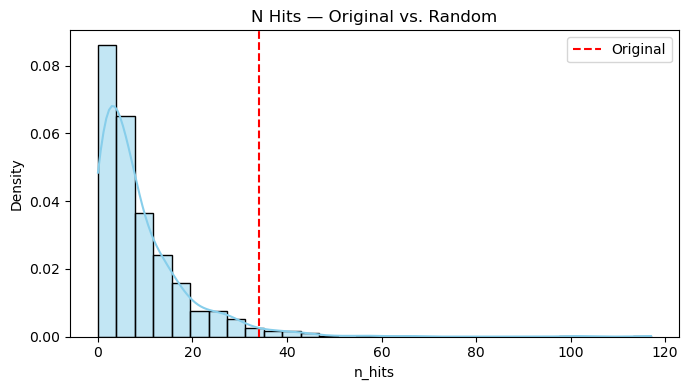

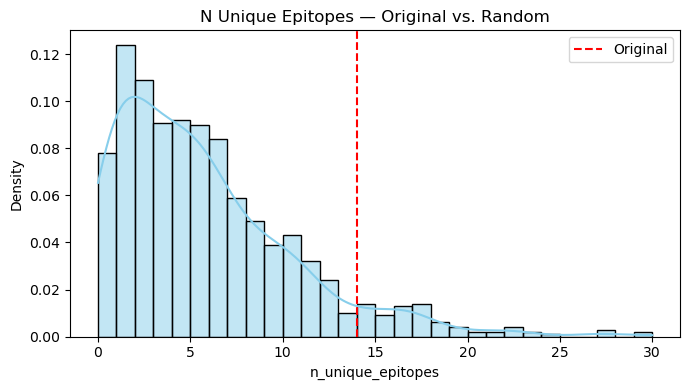

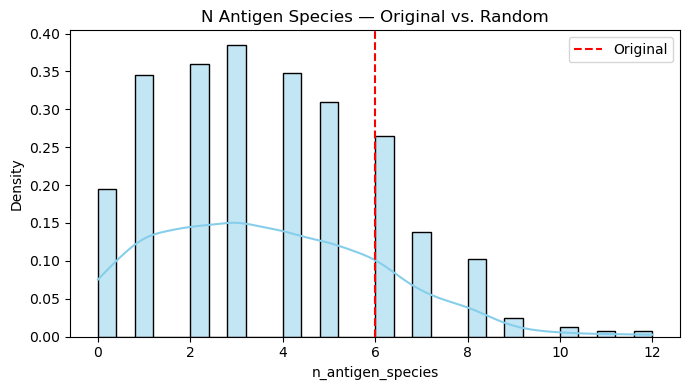

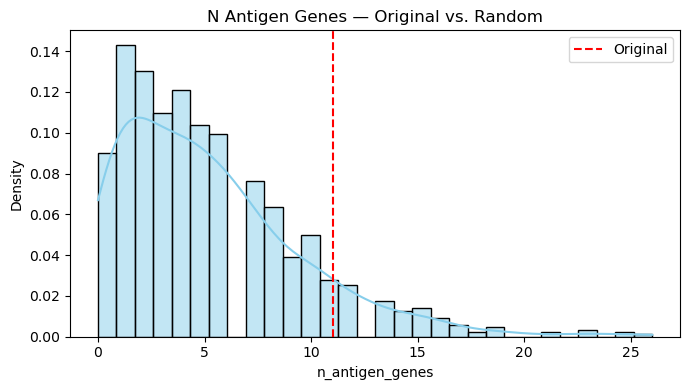

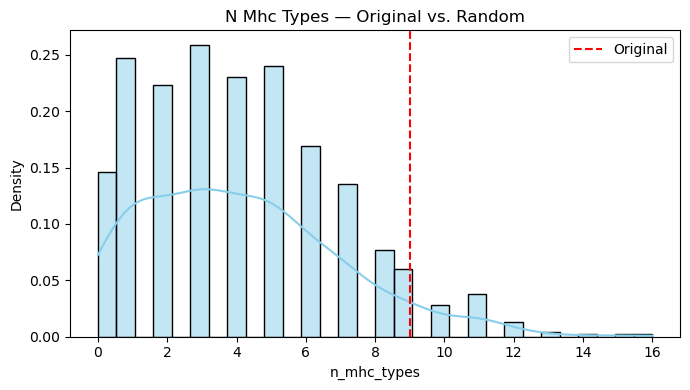

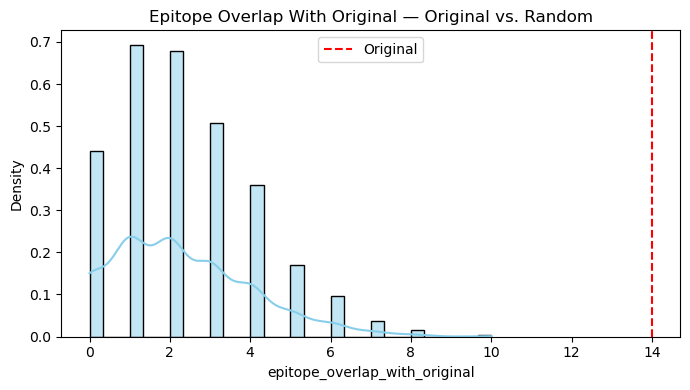

In [64]:
metrics_to_plot = [
    'n_hits',
    'n_unique_epitopes',
    'n_antigen_species',
    'n_antigen_genes',
    'n_mhc_types',
    'epitope_overlap_with_original'
]

for metric in metrics_to_plot:
    plot_metric_distribution(
        random_metrics_df_vdjdb,
        original_metrics,
        metric_key=metric,
        title=f"{metric.replace('_', ' ').title()} — Original vs. Random"
    )

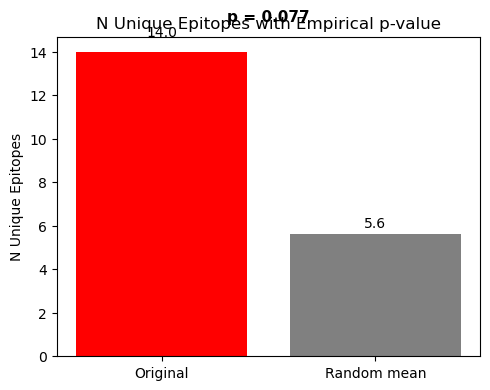

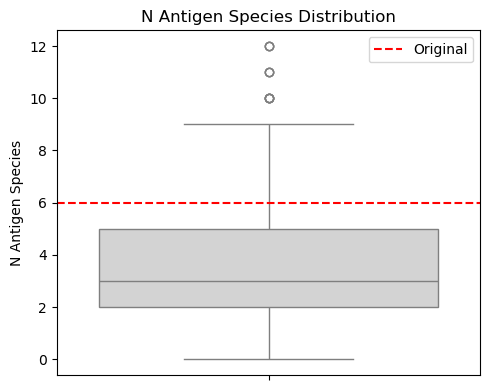

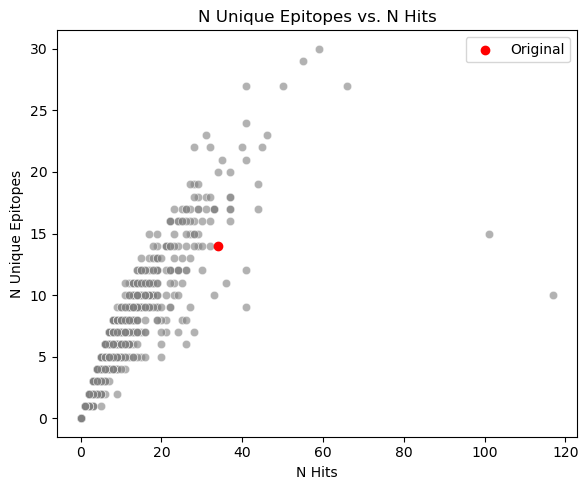

In [65]:
plot_bar_with_empirical_p(random_metrics_df_vdjdb, original_metrics, 'n_unique_epitopes')
plot_violin_or_box(random_metrics_df_vdjdb, original_metrics, 'n_antigen_species', kind='box')
plot_metric_scatter(random_metrics_df_vdjdb, original_metrics, 'n_hits', 'n_unique_epitopes')


In [73]:
max_idx_unique_epitope = random_metrics_df_vdjdb['n_unique_epitopes'].idxmax()
max_row_epitope = random_metrics_df_vdjdb.loc[max_idx_unique_epitope]
print(max_row_epitope)

max_idx_unique_hits = random_metrics_df_vdjdb['n_hits'].idxmax()
max_row_hits = random_metrics_df_vdjdb.loc[max_idx_unique_hits]
print(max_row_hits)

n_hits                           59
n_unique_epitopes                30
n_antigen_species                12
n_antigen_genes                  26
n_mhc_types                      16
epitope_overlap_with_original     8
iteration                        36
Name: 36, dtype: int64
n_hits                           117
n_unique_epitopes                 10
n_antigen_species                  7
n_antigen_genes                    9
n_mhc_types                        6
epitope_overlap_with_original      3
iteration                        960
Name: 960, dtype: int64


In [82]:
tcr_queries_epitopes = matched_df_vdjdb.query("iteration == 36")
print(tcr_queries_epitopes['query'].unique())

tcr_queries_hits = matched_df_vdjdb.query("iteration == 960")
print(tcr_queries_hits['query'].unique())


['CASSLGGYEQYF' 'CASSPGQPYEQYF']
['CASSSSGSSYEQYF' 'CASSYLVTGELFF' 'CASSSRSTDTQYF']


In [79]:
print(tcr_queries_epitopes['query'].unique())

['CASSLGGYEQYF' 'CASSPGQPYEQYF']


Now lets set up VDJdb with publicity criteria of atleast 5.

In [139]:
# Step 1: Precompute once
public_clonotype_df = get_public_tcr_pool(clonotype_df, min_samples=5)


In [ ]:
random_metrics_df_vdjdb_public, matched_df_vdjdb_public = run_sampling_with_metrics(
    clonotype_df=clonotype_df,
    db_df=vdjdb,
    n_iter=1000,
    original_epitopes=original_epitope_set,
    db_cdr3_col="cdr3.beta",
    num_random_tcr=10, random_public=True, public_clonotype_df=public_clonotype_df
)

Running randomized comparisons: 100%|██████████| 1000/1000 [07:57<00:00,  2.10it/s]


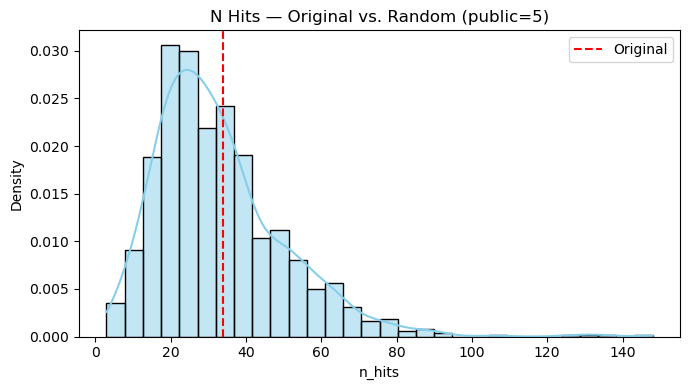

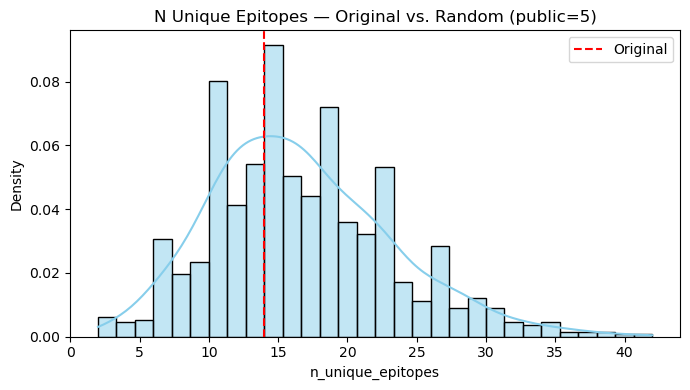

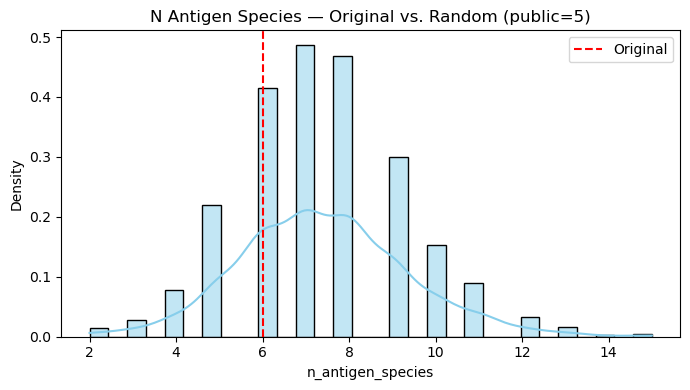

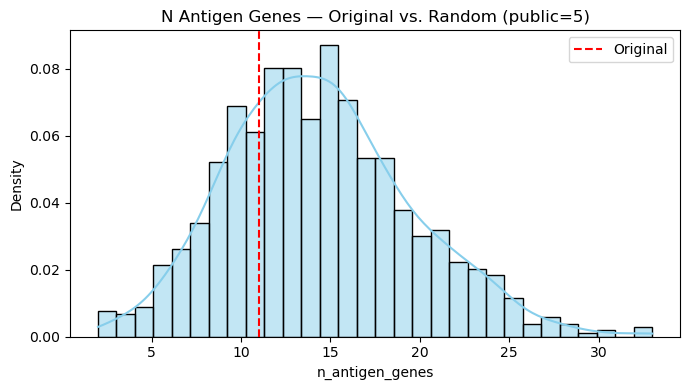

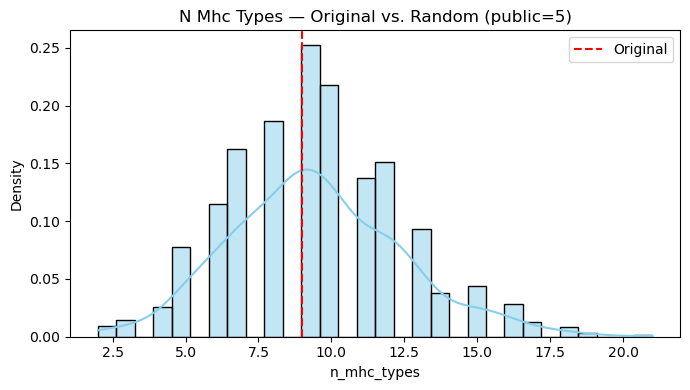

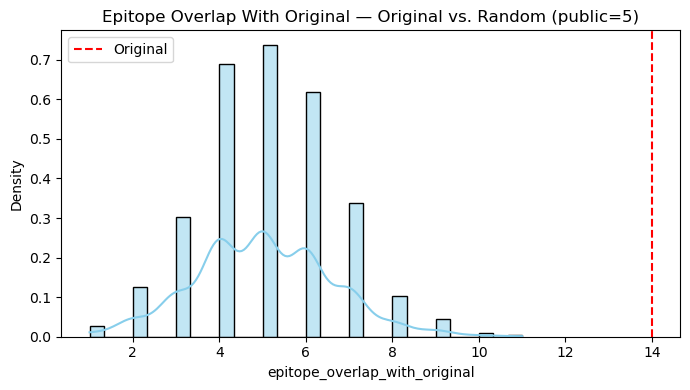

In [ ]:
metrics_to_plot = [
    'n_hits',
    'n_unique_epitopes',
    'n_antigen_species',
    'n_antigen_genes',
    'n_mhc_types',
    'epitope_overlap_with_original'
]

for metric in metrics_to_plot:
    plot_metric_distribution(
        random_metrics_df_vdjdb_public,
        original_metrics,
        metric_key=metric,
        title=f"{metric.replace('_', ' ').title()} — Original vs. Random (public=5)"
    )

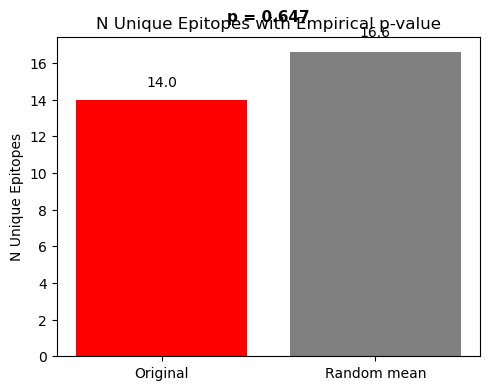

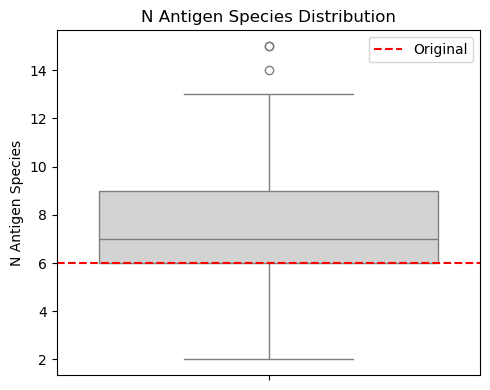

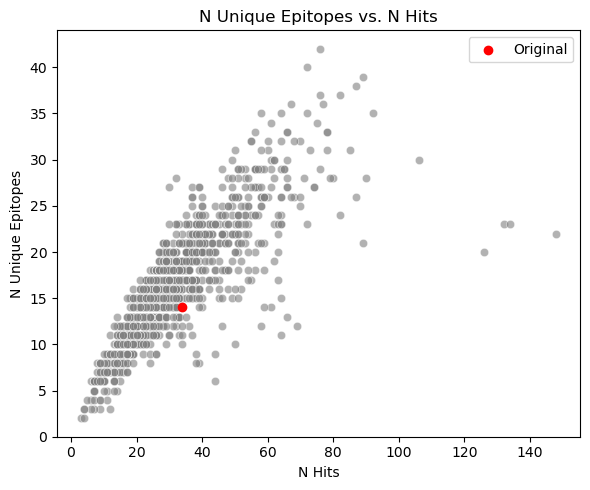

In [ ]:
plot_bar_with_empirical_p(random_metrics_df_vdjdb_public, original_metrics, 'n_unique_epitopes')
plot_violin_or_box(random_metrics_df_vdjdb_public, original_metrics, 'n_antigen_species', kind='box')
plot_metric_scatter(random_metrics_df_vdjdb_public, original_metrics, 'n_hits', 'n_unique_epitopes')


###### McPAS

Now lets do McPAS

In [134]:
original_matched_df_mcpas = pd.DataFrame(results_largest_mcpas)

# Compute metrics for original TCR group
original_epitope_set_mcpas = set(original_matched_df_mcpas['epitope'].dropna())
print(f"Number of unique epitopes in original group: {len(original_epitope_set_mcpas)}")
print(list(original_epitope_set_mcpas)[:5])  # preview

original_metrics_mcpas = compute_epitope_metrics(
    matched_df=original_matched_df_mcpas,
    original_epitopes=original_epitope_set_mcpas
)

Number of unique epitopes in original group: 11
['GLCTLVAML', 'NLVPMVATV', 'RPHERNGFTVL', 'LPRRSGAAGA', 'QLIPCMDVV']


In [135]:
random_metrics_df_mcpas, matched_df_mcpas = run_sampling_with_metrics(
    clonotype_df=clonotype_df,
    db_df=mcpas,
    n_iter=1000,
    original_epitopes=original_epitope_set_mcpas, 
    db_cdr3_col='CDR3.beta.aa'
)

Running randomized comparisons: 100%|██████████| 1000/1000 [12:40<00:00,  1.32it/s]


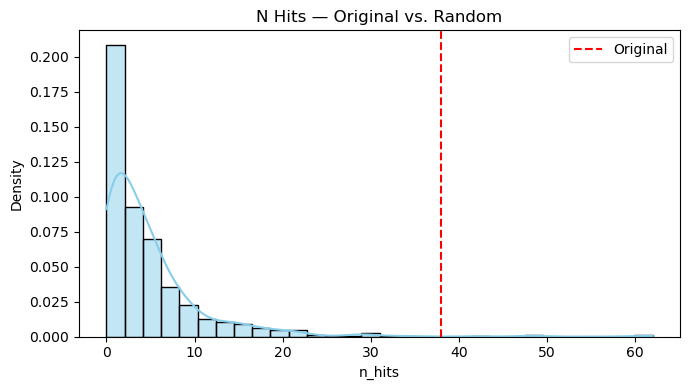

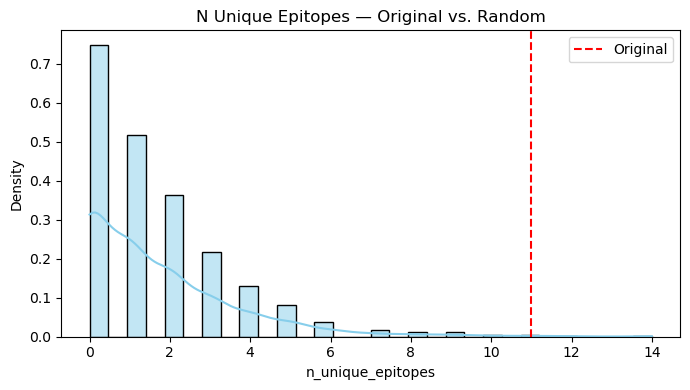

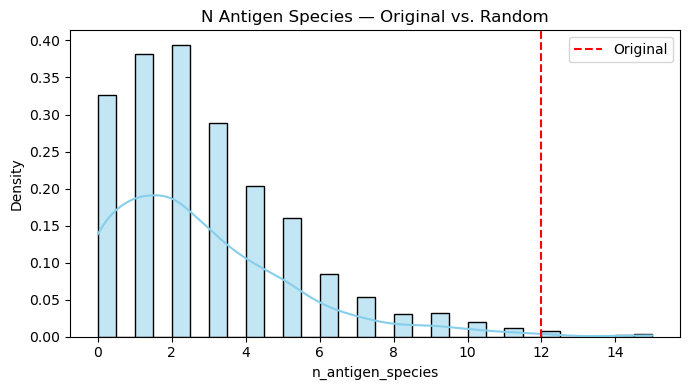

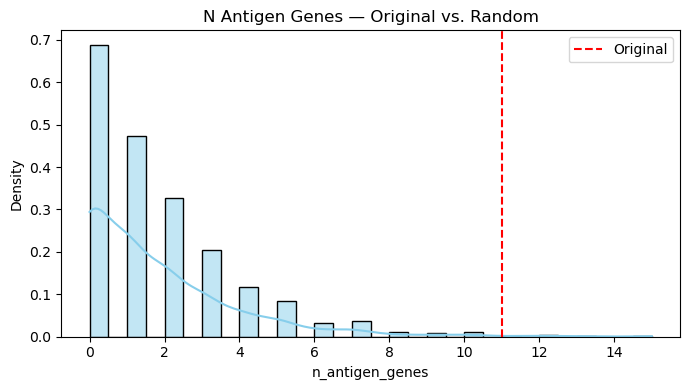

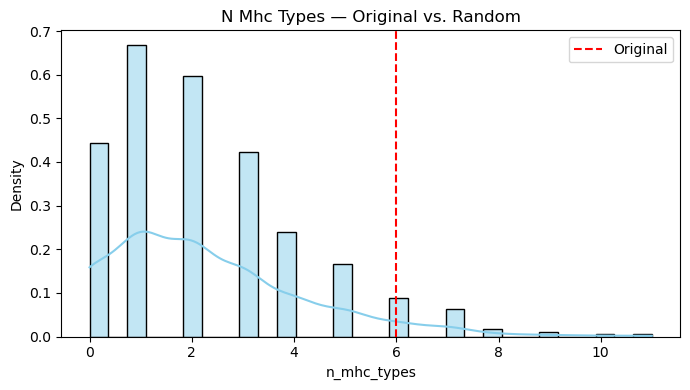

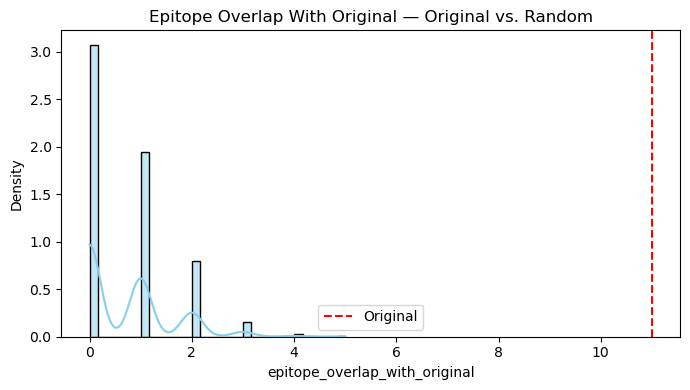

In [136]:
metrics_to_plot = [
    'n_hits',
    'n_unique_epitopes',
    'n_antigen_species',
    'n_antigen_genes',
    'n_mhc_types',
    'epitope_overlap_with_original'
]

for metric in metrics_to_plot:
    plot_metric_distribution(
        random_metrics_df_mcpas,
        original_metrics_mcpas,
        metric_key=metric,
        title=f"{metric.replace('_', ' ').title()} — Original vs. Random"
    )

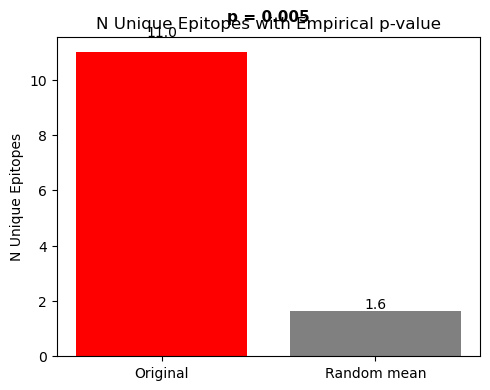

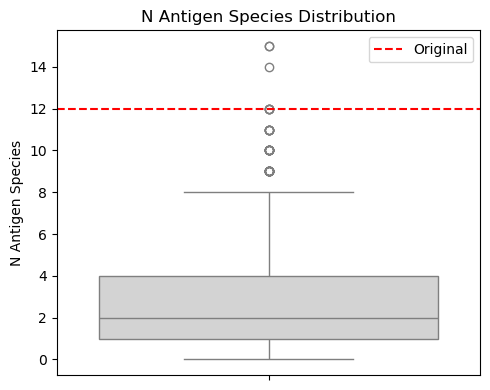

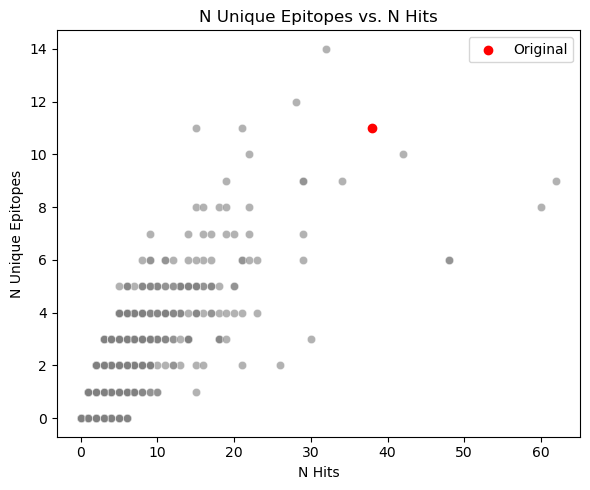

In [137]:
plot_bar_with_empirical_p(random_metrics_df_mcpas, original_metrics_mcpas, 'n_unique_epitopes')
plot_violin_or_box(random_metrics_df_mcpas, original_metrics_mcpas, 'n_antigen_species', kind='box')
plot_metric_scatter(random_metrics_df_mcpas, original_metrics_mcpas, 'n_hits', 'n_unique_epitopes')


In [150]:
max_idx = random_metrics_df_mcpas['n_unique_epitopes'].idxmax()
max_row_epitope = random_metrics_df_mcpas.loc[max_idx]
print(max_row_epitope)

max_idx = random_metrics_df_mcpas['n_hits'].idxmax()
max_row_hits = random_metrics_df_mcpas.loc[max_idx]
print(max_row_hits)


n_hits                            29
n_unique_epitopes                 10
n_antigen_species                 11
n_antigen_genes                   10
n_mhc_types                       10
epitope_overlap_with_original      1
iteration                        186
Name: 186, dtype: int64
n_hits                            31
n_unique_epitopes                  9
n_antigen_species                 10
n_antigen_genes                   10
n_mhc_types                        8
epitope_overlap_with_original      3
iteration                        996
Name: 996, dtype: int64


In [151]:
tcr_queries_epitopes_mcpas = matched_df_mcpas.query("iteration == 611")
print(tcr_queries_epitopes_mcpas['query'].unique())

tcr_queries_hits_mcpas = matched_df_mcpas.query("iteration == 123")
print(tcr_queries_hits_mcpas['query'].unique())

['CASSWRGAETQYF' 'CASSLQGAGTEAFF']
['CASSPDREETQYF' 'CASSLGGSNTEAFF' 'CASRYGEGYNEQFF']


Now lets explore public

In [143]:
random_metrics_df_mcpas_public, matched_df_mcpas_public = run_sampling_with_metrics(
    clonotype_df=clonotype_df,
    db_df=mcpas,
    n_iter=500,
    original_epitopes=original_epitope_set_mcpas, 
    db_cdr3_col='CDR3.beta.aa',
    num_random_tcr=11, random_public=True, public_clonotype_df=public_clonotype_df
)

Running randomized comparisons: 100%|██████████| 500/500 [02:57<00:00,  2.82it/s]


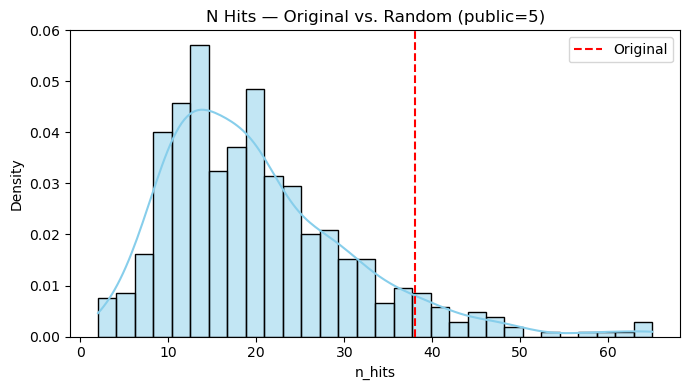

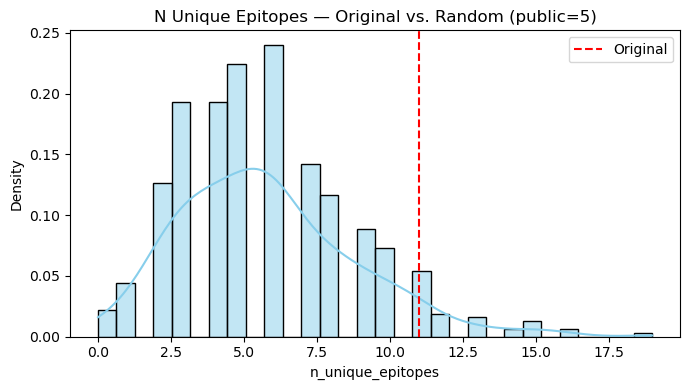

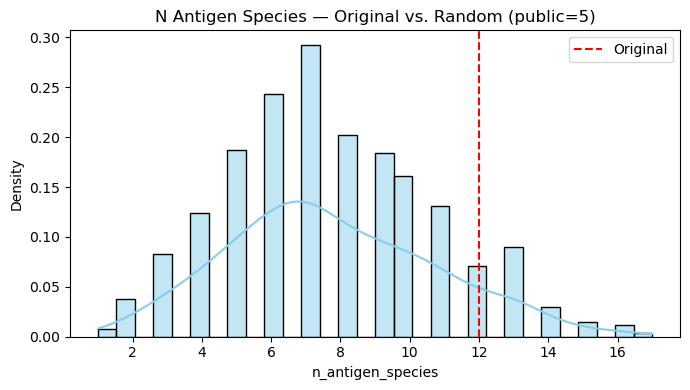

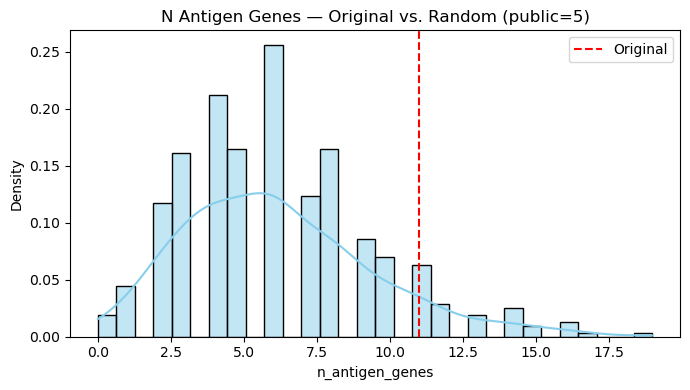

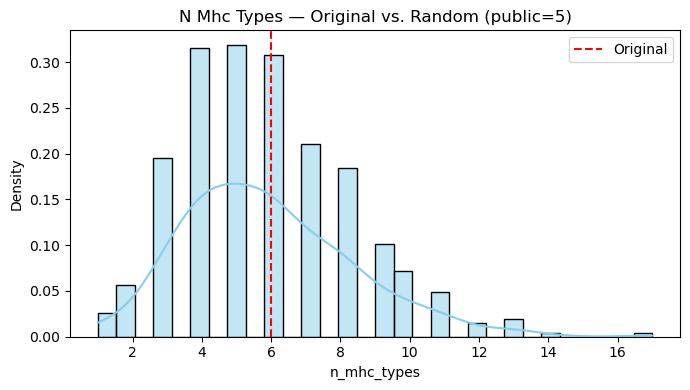

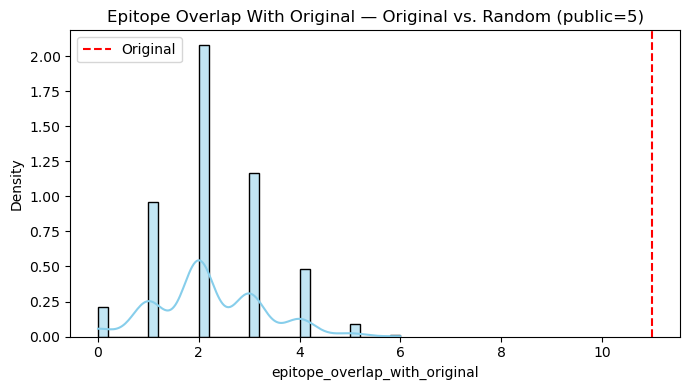

In [144]:
metrics_to_plot = [
    'n_hits',
    'n_unique_epitopes',
    'n_antigen_species',
    'n_antigen_genes',
    'n_mhc_types',
    'epitope_overlap_with_original'
]

for metric in metrics_to_plot:
    plot_metric_distribution(
        random_metrics_df_mcpas_public,
        original_metrics_mcpas,
        metric_key=metric,
        title=f"{metric.replace('_', ' ').title()} — Original vs. Random (public=5)"
    )

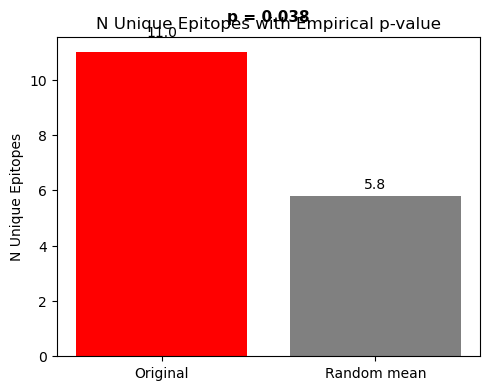

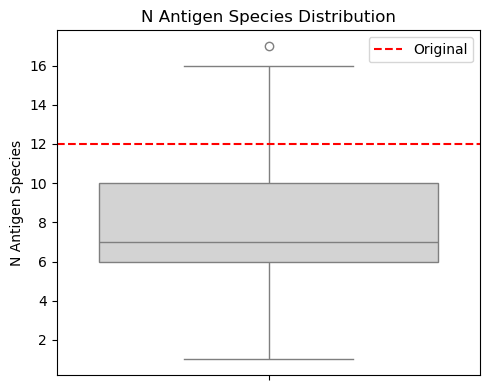

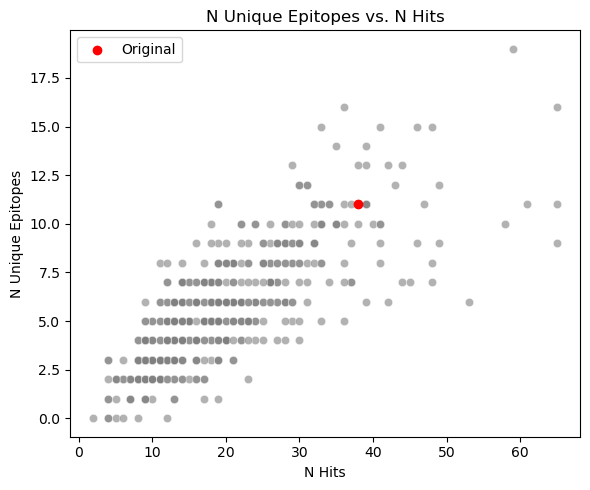

In [145]:
plot_bar_with_empirical_p(random_metrics_df_mcpas_public, original_metrics_mcpas, 'n_unique_epitopes')
plot_violin_or_box(random_metrics_df_mcpas_public, original_metrics_mcpas, 'n_antigen_species', kind='box')
plot_metric_scatter(random_metrics_df_mcpas_public, original_metrics_mcpas, 'n_hits', 'n_unique_epitopes')


###### Combining Epitope & graph stats

In [21]:
import numpy as np
from scipy.stats import chi2, norm

def fisher_method(pvals):
    """Combine p-values with Fisher's method."""
    pvals = np.clip(np.asarray(pvals, float), 1e-323, 1.0)
    stat = -2.0 * np.sum(np.log(pvals))
    dof = 2 * len(pvals)
    return float(1.0 - chi2.cdf(stat, dof)), stat

def stouffer_method(pvals, weights=None):
    """Combine p-values with (weighted) Stouffer's Z."""
    pvals = np.clip(np.asarray(pvals, float), 1e-323, 1.0)
    z = norm.isf(pvals)  # inverse survival -> Z
    if weights is None:
        w = np.ones_like(z)
    else:
        w = np.asarray(weights, float)
    z_comb = np.sum(w * z) / np.sqrt(np.sum(w**2))
    return float(norm.sf(z_comb)), float(z_comb)

def harmonic_mean_pvalue(pvals):
    """Robust to dependence; good when a subset is very small."""
    p = np.clip(np.asarray(pvals, float), 1e-323, 1.0)
    H = len(p) / np.sum(1.0 / p)
    # Liptak correction not applied; use as a score or via permutation (below).
    return float(H)


In [22]:
import numpy as np
import pandas as pd
from scipy.stats import norm

# --- Helper: epitope metrics for a specific TCR list
def epitope_metrics_for_tcr_list(
    tcr_list,
    db_df,
    find_single_mutation_hits,
    db_cdr3_col='cdr3.beta'
):
    rows = []
    for tcr in tcr_list:
        hits = find_single_mutation_hits(tcr, db_df, db_col=db_cdr3_col)
        if hits is None or hits.empty:
            continue
        for _, r in hits.iterrows():
            rows.append({
                'query': tcr,
                'epitope': r.get('antigen.epitope') or r.get('Epitope.peptide'),
                'species': r.get('antigen.species') or r.get('Pathology'),
                'gene': r.get('antigen.gene') or r.get('Antigen.protein'),
                'mhc_a': r.get('mhc.a') or r.get('MHC'),
                'mhc_b': r.get('mhc.b') if 'mhc.b' in r else None,
            })
    matched_df = pd.DataFrame(rows)
    if matched_df.empty:
        return dict(n_hits=0, n_unique_epitopes=0, n_species=0, n_genes=0, n_mhc_types=0)

    mhc_cols = [c for c in ['mhc_a','mhc_b'] if c in matched_df.columns]
    n_mhc = matched_df[mhc_cols].drop_duplicates().shape[0] if mhc_cols else 0
    return dict(
        n_hits=len(matched_df),
        n_unique_epitopes=matched_df['epitope'].nunique(),
        n_species=matched_df['species'].nunique() if 'species' in matched_df else 0,
        n_genes=matched_df['gene'].nunique() if 'gene' in matched_df else 0,
        n_mhc_types=n_mhc
    )

# --- Pick one epitope summary as the test statistic (you can swap to n_unique_epitopes, etc.)
def epitope_score_from_metrics(m):
    return m['n_unique_epitopes']

# --- Codon score: reuse your compare_test_to_random logic to define a scalar "codon score"
# For consistency, let's use mean_ratio_fast + mean_ratio_slow as a single combined codon score.
def codon_score_from_stats(stats_dict):
    return stats_dict['mean_ratio_fast'] + stats_dict['mean_ratio_slow']

# --- Joint permutation test
def joint_permutation_combination(
    test_tcr_list,                 # list[str] for the LCC being tested (size N)
    qualified_df, fast_df, slow_df,# as in your codon function
    db_df, find_single_mutation_hits, db_cdr3_col='cdr3.beta',
    M=1000, seed=None, 
    combine='fisher'               # 'fisher' or 'stouffer'
):
    rng = np.random.default_rng(seed)
    universe = qualified_df['aaSeqCDR3'].dropna().unique().tolist()
    N = len(test_tcr_list)

    # --- Observed stats (same TCR list → both signals)
    # Codon:
    from collections import namedtuple
    # Minimal calc mirroring your calculate_group_statistics
    # If you already have calculate_group_statistics(list, fast_df, slow_df), use it directly:
    def _calc_group_stats(tcrs):
        # THIS depends on your existing function; here we mimic its output keys minimally:
        return calculate_group_statistics(tcrs, fast_df, slow_df)  # must return keys used below

    codon_stats_obs = _calc_group_stats(test_tcr_list)
    codon_score_obs = codon_score_from_stats(codon_stats_obs)

    # Epitope:
    epi_metrics_obs = epitope_metrics_for_tcr_list(
        test_tcr_list, db_df, find_single_mutation_hits, db_cdr3_col
    )
    epi_score_obs = epitope_score_from_metrics(epi_metrics_obs)

    # --- Null via paired resampling
    codon_scores_null = np.zeros(M, dtype=float)
    epi_scores_null   = np.zeros(M, dtype=float)

    for i in range(M):
        sample = rng.choice(universe, size=N, replace=False).tolist()
        # codon
        cs = _calc_group_stats(sample)
        codon_scores_null[i] = codon_score_from_stats(cs)
        # epitope
        em = epitope_metrics_for_tcr_list(sample, db_df, find_single_mutation_hits, db_cdr3_col)
        epi_scores_null[i] = epitope_score_from_metrics(em)

    # --- Convert to one-sided p-values empirically (right-tailed)
    p_codon_emp = (np.sum(codon_scores_null >= codon_score_obs) + 1) / (M + 1)
    p_epi_emp   = (np.sum(epi_scores_null   >= epi_score_obs)   + 1) / (M + 1)

    # --- Combine each null pair to get a null of the combined statistic
    def _combine(p1, p2):
        if combine == 'stouffer':
            return stouffer_method([p1, p2])[1]  # return Z as the stat (higher is more extreme)
        else:
            # Fisher: return the chi-square statistic (higher is more extreme)
            return fisher_method([p1, p2])[1]

    # Observed combined stat (analytic p’s for stability; could also use empirical p’s)
    p1_obs, p2_obs = p_epi_emp, p_codon_emp  # you can swap to analytic if you prefer
    stat_obs = _combine(p1_obs, p2_obs)

    # Build null by combining *empirical* p’s per iteration
    # (rank-based p for each marginal score at iteration i)
    ranks_c = (np.argsort(np.argsort(codon_scores_null)) + 1) / (M + 1)
    ranks_e = (np.argsort(np.argsort(epi_scores_null)) + 1) / (M + 1)
    # Right-tailed empirical p for each iteration
    p_c_null = 1.0 - ranks_c + 1/(M+1)
    p_e_null = 1.0 - ranks_e + 1/(M+1)

    combined_null = np.array([_combine(pc, pe) for pc, pe in zip(p_e_null, p_c_null)])

    # Empirical p of the combined test (greater is more extreme for both stats chosen)
    p_comb_emp = (np.sum(combined_null >= stat_obs) + 1) / (M + 1)

    return {
        'observed': {
            'codon_score': float(codon_score_obs),
            'epi_score': float(epi_score_obs),
            'p_codon_emp': float(p_codon_emp),
            'p_epi_emp': float(p_epi_emp),
            'combined_stat': float(stat_obs),
            'p_comb_emp': float(p_comb_emp),
            'combine': combine
        },
        'null': {
            'codon_scores': codon_scores_null,
            'epi_scores': epi_scores_null,
            'combined_stats': combined_null
        }
    }


In [23]:
res_11 = joint_permutation_combination(
    test_tcr_list=meta_largest['id'].dropna().unique().tolist(),
    qualified_df=qualified_df, fast_df=fast_df, slow_df=slow_df,
    db_df=mcpas, find_single_mutation_hits=find_single_mutation_hits,
    db_cdr3_col='CDR3.beta.aa', M=500, combine='fisher'
)
res_11


{'observed': {'codon_score': 1.896769441428884,
  'epi_score': 11.0,
  'p_codon_emp': 0.3473053892215569,
  'p_epi_emp': 0.1536926147704591,
  'combined_stat': 5.8607029622030336,
  'p_comb_emp': 0.18562874251497005,
  'combine': 'fisher'},
 'null': {'codon_scores': array([1.85705393, 1.75233759, 1.92675307, 1.68685682, 1.86198848,
         2.11329608, 1.8154111 , 1.69319589, 1.82706173, 1.85035257,
         1.73089622, 1.90929837, 1.73772858, 1.77476463, 1.71446436,
         1.92584183, 1.81544503, 1.87763843, 1.83620885, 1.98638566,
         1.87870514, 1.86476299, 1.89883053, 1.80484529, 1.61472369,
         1.77937786, 1.82028373, 1.7262727 , 1.90803248, 1.93589739,
         1.77137327, 2.08138274, 1.91283353, 1.68538639, 1.89322696,
         1.78746119, 1.86288567, 1.82597661, 1.97221792, 1.82859801,
         1.88399635, 1.869723  , 1.95236496, 1.87428931, 1.88845602,
         1.9450685 , 2.00340413, 1.87911973, 1.83789511, 1.85446263,
         1.93454374, 1.82401795, 1.87596025, 

In [26]:
res_6 = joint_permutation_combination(
    test_tcr_list=meta_second['id'].dropna().unique().tolist(),
    qualified_df=qualified_df, fast_df=fast_df, slow_df=slow_df,
    db_df=mcpas, find_single_mutation_hits=find_single_mutation_hits,
    db_cdr3_col='CDR3.beta.aa', M=1000, combine='fisher'
)

In [27]:
res_6

{'observed': {'codon_score': 1.9738058640232552,
  'epi_score': 3.0,
  'p_codon_emp': 0.17682317682317683,
  'p_epi_emp': 0.7872127872127872,
  'combined_stat': 3.9437234723974655,
  'p_comb_emp': 0.4115884115884116,
  'combine': 'fisher'},
 'null': {'codon_scores': array([1.63033441, 2.10803409, 1.99399758, 2.05343009, 1.75381658,
         1.84053462, 2.01006932, 1.88642069, 1.64820746, 1.80046782,
         1.90152116, 1.99410774, 1.45749406, 2.11314103, 1.66196213,
         1.84076544, 2.11321026, 1.73360733, 1.70332462, 1.97237454,
         1.94472311, 2.0281024 , 1.85026361, 1.93793372, 1.75303901,
         1.70561063, 1.85216164, 1.96310485, 1.8516636 , 1.87154838,
         2.03225341, 1.96734401, 2.05034392, 1.71057972, 1.73972769,
         1.62990998, 1.95434797, 1.97380336, 1.80522756, 1.72362164,
         1.93294789, 1.88392169, 1.57780791, 1.87331463, 1.92959096,
         1.9082834 , 1.54156074, 2.06918723, 1.66727177, 1.93891894,
         1.89043698, 1.58644195, 1.86252564, 

{'observed': {'codon_score': 1.9738058640232552,
  'epi_score': 3.0,
  'p_codon_emp': 0.1936127744510978,
  'p_epi_emp': 0.7784431137724551,
  'combined_stat': 3.784708969085309,
  'p_comb_emp': 0.43313373253493015,
  'combine': 'fisher'},

In [ ]:
res_11_v2 = joint_permutation_combination(
    test_tcr_list=meta_largest['id'].dropna().unique().tolist(),
    qualified_df=qualified_df, fast_df=fast_df, slow_df=slow_df,
    db_df=mcpas, find_single_mutation_hits=find_single_mutation_hits,
    db_cdr3_col='CDR3.beta.aa', M=1000, combine='fisher'
)
res_11_v2

## Scirpy - analyzing repertoire difference via extraction time

In [103]:
import scirpy as ir
import pandas as pd
import anndata as ad

Load previously loaded fast, slow groups to scirpy format.

In [104]:
# --- Build AIRR-like DataFrame for fast samples ---
fast_entries = []
for idx, row in fast_group.iterrows():
    fast_entries.append({
        "cell_id": f"{row['Sample_ID']}_{idx}",  # unique id
        "locus": "TRB",
        "junction_aa": row["aaSeqCDR3"],
        "productive": True,
        "duplicate_count": row["readCount"],
        "sample_id": row["Sample_ID"],  # save sample for grouping later
        "extraction_time": row["extraction_time"]  # optional metadata
    })

fast_df = pd.DataFrame(fast_entries)

# --- Build AIRR-like DataFrame for slow samples ---
slow_entries = []
for idx, row in slow_group.iterrows():
    slow_entries.append({
        "cell_id": f"{row['Sample_ID']}_{idx}",
        "locus": "TRB",
        "junction_aa": row["aaSeqCDR3"],
        "productive": True,
        "duplicate_count": row["readCount"],
        "sample_id": row["Sample_ID"],
        "extraction_time": row["extraction_time"]
    })

slow_df = pd.DataFrame(slow_entries)

In [105]:
fast_adata = ir.io.read_airr(
    fast_df,
    cell_attributes=["sample_id", "extraction_time", "junction_aa"]
)

slow_adata = ir.io.read_airr(
    slow_df,
    cell_attributes=["sample_id", "extraction_time", "junction_aa"]
)
fast_adata.obs["group"] = "fast"
slow_adata.obs["group"] = "slow"

/home/dsi/orrbavly/miniconda3/envs/scirpy/lib/python3.10/site-packages/anndata/utils.py:354: ExperimentalFeatureWarning: Support for Awkward Arrays is currently experimental. Behavior may change in the future. Please report any issues you may encounter!
  warnings.warn(msg, category, stacklevel=stacklevel)


In [106]:
print(fast_adata.obs.columns)
print(fast_adata.shape)

Index(['extraction_time', 'junction_aa', 'sample_id', 'group'], dtype='object')
(12982717, 0)


### Shannon diversity 

In [107]:
ir.tl.alpha_diversity(
    fast_adata,
    groupby="sample_id",
    target_col="junction_aa",  # <- KEY addition
    metric="shannon"
)

ir.tl.alpha_diversity(
    slow_adata,
    groupby="sample_id",
    target_col="junction_aa",
    metric="shannon"
)

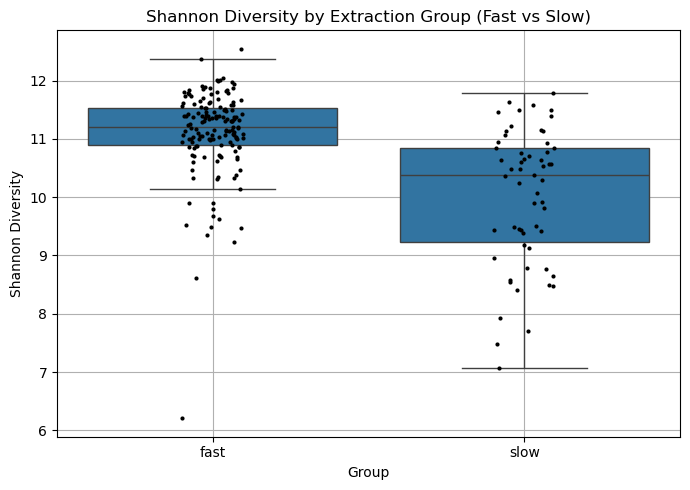

In [108]:
# Aggregate diversity scores per sample
fast_div = (
    fast_adata.obs.groupby("sample_id")
    .agg({
        "extraction_time": "first",
        "shannon_junction_aa": "mean",  # could also be 'first', since it's identical per sample
        "group": "first"
    })
    .reset_index()
)

slow_div = (
    slow_adata.obs.groupby("sample_id")
    .agg({
        "extraction_time": "first",
        "shannon_junction_aa": "mean",
        "group": "first"
    })
    .reset_index()
)

# Combine
diversity_df = pd.concat([fast_div, slow_div], ignore_index=True)
diversity_df = diversity_df.rename(columns={"shannon_junction_aa": "shannon_diversity"})

plt.figure(figsize=(7, 5))
sns.boxplot(x="group", y="shannon_diversity", data=diversity_df, showfliers=False)
sns.stripplot(x="group", y="shannon_diversity", data=diversity_df, color="black", size=3, jitter=True)
plt.title("Shannon Diversity by Extraction Group (Fast vs Slow)")
plt.ylabel("Shannon Diversity")
plt.xlabel("Group")
plt.grid(True)
plt.tight_layout()
plt.show()


Shannon diversity measures:

How broad the immune response is

Whether the TCR repertoire is dominated by a few clonotypes (low diversity)

Or is diverse and evenly expressed (high diversity)

In [109]:
from scipy.stats import mannwhitneyu

fast_vals = diversity_df[diversity_df["group"] == "fast"]["shannon_diversity"]
slow_vals = diversity_df[diversity_df["group"] == "slow"]["shannon_diversity"]

stat, p = mannwhitneyu(fast_vals, slow_vals, alternative="two-sided")
print(f"Mann-Whitney U test p-value: {p}")


Mann-Whitney U test p-value: 6.495141152701467e-12


Spearman correlation: rho = -0.349, p = 0.0000


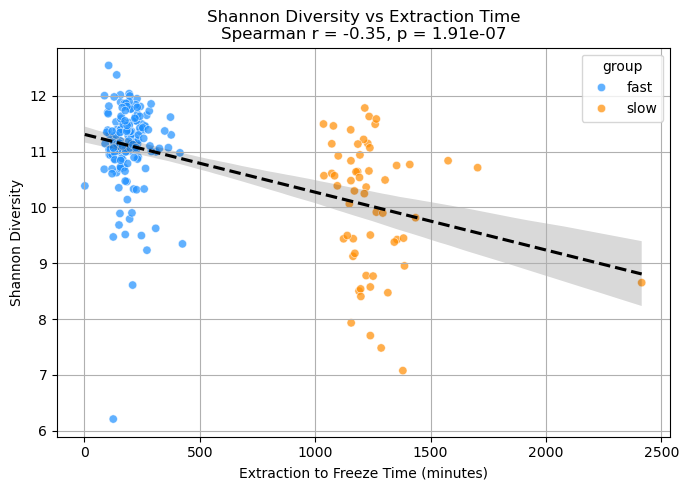

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# Compute Spearman correlation
rho, pval = spearmanr(diversity_df["extraction_time"], diversity_df["shannon_diversity"])
print(f"Spearman correlation: rho = {rho:.3f}, p = {pval:.4f}")

# Plot
plt.figure(figsize=(7, 5))
sns.scatterplot(
    data=diversity_df,
    x="extraction_time",
    y="shannon_diversity",
    hue="group",
    palette={"fast": "dodgerblue", "slow": "darkorange"},
    alpha=0.7
)
sns.regplot(
    data=diversity_df,
    x="extraction_time",
    y="shannon_diversity",
    scatter=False,
    color="black",
    line_kws={"linestyle": "dashed"}
)
plt.title(f"Shannon Diversity vs Extraction Time\nSpearman r = {rho:.2f}, p = {pval:.3g}")
plt.xlabel("Extraction to Freeze Time (minutes)")
plt.ylabel("Shannon Diversity")
plt.grid(True)
plt.tight_layout()
plt.show()


fast group has higher shanon entropy, that suggets more clonotype diversity, and more balanced read fraction

### Dominance analysis

How dominant is the top clone per sample?
Lets measure whether slower freezing leads to skewed repertoires dominated by one or few clones.


In [111]:
# 1. Top clonotype read count per sample
dominance_df = (
    clonotype_df.groupby(["Sample_ID", "aaSeqCDR3"])["readCount"]
    .sum()
    .reset_index()
    .sort_values(["Sample_ID", "readCount"], ascending=[True, False])
    .groupby("Sample_ID")
    .first()
    .reset_index()
    .rename(columns={"readCount": "top_clone_reads"})
)

# 2. Total reads per sample
total_reads_df = (
    clonotype_df.groupby("Sample_ID")["readCount"]
    .sum()
    .reset_index()
    .rename(columns={"readCount": "total_reads"})
)

# 3. Merge and compute normalized dominance
dominance_df = dominance_df.merge(total_reads_df, on="Sample_ID", how="left")
dominance_df["dominance_fraction"] = dominance_df["top_clone_reads"] / dominance_df["total_reads"]

# 4. Add group info
dominance_df = dominance_df.merge(meta_df, on="Sample_ID", how="left")
dominance_df["group"] = dominance_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")


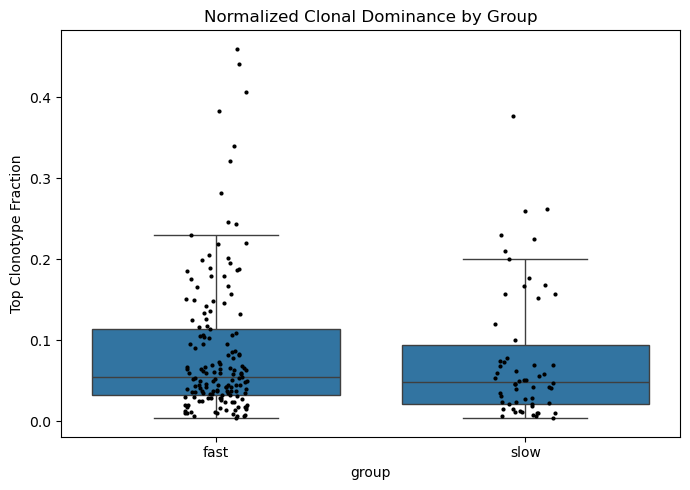

In [112]:
plt.figure(figsize=(7, 5))
sns.boxplot(data=dominance_df, x="group", y="dominance_fraction", showfliers=False)
sns.stripplot(data=dominance_df, x="group", y="dominance_fraction", color="black", size=3, jitter=True)
plt.ylabel("Top Clonotype Fraction")
plt.title("Normalized Clonal Dominance by Group")
plt.tight_layout()
plt.show()

y-axis: 
It is the fraction of total reads that came from the single most abundant (top) clonotype in each sample.

shows less variance in fast group samples compared to slow samples.

/tmp/ipykernel_2018427/2653046378.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g["readCount"].head(top_n).sum() / g["readCount"].sum())


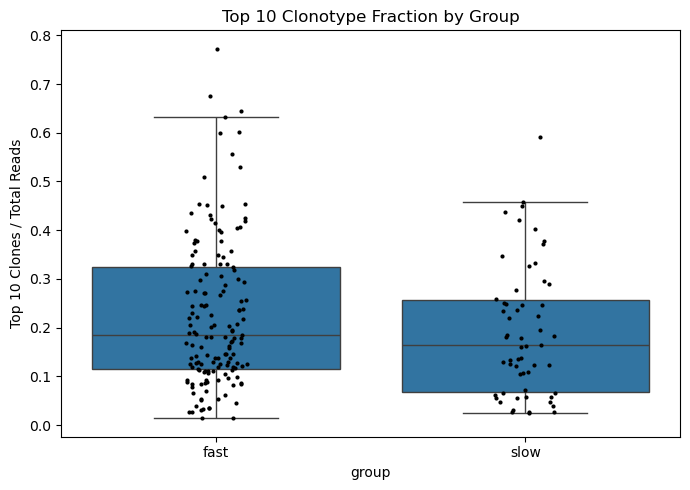

In [113]:
# Compute top-10 clone fraction per sample
top_n = 10
top10_df = (
    clonotype_df
    .sort_values(["Sample_ID", "readCount"], ascending=[True, False])
    .groupby("Sample_ID")
    .apply(lambda g: g["readCount"].head(top_n).sum() / g["readCount"].sum())
    .reset_index()
    .rename(columns={0: f"top{top_n}_fraction"})
)

# Merge with metadata
top10_df = top10_df.merge(meta_df, on="Sample_ID", how="left")
top10_df["group"] = top10_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=top10_df, x="group", y=f"top{top_n}_fraction", showfliers=False)
sns.stripplot(data=top10_df, x="group", y=f"top{top_n}_fraction", color="black", size=3, jitter=True)
plt.title(f"Top {top_n} Clonotype Fraction by Group")
plt.ylabel(f"Top {top_n} Clones / Total Reads")
plt.tight_layout()
plt.show()

plot is normelized.

### Gini index

The Gini index measures inequality (Clonal inequality). In repertoire analysis:

0 = perfectly equal (all clonotypes have the same size)

1 = perfect inequality (all reads go to one clone) - More skewed repertoire

It captures clonal skew across the full distribution, not just top clones.



In [114]:
def gini(array):
    """Compute Gini index (inequality) of an array."""
    array = np.sort(array)
    n = len(array)
    cumulative = np.cumsum(array)
    return (n + 1 - 2 * np.sum(cumulative) / cumulative[-1]) / n

# Apply to each sample
gini_df = (
    clonotype_df.groupby("Sample_ID")["readCount"]
    .apply(gini)
    .reset_index()
    .rename(columns={"readCount": "gini_index"})
)

# Add metadata
gini_df = gini_df.merge(meta_df, on="Sample_ID", how="left")
gini_df["group"] = gini_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")


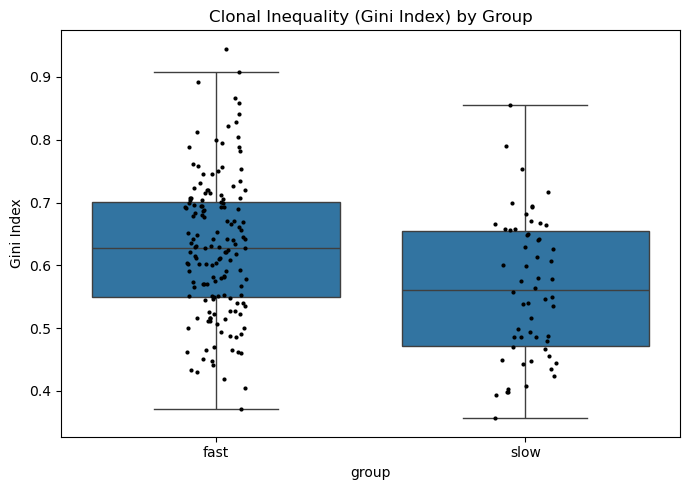

In [115]:
# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=gini_df, x="group", y="gini_index", showfliers=False)
sns.stripplot(data=gini_df, x="group", y="gini_index", color="black", size=3, jitter=True)
plt.title("Clonal Inequality (Gini Index) by Group")
plt.ylabel("Gini Index")
plt.tight_layout()
plt.show()

### Clonal Evenness

This measures how evenly the reads are distributed across clones (Diversity normalized by richness).
High value means More uniform clone distribution.

It corrects Shannon entropy to account for how many clones there are — helps distinguish between:

Broad but skewed repertoires

Broad and even repertoires

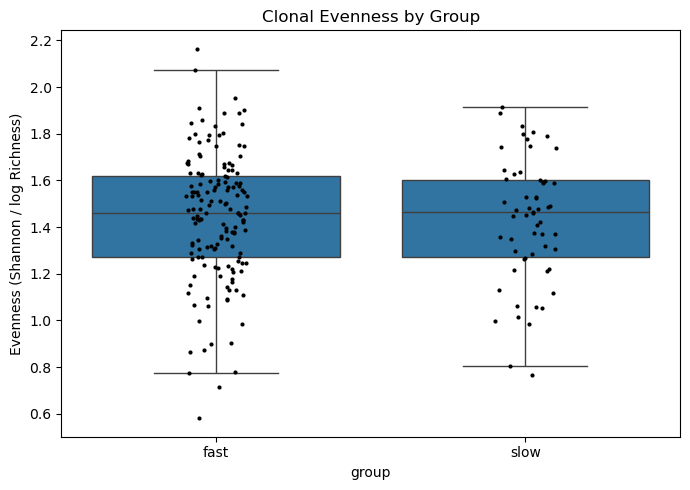

In [116]:
from scipy.stats import entropy

def compute_evenness(reads):
    total = reads.sum()
    proportions = reads / total
    shannon = entropy(proportions)
    richness = reads.nunique()
    return shannon / np.log(richness) if richness > 1 else 0

evenness_df = (
    clonotype_df.groupby("Sample_ID")["readCount"]
    .apply(compute_evenness)
    .reset_index()
    .rename(columns={"readCount": "evenness"})
)

# Merge with metadata
evenness_df = evenness_df.merge(meta_df, on="Sample_ID", how="left")
evenness_df["group"] = evenness_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=evenness_df, x="group", y="evenness", showfliers=False)
sns.stripplot(data=evenness_df, x="group", y="evenness", color="black", size=3, jitter=True)
plt.title("Clonal Evenness by Group")
plt.ylabel("Evenness (Shannon / log Richness)")
plt.tight_layout()
plt.show()


In [117]:
print("Gini NaNs:\n", gini_df[["extraction_time", "gini_index"]].isna().sum())
print("Evenness NaNs:\n", evenness_df[["extraction_time", "evenness"]].isna().sum())
print("Top10 NaNs:\n", top10_df[["extraction_time", "top10_fraction"]].isna().sum())


Gini NaNs:
 extraction_time    0
gini_index         0
dtype: int64
Evenness NaNs:
 extraction_time    0
evenness           0
dtype: int64
Top10 NaNs:
 extraction_time    0
top10_fraction     0
dtype: int64


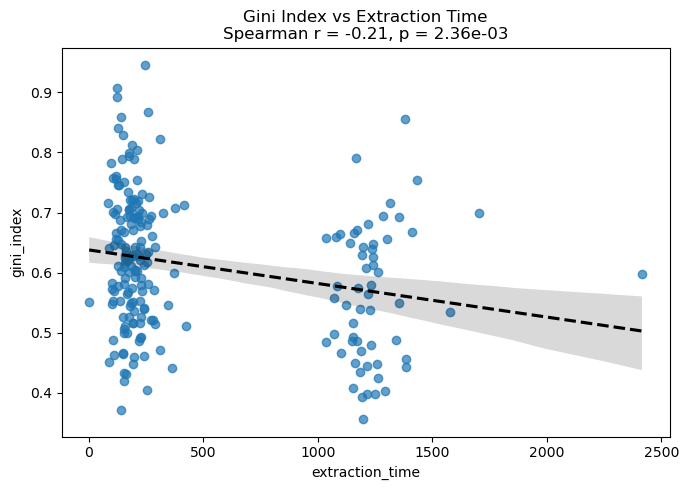

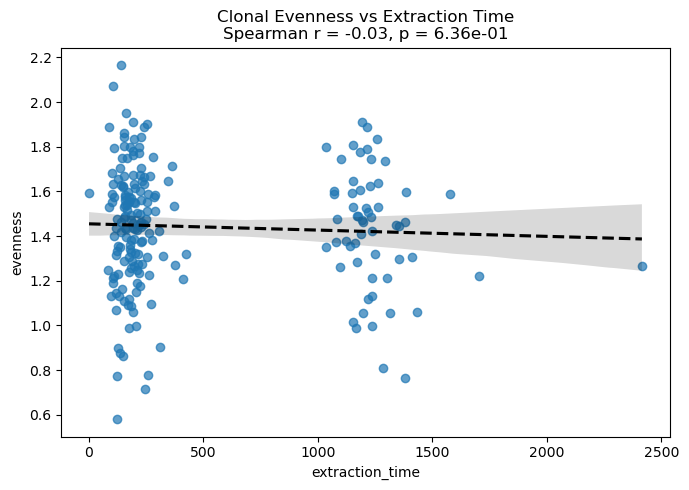

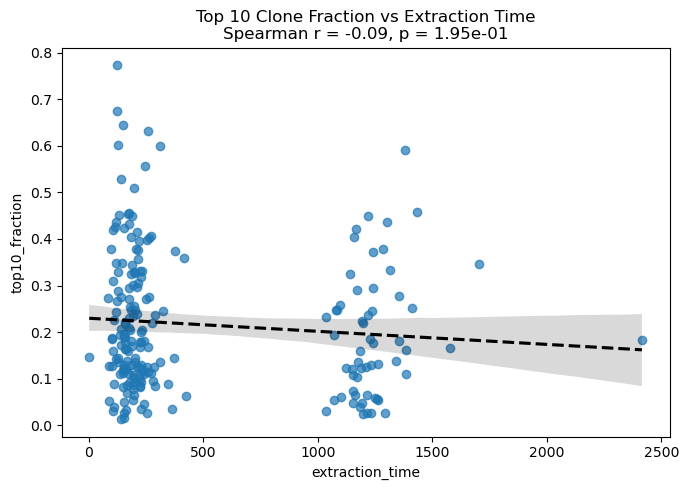

In [118]:
from scipy.stats import spearmanr
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation(df, x, y, title):
    df_clean = df[[x, y]].dropna()
    if df_clean[y].nunique() <= 1:
        print(f"Cannot compute correlation for {title}: target is constant.")
        return

    r, p = spearmanr(df_clean[x], df_clean[y])
    plt.figure(figsize=(7, 5))
    sns.regplot(data=df_clean, x=x, y=y, scatter_kws={'alpha': 0.7}, line_kws={'color': 'black', 'linestyle': 'dashed'})
    plt.title(f"{title}\nSpearman r = {r:.2f}, p = {p:.2e}")
    plt.tight_layout()
    plt.show()

# Correlate Gini index
plot_correlation(gini_df, x="extraction_time", y="gini_index", title="Gini Index vs Extraction Time")

# Correlate Evenness
plot_correlation(evenness_df, x="extraction_time", y="evenness", title="Clonal Evenness vs Extraction Time")

# Correlate Top 10 Clone Fraction
plot_correlation(top10_df, x="extraction_time", y="top10_fraction", title="Top 10 Clone Fraction vs Extraction Time")


### Simpson diversity

Emphasizes common clones — penalizes dominance.
The Simpson diversity index measures the probability that two randomly chosen reads belong to different clonotypes.

Closer to 1 → High diversity, many clones with similar frequencies.

Closer to 0 → Low diversity, few dominant clones.

It emphasizes dominant clones more heavily than Shannon entropy.

In [119]:
# Add Simpson diversity to existing adata objects
ir.tl.alpha_diversity(fast_adata, groupby="sample_id", target_col="junction_aa", metric="simpson")
ir.tl.alpha_diversity(slow_adata, groupby="sample_id", target_col="junction_aa", metric="simpson")


In [120]:
# Extract and merge
fast_simpson = (
    fast_adata.obs.groupby("sample_id")
    .agg({"simpson_junction_aa": "mean", "extraction_time": "first"})
    .reset_index()
)
fast_simpson["group"] = "fast"

slow_simpson = (
    slow_adata.obs.groupby("sample_id")
    .agg({"simpson_junction_aa": "mean", "extraction_time": "first"})
    .reset_index()
)
slow_simpson["group"] = "slow"

simpson_df = pd.concat([fast_simpson, slow_simpson], ignore_index=True)
simpson_df = simpson_df.rename(columns={"simpson_junction_aa": "simpson_diversity"})


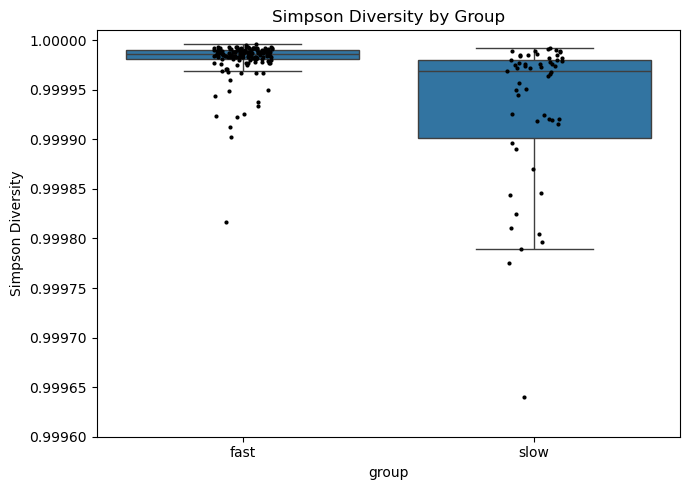

In [121]:
# Plot
plt.figure(figsize=(7, 5))
sns.boxplot(data=simpson_df, x="group", y="simpson_diversity", showfliers=False)
sns.stripplot(data=simpson_df, x="group", y="simpson_diversity", color="black", size=3, jitter=True)
plt.ylim(0.9996, 1.00001)
plt.ylabel("Simpson Diversity")
plt.title("Simpson Diversity by Group")
plt.tight_layout()
plt.show()


## Subsampling samples to compare clonotypes depth

Plot number of unique clonotypes discovered as a function of the number of reads sampled (subsampling).
Shows whether diversity is saturated or still increasing — i.e., if the sample was deeply sequenced enough.

Why it’s useful:

Helps control for differences in sequencing depth.

Can reveal repertoire complexity differences that are masked at fixed depths.

In [96]:
min_reads = clonotype_df.groupby("Sample_ID")["readCount"].sum().min()
print(f"Lowest total read count among samples: {min_reads}")

Lowest total read count among samples: 209378.0


In [97]:
max_depth = clonotype_df.groupby("Sample_ID")["readCount"].sum().min()
depths = np.arange(10000, int(max_depth // 10000) * 10000 + 1, 20000)
rarefaction_curves = []

# For each sample
for sample_id, group_df in clonotype_df.groupby("Sample_ID"):
    total_reads = group_df["readCount"].sum()
    if total_reads < depths[0]:
        print(f"skipping samples: {sample_id} due to low-depth.")
        continue  # Skip low-depth samples

    # Expand readCount into actual sequence list
    sequences = []
    for _, row in group_df.iterrows():
        sequences.extend([row["aaSeqCDR3"]] * int(row["readCount"]))
    sequences = np.array(sequences)

    for depth in depths:
        if len(sequences) < depth:
            continue
        subsampled = np.random.choice(sequences, size=depth, replace=False)
        unique_clonotypes = len(set(subsampled))
        extraction_time = meta_df.loc[meta_df["Sample_ID"] == sample_id, "extraction_time"].values[0]
        group = "fast" if extraction_time <= time_threshold else "slow"
        
        rarefaction_curves.append({
            "Sample_ID": sample_id,
            "depth": depth,
            "unique_clonotypes": unique_clonotypes,
            "group": group
        })

# Convert to DataFrame
rarefaction_df = pd.DataFrame(rarefaction_curves)

/tmp/ipykernel_2018427/1663985684.py:3: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.lineplot(data=rarefaction_df, x="depth", y="unique_clonotypes", hue="group", estimator="mean", ci="sd")


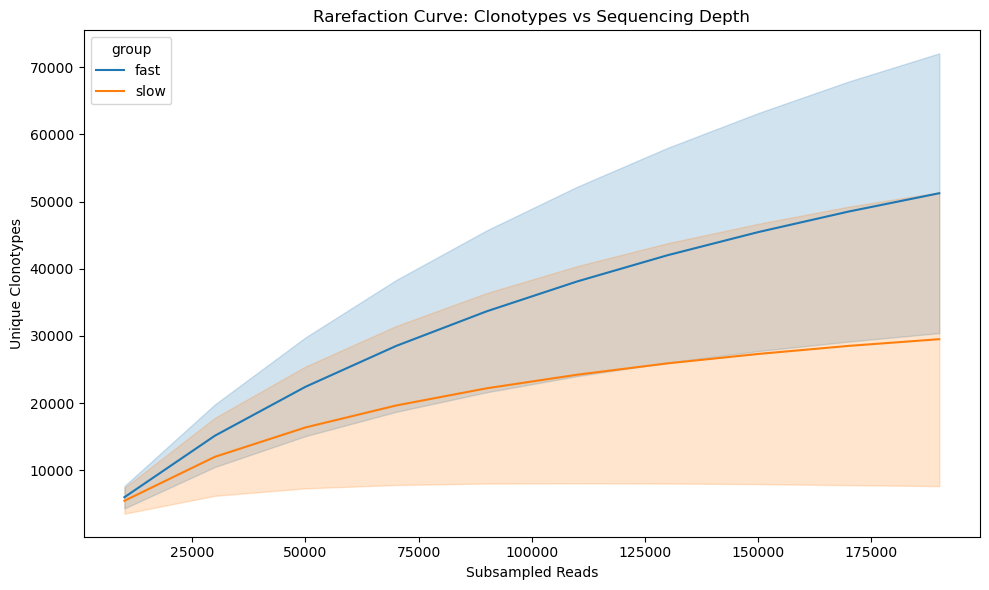

In [98]:
# Plot
plt.figure(figsize=(10, 6))
sns.lineplot(data=rarefaction_df, x="depth", y="unique_clonotypes", hue="group", estimator="mean", ci="sd")
plt.title("Rarefaction Curve: Clonotypes vs Sequencing Depth")
plt.xlabel("Subsampled Reads")
plt.ylabel("Unique Clonotypes")
plt.tight_layout()
plt.show()

We can see steeper unique clonotype growth in fast group.
since we downsamples samples to the same number of reads, we can infer that The fast group discovers more unique clonotypes per read at every depth.

This means their diversity is truly higher, not just an artifact of deeper sequencing.

If raw read count were the only factor, we wouldn’t see a consistent difference at the same subsampled depths.

2 fast groups samples had 25000 singletone values (hugh outliners) so we adjusted ylim to 2000.

Notice that readcount is not normelized.

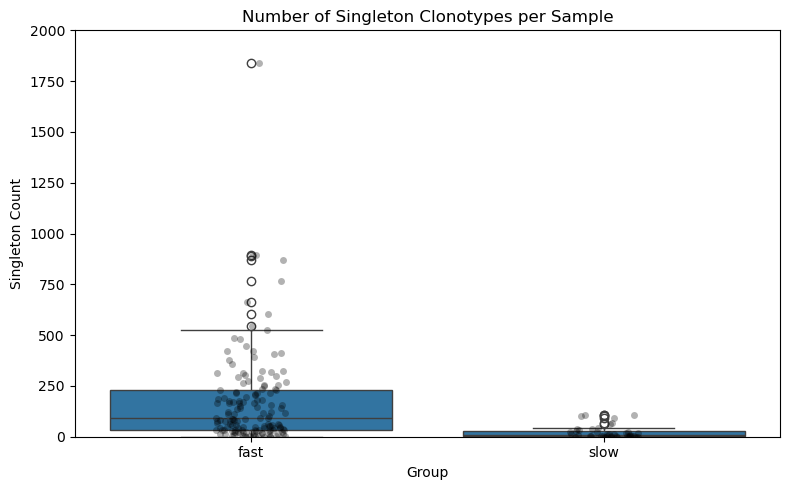

In [99]:
# Count singletons per sample
singleton_counts = (
    clonotype_df[clonotype_df["readCount"] == 1]
    .groupby("Sample_ID")["aaSeqCDR3"]
    .count()
    .reset_index()
    .rename(columns={"aaSeqCDR3": "singleton_count"})
)

# Merge with metadata
singleton_counts = singleton_counts.merge(meta_df, on="Sample_ID", how="left")
singleton_counts["group"] = singleton_counts["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# Plot
plt.figure(figsize=(8, 5))
sns.boxplot(data=singleton_counts, x="group", y="singleton_count")
sns.stripplot(data=singleton_counts, x="group", y="singleton_count", color="black", alpha=0.3)
plt.title("Number of Singleton Clonotypes per Sample")
plt.ylabel("Singleton Count")
plt.xlabel("Group")
plt.ylim(0, 2000)
plt.tight_layout()
plt.show()


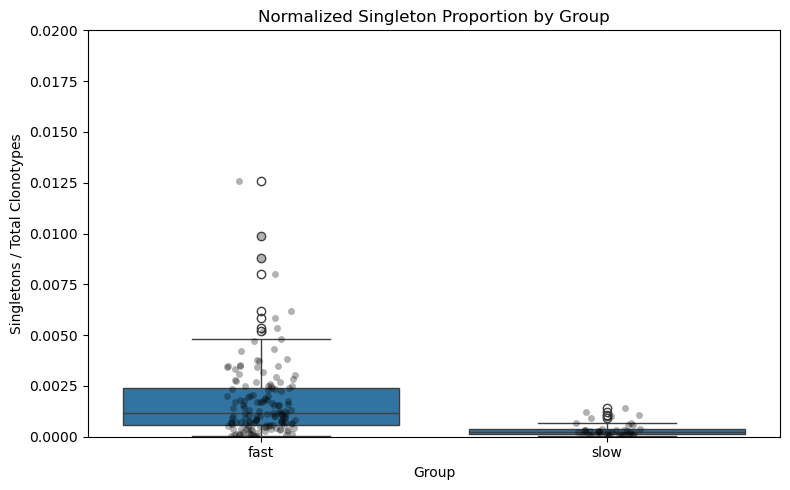

In [100]:
# 1. Count singletons
singleton_counts = (
    clonotype_df[clonotype_df["readCount"] == 1]
    .groupby("Sample_ID")["aaSeqCDR3"]
    .count()
    .reset_index()
    .rename(columns={"aaSeqCDR3": "singleton_count"})
)

# 2. Total clonotypes per sample
total_clonotypes = (
    clonotype_df.groupby("Sample_ID")["aaSeqCDR3"]
    .nunique()
    .reset_index()
    .rename(columns={"aaSeqCDR3": "total_clonotypes"})
)

# 3. Merge and normalize
singleton_df = singleton_counts.merge(total_clonotypes, on="Sample_ID", how="inner")
singleton_df["singleton_proportion"] = singleton_df["singleton_count"] / singleton_df["total_clonotypes"]

# 4. Add metadata
singleton_df = singleton_df.merge(meta_df, on="Sample_ID", how="left")
singleton_df["group"] = singleton_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# 5. Plot
plt.figure(figsize=(8, 5))
sns.boxplot(data=singleton_df, x="group", y="singleton_proportion")
sns.stripplot(data=singleton_df, x="group", y="singleton_proportion", color="black", alpha=0.3)
plt.title("Normalized Singleton Proportion by Group")
plt.ylabel("Singletons / Total Clonotypes")
plt.xlabel("Group")
plt.ylim(0, 0.02)
plt.tight_layout()
plt.show()


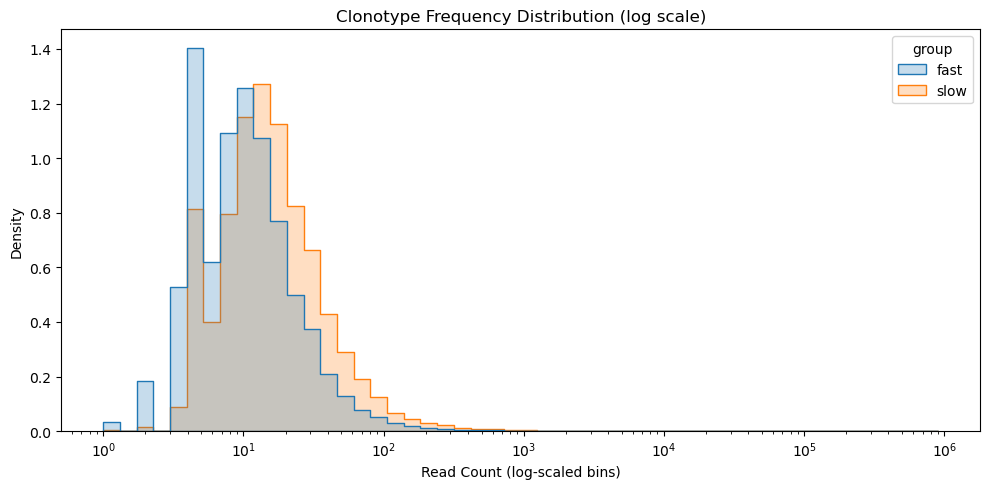

In [101]:
# Group-wide frequency histogram
plt.figure(figsize=(10, 5))
sns.histplot(data=clonotype_df, x="readCount", hue="group", log_scale=(True, False), bins=50, element="step", stat="density", common_norm=False)
plt.title("Clonotype Frequency Distribution (log scale)")
plt.xlabel("Read Count (log-scaled bins)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()


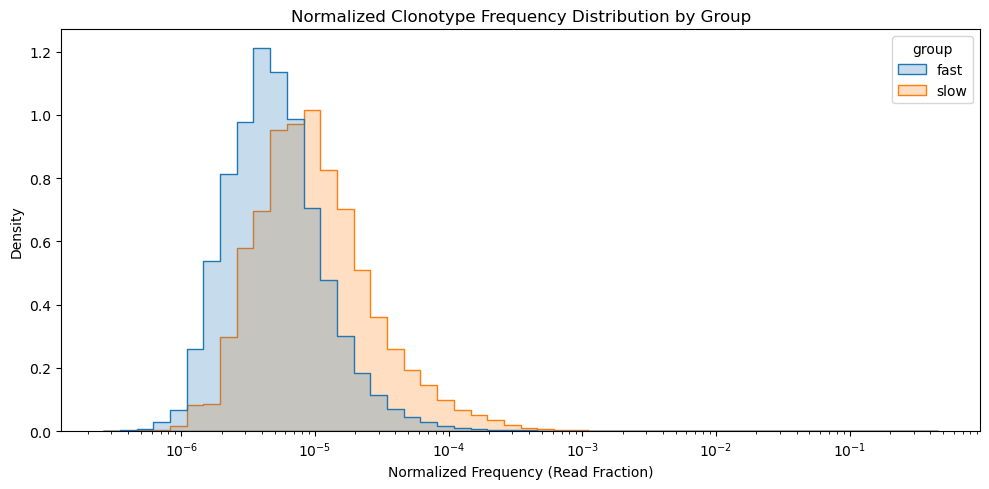

In [102]:
# 1. Normalize clonotype frequencies per sample
clonotype_df["group"] = clonotype_df["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

normalized_clones = []
for sample_id, group in clonotype_df.groupby("Sample_ID"):
    total_reads = group["readCount"].sum()
    norm_df = group.copy()
    norm_df["norm_freq"] = norm_df["readCount"] / total_reads
    normalized_clones.append(norm_df)

clones_df = pd.concat(normalized_clones, ignore_index=True)

# 2. Plot histogram (log-scaled bins for clarity)
plt.figure(figsize=(10, 5))
sns.histplot(
    data=clones_df,
    x="norm_freq",
    hue="group",
    log_scale=(True, False),
    bins=50,
    element="step",
    stat="density",
    common_norm=False
)
plt.title("Normalized Clonotype Frequency Distribution by Group")
plt.xlabel("Normalized Frequency (Read Fraction)")
plt.ylabel("Density")
plt.tight_layout()
plt.show()


###  Clonal Size Distribution Binning

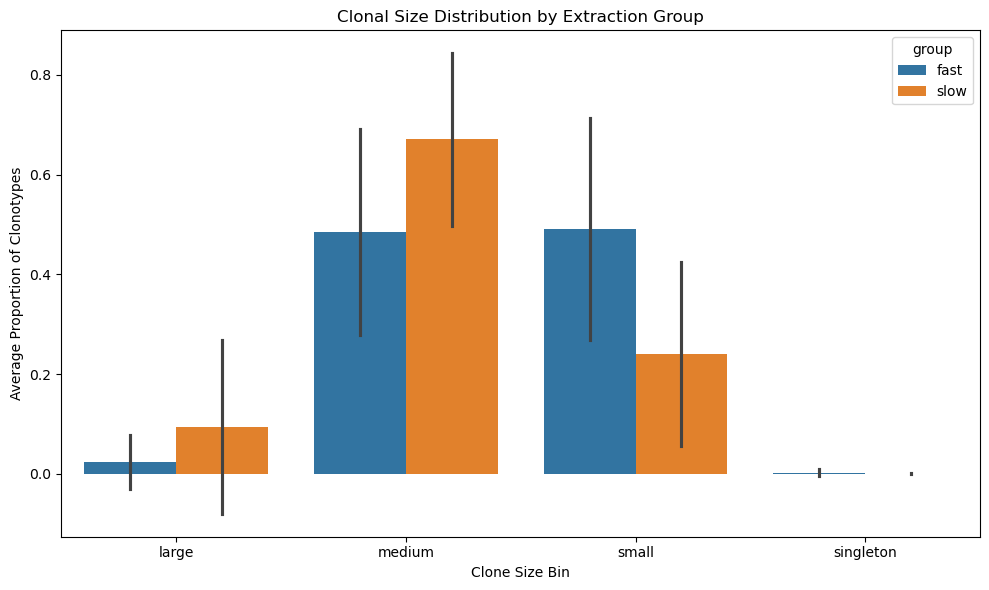

In [ ]:
# 1. Merge metadata for group assignment
clonotype_df = clonotype_df.merge(meta_df, on="Sample_ID", how="left")
clonotype_df["group"] = clonotype_df["extraction_time_x"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# 2. Define binning function
def classify_clone_size(read_count):
    if read_count == 1:
        return "singleton"
    elif 2 <= read_count <= 10:
        return "small"
    elif 11 <= read_count <= 100:
        return "medium"
    else:
        return "large"

clonotype_df["size_bin"] = clonotype_df["readCount"].apply(classify_clone_size)

# 3. Compute per-sample bin proportions
bin_counts = (
    clonotype_df.groupby(["Sample_ID", "size_bin"])["aaSeqCDR3"]
    .count()
    .reset_index()
    .rename(columns={"aaSeqCDR3": "count"})
)

# Add total counts per sample
total_counts = (
    bin_counts.groupby("Sample_ID")["count"]
    .sum()
    .reset_index()
    .rename(columns={"count": "total"})
)
bin_counts = bin_counts.merge(total_counts, on="Sample_ID")
# proportion for normalization
bin_counts["proportion"] = bin_counts["count"] / bin_counts["total"]

# Add group info
bin_counts = bin_counts.merge(meta_df, on="Sample_ID")
bin_counts["group"] = bin_counts["extraction_time"].apply(lambda x: "fast" if x <= time_threshold else "slow")

# 4. Plot average distribution by group
plt.figure(figsize=(10, 6))
sns.barplot(
    data=bin_counts,
    x="size_bin",
    y="proportion",
    hue="group",
    estimator="mean",
    errorbar="sd"
)
plt.title("Clonal Size Distribution by Extraction Group")
plt.ylabel("Average Proportion of Clonotypes")
plt.xlabel("Clone Size Bin")
plt.tight_layout()
plt.show()

# Instance Hardness corolation

analyzing whether hardness of a sample is related to its extraction time.

In [38]:
hardness_df = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon_hardness_rf_cos_every5_new_mixcr.csv")
hardness_old_df = pd.read_csv("/home/dsi/orrbavly/GNN_project/outputs/colon_hardness_rf_cos_every5_old_mixcr.csv")

In [39]:
# --- Create a clean 'Sample_ID' in hardness_df ---
hardness_df["Sample_ID"] = hardness_df["sample_name"].apply(lambda x: x.split("_")[0])

# --- Merge meta_df and hardness_df on Sample_ID ---
merged_df = meta_df.merge(
    hardness_df[["Sample_ID", "appearance_rate"]],
    on="Sample_ID",
    how="inner"  # inner join ensures only matching samples are kept
)

# --- Report missing samples ---
missing_in_meta = set(hardness_df["Sample_ID"]) - set(meta_df["Sample_ID"])
missing_in_hardness = set(meta_df["Sample_ID"]) - set(hardness_df["Sample_ID"])

print(f"Samples missing from meta_df (extraction_time): {list(missing_in_meta)}")
print(f"Samples missing from hardness_df (appearance_rate): {list(missing_in_hardness)}")



Samples missing from meta_df (extraction_time): []
Samples missing from hardness_df (appearance_rate): ['P1-S14', 'P6-S15', 'P2-S1', 'P6-S12', 'P5-S20', 'P9-S18', 'P3-S16', 'P9-S8', 'P5-S14', 'P6-S1', 'P1-S4', 'P9-S20', 'P1-S24', 'P4-S14', 'P2-S8', 'P1-S1', 'P6-S6', 'P6-S7', 'P8-S18', 'P2-S6', 'P7-S22', 'P6-S2', 'P6-S9', 'P2-S2', 'P9-S17', 'P4-S20', 'P5-S19', 'P9-S22', 'P1-S20', 'P4-S18', 'P5-S23', 'P5-S7', 'P6-S21', 'P7-S10', 'P2-S19', 'P2-S12', 'P4-S15', 'P3-S22', 'P8-S16', 'P4-S3', 'P4-S21', 'P2-S3', 'P1-S17', 'P7-S21', 'P9-S6', 'P6-S22', 'P6-S20', 'P2-S17', 'P2-S21', 'P5-S3', 'P8-S6', 'P1-S15', 'P3-S3', 'P8-S13', 'P3-S2', 'P2-S14', 'P2-S22', 'P8-S17', 'P2-S9', 'P3-S11', 'P7-S9', 'P4-S4', 'P9-S24', 'P9-S9', 'P2-S11', 'P4-S2', 'P1-S10', 'P6-S17', 'P9-S15']


Dropped P4-S1 as there is no extraction time available.
Note that only valid percentiles samples (after downsampling and choosing only annotation-valid samples) there should be 146 samples.

In [40]:
# Drop samples with missing extraction_time or appearance_rate
clean_df = merged_df.dropna(subset=["extraction_time", "appearance_rate"])

# Now compute Pearson correlation
from scipy.stats import pearsonr

correlation, p_value = pearsonr(
    clean_df["extraction_time"],
    clean_df["appearance_rate"]
)

print(f"\nPearson correlation: {correlation:.3f}")
print(f"P-value: {p_value:.3g}")



Pearson correlation: 0.158
P-value: 0.0564


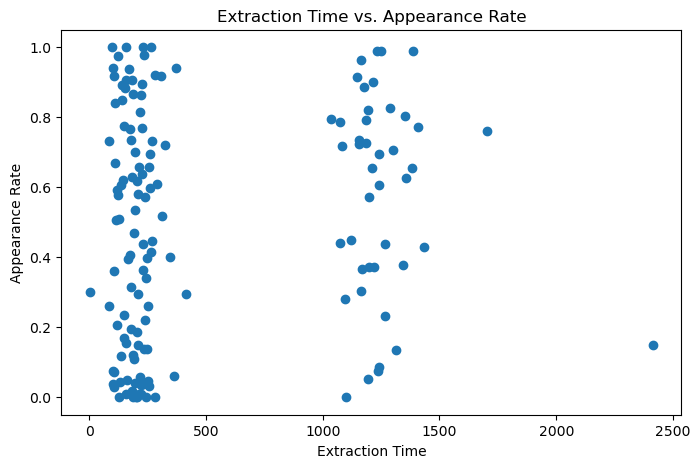

In [44]:

plt.figure(figsize=(8, 5))  # Optional: adjust figure size

plt.scatter(clean_df['extraction_time'], clean_df['appearance_rate'])  # Line plot with markers
plt.xlabel("Extraction Time")  # Label x-axis
plt.ylabel("Appearance Rate")  # Label y-axis
plt.title("Extraction Time vs. Appearance Rate")  # Add a title

plt.show()


In [41]:
print("Extraction time variance:", merged_df["extraction_time"].var())
print("Appearance rate variance:", merged_df["appearance_rate"].var())

print(merged_df.isna().sum())
print(merged_df.shape)
print(merged_df[["extraction_time", "appearance_rate"]].dropna().shape)


Extraction time variance: 253638.49957487013
Appearance rate variance: 0.10881097520408436
Sample_ID          0
extraction_time    1
appearance_rate    0
dtype: int64
(147, 3)
(146, 2)


Matched 134 samples between old and new hardness datasets.


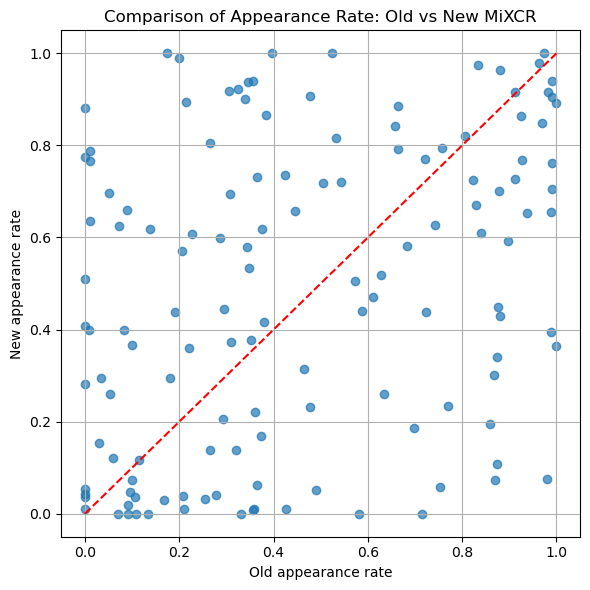

In [19]:
import re

# --- Extract Sample_ID from hardness_df (new) ---
def extract_sample_id_new(name):
    match = re.match(r'(P\d+-S\d+)', name)
    if match:
        return match.group(1)
    else:
        return None

hardness_df["Sample_ID"] = hardness_df["sample_name"].apply(extract_sample_id_new)

# --- Extract Sample_ID from hardness_old_df (old) ---
def extract_sample_id_old(name):
    match = re.match(r'pool(\d+)_S(\d+)', name)
    if match:
        pool, sample = match.groups()
        return f"P{pool}-S{sample}"
    else:
        return None

hardness_old_df["Sample_ID"] = hardness_old_df["sample_name"].apply(extract_sample_id_old)

# --- Merge old and new by Sample_ID ---
merged_hardness = hardness_df[["Sample_ID", "appearance_rate"]].rename(columns={"appearance_rate": "new_appearance_rate"}).merge(
    hardness_old_df[["Sample_ID", "appearance_rate"]].rename(columns={"appearance_rate": "old_appearance_rate"}),
    on="Sample_ID",
    how="inner"
)

print(f"Matched {len(merged_hardness)} samples between old and new hardness datasets.")

# --- Quick scatter plot ---
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.scatter(
    merged_hardness["old_appearance_rate"],
    merged_hardness["new_appearance_rate"],
    alpha=0.7
)
plt.plot([0,1], [0,1], color='red', linestyle='--')  # y=x line
plt.xlabel("Old appearance rate")
plt.ylabel("New appearance rate")
plt.title("Comparison of Appearance Rate: Old vs New MiXCR")
plt.grid(True)
plt.tight_layout()
plt.show()

In [20]:
#  Correlation
from scipy.stats import pearsonr

correlation, p_value = pearsonr(
    merged_hardness["old_appearance_rate"],
    merged_hardness["new_appearance_rate"]
)

print(f"\nPearson correlation between old and new appearance rates: {correlation:.3f}")
print(f"P-value: {p_value:.3g}")



Pearson correlation between old and new appearance rates: 0.330
P-value: 9.84e-05


Why some samples got "easier" and some got "harder"? i expected samples to follow some sort of corrolation.

Number of samples that got harder: 68
Number of samples that got easier: 66


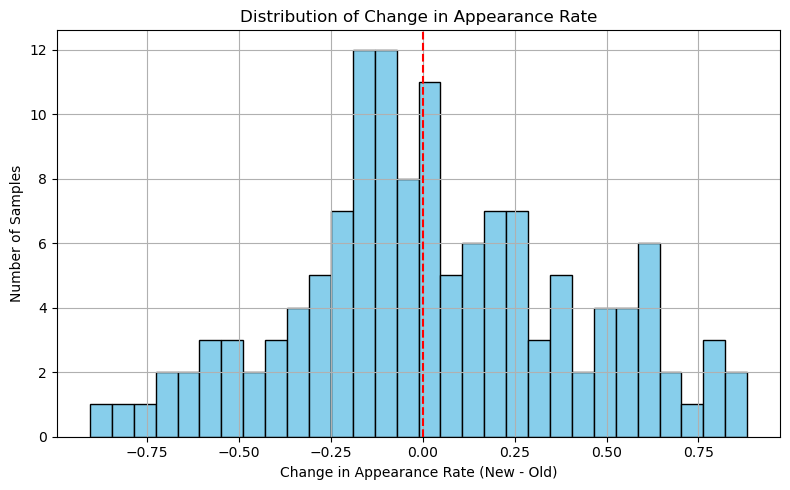

In [21]:
merged_hardness["delta"] = merged_hardness["new_appearance_rate"] - merged_hardness["old_appearance_rate"]

num_harder = (merged_hardness["delta"] > 0).sum()
num_easier = (merged_hardness["delta"] < 0).sum()

print(f"Number of samples that got harder: {num_harder}")
print(f"Number of samples that got easier: {num_easier}")

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.hist(merged_hardness["delta"], bins=30, color='skyblue', edgecolor='black')
plt.axvline(0, color='red', linestyle='--')
plt.xlabel("Change in Appearance Rate (New - Old)")
plt.ylabel("Number of Samples")
plt.title("Distribution of Change in Appearance Rate")
plt.grid(True)
plt.tight_layout()
plt.show()


lets try to generate more stats about each sample, for later use in the old/new mixcr comparrison.

In [22]:
import os
import pandas as pd
from scipy.stats import entropy

# --- Paths ---
new_dir = "/dsi/sbm/OrrBavly/colon_data/new_mixcr/TRB/downsamples_209378/original_data/"
old_dir = "/dsi/sbm/or/for_sol/downsampled/TRB/"

# --- Load NEW MiXCR downsampled data ---
new_sample_stats = []

for fname in os.listdir(new_dir):
    if fname.endswith(".csv"):
        sample_id = fname.split("_")[0]
        
        df = pd.read_csv(os.path.join(new_dir, fname))

        total_reads = df["readCount"].sum()
        num_clonotypes = df["Sequences"].nunique()
        shannon_entropy = entropy(df["readFraction"])  # <--- USE readFraction here
        top_clone_freq = df["readFraction"].max()      # <--- can also use readFraction for top clone

        new_sample_stats.append({
            "Sample_ID": sample_id,
            "total_reads_new": total_reads,
            "num_clonotypes_new": num_clonotypes,
            "entropy_new": shannon_entropy,
            "dominance_new": top_clone_freq
        })

new_stats_df = pd.DataFrame(new_sample_stats)

# --- Load OLD MiXCR downsampled data ---
old_sample_stats = []

for fname in os.listdir(old_dir):
    if fname.endswith(".txt"):
        # Example filename: pool6_S7_TRB_mig_cdr3_clones_all.txt
        parts = fname.split("_")
        pool_number = parts[0].replace("pool", "")  # e.g., pool6 -> 6
        sample_number = parts[1].replace("S", "")  # e.g., S7 -> 7
        sample_id = f"P{pool_number}-S{sample_number}"
        
        df = pd.read_csv(os.path.join(old_dir, fname), sep="\t")
        
        if "CDR3.aa" in df.columns:
            num_clonotypes = df["CDR3.aa"].nunique()
        else:
            print(f"CDR3 column wasn't found in {fname}")
            continue  # Skip bad files
        
        old_sample_stats.append({
            "Sample_ID": sample_id,
            "num_clonotypes_old": num_clonotypes
        })

old_stats_df = pd.DataFrame(old_sample_stats)


In [23]:
# Merge
sample_stats_combined = pd.merge(new_stats_df, old_stats_df, on="Sample_ID", how="inner")

# Normalize only for new MiXCR
sample_stats_combined["clonotypes_per_read_new"] = sample_stats_combined["num_clonotypes_new"] / sample_stats_combined["total_reads_new"]

# (no normalization for old samples)


In [24]:
sample_stats_combined.head()

,Sample_ID,total_reads_new,num_clonotypes_new,entropy_new,dominance_new,num_clonotypes_old,clonotypes_per_read_new
0,P6-S9,209378,57858,9.763235,0.016219,13880,0.276333
1,P7-S4,209378,12373,8.413001,0.023512,11376,0.059094
2,P6-S11,209378,50701,9.753357,0.024281,15082,0.242151
3,P3-S20,209378,66071,9.500813,0.030314,13501,0.315558
4,P9-S12,209378,74690,8.821892,0.151334,13218,0.356723


Final dataset has 134 matched samples.
Correlation between hardness change (delta) and num_clonotypes_old: -0.122 (p=0.16)
Correlation between hardness change (delta) and num_clonotypes_new: -0.076 (p=0.383)
Correlation between hardness change (delta) and clonotypes_per_read_new: -0.076 (p=0.383)
Correlation between hardness change (delta) and entropy_new: -0.103 (p=0.235)
Correlation between hardness change (delta) and dominance_new: 0.067 (p=0.44)


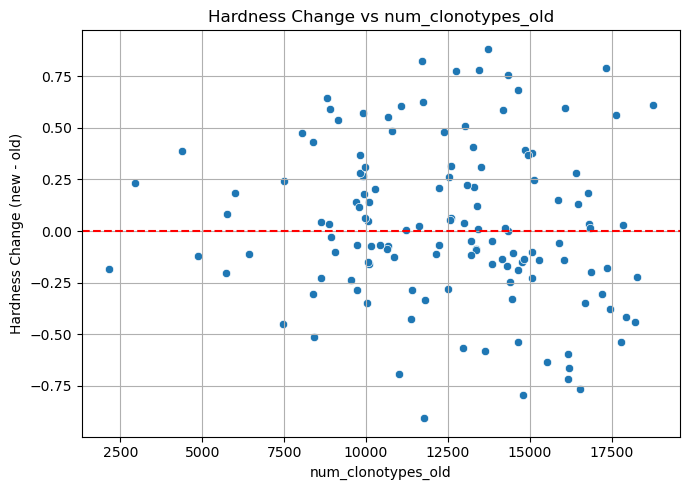

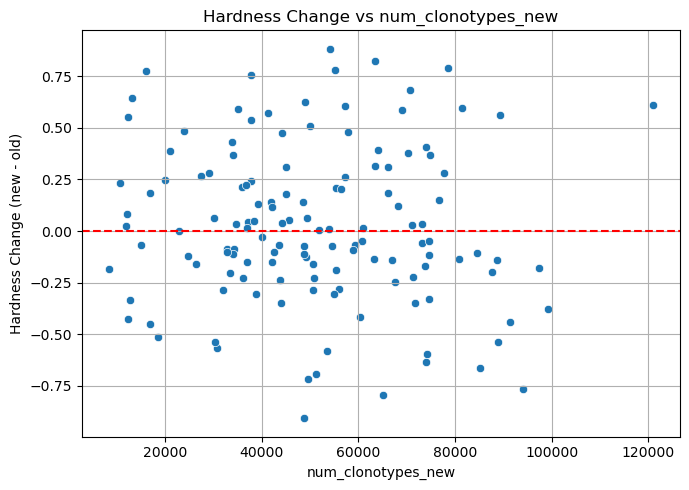

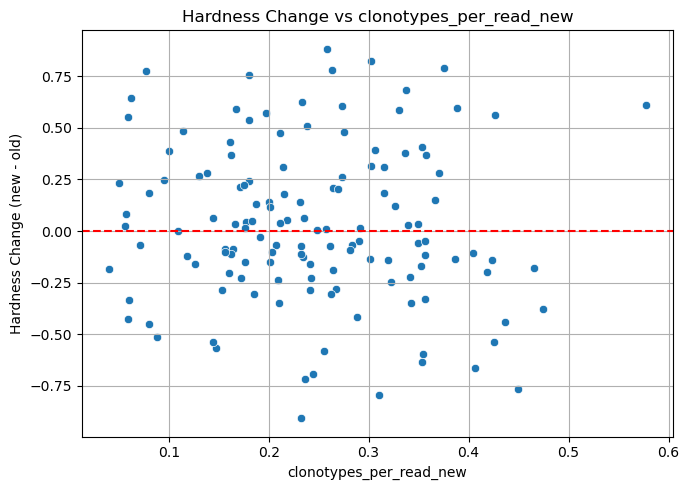

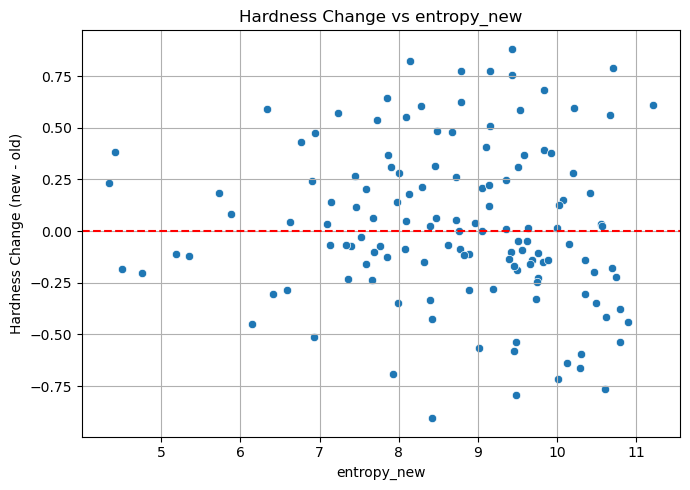

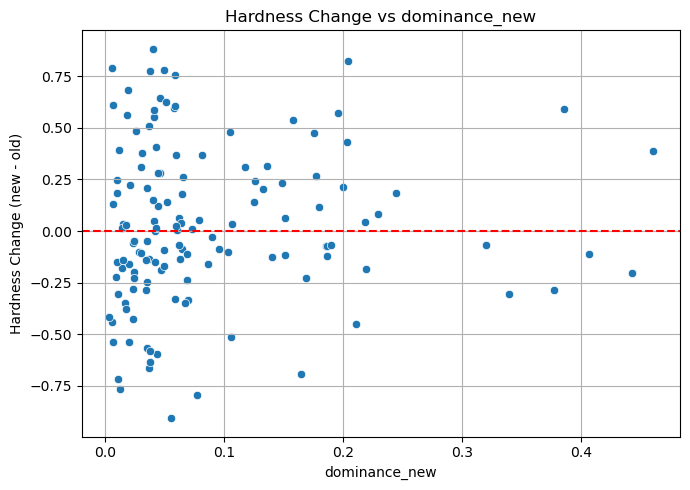

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# --- Step 1: Merge stats with hardness change ---
full_data = merged_hardness.merge(sample_stats_combined, on="Sample_ID", how="inner")

# Calculate hardness delta
full_data["delta"] = full_data["new_appearance_rate"] - full_data["old_appearance_rate"]

print(f"Final dataset has {full_data.shape[0]} matched samples.")

# --- Step 2: Features to test ---
features = ["num_clonotypes_old", "num_clonotypes_new", "clonotypes_per_read_new", "entropy_new", "dominance_new"]

# --- Step 3: Analyze correlations ---
for feature in features:
    corr, pval = pearsonr(full_data["delta"], full_data[feature])
    print(f"Correlation between hardness change (delta) and {feature}: {corr:.3f} (p={pval:.3g})")

# --- Step 4: Plotting ---
for feature in features:
    plt.figure(figsize=(7, 5))
    sns.scatterplot(x=feature, y="delta", data=full_data)
    plt.axhline(0, color="red", linestyle="--")
    plt.title(f"Hardness Change vs {feature}")
    plt.xlabel(feature)
    plt.ylabel("Hardness Change (new - old)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


R² score (proportion of hardness change explained): 0.021

Feature Coefficients:
                   Feature   Coefficient
0       num_clonotypes_old -6.742424e-05
1       num_clonotypes_new -3.857266e-07
2  clonotypes_per_read_new -1.841773e-12
3              entropy_new  1.521049e-01
4            dominance_new  4.702402e-01


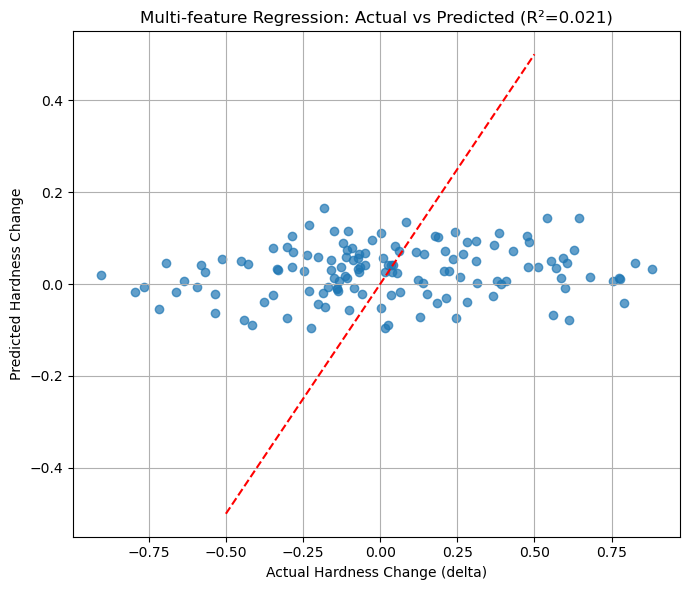

In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Features to use
X = full_data[["num_clonotypes_old", "num_clonotypes_new", "clonotypes_per_read_new", "entropy_new", "dominance_new"]]
y = full_data["delta"]

# Fit linear regression
model = LinearRegression()
model.fit(X, y)

# Predictions
y_pred = model.predict(X)

# R2 score
r2 = r2_score(y, y_pred)
print(f"R² score (proportion of hardness change explained): {r2:.3f}")

# Coefficients
coef_table = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": model.coef_
})
print("\nFeature Coefficients:")
print(coef_table)

# Scatter plot: real vs predicted
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))
plt.scatter(y, y_pred, alpha=0.7)
plt.plot([-0.5, 0.5], [-0.5, 0.5], color="red", linestyle="--")
plt.xlabel("Actual Hardness Change (delta)")
plt.ylabel("Predicted Hardness Change")
plt.title(f"Multi-feature Regression: Actual vs Predicted (R²={r2:.3f})")
plt.grid(True)
plt.tight_layout()
plt.show()


In [27]:
from itertools import combinations

# Features
feature_list = ["num_clonotypes_old", "num_clonotypes_new", "clonotypes_per_read_new", "entropy_new", "dominance_new"]

# Store results
results = []

# Try all 2-feature combinations
for combo in combinations(feature_list, 2):
    X = full_data[list(combo)]
    y = full_data["delta"]
    
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    r2 = r2_score(y, y_pred)
    
    results.append({
        "Feature 1": combo[0],
        "Feature 2": combo[1],
        "R2 Score": r2
    })

# Show sorted results
results_df = pd.DataFrame(results).sort_values("R2 Score", ascending=False)
print(results_df)


                 Feature 1                Feature 2  R2 Score
2       num_clonotypes_old              entropy_new  0.019558
3       num_clonotypes_old            dominance_new  0.015693
1       num_clonotypes_old  clonotypes_per_read_new  0.015150
0       num_clonotypes_old       num_clonotypes_new  0.015150
9              entropy_new            dominance_new  0.011640
7  clonotypes_per_read_new              entropy_new  0.010693
5       num_clonotypes_new              entropy_new  0.010693
6       num_clonotypes_new            dominance_new  0.007400
8  clonotypes_per_read_new            dominance_new  0.007400
4       num_clonotypes_new  clonotypes_per_read_new  0.005763


# Inspecting Clonotypes difference

In [28]:
import os
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
import seaborn as sns

# --- Paths ---
new_dir = "/dsi/sbm/OrrBavly/colon_data/new_mixcr/TRB/downsamples_209378/original_data/"
old_dir = "/dsi/sbm/or/for_sol/downsampled/TRB/"

# --- Load clonotypes from NEW MiXCR ---
new_clonotypes = {}

for fname in os.listdir(new_dir):
    if fname.endswith(".csv"):
        sample_id = fname.split("_")[0]  # e.g., P6-S7
        df = pd.read_csv(os.path.join(new_dir, fname))
        clonotypes = set(df["Sequences"].dropna())
        new_clonotypes[sample_id] = clonotypes

# --- Load clonotypes from OLD MiXCR ---
old_clonotypes = {}

for fname in os.listdir(old_dir):
    if fname.endswith(".txt"):
        parts = fname.split("_")
        pool_number = parts[0].replace("pool", "")
        sample_number = parts[1].replace("S", "")
        sample_id = f"P{pool_number}-S{sample_number}"
        
        df = pd.read_csv(os.path.join(old_dir, fname), sep="\t")
        
        if "CDR3.aa" in df.columns:
            clonotypes = set(df["CDR3.aa"].dropna())
            old_clonotypes[sample_id] = clonotypes

# --- Compute species change metrics per sample ---
species_change_metrics = []

# Only analyze samples that exist in both
common_samples = set(old_clonotypes.keys()).intersection(new_clonotypes.keys())

for sample_id in common_samples:
    old_set = old_clonotypes[sample_id]
    new_set = new_clonotypes[sample_id]
    
    lost = len(old_set - new_set)
    gained = len(new_set - old_set)
    intersection = len(old_set.intersection(new_set))
    union = len(old_set.union(new_set))
    
    jaccard = intersection / union if union > 0 else np.nan
    
    species_change_metrics.append({
        "Sample_ID": sample_id,
        "num_lost_clonotypes": lost,
        "num_gained_clonotypes": gained,
        "jaccard_index": jaccard
    })

species_change_df = pd.DataFrame(species_change_metrics)

# --- Merge with full_data (containing hardness delta) ---
full_data_with_species = full_data.merge(species_change_df, on="Sample_ID", how="inner")


Correlation between hardness change (delta) and num_lost_clonotypes: -0.044 (p=0.618)
Correlation between hardness change (delta) and num_gained_clonotypes: -0.063 (p=0.472)
Correlation between hardness change (delta) and jaccard_index: 0.020 (p=0.82)


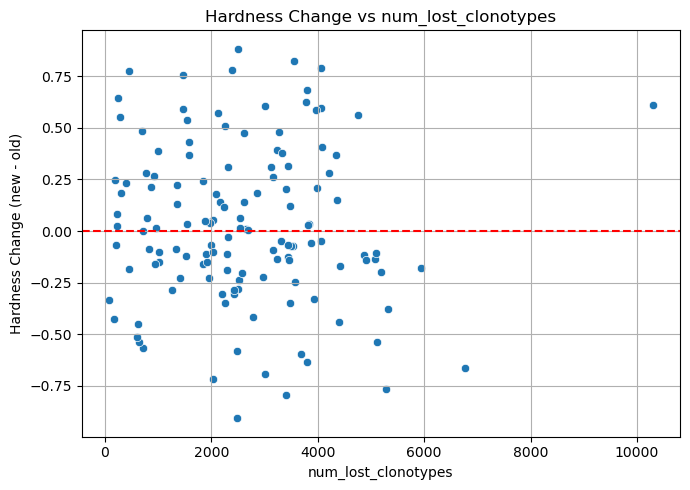

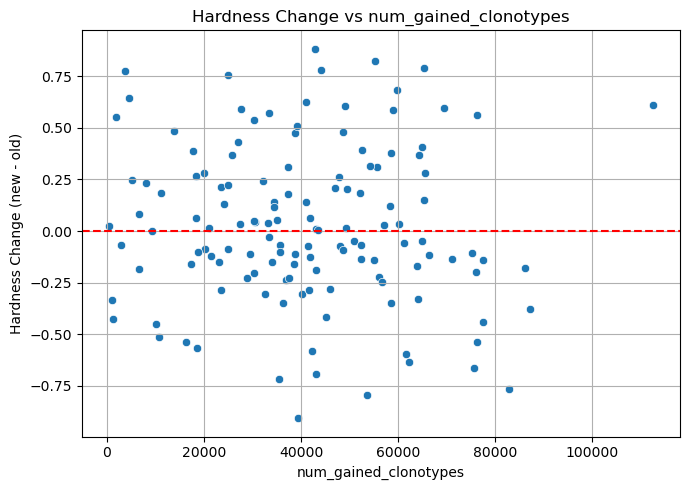

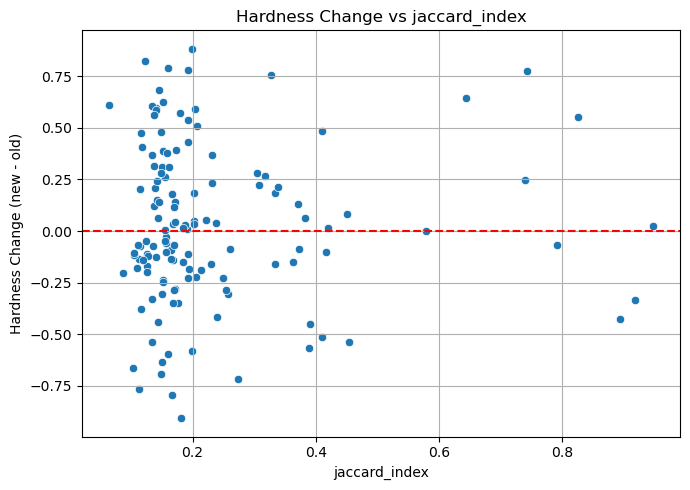

In [29]:
# --- Correlate new features with hardness delta ---
for feature in ["num_lost_clonotypes", "num_gained_clonotypes", "jaccard_index"]:
    corr, pval = pearsonr(full_data_with_species["delta"], full_data_with_species[feature])
    print(f"Correlation between hardness change (delta) and {feature}: {corr:.3f} (p={pval:.3g})")

# --- Plotting ---
for feature in ["num_lost_clonotypes", "num_gained_clonotypes", "jaccard_index"]:
    plt.figure(figsize=(7,5))
    sns.scatterplot(x=feature, y="delta", data=full_data_with_species)
    plt.axhline(0, color="red", linestyle="--")
    plt.title(f"Hardness Change vs {feature}")
    plt.xlabel(feature)
    plt.ylabel("Hardness Change (new - old)")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


# SCIRPY

In [30]:
import scirpy as ir
import pandas as pd
import anndata as ad

Now we'll load the data into scirpy format. We will also set a dummy "c_call" column, as scirpy demands, but it should not interfere with our analysis(as it affects function regarding chain comparisson, that we will not use).

In [31]:
# --- Flatten new clonotypes ---
new_entries = []
for sample_id, seqs in new_clonotypes.items():
    for seq in seqs:
        new_entries.append({
            "cell_id": sample_id,
            "chain": "TRB",  # assuming TRB
            "cdr3": seq,
            "c_call": "TRBC1"  # dummy constant region
        })
new_df = pd.DataFrame(new_entries)

# --- Flatten old clonotypes ---
old_entries = []
for sample_id, seqs in old_clonotypes.items():
    for seq in seqs:
        old_entries.append({
            "cell_id": sample_id,
            "chain": "TRB",
            "cdr3": seq,
            "c_call": "TRBC1"
        })
old_df = pd.DataFrame(old_entries)


In [32]:
new_adata = ir.io.read_airr(new_df, airr_mod="minimal", index_column="cell_id", validate=False)
old_adata = ir.io.read_airr(old_df, airr_mod="minimal", index_column="cell_id", validate=False)


KeyboardInterrupt: 